<a href="https://colab.research.google.com/github/OJB-Quantum/Spintronics-Generative-Layouts/blob/main/Three_Terminal_MTJ_Crossbar_in_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
# Install the required layout and export libraries.
!python -m pip install -q uv
!uv pip install --system -q phidl gdstk ezdxf gdspy networkx graphviz || python -m pip install -q phidl gdstk ezdxf gdspy

Exported layout: /content/SOT_MTJ_Crossbar_CheckerboardEvery2_28Rows_40Columns_1x1.oas
MTJ architecture: row-shared three-terminal SOT-MTJ crossbar with dual-ended SOT write access
Electrical terminals: T1=WRITE_A SOT-channel end, T2=WRITE_B SOT-channel end, T3=top READ electrode
Physical contacts: both ends of every SOT write channel and one primary terminal on every top READ conductor
Primary READ label side: top
Local geometry: 3 x 3 um landing pads centered on the left and right neighboring crossbar intersections
Grid: 28 rows x 40 columns
Row pitch / column pitch: 8.000 / 8.000 um
Pillar population mode: checkerboard
Intersection period / phase: 2 / 0
Geometric crosspoints per unit: 1120
Populated MTJ crosspoints per unit: 532
Unpopulated crosspoints per unit: 588
Via intersection offset: 1 column pitch
Unique square local via sites per unit: 560
Logical left/right via references per unit: 1064
Via sites shared by adjacent MTJs: 504
Local landing-pad size: 3.000 x 3.000 um
Planar 

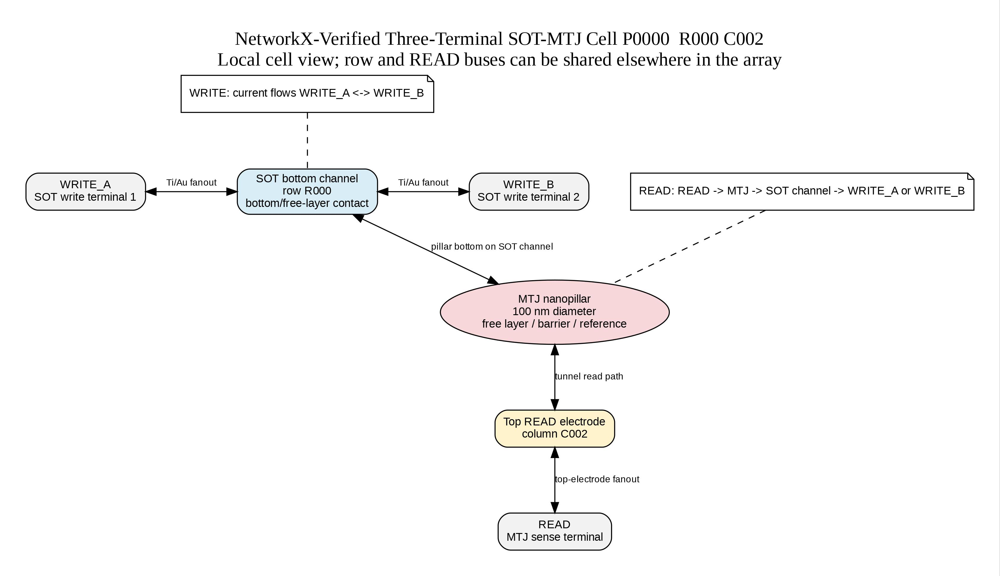

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

SOT-MTJ topology audit
NetworkX nodes / edges: 696 / 1160
Locally valid three-terminal SOT-MTJ cells: 532 / 532
Cells with alternate passive shared-bus read paths: 532 / 532
Graphviz topology JPEG: /content/SOT_MTJ_Cell_Topology.jpg
Addressing note: the local SOT-MTJ topology passes, although shared row/column buses provide alternate resistive paths. Selector devices, dedicated read routing, or a biasing scheme may be required for unambiguous array-level readout.


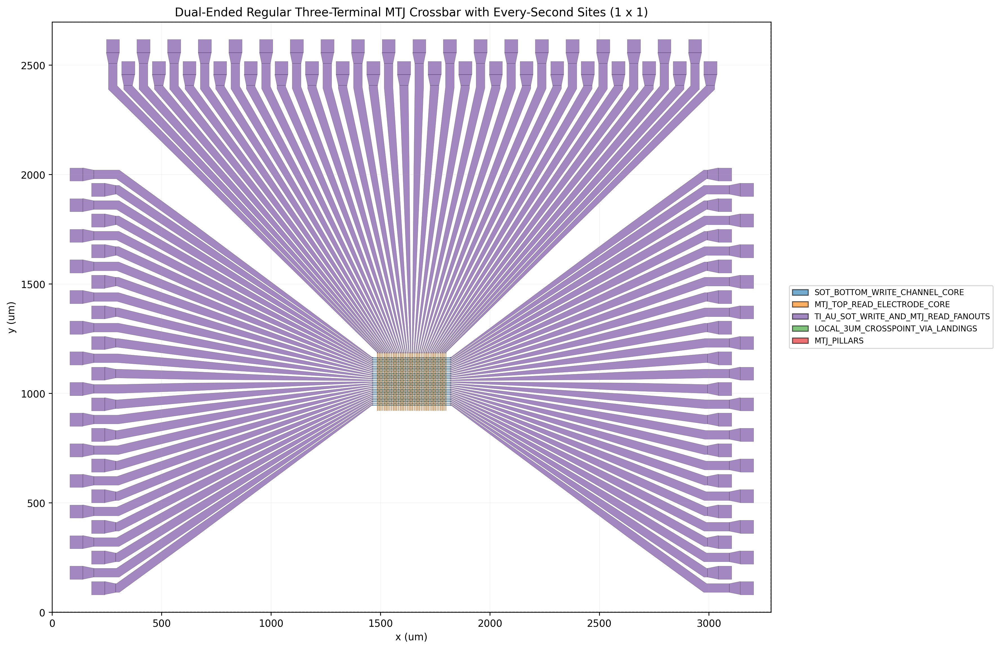

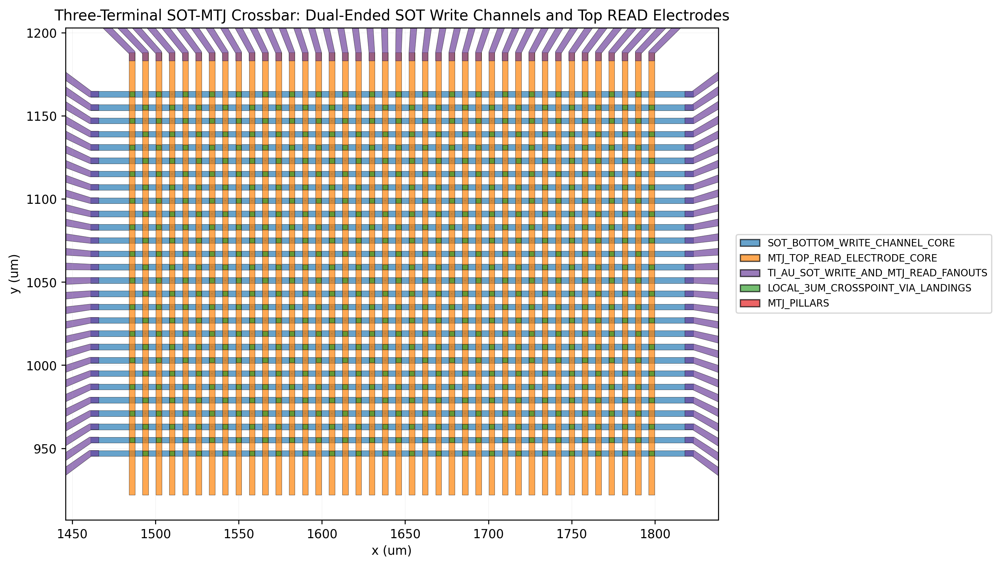

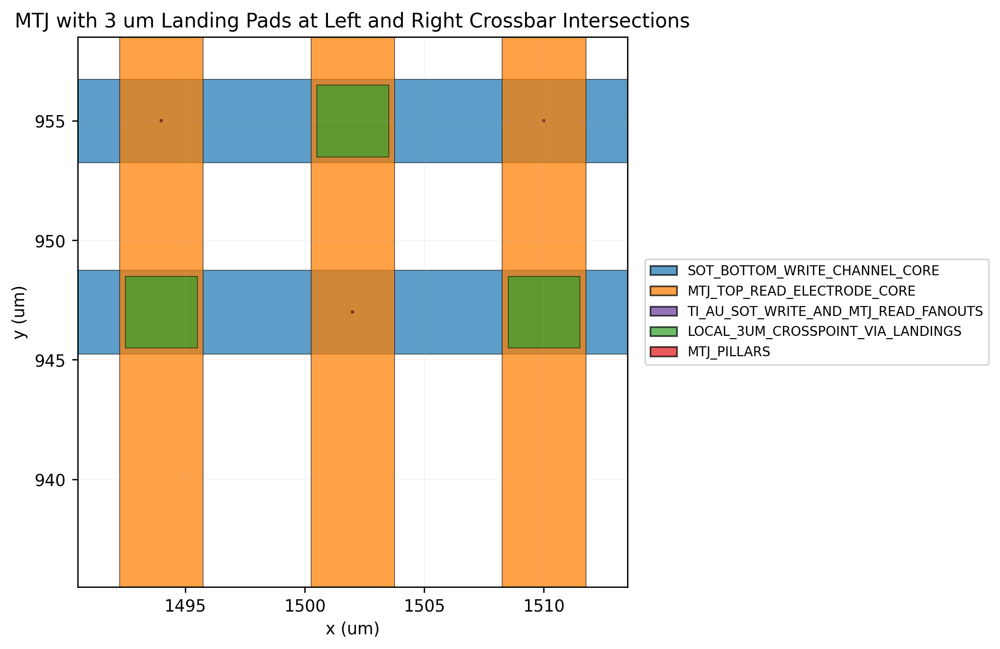

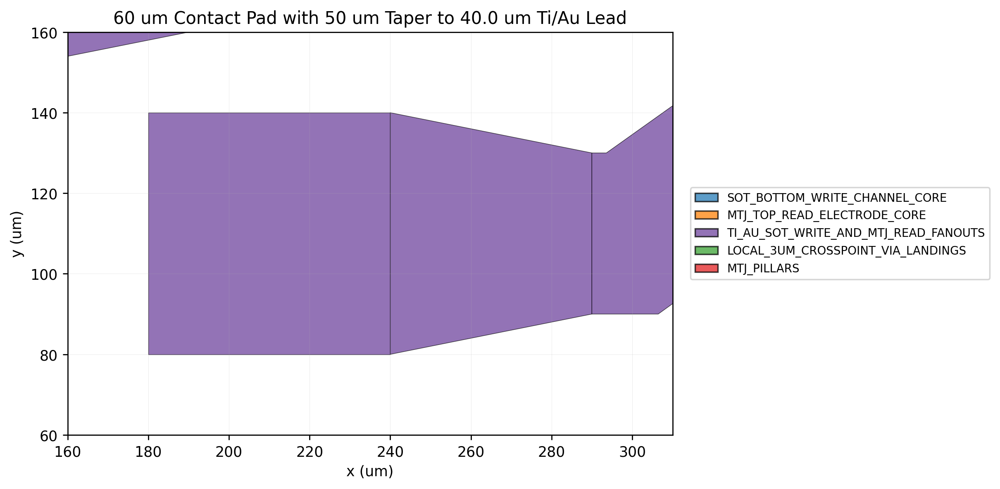

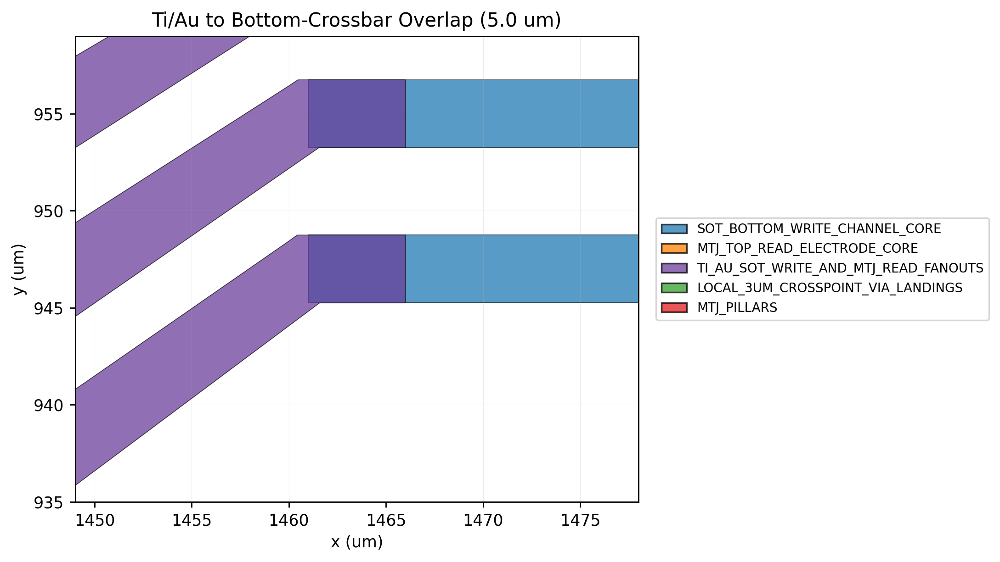

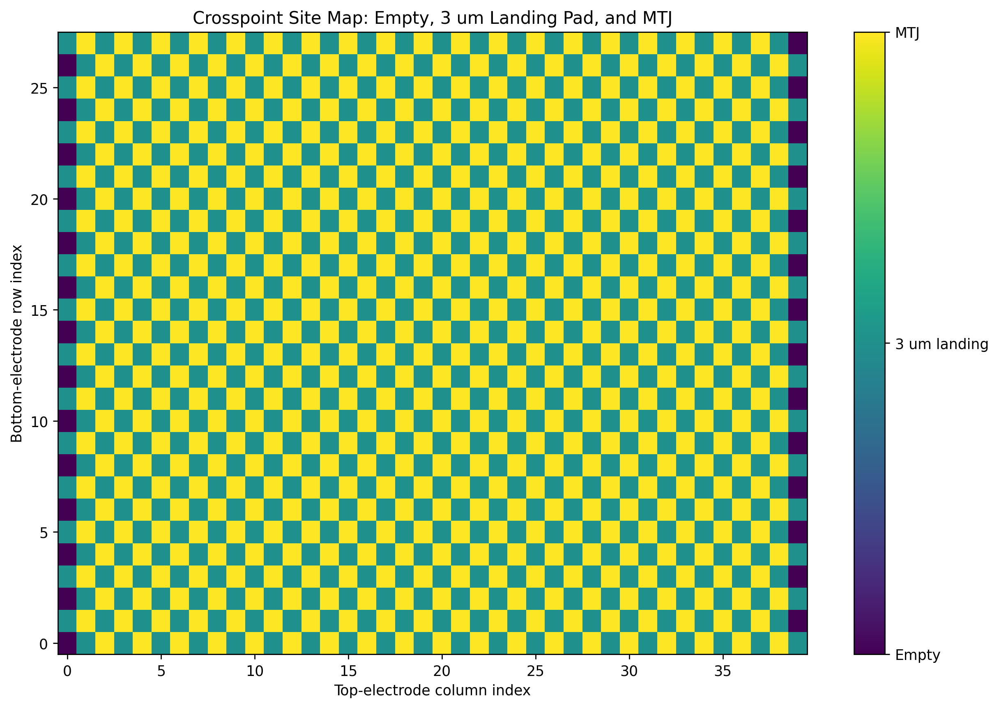

In [4]:
"""Generate and topology-audit a regular three-terminal SOT-MTJ crossbar.

The physical layout preserves the established 28 x 40, 8 um-pitch crossbar
geometry and its fabrication-oriented clearance rules. Horizontal bottom
conductors are interpreted as spin-orbit-torque (SOT) write channels. Each SOT
channel is contacted at both ends by WRITE_A and WRITE_B Ti/Au fanouts. Vertical
top conductors are READ electrodes. An MTJ nanopillar is placed at every selected
row-column intersection, so its bottom/free-layer side lands on the SOT channel
and its top side lands on the corresponding READ electrode.

The resulting three-terminal cell topology is

    WRITE_A <-> SOT bottom channel <-> WRITE_B
                         |
                     MTJ pillar
                         |
                  top READ electrode
                         |
                       READ

NetworkX builds an electrical connectivity graph directly from the generated
geometry metadata. Every populated MTJ is audited for two-ended SOT write access,
a top-electrode read connection, and exact row-column geometric registration.
The audit also checks for alternate passive read paths created by shared row and
column buses. Those paths are reported separately from local cell-topology
validity because a connectivity graph alone cannot establish magnetic switching,
read margin, junction RA, SOT efficiency, or thermal stability.

Graphviz renders the audited topology of a selected MTJ cell to JPEG bytes in
memory. The JPEG is saved beside the exported GDSII/OASIS file, displayed in a
notebook when requested, and can be downloaded automatically in Google Colab.

The existing 3 um local landing-pad mask is retained as process geometry and is
excluded from the electrical graph. No local via-cut layer is generated.
"""

from __future__ import annotations

from dataclasses import dataclass
from itertools import pairwise
from pathlib import Path
from typing import Final, Literal

import gdstk
import matplotlib as mpl
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import PolyCollection
from graphviz import Digraph
from matplotlib.patches import Patch, Rectangle
from phidl import Device

###############################################################################
# Control knobs
###############################################################################

# Output controls. Leave OUTPUT_BASENAME as None for an automatic name.
OUTPUT_BASENAME: Final[str | None] = None
OUTPUT_FORMAT: Final[Literal["gds", "oas"]] = "oas"
OUTPUT_DIRECTORY: Final[Path] = Path.cwd()

# Regular crossbar grid. The defaults preserve the 28 x 40 conductor count and
# 8 um pitch associated with the previous n = 12 layout.
NUM_ROWS: Final[int] = 28
NUM_COLUMNS: Final[int] = 40
ROW_PITCH_UM: Final[float] = 8.000
COLUMN_PITCH_UM: Final[float] = 8.000

# MTJ population. "checkerboard" implements the requested every-second-site
# layout. "row_major_stride" selects every Nth flattened grid index. Edge
# columns that cannot support a via intersection on both sides are omitted.
PILLAR_POPULATION_MODE: Final[
    Literal["checkerboard", "row_major_stride", "all_crosspoints"]
] = "checkerboard"
INTERSECTION_PERIOD: Final[int] = 2
INTERSECTION_PHASE: Final[int] = 0

# Dual-ended terminal controls. Every horizontal bottom channel already uses
# WRITE_A and WRITE_B at its left and right ends. The enabled auxiliary READ
# contact adds the missing lead and pad at the opposite end of every vertical
# top crossbar. TOP_READ_CONTACT_SIDE selects which end carries the primary
# READ label; both top-crossbar ends are physically connected.
TOP_READ_CONTACT_SIDE: Final[Literal["bottom", "top"]] = "top"
ENABLE_AUXILIARY_READ_CONTACT: Final[bool] = False
TERMINAL_MAP_PREVIEW_COUNT: Final[int] = 8

# NetworkX and Graphviz topology controls.
ENABLE_SOT_MTJ_TOPOLOGY_AUDIT: Final[bool] = True
AUDIT_SHARED_BUS_READ_BYPASSES: Final[bool] = True
FAIL_ON_SHARED_BUS_READ_BYPASSES: Final[bool] = False
TOPOLOGY_PREVIEW_PILLAR_INDEX: Final[int] = 0
TOPOLOGY_GRAPHVIZ_ENGINE: Final[Literal["dot", "neato", "fdp", "sfdp"]] = "dot"
TOPOLOGY_JPG_BASENAME: Final[str] = "SOT_MTJ_Cell_Topology"
TOPOLOGY_JPG_DPI: Final[int] = 250
DISPLAY_TOPOLOGY_JPG_IN_NOTEBOOK: Final[bool] = True
DOWNLOAD_TOPOLOGY_JPG_IN_COLAB: Final[bool] = True

# Core crossbar geometry.
ELECTRODE_WIDTH_UM: Final[float] = 3.500
MINIMUM_TRACE_EDGE_GAP_UM: Final[float] = 0.500
CROSSBAR_TO_FANOUT_ELBOW_UM: Final[float] = 25.000
PATH_TOLERANCE_UM: Final[float] = 1.0e-3

# MTJ geometry.
PILLAR_DIAMETER_NM: Final[float] = 100.0
PILLAR_CIRCLE_POINTS: Final[int] = 256
ENABLE_PILLAR_DATABASE_GRID_SNAP: Final[bool] = True

# Local crosspoint landing geometry. Each MTJ uses the neighboring crossbar
# intersection one column to its left and one column to its right. The square
# landing is centered on the full top-bottom electrode intersection.
LOCAL_VIA_INTERSECTION_OFFSET: Final[int] = 1
LOCAL_VIA_LANDING_SIZE_UM: Final[float] = 3.000
MINIMUM_LOCAL_VIA_EDGE_GAP_UM: Final[float] = 0.250
REQUIRE_UNPOPULATED_VIA_SITES: Final[bool] = True

# Contact-pad geometry.
PAD_WIDTH_UM: Final[float] = 60.0
PAD_HEIGHT_UM: Final[float] = 60.0
PAD_EDGE_GAP_UM: Final[float] = 10.0
PAD_STAGGER_DEPTH_UM: Final[float] = 100.0

# Align the farthest outer edges of the bottom-write and enabled top-read pad
# banks to a common radius measured from the active crossbar center.
ALIGN_OUTERMOST_PAD_EDGES: Final[bool] = True
PAD_PERIMETER_EXTRA_RADIUS_UM: Final[float] = 0.0
PAD_EDGE_ALIGNMENT_TOLERANCE_UM: Final[float] = 1.0e-6

# Pad taper geometry.
PAD_TAPER_LENGTH_UM: Final[float] = 50.0
PAD_TAPER_NECK_LENGTH_UM: Final[float] = 10.0
MINIMUM_PAD_CLEARANCE_UM: Final[float] = 10.0

# Split-metal Ti/Au lead architecture.
CROSSBAR_LEAD_OVERLAP_UM: Final[float] = 5.0
LOW_RESISTANCE_LEAD_MAX_WIDTH_UM: Final[float] = 40.0
LOW_RESISTANCE_LEAD_EDGE_GAP_UM: Final[float] = 2.0
LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION: Final[float] = 0.90
LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM: Final[float] = 0.50
LOW_RESISTANCE_LEAD_STAGE_FRACTIONS: Final[tuple[float, ...]] = (
    0.00,
    0.05,
    0.12,
    0.25,
    0.45,
    0.70,
    1.00,
)
AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE: Final[bool] = True
LEAD_WIDTH_REDUCTION_FACTOR: Final[float] = 0.90
MAX_LEAD_WIDTH_REDUCTION_ITERATIONS: Final[int] = 12
LEAD_BOOLEAN_PRECISION_UM: Final[float] = 1.0e-3
LEAD_CLEARANCE_AREA_TOLERANCE_UM2: Final[float] = 1.0e-5

# Optional resistance estimate.
ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE: Final[float | None] = None

# Fanout controls.
AUTO_FANOUT_LENGTH: Final[bool] = True
MAX_FANOUT_ANGLE_DEG: Final[float] = 45.0
MIN_FANOUT_LENGTH_UM: Final[float] = 250.0
FIXED_FANOUT_LENGTH_UM: Final[float] = 500.0

# Unit-cell and XY-array controls.
ARRAY_SIZE_X: Final[int] = 1
ARRAY_SIZE_Y: Final[int] = 1
CELL_MARGIN_UM: Final[float] = 40.0
ARRAY_CELL_EDGE_GAP_X_UM: Final[float] = 100.0
ARRAY_CELL_EDGE_GAP_Y_UM: Final[float] = 100.0

# GDSII and OASIS database controls.
GDS_UNIT_M: Final[float] = 1.0e-6
GDS_PRECISION_M: Final[float] = 1.0e-10
GDS_INTEGER_COORDINATE_LIMIT: Final[int] = 2_000_000_000
OAS_CIRCLE_TOLERANCE_UM: Final[float] = 2.0e-4

# Notebook display controls.
DISPLAY_FULL_ARRAY: Final[bool] = True
DISPLAY_ACTIVE_CROSSBAR_ZOOM: Final[bool] = True
DISPLAY_FIRST_CROSSPOINT_DETAIL: Final[bool] = True
DISPLAY_FIRST_PAD_TAPER_DETAIL: Final[bool] = True
DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL: Final[bool] = True
DISPLAY_OCCUPANCY_MATRIX: Final[bool] = True
DOWNLOAD_AFTER_EXPORT_IN_COLAB: Final[bool] = False

PREVIEW_DPI: Final[int] = 250
PREVIEW_FIGSIZE_IN: Final[tuple[float, float]] = (13.0, 10.0)
PREVIEW_PADDING_UM: Final[float] = 80.0
PREVIEW_EDGE_LINEWIDTH: Final[float] = 0.16
PREVIEW_ALPHA: Final[float] = 0.62
CROSSBAR_ZOOM_PADDING_UM: Final[float] = 40.0
CROSSPOINT_DETAIL_HALF_WINDOW_UM: Final[float] = 11.5
PAD_TAPER_DETAIL_PADDING_UM: Final[float] = 20.0
OVERLAP_DETAIL_PADDING_UM: Final[float] = 12.0
SHOW_CELL_BOUNDARIES_IN_PREVIEW: Final[bool] = True
SHOW_PAD_LABELS_IN_PREVIEW: Final[bool] = False
PAD_LABEL_FONT_SIZE_PT: Final[float] = 4.5

DATABASE_GRID_UM: Final[float] = GDS_PRECISION_M / GDS_UNIT_M
DATABASE_GRID_NM: Final[float] = DATABASE_GRID_UM * 1.0e3

mpl.rcParams["figure.dpi"] = PREVIEW_DPI
mpl.rcParams["font.sans-serif"] = ["Tahoma", "DejaVu Sans"]
mpl.rcParams["font.weight"] = "normal"

Coordinate = tuple[float, float]
Polygon = list[Coordinate]
ElectrodeKind = Literal["bottom", "top"]
PadSide = Literal["left", "right", "bottom", "top"]
TerminalRole = Literal["write_a", "write_b", "read", "read_auxiliary"]


@dataclass(frozen=True)
class LayerSpec:
    """Describe one exported and previewed layout layer."""

    name: str
    layer: int
    datatype: int
    color: str


@dataclass(frozen=True)
class BoundingBox:
    """Store an axis-aligned bounding box in micrometers."""

    xmin: float
    ymin: float
    xmax: float
    ymax: float

    @property
    def width(self) -> float:
        """Return the bounding-box width."""
        return self.xmax - self.xmin

    @property
    def height(self) -> float:
        """Return the bounding-box height."""
        return self.ymax - self.ymin

    def translated(self, shift: Coordinate) -> "BoundingBox":
        """Return a translated copy of the bounding box."""
        return BoundingBox(
            xmin=self.xmin + shift[0],
            ymin=self.ymin + shift[1],
            xmax=self.xmax + shift[0],
            ymax=self.ymax + shift[1],
        )


@dataclass(frozen=True)
class PadTerminal:
    """Describe one rectangular Ti/Au perimeter terminal pad."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    center: Coordinate
    width_um: float
    height_um: float
    lead_width_um: float

    @property
    def bounds(self) -> BoundingBox:
        """Return the pad rectangle bounds."""
        half_width = 0.5 * self.width_um
        half_height = 0.5 * self.height_um
        return BoundingBox(
            xmin=self.center[0] - half_width,
            ymin=self.center[1] - half_height,
            xmax=self.center[0] + half_width,
            ymax=self.center[1] + half_height,
        )


@dataclass(frozen=True)
class RoutedTrace:
    """Describe one fixed-width main crossbar conductor."""

    name: str
    electrode: ElectrodeKind
    conductor_index: int
    axis_coordinate_um: float
    centerline_points: tuple[Coordinate, ...]


@dataclass(frozen=True)
class VariableWidthLead:
    """Describe one variable-width Ti/Au pad-to-crossbar lead."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    centerline_points: tuple[Coordinate, ...]
    widths_um: tuple[float, ...]

    def __post_init__(self) -> None:
        """Validate point and width cardinality."""
        if len(self.centerline_points) < 2:
            raise ValueError("A Ti/Au lead requires at least two points.")
        if len(self.centerline_points) != len(self.widths_um):
            raise ValueError(
                "A Ti/Au lead requires one width value per centerline point."
            )
        if any(width <= 0.0 for width in self.widths_um):
            raise ValueError("Every Ti/Au lead width must be positive.")

    @property
    def terminal_width_um(self) -> float:
        """Return the width meeting the pad taper tip."""
        return self.widths_um[-1]


@dataclass(frozen=True)
class LeadClearanceResult:
    """Store the result of a Ti/Au same-layer clearance check."""

    is_valid: bool
    message: str


@dataclass(frozen=True)
class TopologyAuditResult:
    """Store NetworkX audit results for the generated SOT-MTJ network."""

    total_cells: int
    locally_valid_cells: int
    shared_bus_read_bypass_cells: int
    graph_nodes: int
    graph_edges: int

    @property
    def all_local_cells_valid(self) -> bool:
        """Return whether every populated site passes the local topology audit."""
        return self.total_cells == self.locally_valid_cells


@dataclass(frozen=True)
class LocalViaPad:
    """Describe one unique square via landing centered on a crosspoint."""

    name: str
    row_index: int
    column_index: int
    center: Coordinate
    associated_pillar_indices: tuple[int, ...]
    landing_size_um: float

    @property
    def landing_bounds(self) -> BoundingBox:
        """Return square landing-pad bounds."""
        half_size = 0.5 * self.landing_size_um
        return BoundingBox(
            xmin=self.center[0] - half_size,
            ymin=self.center[1] - half_size,
            xmax=self.center[0] + half_size,
            ymax=self.center[1] + half_size,
        )

    def translated(self, shift: Coordinate) -> "LocalViaPad":
        """Return a translated local via pad."""
        return LocalViaPad(
            name=self.name,
            row_index=self.row_index,
            column_index=self.column_index,
            center=(self.center[0] + shift[0], self.center[1] + shift[1]),
            associated_pillar_indices=self.associated_pillar_indices,
            landing_size_um=self.landing_size_um,
        )


@dataclass(frozen=True)
class ThreeTerminalAssignment:
    """Map one MTJ to shared terminals and its local via landing names."""

    pillar_index: int
    row_index: int
    column_index: int
    center: Coordinate
    write_a_pad_name: str
    write_b_pad_name: str
    read_pad_name: str
    local_via_pad_names: tuple[str, ...]


@dataclass(frozen=True)
class CrossbarGeometry:
    """Store generated unit-cell geometry and topology metadata."""

    populated_crosspoint_indices: tuple[tuple[int, int], ...]
    row_coordinates_um: tuple[float, ...]
    column_coordinates_um: tuple[float, ...]
    pillar_centers: tuple[Coordinate, ...]
    local_via_pads: tuple[LocalViaPad, ...]
    terminal_assignments: tuple[ThreeTerminalAssignment, ...]
    bottom_routes: tuple[RoutedTrace, ...]
    top_routes: tuple[RoutedTrace, ...]
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    crossbar_bounds: BoundingBox
    routing_transition_bounds: BoundingBox
    bounds: BoundingBox
    row_fanout_length_um: float
    column_fanout_length_um: float
    maximum_row_fanout_angle_deg: float
    maximum_column_fanout_angle_deg: float
    bottom_pad_outer_edge_radius_um: float
    top_pad_outer_edge_radius_um: float
    bottom_pad_alignment_extension_um: float
    top_pad_alignment_extension_um: float
    bottom_lead_width_profile_um: tuple[float, ...]
    top_lead_width_profile_um: tuple[float, ...]
    lead_width_scale: float


LAYERS: Final[dict[str, LayerSpec]] = {
    "BOTTOM_ELECTRODE": LayerSpec(
        name="SOT_BOTTOM_WRITE_CHANNEL_CORE",
        layer=2,
        datatype=0,
        color="#1f78b4",
    ),
    "MTJ_PILLARS": LayerSpec(
        name="MTJ_PILLARS",
        layer=3,
        datatype=0,
        color="#e31a1c",
    ),
    "TOP_ELECTRODE": LayerSpec(
        name="MTJ_TOP_READ_ELECTRODE_CORE",
        layer=4,
        datatype=0,
        color="#ff7f00",
    ),
    "TI_AU_LEADS": LayerSpec(
        name="TI_AU_SOT_WRITE_AND_MTJ_READ_FANOUTS",
        layer=5,
        datatype=0,
        color="#6a3d9a",
    ),
    "LOCAL_VIA_LANDINGS": LayerSpec(
        name="LOCAL_3UM_CROSSPOINT_VIA_LANDINGS",
        layer=6,
        datatype=0,
        color="#33a02c",
    ),
}


def validate_control_knobs() -> None:
    """Validate all user-adjustable geometry and database controls."""
    if NUM_ROWS < 1 or NUM_COLUMNS < 1:
        raise ValueError("NUM_ROWS and NUM_COLUMNS must be at least 1.")
    if ROW_PITCH_UM <= 0.0 or COLUMN_PITCH_UM <= 0.0:
        raise ValueError("ROW_PITCH_UM and COLUMN_PITCH_UM must be positive.")
    if PILLAR_POPULATION_MODE not in {
        "checkerboard",
        "row_major_stride",
        "all_crosspoints",
    }:
        raise ValueError("Unsupported PILLAR_POPULATION_MODE.")
    if INTERSECTION_PERIOD < 1:
        raise ValueError("INTERSECTION_PERIOD must be at least 1.")
    if not 0 <= INTERSECTION_PHASE < INTERSECTION_PERIOD:
        raise ValueError(
            "INTERSECTION_PHASE must lie in [0, INTERSECTION_PERIOD)."
        )
    if TOP_READ_CONTACT_SIDE not in {"bottom", "top"}:
        raise ValueError("TOP_READ_CONTACT_SIDE must be 'bottom' or 'top'.")
    if TERMINAL_MAP_PREVIEW_COUNT < 0:
        raise ValueError("TERMINAL_MAP_PREVIEW_COUNT must be nonnegative.")
    if TOPOLOGY_PREVIEW_PILLAR_INDEX < 0:
        raise ValueError("TOPOLOGY_PREVIEW_PILLAR_INDEX must be nonnegative.")
    if TOPOLOGY_JPG_DPI < 72:
        raise ValueError("TOPOLOGY_JPG_DPI must be at least 72.")
    if TOPOLOGY_GRAPHVIZ_ENGINE not in {"dot", "neato", "fdp", "sfdp"}:
        raise ValueError("Unsupported TOPOLOGY_GRAPHVIZ_ENGINE.")
    if CROSSBAR_TO_FANOUT_ELBOW_UM <= 0.0:
        raise ValueError("CROSSBAR_TO_FANOUT_ELBOW_UM must be positive.")
    if ELECTRODE_WIDTH_UM <= 0.0:
        raise ValueError("ELECTRODE_WIDTH_UM must be positive.")
    required_pitch_um = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if ROW_PITCH_UM + 1.0e-12 < required_pitch_um:
        raise ValueError(
            "ROW_PITCH_UM must exceed the electrode width plus the trace gap."
        )
    if COLUMN_PITCH_UM + 1.0e-12 < required_pitch_um:
        raise ValueError(
            "COLUMN_PITCH_UM must exceed the electrode width plus the trace gap."
        )
    if PATH_TOLERANCE_UM <= 0.0:
        raise ValueError("PATH_TOLERANCE_UM must be positive.")
    if PILLAR_DIAMETER_NM <= 0.0:
        raise ValueError("PILLAR_DIAMETER_NM must be positive.")
    if PILLAR_CIRCLE_POINTS < 32:
        raise ValueError("PILLAR_CIRCLE_POINTS must be at least 32.")
    if PILLAR_DIAMETER_NM * 1.0e-3 > ELECTRODE_WIDTH_UM:
        raise ValueError("The MTJ pillar must fit inside the electrode width.")

    if LOCAL_VIA_INTERSECTION_OFFSET < 1:
        raise ValueError("LOCAL_VIA_INTERSECTION_OFFSET must be at least 1.")
    minimum_column_count = 2 * LOCAL_VIA_INTERSECTION_OFFSET + 1
    if NUM_COLUMNS < minimum_column_count:
        raise ValueError(
            "NUM_COLUMNS must provide a left and right via intersection for "
            "each generated MTJ."
        )
    if LOCAL_VIA_LANDING_SIZE_UM <= 0.0:
        raise ValueError("LOCAL_VIA_LANDING_SIZE_UM must be positive.")
    if LOCAL_VIA_LANDING_SIZE_UM > ELECTRODE_WIDTH_UM:
        raise ValueError(
            "The local via landing must fit within the planar top-bottom "
            "electrode intersection."
        )
    if MINIMUM_LOCAL_VIA_EDGE_GAP_UM < 0.0:
        raise ValueError("MINIMUM_LOCAL_VIA_EDGE_GAP_UM must be nonnegative.")
    if (
        REQUIRE_UNPOPULATED_VIA_SITES
        and PILLAR_POPULATION_MODE == "all_crosspoints"
    ):
        raise ValueError(
            "all_crosspoints is incompatible with unpopulated adjacent via "
            "sites. Use checkerboard or row_major_stride."
        )

    if PAD_WIDTH_UM <= 0.0 or PAD_HEIGHT_UM <= 0.0:
        raise ValueError("PAD_WIDTH_UM and PAD_HEIGHT_UM must be positive.")
    if PAD_EDGE_GAP_UM < 0.0:
        raise ValueError("PAD_EDGE_GAP_UM must be nonnegative.")
    if PAD_STAGGER_DEPTH_UM < 0.0:
        raise ValueError("PAD_STAGGER_DEPTH_UM must be nonnegative.")
    if PAD_PERIMETER_EXTRA_RADIUS_UM < 0.0:
        raise ValueError("PAD_PERIMETER_EXTRA_RADIUS_UM must be nonnegative.")
    if PAD_EDGE_ALIGNMENT_TOLERANCE_UM <= 0.0:
        raise ValueError("PAD_EDGE_ALIGNMENT_TOLERANCE_UM must be positive.")
    if PAD_TAPER_LENGTH_UM <= 0.0:
        raise ValueError("PAD_TAPER_LENGTH_UM must be positive.")
    if PAD_TAPER_NECK_LENGTH_UM < 0.0:
        raise ValueError("PAD_TAPER_NECK_LENGTH_UM must be nonnegative.")
    if MINIMUM_PAD_CLEARANCE_UM < 0.0:
        raise ValueError("MINIMUM_PAD_CLEARANCE_UM must be nonnegative.")

    minimum_corner_offset_um = (
        ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    ) / np.sqrt(2.0)
    if CROSSBAR_TO_FANOUT_ELBOW_UM < minimum_corner_offset_um:
        raise ValueError(
            "CROSSBAR_TO_FANOUT_ELBOW_UM is too short for finite-width "
            f"corner clearance. Use at least {minimum_corner_offset_um:.3f} um."
        )
    if CROSSBAR_LEAD_OVERLAP_UM <= 0.0:
        raise ValueError("CROSSBAR_LEAD_OVERLAP_UM must be positive.")
    if CROSSBAR_LEAD_OVERLAP_UM >= CROSSBAR_TO_FANOUT_ELBOW_UM:
        raise ValueError(
            "CROSSBAR_LEAD_OVERLAP_UM must remain smaller than the elbow offset."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM < ELECTRODE_WIDTH_UM:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_MAX_WIDTH_UM must reach the crossbar width."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM > min(PAD_WIDTH_UM, PAD_HEIGHT_UM):
        raise ValueError("The maximum Ti/Au lead width must fit in each pad.")
    if LOW_RESISTANCE_LEAD_EDGE_GAP_UM < 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_EDGE_GAP_UM must be nonnegative.")
    if not 0.0 < LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION <= 1.0:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION must lie in (0, 1]."
        )
    if LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM <= 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM must be positive.")
    fractions = LOW_RESISTANCE_LEAD_STAGE_FRACTIONS
    if len(fractions) < 2:
        raise ValueError("At least two lead-profile fractions are required.")
    if not np.isclose(fractions[0], 0.0) or not np.isclose(fractions[-1], 1.0):
        raise ValueError("Lead-profile fractions must begin at 0 and end at 1.")
    if any(later <= earlier for earlier, later in pairwise(fractions)):
        raise ValueError("Lead-profile fractions must be strictly increasing.")
    if not 0.0 < LEAD_WIDTH_REDUCTION_FACTOR < 1.0:
        raise ValueError("LEAD_WIDTH_REDUCTION_FACTOR must lie between 0 and 1.")
    if MAX_LEAD_WIDTH_REDUCTION_ITERATIONS < 1:
        raise ValueError(
            "MAX_LEAD_WIDTH_REDUCTION_ITERATIONS must be at least 1."
        )
    if LEAD_BOOLEAN_PRECISION_UM <= 0.0:
        raise ValueError("LEAD_BOOLEAN_PRECISION_UM must be positive.")
    if LEAD_CLEARANCE_AREA_TOLERANCE_UM2 < 0.0:
        raise ValueError("LEAD_CLEARANCE_AREA_TOLERANCE_UM2 must be nonnegative.")
    if (
        ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None
        and ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE <= 0.0
    ):
        raise ValueError(
            "ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE must be positive "
            "or None."
        )

    if not 0.0 < MAX_FANOUT_ANGLE_DEG < 89.0:
        raise ValueError("MAX_FANOUT_ANGLE_DEG must lie between 0 and 89.")
    if MIN_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("MIN_FANOUT_LENGTH_UM must be positive.")
    if FIXED_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("FIXED_FANOUT_LENGTH_UM must be positive.")
    if ARRAY_SIZE_X < 1 or ARRAY_SIZE_Y < 1:
        raise ValueError("ARRAY_SIZE_X and ARRAY_SIZE_Y must be at least 1.")
    if CELL_MARGIN_UM < 0.0:
        raise ValueError("CELL_MARGIN_UM must be nonnegative.")
    if ARRAY_CELL_EDGE_GAP_X_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_X_UM must be positive.")
    if ARRAY_CELL_EDGE_GAP_Y_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_Y_UM must be positive.")
    if GDS_PRECISION_M <= 0.0 or GDS_UNIT_M <= 0.0:
        raise ValueError("GDS unit and precision values must be positive.")


def centered_axis_coordinates(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return a centered regular axis with the requested count and pitch."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")
    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))


def selected_crosspoint_indices() -> tuple[tuple[int, int], ...]:
    """Return MTJ intersections with room for a via site on both sides."""
    selected: list[tuple[int, int]] = []
    first_allowed_column = LOCAL_VIA_INTERSECTION_OFFSET
    stop_column = NUM_COLUMNS - LOCAL_VIA_INTERSECTION_OFFSET

    for row_index in range(NUM_ROWS):
        for column_index in range(first_allowed_column, stop_column):
            if PILLAR_POPULATION_MODE == "all_crosspoints":
                selected.append((row_index, column_index))
                continue

            if PILLAR_POPULATION_MODE == "checkerboard":
                logical_index = row_index + column_index
            else:
                logical_index = row_index * NUM_COLUMNS + column_index

            if logical_index % INTERSECTION_PERIOD == INTERSECTION_PHASE:
                selected.append((row_index, column_index))

    if len(selected) == 0:
        raise ValueError("The selected intersection rule produced no MTJ sites.")
    return tuple(selected)


def build_local_via_pads(
    rows: tuple[float, ...],
    columns: tuple[float, ...],
    populated_indices: tuple[tuple[int, int], ...],
) -> tuple[LocalViaPad, ...]:
    """Create deduplicated 3 um pads at adjacent crossbar intersections."""
    associations: dict[tuple[int, int], set[int]] = {}
    populated_set = set(populated_indices)

    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        neighbor_columns = (
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        for via_column_index in neighbor_columns:
            if not 0 <= via_column_index < len(columns):
                raise ValueError(
                    f"Pillar {pillar_index} lacks a via intersection on both sides."
                )
            via_site = (row_index, via_column_index)
            if REQUIRE_UNPOPULATED_VIA_SITES and via_site in populated_set:
                raise ValueError(
                    "A requested local via site is also populated by an MTJ. "
                    "Use an alternating population rule or disable "
                    "REQUIRE_UNPOPULATED_VIA_SITES."
                )
            associations.setdefault(via_site, set()).add(pillar_index)

    return tuple(
        LocalViaPad(
            name=f"LOCAL_VIA_XPT_R{row_index:03d}_C{column_index:03d}",
            row_index=row_index,
            column_index=column_index,
            center=(columns[column_index], rows[row_index]),
            associated_pillar_indices=tuple(sorted(pillar_indices)),
            landing_size_um=LOCAL_VIA_LANDING_SIZE_UM,
        )
        for (row_index, column_index), pillar_indices in sorted(
            associations.items()
        )
    )


def local_via_names_by_pillar(
    local_via_pads: tuple[LocalViaPad, ...],
    populated_indices: tuple[tuple[int, int], ...],
) -> dict[int, tuple[str, str]]:
    """Return ordered left and right via names for every MTJ."""
    via_by_site = {
        (via.row_index, via.column_index): via.name for via in local_via_pads
    }
    names_by_pillar: dict[int, tuple[str, str]] = {}

    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        left_site = (
            row_index,
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
        )
        right_site = (
            row_index,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        names_by_pillar[pillar_index] = (
            via_by_site[left_site],
            via_by_site[right_site],
        )

    return names_by_pillar


def centered_slot_positions(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return evenly spaced pad-bank positions centered about zero."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")

    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))

def compute_fanout_length(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
) -> tuple[float, float]:
    """Compute a fanout run and its resulting maximum route angle.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.

    Returns:
        Fanout length and maximum absolute fanout angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))

    if AUTO_FANOUT_LENGTH:
        maximum_angle_rad = np.deg2rad(MAX_FANOUT_ANGLE_DEG)
        angular_length_um = maximum_displacement_um / np.tan(maximum_angle_rad)
        fanout_length_um = max(MIN_FANOUT_LENGTH_UM, angular_length_um)
    else:
        fanout_length_um = FIXED_FANOUT_LENGTH_UM

    resulting_angle_deg = float(
        np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um))
    )
    return fanout_length_um, resulting_angle_deg

def maximum_fanout_angle(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    fanout_length_um: float,
) -> float:
    """Return the maximum route angle for a prescribed fanout length.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.
        fanout_length_um: Outward fanout run in micrometers.

    Returns:
        Maximum absolute route angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))
    return float(np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um)))

def predicted_pad_outer_edge_radius(
    elbow_radius_um: float,
    fanout_length_um: float,
    outward_pad_dimension_um: float,
) -> float:
    """Return the farthest staggered pad-edge radius from the origin.

    Args:
        elbow_radius_um: Radial distance from the origin to the fanout elbow.
        fanout_length_um: Outward run from the elbow to the fanout anchor.
        outward_pad_dimension_um: Pad dimension along the outward direction.

    Returns:
        Farthest pad-edge radius in micrometers.
    """
    if elbow_radius_um < 0.0:
        raise ValueError("elbow_radius_um must be nonnegative.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")
    if outward_pad_dimension_um <= 0.0:
        raise ValueError("outward_pad_dimension_um must be positive.")

    return (
        elbow_radius_um
        + fanout_length_um
        + PAD_TAPER_NECK_LENGTH_UM
        + PAD_TAPER_LENGTH_UM
        + outward_pad_dimension_um
        + PAD_STAGGER_DEPTH_UM
    )

def quantize_width_down(width_um: float) -> float:
    """Quantize a width downward to the configured fabrication increment."""
    quantum_um = LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM
    quantized = np.floor(width_um / quantum_um + 1.0e-12) * quantum_um
    return float(max(ELECTRODE_WIDTH_UM, quantized))

def compute_adaptive_lead_width_profile(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    maximum_fanout_angle_deg: float,
) -> tuple[float, ...]:
    """Compute a monotonic Ti/Au width profile from local route spacing.

    Each profile station follows the normalized fanout coordinate from the
    crossbar elbow to the outer routing anchor. The local centerline spacing is
    projected conservatively onto a route-normal direction using the maximum
    family fanout angle. A utilization factor and width quantization leave
    process margin beyond the requested same-layer edge clearance.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    conductor_array = np.asarray(conductor_coordinates_um, dtype=float)
    pad_slot_array = np.asarray(pad_slot_coordinates_um, dtype=float)
    projection_factor = float(np.cos(np.deg2rad(maximum_fanout_angle_deg)))

    widths_um: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for fraction in LOW_RESISTANCE_LEAD_STAGE_FRACTIONS:
        interpolated_coordinates = (
            1.0 - fraction
        ) * conductor_array + fraction * pad_slot_array
        if len(interpolated_coordinates) < 2:
            minimum_spacing_um = float("inf")
        else:
            minimum_spacing_um = float(np.min(np.diff(interpolated_coordinates)))

        projected_spacing_um = minimum_spacing_um * projection_factor
        available_width_um = projected_spacing_um - LOW_RESISTANCE_LEAD_EDGE_GAP_UM
        target_width_um = min(
            LOW_RESISTANCE_LEAD_MAX_WIDTH_UM,
            LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION * available_width_um,
        )
        width_um = quantize_width_down(target_width_um)
        width_um = max(previous_width_um, width_um)
        widths_um.append(width_um)
        previous_width_um = width_um

    widths_um[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in widths_um)

def scale_lead_width_profile(
    nominal_profile_um: tuple[float, ...],
    scale: float,
) -> tuple[float, ...]:
    """Scale profile widening above the crossbar width and requantize it."""
    if not 0.0 <= scale <= 1.0:
        raise ValueError("Lead width scale must lie between 0 and 1.")

    scaled_widths: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for nominal_width_um in nominal_profile_um:
        expanded_width_um = ELECTRODE_WIDTH_UM + scale * (
            nominal_width_um - ELECTRODE_WIDTH_UM
        )
        width_um = quantize_width_down(expanded_width_um)
        width_um = max(previous_width_um, width_um)
        scaled_widths.append(width_um)
        previous_width_um = width_um

    scaled_widths[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in scaled_widths)

def interpolate_coordinate(
    start: Coordinate,
    end: Coordinate,
    fraction: float,
) -> Coordinate:
    """Linearly interpolate between two coordinates."""
    return (
        start[0] + fraction * (end[0] - start[0]),
        start[1] + fraction * (end[1] - start[1]),
    )

def make_variable_width_path(lead: VariableWidthLead) -> gdstk.RobustPath:
    """Construct a GDSTK RobustPath for one Ti/Au lead."""
    path = gdstk.RobustPath(
        lead.centerline_points[0],
        lead.widths_um[0],
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for endpoint, width_um in zip(
        lead.centerline_points[1:],
        lead.widths_um[1:],
        strict=True,
    ):
        path.segment(endpoint, width=(width_um, "linear"))
    return path

def variable_width_lead_polygons(
    lead: VariableWidthLead,
) -> list[gdstk.Polygon]:
    """Return polygonal contours for one variable-width lead."""
    return make_variable_width_path(lead).to_polygons()

def remove_adjacent_duplicate_points(
    points: tuple[Coordinate, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[Coordinate, ...]:
    """Remove adjacent duplicate vertices from a routed centerline."""
    if len(points) == 0:
        return tuple()

    pruned = [points[0]]
    for point in points[1:]:
        previous = pruned[-1]
        if np.hypot(point[0] - previous[0], point[1] - previous[1]) <= tolerance_um:
            continue
        pruned.append(point)

    return tuple(pruned)

def remove_adjacent_duplicate_profile_points(
    points: tuple[Coordinate, ...],
    widths_um: tuple[float, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[tuple[Coordinate, ...], tuple[float, ...]]:
    """Prune duplicate profile vertices while preserving endpoint widths."""
    if len(points) != len(widths_um):
        raise ValueError("Profile points and widths must have equal lengths.")
    if len(points) == 0:
        return tuple(), tuple()

    pruned_points = [points[0]]
    pruned_widths = [widths_um[0]]
    for point, width_um in zip(points[1:], widths_um[1:], strict=True):
        previous = pruned_points[-1]
        separation_um = float(np.hypot(point[0] - previous[0], point[1] - previous[1]))
        if separation_um <= tolerance_um:
            pruned_widths[-1] = max(pruned_widths[-1], width_um)
            continue
        pruned_points.append(point)
        pruned_widths.append(width_um)

    return tuple(pruned_points), tuple(pruned_widths)

def translate_coordinate(
    coordinate: Coordinate,
    shift: Coordinate,
) -> Coordinate:
    """Translate one coordinate."""
    return coordinate[0] + shift[0], coordinate[1] + shift[1]

def translate_trace(trace: RoutedTrace, shift: Coordinate) -> RoutedTrace:
    """Translate one fixed-width main crossbar conductor."""
    axis_coordinate = trace.axis_coordinate_um
    if trace.electrode == "bottom":
        axis_coordinate += shift[1]
    else:
        axis_coordinate += shift[0]

    return RoutedTrace(
        name=trace.name,
        electrode=trace.electrode,
        conductor_index=trace.conductor_index,
        axis_coordinate_um=axis_coordinate,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in trace.centerline_points
        ),
    )

def translate_variable_width_lead(
    lead: VariableWidthLead,
    shift: Coordinate,
) -> VariableWidthLead:
    """Translate one variable-width Ti/Au lead."""
    return VariableWidthLead(
        name=lead.name,
        electrode=lead.electrode,
        side=lead.side,
        conductor_index=lead.conductor_index,
        terminal_role=lead.terminal_role,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in lead.centerline_points
        ),
        widths_um=lead.widths_um,
    )

def translate_pad(pad: PadTerminal, shift: Coordinate) -> PadTerminal:
    """Translate one Ti/Au contact pad."""
    return PadTerminal(
        name=pad.name,
        electrode=pad.electrode,
        side=pad.side,
        conductor_index=pad.conductor_index,
        terminal_role=pad.terminal_role,
        center=translate_coordinate(pad.center, shift),
        width_um=pad.width_um,
        height_um=pad.height_um,
        lead_width_um=pad.lead_width_um,
    )

def translate_local_via_pad(
    via_pad: LocalViaPad,
    shift: Coordinate,
) -> LocalViaPad:
    """Translate one local square via pad."""
    return via_pad.translated(shift)


def pad_taper_tip(pad: PadTerminal) -> Coordinate:
    """Return the center of the narrow electrode-width taper end.

    Args:
        pad: Contact pad whose taper points inward toward the crossbar.

    Returns:
        Center coordinate of the taper tip.
    """
    if pad.side == "left":
        return pad.bounds.xmax + PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "right":
        return pad.bounds.xmin - PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "bottom":
        return pad.center[0], pad.bounds.ymax + PAD_TAPER_LENGTH_UM
    if pad.side == "top":
        return pad.center[0], pad.bounds.ymin - PAD_TAPER_LENGTH_UM
    raise ValueError(f"Unsupported pad side: {pad.side!r}")

def pad_taper_polygon(pad: PadTerminal) -> Polygon:
    """Return a full-pad-edge taper to the adaptive Ti/Au lead width."""
    half_lead_width = 0.5 * pad.lead_width_um
    tip_x, tip_y = pad_taper_tip(pad)

    if pad.side == "left":
        base_x = pad.bounds.xmax
        return [
            (base_x, pad.bounds.ymin),
            (base_x, pad.bounds.ymax),
            (tip_x, tip_y + half_lead_width),
            (tip_x, tip_y - half_lead_width),
        ]
    if pad.side == "right":
        base_x = pad.bounds.xmin
        return [
            (base_x, pad.bounds.ymin),
            (tip_x, tip_y - half_lead_width),
            (tip_x, tip_y + half_lead_width),
            (base_x, pad.bounds.ymax),
        ]
    if pad.side == "bottom":
        base_y = pad.bounds.ymax
        return [
            (pad.bounds.xmin, base_y),
            (pad.bounds.xmax, base_y),
            (tip_x + half_lead_width, tip_y),
            (tip_x - half_lead_width, tip_y),
        ]
    if pad.side == "top":
        base_y = pad.bounds.ymin
        return [
            (pad.bounds.xmin, base_y),
            (tip_x - half_lead_width, tip_y),
            (tip_x + half_lead_width, tip_y),
            (pad.bounds.xmax, base_y),
        ]
    raise ValueError(f"Unsupported pad side: {pad.side!r}")

def polygon_bounds(polygon: Polygon) -> BoundingBox:
    """Return an axis-aligned bounding box for a polygon."""
    if len(polygon) < 3:
        raise ValueError("A polygon must contain at least three vertices.")
    vertices = np.asarray(polygon, dtype=float)
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )

def minimum_axis_spacing(coordinates: tuple[float, ...]) -> float:
    """Return the minimum spacing between sorted axis coordinates."""
    if len(coordinates) < 2:
        return float("inf")
    differences = np.diff(np.asarray(coordinates, dtype=float))
    return float(np.min(differences))

def validate_axis_trace_clearance(
    coordinates: tuple[float, ...],
    axis_name: str,
) -> None:
    """Verify that adjacent parallel traces retain the requested edge gap."""
    minimum_center_spacing = minimum_axis_spacing(coordinates)
    required_center_spacing = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if minimum_center_spacing + 1.0e-12 < required_center_spacing:
        raise ValueError(
            f"Adjacent {axis_name} conductors are only "
            f"{minimum_center_spacing:.6f} um apart. At least "
            f"{required_center_spacing:.6f} um is required."
        )

def rectangles_have_clearance(
    first: BoundingBox,
    second: BoundingBox,
    clearance_um: float,
) -> bool:
    """Return whether two rectangles are separated by the given clearance."""
    separated_in_x = (
        first.xmax + clearance_um <= second.xmin
        or second.xmax + clearance_um <= first.xmin
    )
    separated_in_y = (
        first.ymax + clearance_um <= second.ymin
        or second.ymax + clearance_um <= first.ymin
    )
    return separated_in_x or separated_in_y

def validate_pad_clearance(pads: tuple[PadTerminal, ...]) -> None:
    """Verify that no two contact pads touch or violate pad clearance."""
    for first_index, first_pad in enumerate(pads):
        for second_pad in pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_pad.bounds,
                second_pad.bounds,
                MINIMUM_PAD_CLEARANCE_UM,
            ):
                continue
            raise ValueError(
                "Contact-pad clearance violation between "
                f"{first_pad.name} and {second_pad.name}. Increase "
                "PAD_EDGE_GAP_UM, PAD_STAGGER_DEPTH_UM, or "
                "MIN_FANOUT_LENGTH_UM."
            )

def rectangle_gdstk_polygon(bounds: BoundingBox) -> gdstk.Polygon:
    """Return a GDSTK rectangle polygon from a bounding box."""
    return gdstk.rectangle(
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymax),
    )

def polygon_collection_bounds(
    polygons: list[gdstk.Polygon],
) -> BoundingBox:
    """Return the bounding box of a nonempty GDSTK polygon collection."""
    if len(polygons) == 0:
        raise ValueError("A nonempty polygon collection is required.")
    vertices = np.vstack(
        [np.asarray(polygon.points, dtype=float) for polygon in polygons]
    )
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )

def bounding_boxes_overlap(first: BoundingBox, second: BoundingBox) -> bool:
    """Return whether two bounding boxes overlap with positive area."""
    return not (
        first.xmax <= second.xmin
        or second.xmax <= first.xmin
        or first.ymax <= second.ymin
        or second.ymax <= first.ymin
    )

def polygon_intersection_area(
    first: list[gdstk.Polygon],
    second: list[gdstk.Polygon],
) -> float:
    """Return the Boolean intersection area of two polygon collections."""
    intersection = gdstk.boolean(
        first,
        second,
        "and",
        precision=LEAD_BOOLEAN_PRECISION_UM,
    )
    return float(sum(polygon.area() for polygon in intersection))

def lead_pad_lookup_key(
    electrode: ElectrodeKind,
    side: PadSide,
    conductor_index: int,
) -> tuple[ElectrodeKind, PadSide, int]:
    """Return a stable key shared by one lead and one terminal pad."""
    return electrode, side, conductor_index

def lead_net_polygons(
    lead: VariableWidthLead,
    pad: PadTerminal,
) -> list[gdstk.Polygon]:
    """Return path, taper, and pad polygons for one Ti/Au electrical net."""
    polygons = variable_width_lead_polygons(lead)
    polygons.append(gdstk.Polygon(pad_taper_polygon(pad)))
    polygons.append(rectangle_gdstk_polygon(pad.bounds))
    return polygons

def validate_tiau_lead_clearance(
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
) -> LeadClearanceResult:
    """Check same-layer Ti/Au spacing using polygon offsets and booleans.

    Adjacent nets are sufficient within each ordered side bank. A single
    grouped Boolean check then verifies separation between the horizontal
    bottom-electrode fanouts and vertical top-electrode fanouts.
    """
    pad_lookup = {
        lead_pad_lookup_key(
            pad.electrode,
            pad.side,
            pad.conductor_index,
        ): pad
        for pad in pads
    }

    expanded_by_name: dict[str, list[gdstk.Polygon]] = {}
    bounds_by_name: dict[str, BoundingBox] = {}
    for lead in leads:
        key = lead_pad_lookup_key(
            lead.electrode,
            lead.side,
            lead.conductor_index,
        )
        pad = pad_lookup[key]
        polygons = lead_net_polygons(lead, pad)
        expanded = gdstk.offset(
            polygons,
            0.5 * LOW_RESISTANCE_LEAD_EDGE_GAP_UM,
            join="round",
            tolerance=16,
            precision=LEAD_BOOLEAN_PRECISION_UM,
            use_union=True,
        )
        expanded_by_name[lead.name] = expanded
        bounds_by_name[lead.name] = polygon_collection_bounds(expanded)

    grouped_leads: dict[
        tuple[ElectrodeKind, PadSide],
        list[VariableWidthLead],
    ] = {}
    for lead in leads:
        grouped_leads.setdefault((lead.electrode, lead.side), []).append(lead)

    for group_key, group in grouped_leads.items():
        ordered_group = sorted(
            group,
            key=lambda lead: lead.conductor_index,
        )
        for first, second in pairwise(ordered_group):
            first_bounds = bounds_by_name[first.name]
            second_bounds = bounds_by_name[second.name]
            if not bounding_boxes_overlap(first_bounds, second_bounds):
                continue
            overlap_area_um2 = polygon_intersection_area(
                expanded_by_name[first.name],
                expanded_by_name[second.name],
            )
            if overlap_area_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
                return LeadClearanceResult(
                    is_valid=False,
                    message=(
                        "Ti/Au clearance violation between adjacent nets "
                        f"{first.name} and {second.name} in bank {group_key}."
                    ),
                )

    bottom_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "bottom"
        for polygon in expanded_by_name[lead.name]
    ]
    top_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "top"
        for polygon in expanded_by_name[lead.name]
    ]
    cross_family_overlap_um2 = polygon_intersection_area(
        bottom_polygons,
        top_polygons,
    )
    if cross_family_overlap_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
        return LeadClearanceResult(
            is_valid=False,
            message=(
                "A horizontal and vertical Ti/Au fanout violate the "
                "same-layer edge-clearance target."
            ),
        )

    return LeadClearanceResult(
        is_valid=True,
        message=(
            "All Ti/Au fanouts satisfy the configured polygon-level "
            "same-layer clearance."
        ),
    )

def validate_crossbar_lead_overlap(
    leads: tuple[VariableWidthLead, ...],
    routing_transition_bounds: BoundingBox,
) -> None:
    """Verify the configured 5 um Ti/Au-to-crossbar overlap geometry."""
    tolerance_um = 1.0e-9
    for lead in leads:
        first = lead.centerline_points[0]
        elbow = lead.centerline_points[1]
        overlap_length_um = float(np.hypot(first[0] - elbow[0], first[1] - elbow[1]))
        if not np.isclose(
            overlap_length_um,
            CROSSBAR_LEAD_OVERLAP_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} has a {overlap_length_um:.6f} um "
                "crossbar overlap instead of the configured value."
            )
        if not np.isclose(
            lead.widths_um[0],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ) or not np.isclose(
            lead.widths_um[1],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} must retain the crossbar width across "
                "the overlap landing."
            )

        if lead.side == "left":
            expected_elbow = routing_transition_bounds.xmin
            coordinate = elbow[0]
        elif lead.side == "right":
            expected_elbow = routing_transition_bounds.xmax
            coordinate = elbow[0]
        elif lead.side == "bottom":
            expected_elbow = routing_transition_bounds.ymin
            coordinate = elbow[1]
        else:
            expected_elbow = routing_transition_bounds.ymax
            coordinate = elbow[1]
        if not np.isclose(coordinate, expected_elbow, atol=tolerance_um):
            raise ValueError(
                f"Lead {lead.name} does not terminate at its crossbar elbow."
            )

def pad_bank_outer_edge_radii(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Return outer-edge radii for bottom- and top-electrode pad banks.

    Bottom-electrode pads are measured along x. Top-electrode pads are measured
    along y. The maximum includes the staggered subset on every side.

    Args:
        pads: Complete pad collection for one unit cell.
        center: Crossbar center in the same coordinate system as the pads.

    Returns:
        Bottom-electrode and top-electrode outer-edge radii in micrometers.
    """
    center_x, center_y = center
    bottom_radii = [
        max(
            abs(pad.bounds.xmin - center_x),
            abs(pad.bounds.xmax - center_x),
        )
        for pad in pads
        if pad.electrode == "bottom"
    ]
    top_radii = [
        max(
            abs(pad.bounds.ymin - center_y),
            abs(pad.bounds.ymax - center_y),
        )
        for pad in pads
        if pad.electrode == "top"
    ]
    if len(bottom_radii) == 0 or len(top_radii) == 0:
        raise ValueError("Both electrode pad families are required.")

    return max(bottom_radii), max(top_radii)

def validate_pad_outer_edge_alignment(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Validate and return the two pad-bank outer-edge radii."""
    bottom_radius_um, top_radius_um = pad_bank_outer_edge_radii(
        pads,
        center,
    )
    if ALIGN_OUTERMOST_PAD_EDGES:
        alignment_error_um = abs(bottom_radius_um - top_radius_um)
        if alignment_error_um > PAD_EDGE_ALIGNMENT_TOLERANCE_UM:
            raise ValueError(
                "Pad-bank radial alignment failed. Bottom and top outer-edge "
                f"radii differ by {alignment_error_um:.9f} um."
            )

    return bottom_radius_um, top_radius_um

def segment_intersection(
    first_start: Coordinate,
    first_end: Coordinate,
    second_start: Coordinate,
    second_end: Coordinate,
    tolerance: float = 1.0e-9,
) -> Coordinate | None:
    """Return the unique intersection of two closed line segments.

    Parallel and collinear segment pairs return None. The generated routing
    topology does not rely on collinear top-bottom overlaps.
    """
    p_vector = np.asarray(first_start, dtype=float)
    r_vector = np.asarray(first_end, dtype=float) - p_vector
    q_vector = np.asarray(second_start, dtype=float)
    s_vector = np.asarray(second_end, dtype=float) - q_vector

    cross_rs = r_vector[0] * s_vector[1] - r_vector[1] * s_vector[0]
    if abs(cross_rs) <= tolerance:
        return None

    q_minus_p = q_vector - p_vector
    t_value = (q_minus_p[0] * s_vector[1] - q_minus_p[1] * s_vector[0]) / cross_rs
    u_value = (q_minus_p[0] * r_vector[1] - q_minus_p[1] * r_vector[0]) / cross_rs

    if not -tolerance <= t_value <= 1.0 + tolerance:
        return None
    if not -tolerance <= u_value <= 1.0 + tolerance:
        return None

    intersection = p_vector + t_value * r_vector
    return float(intersection[0]), float(intersection[1])

def polyline_intersections(
    first_points: tuple[Coordinate, ...],
    second_points: tuple[Coordinate, ...],
    deduplication_tolerance_um: float = 1.0e-6,
) -> tuple[Coordinate, ...]:
    """Return unique intersections between two routed centerline polylines."""
    intersections: list[Coordinate] = []

    for first_index in range(len(first_points) - 1):
        for second_index in range(len(second_points) - 1):
            intersection = segment_intersection(
                first_start=first_points[first_index],
                first_end=first_points[first_index + 1],
                second_start=second_points[second_index],
                second_end=second_points[second_index + 1],
            )
            if intersection is None:
                continue
            is_duplicate = any(
                np.hypot(
                    intersection[0] - existing[0],
                    intersection[1] - existing[1],
                )
                <= deduplication_tolerance_um
                for existing in intersections
            )
            if not is_duplicate:
                intersections.append(intersection)

    return tuple(intersections)

def validate_local_via_pads(
    local_via_pads: tuple[LocalViaPad, ...],
    pillar_centers: tuple[Coordinate, ...],
    populated_indices: tuple[tuple[int, int], ...],
    rows: tuple[float, ...],
    columns: tuple[float, ...],
) -> None:
    """Validate crosspoint centering, 3 um size, enclosure, and sharing."""
    if len(pillar_centers) != len(populated_indices):
        raise ValueError("Pillar centers and logical indices must have equal counts.")

    expected_associations: dict[tuple[int, int], set[int]] = {}
    populated_set = set(populated_indices)
    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        for via_column_index in (
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        ):
            if not 0 <= via_column_index < len(columns):
                raise ValueError(
                    f"Pillar {pillar_index} lacks a valid two-sided via pair."
                )
            via_site = (row_index, via_column_index)
            if REQUIRE_UNPOPULATED_VIA_SITES and via_site in populated_set:
                raise ValueError(
                    f"Via site {via_site} is also occupied by an MTJ pillar."
                )
            expected_associations.setdefault(via_site, set()).add(pillar_index)

    if len(local_via_pads) != len(expected_associations):
        raise ValueError(
            "The unique local-via count does not match the adjacent "
            "crosspoint-site count."
        )

    via_names = {via.name for via in local_via_pads}
    if len(via_names) != len(local_via_pads):
        raise ValueError("Local via pad names must be unique.")

    via_sites = {(via.row_index, via.column_index) for via in local_via_pads}
    if via_sites != set(expected_associations):
        raise ValueError("Generated local via sites differ from the expected sites.")

    half_electrode = 0.5 * ELECTRODE_WIDTH_UM
    tolerance_um = 1.0e-9
    for via_pad in local_via_pads:
        site = (via_pad.row_index, via_pad.column_index)
        expected_center = (
            columns[via_pad.column_index],
            rows[via_pad.row_index],
        )
        if np.hypot(
            via_pad.center[0] - expected_center[0],
            via_pad.center[1] - expected_center[1],
        ) > tolerance_um:
            raise ValueError(f"{via_pad.name} is not centered on its crosspoint.")

        expected_pillars = tuple(sorted(expected_associations[site]))
        if via_pad.associated_pillar_indices != expected_pillars:
            raise ValueError(f"{via_pad.name} has incorrect pillar associations.")
        if not np.isclose(
            via_pad.landing_size_um,
            LOCAL_VIA_LANDING_SIZE_UM,
            atol=tolerance_um,
        ):
            raise ValueError(f"{via_pad.name} has an incorrect landing size.")
        landing = via_pad.landing_bounds

        crosspoint_x, crosspoint_y = expected_center
        if (
            landing.xmin < crosspoint_x - half_electrode - tolerance_um
            or landing.xmax > crosspoint_x + half_electrode + tolerance_um
            or landing.ymin < crosspoint_y - half_electrode - tolerance_um
            or landing.ymax > crosspoint_y + half_electrode + tolerance_um
        ):
            raise ValueError(
                f"{via_pad.name} leaves the planar top-bottom crosspoint overlap."
            )

    for first_index, first_via in enumerate(local_via_pads):
        for second_via in local_via_pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_via.landing_bounds,
                second_via.landing_bounds,
                MINIMUM_LOCAL_VIA_EDGE_GAP_UM,
            ):
                continue
            raise ValueError(
                "Local via landing clearance violation between "
                f"{first_via.name} and {second_via.name}."
            )


def validate_three_terminal_assignments(
    assignments: tuple[ThreeTerminalAssignment, ...],
    pads: tuple[PadTerminal, ...],
    local_via_pads: tuple[LocalViaPad, ...],
) -> None:
    """Verify shared terminals and ordered adjacent via names for every MTJ."""
    pad_by_name = {pad.name: pad for pad in pads}
    if len(pad_by_name) != len(pads):
        raise ValueError("Terminal pad names must be unique.")
    via_by_name = {via.name: via for via in local_via_pads}
    if len(via_by_name) != len(local_via_pads):
        raise ValueError("Local via pad names must be unique.")

    for assignment in assignments:
        terminal_names = (
            assignment.write_a_pad_name,
            assignment.write_b_pad_name,
            assignment.read_pad_name,
        )
        if len(set(terminal_names)) != 3:
            raise ValueError(
                f"Pillar {assignment.pillar_index} lacks three distinct "
                "external terminal names."
            )
        expected_roles: tuple[TerminalRole, ...] = (
            "write_a",
            "write_b",
            "read",
        )
        for terminal_name, expected_role in zip(
            terminal_names,
            expected_roles,
            strict=True,
        ):
            if terminal_name not in pad_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing pad "
                    f"{terminal_name}."
                )
            if pad_by_name[terminal_name].terminal_role != expected_role:
                raise ValueError(
                    f"Pad {terminal_name} has the wrong terminal role."
                )

        if len(assignment.local_via_pad_names) != 2:
            raise ValueError(
                f"Pillar {assignment.pillar_index} requires two local vias."
            )
        left_name, right_name = assignment.local_via_pad_names
        for via_name in (left_name, right_name):
            if via_name not in via_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing via "
                    f"{via_name}."
                )
            if assignment.pillar_index not in (
                via_by_name[via_name].associated_pillar_indices
            ):
                raise ValueError(f"Via {via_name} maps to the wrong pillar.")

        left_via = via_by_name[left_name]
        right_via = via_by_name[right_name]
        expected_left_site = (
            assignment.row_index,
            assignment.column_index - LOCAL_VIA_INTERSECTION_OFFSET,
        )
        expected_right_site = (
            assignment.row_index,
            assignment.column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        if (left_via.row_index, left_via.column_index) != expected_left_site:
            raise ValueError(f"Pillar {assignment.pillar_index} has a wrong left via.")
        if (right_via.row_index, right_via.column_index) != expected_right_site:
            raise ValueError(
                f"Pillar {assignment.pillar_index} has a wrong right via."
            )


def validate_crossbar_centerline_topology(
    bottom_routes: tuple[RoutedTrace, ...],
    top_routes: tuple[RoutedTrace, ...],
) -> None:
    """Verify one and only one centerline crossing per row-column pair."""
    tolerance_um = 1.0e-5

    for bottom_route in bottom_routes:
        for top_route in top_routes:
            intersections = polyline_intersections(
                bottom_route.centerline_points,
                top_route.centerline_points,
            )
            expected = (
                top_route.axis_coordinate_um,
                bottom_route.axis_coordinate_um,
            )
            if len(intersections) != 1:
                raise ValueError(
                    "The fanout created an invalid number of top-bottom "
                    f"centerline intersections for {bottom_route.name} and "
                    f"{top_route.name}: {len(intersections)}."
                )
            actual = intersections[0]
            distance_um = np.hypot(
                actual[0] - expected[0],
                actual[1] - expected[1],
            )
            if distance_um > tolerance_um:
                raise ValueError(
                    "A top-bottom centerline intersection occurred outside "
                    "its intended crossbar coordinate."
                )

def geometry_extents(
    routes: tuple[RoutedTrace, ...],
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
    pillar_centers: tuple[Coordinate, ...],
    local_via_pads: tuple[LocalViaPad, ...],
) -> BoundingBox:
    """Return conservative extents for all unit-cell geometry."""
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    x_minimums: list[float] = []
    y_minimums: list[float] = []
    x_maximums: list[float] = []
    y_maximums: list[float] = []

    for route in routes:
        point_array = np.asarray(route.centerline_points, dtype=float)
        half_width_um = 0.5 * ELECTRODE_WIDTH_UM
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for lead in leads:
        point_array = np.asarray(lead.centerline_points, dtype=float)
        half_width_um = 0.5 * max(lead.widths_um)
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for pad in pads:
        x_minimums.append(pad.bounds.xmin)
        y_minimums.append(pad.bounds.ymin)
        x_maximums.append(pad.bounds.xmax)
        y_maximums.append(pad.bounds.ymax)
        taper_bounds = polygon_bounds(pad_taper_polygon(pad))
        x_minimums.append(taper_bounds.xmin)
        y_minimums.append(taper_bounds.ymin)
        x_maximums.append(taper_bounds.xmax)
        y_maximums.append(taper_bounds.ymax)

    for center_x, center_y in pillar_centers:
        x_minimums.append(center_x - pillar_radius_um)
        y_minimums.append(center_y - pillar_radius_um)
        x_maximums.append(center_x + pillar_radius_um)
        y_maximums.append(center_y + pillar_radius_um)

    for via_pad in local_via_pads:
        landing = via_pad.landing_bounds
        x_minimums.append(landing.xmin)
        y_minimums.append(landing.ymin)
        x_maximums.append(landing.xmax)
        y_maximums.append(landing.ymax)

    if len(x_minimums) == 0:
        raise ValueError("No geometry was generated.")

    maximum_metal_width_um = max(
        ELECTRODE_WIDTH_UM,
        LOCAL_VIA_LANDING_SIZE_UM,
        max((max(lead.widths_um) for lead in leads), default=0.0),
    )
    return BoundingBox(
        xmin=min(x_minimums) - maximum_metal_width_um,
        ymin=min(y_minimums) - maximum_metal_width_um,
        xmax=max(x_maximums) + maximum_metal_width_um,
        ymax=max(y_maximums) + maximum_metal_width_um,
    )


def generate_crossbar_geometry() -> CrossbarGeometry:
    """Generate the regular every-second-site three-terminal crossbar."""
    rows = centered_axis_coordinates(NUM_ROWS, ROW_PITCH_UM)
    columns = centered_axis_coordinates(NUM_COLUMNS, COLUMN_PITCH_UM)
    validate_axis_trace_clearance(columns, "top-electrode column")
    validate_axis_trace_clearance(rows, "bottom-electrode row")
    populated_indices = selected_crosspoint_indices()

    row_pad_pitch_um = PAD_HEIGHT_UM + PAD_EDGE_GAP_UM
    column_pad_pitch_um = PAD_WIDTH_UM + PAD_EDGE_GAP_UM
    row_pad_slots = centered_slot_positions(len(rows), row_pad_pitch_um)
    column_pad_slots = centered_slot_positions(
        len(columns),
        column_pad_pitch_um,
    )

    left_elbow_x = columns[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    right_elbow_x = columns[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM
    bottom_elbow_y = rows[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    top_elbow_y = rows[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM

    row_fanout_length_um, row_fanout_angle_deg = compute_fanout_length(
        rows,
        row_pad_slots,
    )
    column_fanout_length_um, column_fanout_angle_deg = compute_fanout_length(
        columns,
        column_pad_slots,
    )

    bottom_elbow_radius_um = max(abs(left_elbow_x), abs(right_elbow_x))
    top_elbow_radius_um = max(abs(bottom_elbow_y), abs(top_elbow_y))
    natural_bottom_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=bottom_elbow_radius_um,
        fanout_length_um=row_fanout_length_um,
        outward_pad_dimension_um=PAD_WIDTH_UM,
    )
    natural_top_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=top_elbow_radius_um,
        fanout_length_um=column_fanout_length_um,
        outward_pad_dimension_um=PAD_HEIGHT_UM,
    )

    bottom_pad_alignment_extension_um = 0.0
    top_pad_alignment_extension_um = 0.0
    if ALIGN_OUTERMOST_PAD_EDGES:
        bottom_bank_transverse_radius_um = (
            max(abs(value) for value in row_pad_slots) + 0.5 * PAD_HEIGHT_UM
        )
        top_bank_transverse_radius_um = (
            max(abs(value) for value in column_pad_slots) + 0.5 * PAD_WIDTH_UM
        )
        common_pad_radius_um = (
            max(
                natural_bottom_pad_radius_um,
                natural_top_pad_radius_um,
                bottom_bank_transverse_radius_um,
                top_bank_transverse_radius_um,
            )
            + PAD_PERIMETER_EXTRA_RADIUS_UM
        )
        bottom_pad_alignment_extension_um = (
            common_pad_radius_um - natural_bottom_pad_radius_um
        )
        top_pad_alignment_extension_um = (
            common_pad_radius_um - natural_top_pad_radius_um
        )
        row_fanout_length_um += bottom_pad_alignment_extension_um
        column_fanout_length_um += top_pad_alignment_extension_um
        row_fanout_angle_deg = maximum_fanout_angle(
            rows,
            row_pad_slots,
            row_fanout_length_um,
        )
        column_fanout_angle_deg = maximum_fanout_angle(
            columns,
            column_pad_slots,
            column_fanout_length_um,
        )

    left_row_outer_anchor_x = left_elbow_x - row_fanout_length_um
    right_row_outer_anchor_x = right_elbow_x + row_fanout_length_um
    bottom_column_outer_anchor_y = bottom_elbow_y - column_fanout_length_um
    top_column_outer_anchor_y = top_elbow_y + column_fanout_length_um

    nominal_bottom_profile = compute_adaptive_lead_width_profile(
        rows,
        row_pad_slots,
        row_fanout_angle_deg,
    )
    nominal_top_profile = compute_adaptive_lead_width_profile(
        columns,
        column_pad_slots,
        column_fanout_angle_deg,
    )

    bottom_routes = tuple(
        RoutedTrace(
            name=f"BOTTOM_CROSSBAR_ROW_{row_index:03d}",
            electrode="bottom",
            conductor_index=row_index,
            axis_coordinate_um=row_y,
            centerline_points=(
                (left_elbow_x, row_y),
                (right_elbow_x, row_y),
            ),
        )
        for row_index, row_y in enumerate(rows)
    )
    top_routes = tuple(
        RoutedTrace(
            name=f"TOP_CROSSBAR_COLUMN_{column_index:03d}",
            electrode="top",
            conductor_index=column_index,
            axis_coordinate_um=column_x,
            centerline_points=(
                (column_x, bottom_elbow_y),
                (column_x, top_elbow_y),
            ),
        )
        for column_index, column_x in enumerate(columns)
    )

    def build_leads_and_pads(
        width_scale: float,
    ) -> tuple[
        tuple[VariableWidthLead, ...],
        tuple[PadTerminal, ...],
        tuple[float, ...],
        tuple[float, ...],
    ]:
        bottom_profile = scale_lead_width_profile(
            nominal_bottom_profile,
            width_scale,
        )
        top_profile = scale_lead_width_profile(
            nominal_top_profile,
            width_scale,
        )
        leads: list[VariableWidthLead] = []
        pads: list[PadTerminal] = []

        for row_index, (row_y, pad_slot_y) in enumerate(
            zip(rows, row_pad_slots, strict=True)
        ):
            left_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 1 else 0.0
            right_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 0 else 0.0
            left_pad_center = (
                left_row_outer_anchor_x
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_WIDTH_UM
                - left_stagger,
                pad_slot_y,
            )
            right_pad_center = (
                right_row_outer_anchor_x
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_WIDTH_UM
                + right_stagger,
                pad_slot_y,
            )

            left_pad = PadTerminal(
                name=f"WRITE_A_R{row_index:03d}_LEFT",
                electrode="bottom",
                side="left",
                conductor_index=row_index,
                terminal_role="write_a",
                center=left_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            right_pad = PadTerminal(
                name=f"WRITE_B_R{row_index:03d}_RIGHT",
                electrode="bottom",
                side="right",
                conductor_index=row_index,
                terminal_role="write_b",
                center=right_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            pads.extend([left_pad, right_pad])

            left_elbow = (left_elbow_x, row_y)
            left_outer_anchor = (left_row_outer_anchor_x, pad_slot_y)
            left_points = [
                (left_elbow_x + CROSSBAR_LEAD_OVERLAP_UM, row_y),
                left_elbow,
            ]
            left_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                left_points.append(
                    interpolate_coordinate(
                        left_elbow,
                        left_outer_anchor,
                        fraction,
                    )
                )
                left_widths.append(width_um)
            left_points.append(pad_taper_tip(left_pad))
            left_widths.append(bottom_profile[-1])
            left_centerline, left_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(left_points),
                    tuple(left_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_A_R{row_index:03d}_LEFT",
                    electrode="bottom",
                    side="left",
                    conductor_index=row_index,
                    terminal_role="write_a",
                    centerline_points=left_centerline,
                    widths_um=left_profile_widths,
                )
            )

            right_elbow = (right_elbow_x, row_y)
            right_outer_anchor = (right_row_outer_anchor_x, pad_slot_y)
            right_points = [
                (right_elbow_x - CROSSBAR_LEAD_OVERLAP_UM, row_y),
                right_elbow,
            ]
            right_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                right_points.append(
                    interpolate_coordinate(
                        right_elbow,
                        right_outer_anchor,
                        fraction,
                    )
                )
                right_widths.append(width_um)
            right_points.append(pad_taper_tip(right_pad))
            right_widths.append(bottom_profile[-1])
            right_centerline, right_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(right_points),
                    tuple(right_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_B_R{row_index:03d}_RIGHT",
                    electrode="bottom",
                    side="right",
                    conductor_index=row_index,
                    terminal_role="write_b",
                    centerline_points=right_centerline,
                    widths_um=right_profile_widths,
                )
            )

        for column_index, (column_x, pad_slot_x) in enumerate(
            zip(columns, column_pad_slots, strict=True)
        ):
            bottom_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 1 else 0.0
            top_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 0 else 0.0
            bottom_pad_center = (
                pad_slot_x,
                bottom_column_outer_anchor_y
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_HEIGHT_UM
                - bottom_stagger,
            )
            top_pad_center = (
                pad_slot_x,
                top_column_outer_anchor_y
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_HEIGHT_UM
                + top_stagger,
            )

            bottom_pad_role: TerminalRole = (
                "read"
                if TOP_READ_CONTACT_SIDE == "bottom"
                else "read_auxiliary"
            )
            top_pad_role: TerminalRole = (
                "read" if TOP_READ_CONTACT_SIDE == "top" else "read_auxiliary"
            )
            bottom_pad_prefix = (
                "READ"
                if bottom_pad_role == "read"
                else "READ_AUX"
            )
            top_pad_prefix = "READ" if top_pad_role == "read" else "READ_AUX"

            bottom_pad = PadTerminal(
                name=f"{bottom_pad_prefix}_C{column_index:03d}_BOTTOM",
                electrode="top",
                side="bottom",
                conductor_index=column_index,
                terminal_role=bottom_pad_role,
                center=bottom_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )
            top_pad = PadTerminal(
                name=f"{top_pad_prefix}_C{column_index:03d}_TOP",
                electrode="top",
                side="top",
                conductor_index=column_index,
                terminal_role=top_pad_role,
                center=top_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )

            enable_bottom_contact = (
                TOP_READ_CONTACT_SIDE == "bottom"
                or ENABLE_AUXILIARY_READ_CONTACT
            )
            enable_top_contact = (
                TOP_READ_CONTACT_SIDE == "top"
                or ENABLE_AUXILIARY_READ_CONTACT
            )

            if enable_bottom_contact:
                pads.append(bottom_pad)
                bottom_elbow = (column_x, bottom_elbow_y)
                bottom_outer_anchor = (
                    pad_slot_x,
                    bottom_column_outer_anchor_y,
                )
                bottom_points = [
                    (column_x, bottom_elbow_y + CROSSBAR_LEAD_OVERLAP_UM),
                    bottom_elbow,
                ]
                bottom_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    bottom_points.append(
                        interpolate_coordinate(
                            bottom_elbow,
                            bottom_outer_anchor,
                            fraction,
                        )
                    )
                    bottom_widths.append(width_um)
                bottom_points.append(pad_taper_tip(bottom_pad))
                bottom_widths.append(top_profile[-1])
                bottom_centerline, bottom_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(bottom_points),
                        tuple(bottom_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{bottom_pad_prefix}_C"
                            f"{column_index:03d}_BOTTOM"
                        ),
                        electrode="top",
                        side="bottom",
                        conductor_index=column_index,
                        terminal_role=bottom_pad_role,
                        centerline_points=bottom_centerline,
                        widths_um=bottom_profile_widths,
                    )
                )

            if enable_top_contact:
                pads.append(top_pad)
                top_elbow = (column_x, top_elbow_y)
                top_outer_anchor = (pad_slot_x, top_column_outer_anchor_y)
                top_points = [
                    (column_x, top_elbow_y - CROSSBAR_LEAD_OVERLAP_UM),
                    top_elbow,
                ]
                top_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    top_points.append(
                        interpolate_coordinate(
                            top_elbow,
                            top_outer_anchor,
                            fraction,
                        )
                    )
                    top_widths.append(width_um)
                top_points.append(pad_taper_tip(top_pad))
                top_widths.append(top_profile[-1])
                top_centerline, top_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(top_points),
                        tuple(top_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{top_pad_prefix}_C"
                            f"{column_index:03d}_TOP"
                        ),
                        electrode="top",
                        side="top",
                        conductor_index=column_index,
                        terminal_role=top_pad_role,
                        centerline_points=top_centerline,
                        widths_um=top_profile_widths,
                    )
                )

        return (
            tuple(leads),
            tuple(pads),
            bottom_profile,
            top_profile,
        )

    width_scale = 1.0
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    bottom_profile: tuple[float, ...]
    top_profile: tuple[float, ...]
    clearance_result = LeadClearanceResult(False, "Uninitialized.")
    for reduction_iteration in range(MAX_LEAD_WIDTH_REDUCTION_ITERATIONS):
        lead_routes, pads, bottom_profile, top_profile = build_leads_and_pads(
            width_scale
        )
        validate_pad_clearance(pads)
        clearance_result = validate_tiau_lead_clearance(lead_routes, pads)
        if clearance_result.is_valid:
            break
        if not AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE:
            raise ValueError(clearance_result.message)
        width_scale *= LEAD_WIDTH_REDUCTION_FACTOR
    else:
        raise ValueError(
            "Automatic Ti/Au lead-width reduction did not produce a "
            "clearance-valid layout. " + clearance_result.message
        )


    pillar_centers = tuple(
        (columns[column_index], rows[row_index])
        for row_index, column_index in populated_indices
    )
    local_via_pads = build_local_via_pads(
        rows,
        columns,
        populated_indices,
    )
    validate_local_via_pads(
        local_via_pads,
        pillar_centers,
        populated_indices,
        rows,
        columns,
    )

    unshifted_routes = tuple(bottom_routes + top_routes)
    validate_crossbar_centerline_topology(bottom_routes, top_routes)
    routing_transition_bounds_unshifted = BoundingBox(
        xmin=left_elbow_x,
        ymin=bottom_elbow_y,
        xmax=right_elbow_x,
        ymax=top_elbow_y,
    )
    validate_crossbar_lead_overlap(
        lead_routes,
        routing_transition_bounds_unshifted,
    )
    bottom_pad_outer_edge_radius_um, top_pad_outer_edge_radius_um = (
        validate_pad_outer_edge_alignment(
            pads,
            center=(0.0, 0.0),
        )
    )

    unshifted_extents = geometry_extents(
        routes=unshifted_routes,
        leads=lead_routes,
        pads=pads,
        pillar_centers=pillar_centers,
        local_via_pads=local_via_pads,
    )
    shift = (
        CELL_MARGIN_UM - unshifted_extents.xmin,
        CELL_MARGIN_UM - unshifted_extents.ymin,
    )

    shifted_rows = tuple(value + shift[1] for value in rows)
    shifted_columns = tuple(value + shift[0] for value in columns)
    shifted_bottom_routes = tuple(
        translate_trace(route, shift) for route in bottom_routes
    )
    shifted_top_routes = tuple(
        translate_trace(route, shift) for route in top_routes
    )
    shifted_leads = tuple(
        translate_variable_width_lead(lead, shift) for lead in lead_routes
    )
    shifted_pads = tuple(translate_pad(pad, shift) for pad in pads)
    shifted_pillars = tuple(
        translate_coordinate(center, shift) for center in pillar_centers
    )
    shifted_local_vias = tuple(
        translate_local_via_pad(via_pad, shift) for via_pad in local_via_pads
    )
    via_names_by_pillar = local_via_names_by_pillar(
        shifted_local_vias,
        populated_indices,
    )
    selected_read_side = TOP_READ_CONTACT_SIDE.upper()
    terminal_assignments = tuple(
        ThreeTerminalAssignment(
            pillar_index=pillar_index,
            row_index=row_index,
            column_index=column_index,
            center=shifted_pillars[pillar_index],
            write_a_pad_name=f"WRITE_A_R{row_index:03d}_LEFT",
            write_b_pad_name=f"WRITE_B_R{row_index:03d}_RIGHT",
            read_pad_name=f"READ_C{column_index:03d}_{selected_read_side}",
            local_via_pad_names=via_names_by_pillar[pillar_index],
        )
        for pillar_index, (row_index, column_index) in enumerate(populated_indices)
    )

    crossbar_bounds = BoundingBox(
        xmin=columns[0],
        ymin=rows[0],
        xmax=columns[-1],
        ymax=rows[-1],
    ).translated(shift)
    routing_transition_bounds = routing_transition_bounds_unshifted.translated(shift)
    unit_bounds = BoundingBox(
        xmin=0.0,
        ymin=0.0,
        xmax=unshifted_extents.width + 2.0 * CELL_MARGIN_UM,
        ymax=unshifted_extents.height + 2.0 * CELL_MARGIN_UM,
    )

    validate_pad_clearance(shifted_pads)
    shifted_clearance = validate_tiau_lead_clearance(
        shifted_leads,
        shifted_pads,
    )
    if not shifted_clearance.is_valid:
        raise RuntimeError(
            "Ti/Au clearance changed during translation. "
            + shifted_clearance.message
        )
    validate_crossbar_centerline_topology(
        shifted_bottom_routes,
        shifted_top_routes,
    )
    validate_crossbar_lead_overlap(
        shifted_leads,
        routing_transition_bounds,
    )
    validate_local_via_pads(
        shifted_local_vias,
        shifted_pillars,
        populated_indices,
        shifted_rows,
        shifted_columns,
    )
    validate_three_terminal_assignments(
        terminal_assignments,
        shifted_pads,
        shifted_local_vias,
    )
    shifted_bottom_pad_radius_um, shifted_top_pad_radius_um = (
        validate_pad_outer_edge_alignment(
            shifted_pads,
            center=shift,
        )
    )
    if not np.isclose(
        shifted_bottom_pad_radius_um,
        bottom_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Bottom-pad radius changed during translation.")
    if not np.isclose(
        shifted_top_pad_radius_um,
        top_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Top-pad radius changed during translation.")

    return CrossbarGeometry(
        populated_crosspoint_indices=populated_indices,
        row_coordinates_um=shifted_rows,
        column_coordinates_um=shifted_columns,
        pillar_centers=shifted_pillars,
        local_via_pads=shifted_local_vias,
        terminal_assignments=terminal_assignments,
        bottom_routes=shifted_bottom_routes,
        top_routes=shifted_top_routes,
        lead_routes=shifted_leads,
        pads=shifted_pads,
        crossbar_bounds=crossbar_bounds,
        routing_transition_bounds=routing_transition_bounds,
        bounds=unit_bounds,
        row_fanout_length_um=row_fanout_length_um,
        column_fanout_length_um=column_fanout_length_um,
        maximum_row_fanout_angle_deg=row_fanout_angle_deg,
        maximum_column_fanout_angle_deg=column_fanout_angle_deg,
        bottom_pad_outer_edge_radius_um=bottom_pad_outer_edge_radius_um,
        top_pad_outer_edge_radius_um=top_pad_outer_edge_radius_um,
        bottom_pad_alignment_extension_um=bottom_pad_alignment_extension_um,
        top_pad_alignment_extension_um=top_pad_alignment_extension_um,
        bottom_lead_width_profile_um=bottom_profile,
        top_lead_width_profile_um=top_profile,
        lead_width_scale=width_scale,
    )


def snap_value_to_grid(value_um: float, grid_um: float) -> float:
    """Return a coordinate snapped to a positive database grid."""
    if grid_um <= 0.0:
        raise ValueError("Database grid must be positive.")
    return round(value_um / grid_um) * grid_um

def remove_adjacent_duplicate_vertices(vertices: Polygon) -> Polygon:
    """Remove adjacent duplicates produced by database-grid snapping."""
    if len(vertices) == 0:
        return []

    pruned_vertices = [vertices[0]]
    for vertex in vertices[1:]:
        if vertex != pruned_vertices[-1]:
            pruned_vertices.append(vertex)

    if len(pruned_vertices) > 1 and pruned_vertices[0] == pruned_vertices[-1]:
        pruned_vertices.pop()

    return pruned_vertices

def circle_points(
    center_x: float,
    center_y: float,
    radius_um: float,
    number_of_points: int,
    snap_grid_um: float | None = None,
) -> Polygon:
    """Return a grid-compatible polygonal circle."""
    angles = np.linspace(0.0, 2.0 * np.pi, number_of_points, endpoint=False)
    vertices = [
        (
            center_x + radius_um * np.cos(angle),
            center_y + radius_um * np.sin(angle),
        )
        for angle in angles
    ]

    if snap_grid_um is None:
        return vertices

    snapped_vertices = [
        (
            snap_value_to_grid(x_coord, snap_grid_um),
            snap_value_to_grid(y_coord, snap_grid_um),
        )
        for x_coord, y_coord in vertices
    ]
    snapped_vertices = remove_adjacent_duplicate_vertices(snapped_vertices)

    if len(snapped_vertices) < 32:
        raise ValueError(
            "The database grid is too coarse for the selected pillar diameter."
        )

    return snapped_vertices

def rectangle_points(bounds: BoundingBox) -> Polygon:
    """Return a four-vertex rectangle polygon."""
    return [
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymin),
        (bounds.xmax, bounds.ymax),
        (bounds.xmin, bounds.ymax),
    ]

def validate_polygon_inside_bounds(
    polygon: Polygon,
    bounds: BoundingBox,
    tolerance_um: float = 1.0e-6,
) -> None:
    """Verify that every polygon vertex stays inside the unit-cell bounds."""
    for x_coord, y_coord in polygon:
        inside_x = bounds.xmin - tolerance_um <= x_coord <= bounds.xmax + tolerance_um
        inside_y = bounds.ymin - tolerance_um <= y_coord <= bounds.ymax + tolerance_um
        if inside_x and inside_y:
            continue
        raise ValueError(
            "Generated polygon leaves the unit-cell envelope at "
            f"({x_coord:.6f}, {y_coord:.6f}) um."
        )

def add_flexpath_to_device(
    device: Device,
    route: RoutedTrace,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one fixed-width crossbar path into PHIDL polygons."""
    path = gdstk.FlexPath(
        route.centerline_points,
        ELECTRODE_WIDTH_UM,
        joins="miter",
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for path_polygon in path.to_polygons():
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )

def add_variable_width_lead_to_device(
    device: Device,
    lead: VariableWidthLead,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one variable-width Ti/Au lead into PHIDL polygons."""
    for path_polygon in variable_width_lead_polygons(lead):
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )

def build_crossbar_unit(geometry: CrossbarGeometry) -> Device:
    """Create one regular split-metal three-terminal PHIDL crossbar unit."""
    unit = Device(
        f"REGULAR_3T_SOT_MTJ_EVERY_{INTERSECTION_PERIOD}_"
        f"{NUM_ROWS}X{NUM_COLUMNS}_UNIT"
    )

    bottom_layer = LAYERS["BOTTOM_ELECTRODE"]
    top_layer = LAYERS["TOP_ELECTRODE"]
    pillar_layer = LAYERS["MTJ_PILLARS"]
    lead_layer = LAYERS["TI_AU_LEADS"]
    via_landing_layer = LAYERS["LOCAL_VIA_LANDINGS"]

    for route in geometry.bottom_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=bottom_layer,
            bounds=geometry.bounds,
        )
    for route in geometry.top_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=top_layer,
            bounds=geometry.bounds,
        )
    for lead in geometry.lead_routes:
        add_variable_width_lead_to_device(
            device=unit,
            lead=lead,
            layer_spec=lead_layer,
            bounds=geometry.bounds,
        )

    for pad in geometry.pads:
        taper_polygon = pad_taper_polygon(pad)
        validate_polygon_inside_bounds(taper_polygon, geometry.bounds)
        unit.add_polygon(
            taper_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )
        pad_polygon = rectangle_points(pad.bounds)
        validate_polygon_inside_bounds(pad_polygon, geometry.bounds)
        unit.add_polygon(
            pad_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )

    for via_pad in geometry.local_via_pads:
        landing_polygon = rectangle_points(via_pad.landing_bounds)
        validate_polygon_inside_bounds(landing_polygon, geometry.bounds)
        unit.add_polygon(
            landing_polygon,
            layer=(via_landing_layer.layer, via_landing_layer.datatype),
        )

    snap_grid_um = DATABASE_GRID_UM if ENABLE_PILLAR_DATABASE_GRID_SNAP else None
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    for center_x, center_y in geometry.pillar_centers:
        pillar_polygon = circle_points(
            center_x=center_x,
            center_y=center_y,
            radius_um=pillar_radius_um,
            number_of_points=PILLAR_CIRCLE_POINTS,
            snap_grid_um=snap_grid_um,
        )
        validate_polygon_inside_bounds(pillar_polygon, geometry.bounds)
        unit.add_polygon(
            pillar_polygon,
            layer=(pillar_layer.layer, pillar_layer.datatype),
        )

    return unit


def build_xy_array(
    unit: Device,
    geometry: CrossbarGeometry,
) -> tuple[Device, float, float]:
    """Build a hierarchical XY array with guaranteed cell-edge clearance."""
    pitch_x_um = geometry.bounds.width + ARRAY_CELL_EDGE_GAP_X_UM
    pitch_y_um = geometry.bounds.height + ARRAY_CELL_EDGE_GAP_Y_UM

    top = Device(
        f"REGULAR_3T_SOT_MTJ_EVERY_{INTERSECTION_PERIOD}_ARRAY_"
        f"{ARRAY_SIZE_X}X{ARRAY_SIZE_Y}"
    )
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            reference = top.add_ref(unit)
            reference.move(
                destination=(
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                )
            )

    return top, pitch_x_um, pitch_y_um


def validate_device_database_range(device: Device, precision_m: float) -> None:
    """Verify that GDS integer coordinates fit the selected precision."""
    bounding_box = np.asarray(device.bbox, dtype=float)
    if bounding_box.size == 0:
        return

    maximum_coordinate_um = float(np.max(np.abs(bounding_box)))
    maximum_database_coordinate = maximum_coordinate_um * GDS_UNIT_M / precision_m
    if maximum_database_coordinate > GDS_INTEGER_COORDINATE_LIMIT:
        raise ValueError(
            "The selected GDS precision exceeds the signed integer coordinate "
            "range for this layout. Increase GDS_PRECISION_M or reduce the "
            "row count, column count, pad pitch, or array size."
        )

def resolved_output_basename() -> str:
    """Return the requested or automatically generated output basename."""
    if OUTPUT_BASENAME is not None:
        return OUTPUT_BASENAME
    population_tag = {
        "checkerboard": f"CheckerboardEvery{INTERSECTION_PERIOD}",
        "row_major_stride": f"RowMajorEvery{INTERSECTION_PERIOD}",
        "all_crosspoints": "AllCrosspoints",
    }[PILLAR_POPULATION_MODE]
    return (
        f"SOT_MTJ_Crossbar_{population_tag}_"
        f"{NUM_ROWS}Rows_{NUM_COLUMNS}Columns_"
        f"{ARRAY_SIZE_X}x{ARRAY_SIZE_Y}"
    )


def export_layout(
    device: Device,
    output_directory: Path,
    basename: str,
    output_format: Literal["gds", "oas"],
) -> Path:
    """Export a PHIDL hierarchy as GDSII or OASIS."""
    validate_device_database_range(device, GDS_PRECISION_M)
    output_directory.mkdir(parents=True, exist_ok=True)
    output_path = output_directory / f"{basename}.{output_format}"

    if output_format == "gds":
        device.write_gds(
            str(output_path),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        return output_path

    if output_format == "oas":
        temporary_gds = output_directory / f"{basename}_temporary_bridge.gds"
        device.write_gds(
            str(temporary_gds),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        library = gdstk.read_gds(str(temporary_gds))

        try:
            library.unit = GDS_UNIT_M
            library.precision = GDS_PRECISION_M
        except AttributeError:
            pass

        try:
            library.write_oas(
                str(output_path),
                circle_tolerance=OAS_CIRCLE_TOLERANCE_UM,
            )
        except TypeError:
            library.write_oas(str(output_path))

        temporary_gds.unlink(missing_ok=True)
        return output_path

    raise ValueError("OUTPUT_FORMAT must be 'gds' or 'oas'.")

def get_layer_tuple(layer_key: int | tuple[int, int]) -> tuple[int, int]:
    """Normalize a PHIDL polygon layer key."""
    if isinstance(layer_key, tuple):
        return int(layer_key[0]), int(layer_key[1])
    return int(layer_key), 0

def render_cell_boundaries(
    ax: plt.Axes,
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
) -> None:
    """Draw every unit-cell boundary in array coordinates."""
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            boundary = Rectangle(
                (
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                ),
                geometry.bounds.width,
                geometry.bounds.height,
                fill=False,
                linewidth=0.7,
                linestyle="--",
            )
            ax.add_patch(boundary)

def render_sharp_preview(
    device: Device,
    geometry: CrossbarGeometry,
    title: str,
    figure_size: tuple[float, float],
    dpi: int,
    padding_um: float,
    linewidth: float,
    alpha: float,
    x_limits: tuple[float, float] | None = None,
    y_limits: tuple[float, float] | None = None,
    show_array_boundaries: bool = False,
    pitch_x_um: float = 0.0,
    pitch_y_um: float = 0.0,
    show_pad_labels: bool = False,
) -> None:
    """Render a direct high-resolution Matplotlib layout preview."""
    polygons_by_spec = device.get_polygons(by_spec=True)
    color_map = {(spec.layer, spec.datatype): spec.color for spec in LAYERS.values()}
    name_map = {(spec.layer, spec.datatype): spec.name for spec in LAYERS.values()}

    _, ax = plt.subplots(figsize=figure_size, dpi=dpi)
    all_vertices: list[np.ndarray] = []
    legend_handles: list[Patch] = []

    for layer_key, polygons in polygons_by_spec.items():
        layer_tuple = get_layer_tuple(layer_key)
        color = color_map.get(layer_tuple, "#808080")
        layer_name = name_map.get(layer_tuple, str(layer_tuple))
        polygon_arrays = [
            np.asarray(polygon, dtype=float)
            for polygon in polygons
            if len(polygon) >= 3
        ]
        if len(polygon_arrays) == 0:
            continue

        collection = PolyCollection(
            polygon_arrays,
            facecolors=color,
            edgecolors="black",
            linewidths=linewidth,
            alpha=alpha,
        )
        ax.add_collection(collection)
        all_vertices.extend(polygon_arrays)
        legend_handles.append(
            Patch(
                facecolor=color,
                edgecolor="black",
                label=layer_name,
                alpha=alpha,
            )
        )

    if len(all_vertices) > 0:
        stacked_vertices = np.vstack(all_vertices)
        xmin = float(np.min(stacked_vertices[:, 0]))
        xmax = float(np.max(stacked_vertices[:, 0]))
        ymin = float(np.min(stacked_vertices[:, 1]))
        ymax = float(np.max(stacked_vertices[:, 1]))
        resolved_x_limits = (
            x_limits if x_limits is not None else (xmin - padding_um, xmax + padding_um)
        )
        ax.set_xlim(*resolved_x_limits)
        resolved_y_limits = (
            y_limits if y_limits is not None else (ymin - padding_um, ymax + padding_um)
        )
        ax.set_ylim(*resolved_y_limits)

    if show_array_boundaries and SHOW_CELL_BOUNDARIES_IN_PREVIEW:
        render_cell_boundaries(
            ax=ax,
            geometry=geometry,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
        )

    if show_pad_labels and SHOW_PAD_LABELS_IN_PREVIEW:
        for pad in geometry.pads:
            ax.text(
                pad.center[0],
                pad.center[1],
                pad.name,
                ha="center",
                va="center",
                fontsize=PAD_LABEL_FONT_SIZE_PT,
                rotation=90.0 if pad.side in {"left", "right"} else 0.0,
            )

    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("x (um)")
    ax.set_ylabel("y (um)")
    ax.set_title(title)
    ax.grid(True, linewidth=0.25, alpha=0.30)

    if len(legend_handles) > 0:
        ax.legend(
            handles=legend_handles,
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            frameon=True,
            fontsize=8,
        )

    plt.tight_layout()
    plt.subplots_adjust(right=0.82)
    plt.show()

def render_active_crossbar_zoom(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the regular central crossbar and populated MTJ sites."""
    bounds = geometry.crossbar_bounds
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            "Three-Terminal SOT-MTJ Crossbar: Dual-Ended SOT Write Channels "
            "and Top READ Electrodes"
        ),
        figure_size=(10.0, 8.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.28,
        alpha=0.68,
        x_limits=(
            bounds.xmin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.xmax + CROSSBAR_ZOOM_PADDING_UM,
        ),
        y_limits=(
            bounds.ymin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.ymax + CROSSBAR_ZOOM_PADDING_UM,
        ),
    )


def render_first_crosspoint_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one MTJ and its adjacent 3 um crosspoint landing pads."""
    if len(geometry.pillar_centers) == 0:
        return

    center_x, center_y = geometry.pillar_centers[0]
    half_window = CROSSPOINT_DETAIL_HALF_WINDOW_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title="MTJ with 3 um Landing Pads at Left and Right Crossbar Intersections",
        figure_size=(6.5, 6.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.42,
        alpha=0.72,
        x_limits=(center_x - half_window, center_x + half_window),
        y_limits=(center_y - half_window, center_y + half_window),
    )


def render_first_pad_taper_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one Ti/Au pad and its adaptive-width taper."""
    if len(geometry.pads) == 0:
        return

    pad = geometry.pads[0]
    taper_bounds = polygon_bounds(pad_taper_polygon(pad))
    detail_bounds = BoundingBox(
        xmin=min(pad.bounds.xmin, taper_bounds.xmin),
        ymin=min(pad.bounds.ymin, taper_bounds.ymin),
        xmax=max(pad.bounds.xmax, taper_bounds.xmax),
        ymax=max(pad.bounds.ymax, taper_bounds.ymax),
    )
    padding = PAD_TAPER_DETAIL_PADDING_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            f"{PAD_WIDTH_UM:.0f} um Contact Pad with "
            f"{PAD_TAPER_LENGTH_UM:.0f} um Taper to "
            f"{pad.lead_width_um:.1f} um Ti/Au Lead"
        ),
        figure_size=(8.0, 5.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.40,
        alpha=0.72,
        x_limits=(detail_bounds.xmin - padding, detail_bounds.xmax + padding),
        y_limits=(detail_bounds.ymin - padding, detail_bounds.ymax + padding),
    )

def render_first_crossbar_overlap_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the first Ti/Au-to-bottom-crossbar overlap landing."""
    matching_leads = [
        lead
        for lead in geometry.lead_routes
        if lead.electrode == "bottom" and lead.side == "left"
    ]
    if len(matching_leads) == 0:
        return

    lead = min(matching_leads, key=lambda item: item.conductor_index)
    first = lead.centerline_points[0]
    elbow = lead.centerline_points[1]
    xmin = min(first[0], elbow[0]) - OVERLAP_DETAIL_PADDING_UM
    xmax = max(first[0], elbow[0]) + OVERLAP_DETAIL_PADDING_UM
    center_y = 0.5 * (first[1] + elbow[1])
    half_height = max(
        OVERLAP_DETAIL_PADDING_UM,
        2.0 * ELECTRODE_WIDTH_UM,
    )
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(f"Ti/Au to Bottom-Crossbar Overlap ({CROSSBAR_LEAD_OVERLAP_UM:.1f} um)"),
        figure_size=(8.0, 5.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.45,
        alpha=0.74,
        x_limits=(xmin, xmax),
        y_limits=(center_y - half_height, center_y + half_height),
    )

def render_occupancy_matrix(geometry: CrossbarGeometry) -> None:
    """Render empty, landing-pad, and MTJ crosspoint sites in one matrix."""
    row_count = len(geometry.row_coordinates_um)
    column_count = len(geometry.column_coordinates_um)
    site_map = np.zeros((row_count, column_count), dtype=int)

    for via_pad in geometry.local_via_pads:
        site_map[via_pad.row_index, via_pad.column_index] = 1
    for row_index, column_index in geometry.populated_crosspoint_indices:
        site_map[row_index, column_index] = 2

    _, ax = plt.subplots(figsize=(10.0, 7.0), dpi=PREVIEW_DPI)
    image = ax.imshow(
        site_map,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        vmin=0,
        vmax=2,
    )
    ax.set_xlabel("Top-electrode column index")
    ax.set_ylabel("Bottom-electrode row index")
    ax.set_title("Crosspoint Site Map: Empty, 3 um Landing Pad, and MTJ")
    colorbar = plt.colorbar(image, ax=ax, ticks=[0, 1, 2])
    colorbar.ax.set_yticklabels(["Empty", "3 um landing", "MTJ"])
    plt.tight_layout()
    plt.show()


def sot_row_node_name(row_index: int) -> str:
    """Return the NetworkX node name for one SOT write channel."""
    return f"SOT_ROW_R{row_index:03d}"


def read_column_node_name(column_index: int) -> str:
    """Return the NetworkX node name for one shared top READ conductor."""
    return f"READ_COLUMN_C{column_index:03d}"


def sot_mtj_node_name(assignment: ThreeTerminalAssignment) -> str:
    """Return the NetworkX node name for one MTJ nanopillar."""
    return (
        f"SOT_MTJ_P{assignment.pillar_index:04d}_"
        f"R{assignment.row_index:03d}_C{assignment.column_index:03d}"
    )


def build_sot_mtj_connectivity_graph(
    geometry: CrossbarGeometry,
) -> nx.Graph:
    """Build an electrical graph from generated SOT-MTJ geometry metadata.

    The graph treats planar top/bottom crossings as electrically insulated unless
    an MTJ pillar occupies the crossing. Local 3 um landing-pad mask geometry is
    intentionally absent from this electrical graph.
    """
    graph = nx.Graph(name="SOT_MTJ_CROSSBAR")

    for pad in geometry.pads:
        graph.add_node(
            pad.name,
            node_type="terminal_pad",
            terminal_role=pad.terminal_role,
            electrode=pad.electrode,
            conductor_index=pad.conductor_index,
            side=pad.side,
        )

    for row_index in range(len(geometry.row_coordinates_um)):
        row_node = sot_row_node_name(row_index)
        graph.add_node(
            row_node,
            node_type="sot_bottom_channel",
            row_index=row_index,
        )
        write_a = f"WRITE_A_R{row_index:03d}_LEFT"
        write_b = f"WRITE_B_R{row_index:03d}_RIGHT"
        if write_a not in graph or write_b not in graph:
            raise ValueError(
                f"SOT row {row_index} is missing one or both write terminals."
            )
        graph.add_edge(write_a, row_node, connection="write_fanout")
        graph.add_edge(row_node, write_b, connection="write_fanout")

    for column_index in range(len(geometry.column_coordinates_um)):
        column_node = read_column_node_name(column_index)
        graph.add_node(
            column_node,
            node_type="top_read_electrode",
            column_index=column_index,
        )
        matching_pads = [
            pad
            for pad in geometry.pads
            if pad.electrode == "top"
            and pad.conductor_index == column_index
        ]
        if len(matching_pads) == 0:
            raise ValueError(
                f"READ column {column_index} has no external read terminal."
            )
        for pad in matching_pads:
            graph.add_edge(pad.name, column_node, connection="read_fanout")

    for assignment in geometry.terminal_assignments:
        mtj_node = sot_mtj_node_name(assignment)
        row_node = sot_row_node_name(assignment.row_index)
        column_node = read_column_node_name(assignment.column_index)
        graph.add_node(
            mtj_node,
            node_type="mtj_nanopillar",
            pillar_index=assignment.pillar_index,
            row_index=assignment.row_index,
            column_index=assignment.column_index,
            center=assignment.center,
        )
        graph.add_edge(
            row_node,
            mtj_node,
            connection="mtj_bottom_to_sot_channel",
        )
        graph.add_edge(
            mtj_node,
            column_node,
            connection="mtj_top_to_read_electrode",
        )

    return graph


def validate_sot_mtj_physical_cell_geometry(
    geometry: CrossbarGeometry,
) -> None:
    """Verify every MTJ is centered on its intended SOT/read-electrode crossing."""
    bottom_by_index = {
        route.conductor_index: route for route in geometry.bottom_routes
    }
    top_by_index = {
        route.conductor_index: route for route in geometry.top_routes
    }
    tolerance_um = max(DATABASE_GRID_UM, 1.0e-6)

    for assignment in geometry.terminal_assignments:
        bottom_route = bottom_by_index[assignment.row_index]
        top_route = top_by_index[assignment.column_index]
        expected_center = (
            top_route.axis_coordinate_um,
            bottom_route.axis_coordinate_um,
        )
        error_um = float(
            np.hypot(
                assignment.center[0] - expected_center[0],
                assignment.center[1] - expected_center[1],
            )
        )
        if error_um > tolerance_um:
            raise ValueError(
                f"MTJ {assignment.pillar_index} is displaced by "
                f"{error_um:.6g} um from its SOT/read crossing."
            )

        intersections = polyline_intersections(
            bottom_route.centerline_points,
            top_route.centerline_points,
        )
        if len(intersections) != 1:
            raise ValueError(
                f"MTJ {assignment.pillar_index} does not have exactly one "
                "bottom-channel/top-electrode crossing."
            )
        crossing_error_um = float(
            np.hypot(
                intersections[0][0] - assignment.center[0],
                intersections[0][1] - assignment.center[1],
            )
        )
        if crossing_error_um > tolerance_um:
            raise ValueError(
                f"MTJ {assignment.pillar_index} is not centered on the "
                "physical conductor crossing."
            )


def validate_sot_mtj_connectivity_graph(
    graph: nx.Graph,
    geometry: CrossbarGeometry,
) -> TopologyAuditResult:
    """Validate the three-terminal SOT-MTJ topology for every populated site."""
    locally_valid_cells = 0
    shared_bus_read_bypass_cells = 0

    for assignment in geometry.terminal_assignments:
        mtj_node = sot_mtj_node_name(assignment)
        row_node = sot_row_node_name(assignment.row_index)
        column_node = read_column_node_name(assignment.column_index)
        write_a = assignment.write_a_pad_name
        write_b = assignment.write_b_pad_name
        read_pad = assignment.read_pad_name

        required_nodes = {
            mtj_node,
            row_node,
            column_node,
            write_a,
            write_b,
            read_pad,
        }
        missing_nodes = required_nodes.difference(graph.nodes)
        if missing_nodes:
            raise ValueError(
                f"MTJ {assignment.pillar_index} graph is missing nodes: "
                + ", ".join(sorted(missing_nodes))
            )

        required_edges = (
            (write_a, row_node),
            (row_node, write_b),
            (row_node, mtj_node),
            (mtj_node, column_node),
            (read_pad, column_node),
        )
        missing_edges = [
            (first, second)
            for first, second in required_edges
            if not graph.has_edge(first, second)
        ]
        if missing_edges:
            raise ValueError(
                f"MTJ {assignment.pillar_index} graph is missing required "
                f"connections: {missing_edges}."
            )

        if not nx.has_path(graph, write_a, write_b):
            raise ValueError(
                f"MTJ {assignment.pillar_index} lacks a complete SOT write path."
            )
        if not nx.has_path(graph, read_pad, write_a):
            raise ValueError(
                f"MTJ {assignment.pillar_index} lacks a complete read-return path."
            )

        local_neighbors = set(graph.neighbors(mtj_node))
        if local_neighbors != {row_node, column_node}:
            raise ValueError(
                f"MTJ {assignment.pillar_index} has unexpected local graph "
                f"neighbors: {sorted(local_neighbors)}."
            )

        locally_valid_cells += 1

        if AUDIT_SHARED_BUS_READ_BYPASSES:
            reduced_graph = graph.copy()
            reduced_graph.remove_node(mtj_node)
            if nx.has_path(reduced_graph, read_pad, write_a):
                shared_bus_read_bypass_cells += 1

    result = TopologyAuditResult(
        total_cells=len(geometry.terminal_assignments),
        locally_valid_cells=locally_valid_cells,
        shared_bus_read_bypass_cells=shared_bus_read_bypass_cells,
        graph_nodes=graph.number_of_nodes(),
        graph_edges=graph.number_of_edges(),
    )

    if not result.all_local_cells_valid:
        raise RuntimeError("One or more SOT-MTJ cells failed the local topology audit.")
    if FAIL_ON_SHARED_BUS_READ_BYPASSES and shared_bus_read_bypass_cells > 0:
        raise RuntimeError(
            "Shared row/column buses create alternate passive read paths for "
            f"{shared_bus_read_bypass_cells} cells."
        )

    return result


def topology_preview_assignment(
    geometry: CrossbarGeometry,
) -> ThreeTerminalAssignment:
    """Return the user-selected MTJ assignment for topology rendering."""
    if len(geometry.terminal_assignments) == 0:
        raise ValueError("No MTJ assignment is available for topology preview.")
    if TOPOLOGY_PREVIEW_PILLAR_INDEX >= len(geometry.terminal_assignments):
        raise ValueError(
            "TOPOLOGY_PREVIEW_PILLAR_INDEX exceeds the generated MTJ count."
        )
    return geometry.terminal_assignments[TOPOLOGY_PREVIEW_PILLAR_INDEX]


def build_cell_graphviz(
    graph: nx.Graph,
    assignment: ThreeTerminalAssignment,
) -> Digraph:
    """Create a Graphviz view derived from one audited NetworkX cell subgraph."""
    mtj_node = sot_mtj_node_name(assignment)
    row_node = sot_row_node_name(assignment.row_index)
    column_node = read_column_node_name(assignment.column_index)
    write_a = assignment.write_a_pad_name
    write_b = assignment.write_b_pad_name
    read_pad = assignment.read_pad_name

    expected_nodes = {mtj_node, row_node, column_node, write_a, write_b, read_pad}
    if not expected_nodes.issubset(graph.nodes):
        raise ValueError("The selected NetworkX cell subgraph is incomplete.")

    dot = Digraph(
        name=f"SOT_MTJ_CELL_{assignment.pillar_index:04d}",
        engine=TOPOLOGY_GRAPHVIZ_ENGINE,
        format="jpg",
    )
    dot.attr(
        rankdir="TB",
        dpi=str(TOPOLOGY_JPG_DPI),
        bgcolor="white",
        pad="0.35",
        nodesep="0.55",
        ranksep="0.75",
        labelloc="t",
        label=(
            f"NetworkX-Verified Three-Terminal SOT-MTJ Cell "
            f"P{assignment.pillar_index:04d}  "
            f"R{assignment.row_index:03d} C{assignment.column_index:03d}\n"
            "Local cell view; row and READ buses can be shared elsewhere "
            "in the array"
        ),
        fontsize="18",
    )
    dot.attr("node", fontname="Helvetica", fontsize="11")
    dot.attr("edge", fontname="Helvetica", fontsize="9")

    dot.node(
        write_a,
        label="WRITE_A\nSOT write terminal 1",
        shape="box",
        style="rounded,filled",
        fillcolor="#f2f2f2",
    )
    dot.node(
        row_node,
        label=(
            "SOT bottom channel\n"
            f"row R{assignment.row_index:03d}\n"
            "bottom/free-layer contact"
        ),
        shape="box",
        style="rounded,filled",
        fillcolor="#d9edf7",
    )
    dot.node(
        write_b,
        label="WRITE_B\nSOT write terminal 2",
        shape="box",
        style="rounded,filled",
        fillcolor="#f2f2f2",
    )
    dot.node(
        mtj_node,
        label=(
            "MTJ nanopillar\n"
            f"{PILLAR_DIAMETER_NM:.0f} nm diameter\n"
            "free layer / barrier / reference"
        ),
        shape="ellipse",
        style="filled",
        fillcolor="#f8d7da",
    )
    dot.node(
        column_node,
        label=(
            "Top READ electrode\n"
            f"column C{assignment.column_index:03d}"
        ),
        shape="box",
        style="rounded,filled",
        fillcolor="#fff3cd",
    )
    dot.node(
        read_pad,
        label="READ\nMTJ sense terminal",
        shape="box",
        style="rounded,filled",
        fillcolor="#f2f2f2",
    )

    with dot.subgraph() as write_rank:
        write_rank.attr(rank="same")
        write_rank.node(write_a)
        write_rank.node(row_node)
        write_rank.node(write_b)

    dot.edge(write_a, row_node, dir="both", label="Ti/Au fanout")
    dot.edge(row_node, write_b, dir="both", label="Ti/Au fanout")
    dot.edge(
        row_node,
        mtj_node,
        dir="both",
        label="pillar bottom on SOT channel",
    )
    dot.edge(
        mtj_node,
        column_node,
        dir="both",
        label="tunnel read path",
    )
    dot.edge(column_node, read_pad, dir="both", label="top-electrode fanout")

    dot.node(
        "WRITE_MODE",
        label="WRITE: current flows WRITE_A <-> WRITE_B",
        shape="note",
    )
    dot.node(
        "READ_MODE",
        label="READ: READ -> MTJ -> SOT channel -> WRITE_A or WRITE_B",
        shape="note",
    )
    dot.edge("WRITE_MODE", row_node, style="dashed", arrowhead="none")
    dot.edge("READ_MODE", mtj_node, style="dashed", arrowhead="none")
    return dot


def render_sot_mtj_topology_jpg(
    graph: nx.Graph,
    geometry: CrossbarGeometry,
) -> Path:
    """Render, save, display, and optionally download one topology JPEG."""
    assignment = topology_preview_assignment(geometry)
    dot = build_cell_graphviz(graph, assignment)

    try:
        jpg_bytes = dot.pipe(format="jpg")
    except Exception as exc:
        raise RuntimeError(
            "Graphviz could not render the topology JPEG. Install the system "
            "Graphviz executable and the Python graphviz package."
        ) from exc

    output_path = OUTPUT_DIRECTORY / f"{TOPOLOGY_JPG_BASENAME}.jpg"
    output_path.parent.mkdir(parents=True, exist_ok=True)
    output_path.write_bytes(jpg_bytes)

    if DISPLAY_TOPOLOGY_JPG_IN_NOTEBOOK:
        try:
            from IPython.display import Image, display

            display(Image(data=jpg_bytes))
        except ImportError:
            pass

    if DOWNLOAD_TOPOLOGY_JPG_IN_COLAB:
        try:
            from google.colab import files

            files.download(str(output_path))
        except ImportError:
            pass

    return output_path


def print_sot_mtj_topology_audit(
    result: TopologyAuditResult,
    topology_jpg_path: Path,
) -> None:
    """Print concise NetworkX and Graphviz topology-audit metrics."""
    print("SOT-MTJ topology audit")
    print("=" * 72)
    print(f"NetworkX nodes / edges: {result.graph_nodes} / {result.graph_edges}")
    print(
        "Locally valid three-terminal SOT-MTJ cells: "
        f"{result.locally_valid_cells} / {result.total_cells}"
    )
    print(
        "Cells with alternate passive shared-bus read paths: "
        f"{result.shared_bus_read_bypass_cells} / {result.total_cells}"
    )
    print(f"Graphviz topology JPEG: {topology_jpg_path}")
    if result.shared_bus_read_bypass_cells > 0:
        print(
            "Addressing note: the local SOT-MTJ topology passes, although shared "
            "row/column buses provide alternate resistive paths. Selector devices, "
            "dedicated read routing, or a biasing scheme may be required for "
            "unambiguous array-level readout."
        )


def linear_taper_squares(
    length_um: float,
    initial_width_um: float,
    final_width_um: float,
) -> float:
    """Return exact squares for a linearly tapered rectangular conductor."""
    if length_um < 0.0:
        raise ValueError("Taper length must be nonnegative.")
    if initial_width_um <= 0.0 or final_width_um <= 0.0:
        raise ValueError("Taper widths must be positive.")
    if np.isclose(initial_width_um, final_width_um):
        return length_um / initial_width_um
    return float(
        length_um
        * np.log(final_width_um / initial_width_um)
        / (final_width_um - initial_width_um)
    )

def variable_width_lead_squares(lead: VariableWidthLead) -> float:
    """Return the geometry factor in squares for one Ti/Au lead path."""
    total_squares = 0.0
    for (start, end), (start_width, end_width) in zip(
        pairwise(lead.centerline_points),
        pairwise(lead.widths_um),
        strict=True,
    ):
        length_um = float(np.hypot(end[0] - start[0], end[1] - start[1]))
        total_squares += linear_taper_squares(
            length_um,
            start_width,
            end_width,
        )
    return total_squares

def print_layout_summary(
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
    layout_path: Path,
) -> None:
    """Print topology, landing, fanout, and resistance metrics."""
    geometric_crosspoint_count = NUM_ROWS * NUM_COLUMNS
    populated_crosspoint_count = len(geometry.pillar_centers)
    inactive_crosspoint_count = geometric_crosspoint_count - populated_crosspoint_count
    write_a_pad_count = sum(
        pad.terminal_role == "write_a" for pad in geometry.pads
    )
    write_b_pad_count = sum(
        pad.terminal_role == "write_b" for pad in geometry.pads
    )
    read_pad_count = sum(pad.terminal_role == "read" for pad in geometry.pads)
    auxiliary_read_pad_count = sum(
        pad.terminal_role == "read_auxiliary" for pad in geometry.pads
    )
    pads_per_unit = len(geometry.pads)
    unit_count = ARRAY_SIZE_X * ARRAY_SIZE_Y
    elbow_offsets_um = (
        geometry.crossbar_bounds.xmin - geometry.routing_transition_bounds.xmin,
        geometry.routing_transition_bounds.xmax - geometry.crossbar_bounds.xmax,
        geometry.crossbar_bounds.ymin - geometry.routing_transition_bounds.ymin,
        geometry.routing_transition_bounds.ymax - geometry.crossbar_bounds.ymax,
    )

    pad_lookup = {
        lead_pad_lookup_key(pad.electrode, pad.side, pad.conductor_index): pad
        for pad in geometry.pads
    }
    adaptive_squares: list[float] = []
    constant_width_squares: list[float] = []
    for lead in geometry.lead_routes:
        route_squares = variable_width_lead_squares(lead)
        pad = pad_lookup[
            lead_pad_lookup_key(
                lead.electrode,
                lead.side,
                lead.conductor_index,
            )
        ]
        transverse_pad_width_um = (
            pad.height_um if pad.side in {"left", "right"} else pad.width_um
        )
        route_squares += linear_taper_squares(
            PAD_TAPER_LENGTH_UM,
            transverse_pad_width_um,
            pad.lead_width_um,
        )
        adaptive_squares.append(route_squares)

        centerline_length_um = sum(
            float(np.hypot(end[0] - start[0], end[1] - start[1]))
            for start, end in pairwise(lead.centerline_points)
        )
        constant_width_squares.append(
            centerline_length_um / ELECTRODE_WIDTH_UM
            + linear_taper_squares(
                PAD_TAPER_LENGTH_UM,
                transverse_pad_width_um,
                ELECTRODE_WIDTH_UM,
            )
        )

    mean_adaptive_squares = float(np.mean(adaptive_squares))
    maximum_adaptive_squares = float(np.max(adaptive_squares))
    mean_constant_squares = float(np.mean(constant_width_squares))
    mean_reduction_factor = mean_constant_squares / mean_adaptive_squares
    overlap_area_um2 = CROSSBAR_LEAD_OVERLAP_UM * ELECTRODE_WIDTH_UM

    print(f"Exported layout: {layout_path}")
    print(
        "MTJ architecture: row-shared three-terminal SOT-MTJ crossbar "
        "with dual-ended SOT write access"
    )
    print(
        "Electrical terminals: T1=WRITE_A SOT-channel end, "
        "T2=WRITE_B SOT-channel end, T3=top READ electrode"
    )
    print(
        "Physical contacts: both ends of every SOT write channel and "
        "one primary terminal on every top READ conductor"
    )
    print(f"Primary READ label side: {TOP_READ_CONTACT_SIDE}")
    print(
        "Local geometry: 3 x 3 um landing pads centered on the left and right "
        "neighboring crossbar intersections"
    )
    print(f"Grid: {NUM_ROWS} rows x {NUM_COLUMNS} columns")
    print(f"Row pitch / column pitch: {ROW_PITCH_UM:.3f} / {COLUMN_PITCH_UM:.3f} um")
    print(f"Pillar population mode: {PILLAR_POPULATION_MODE}")
    print(f"Intersection period / phase: {INTERSECTION_PERIOD} / {INTERSECTION_PHASE}")
    print(f"Geometric crosspoints per unit: {geometric_crosspoint_count}")
    print(f"Populated MTJ crosspoints per unit: {populated_crosspoint_count}")
    print(f"Unpopulated crosspoints per unit: {inactive_crosspoint_count}")
    logical_via_reference_count = 2 * populated_crosspoint_count
    shared_via_site_count = sum(
        len(via.associated_pillar_indices) > 1
        for via in geometry.local_via_pads
    )
    via_enclosure_um = 0.5 * (
        ELECTRODE_WIDTH_UM - LOCAL_VIA_LANDING_SIZE_UM
    )
    print(
        "Via intersection offset: "
        f"{LOCAL_VIA_INTERSECTION_OFFSET} column pitch"
    )
    print(
        "Unique square local via sites per unit: "
        f"{len(geometry.local_via_pads)}"
    )
    print(f"Logical left/right via references per unit: {logical_via_reference_count}")
    print(f"Via sites shared by adjacent MTJs: {shared_via_site_count}")
    print(
        "Local landing-pad size: "
        f"{LOCAL_VIA_LANDING_SIZE_UM:.3f} x "
        f"{LOCAL_VIA_LANDING_SIZE_UM:.3f} um"
    )
    print(
        "Planar via-pad enclosure inside the 3.5 um crosspoint: "
        f"{via_enclosure_um:.3f} um per edge"
    )
    print(f"WRITE_A pads per unit: {write_a_pad_count}")
    print(f"WRITE_B pads per unit: {write_b_pad_count}")
    print(f"Primary READ pads per unit: {read_pad_count}")
    print(f"Opposite-end READ_AUX pads per unit: {auxiliary_read_pad_count}")
    print(
        "Vertical crossbars with two terminal pads: "
        f"{min(read_pad_count, auxiliary_read_pad_count)} of {NUM_COLUMNS}"
    )
    print(f"Total Ti/Au leads per unit: {len(geometry.lead_routes)}")
    print(f"Total perimeter pads per unit: {pads_per_unit}")
    print(f"Total MTJ pillars in XY array: {populated_crosspoint_count * unit_count}")
    print(f"Main crossbar width: {ELECTRODE_WIDTH_UM:.3f} um")
    print(f"Pillar diameter: {PILLAR_DIAMETER_NM:.3f} nm")
    print(f"Perimeter pad size: {PAD_WIDTH_UM:.3f} x {PAD_HEIGHT_UM:.3f} um")
    print(
        "Crossbar intersection-to-elbow offset: "
        f"{min(elbow_offsets_um):.3f} to {max(elbow_offsets_um):.3f} um"
    )
    print(
        "Ti/Au-to-crossbar overlap length / nominal area: "
        f"{CROSSBAR_LEAD_OVERLAP_UM:.3f} um / {overlap_area_um2:.3f} um^2"
    )
    print(
        "WRITE_A/WRITE_B Ti/Au width profile: "
        + ", ".join(
            f"{width:.1f}" for width in geometry.bottom_lead_width_profile_um
        )
        + " um"
    )
    print(
        "READ Ti/Au width profile: "
        + ", ".join(
            f"{width:.1f}" for width in geometry.top_lead_width_profile_um
        )
        + " um"
    )
    print(f"Automatic Ti/Au width scale: {geometry.lead_width_scale:.6f}")
    print(
        "Bottom write-row fanout length / maximum angle: "
        f"{geometry.row_fanout_length_um:.3f} um / "
        f"{geometry.maximum_row_fanout_angle_deg:.3f} deg"
    )
    print(
        "Top read-column fanout length / maximum angle: "
        f"{geometry.column_fanout_length_um:.3f} um / "
        f"{geometry.maximum_column_fanout_angle_deg:.3f} deg"
    )
    print(
        "Bottom / top outermost pad-edge radius: "
        f"{geometry.bottom_pad_outer_edge_radius_um:.3f} / "
        f"{geometry.top_pad_outer_edge_radius_um:.3f} um"
    )
    print(
        "First-order mean / maximum Ti/Au geometry factor: "
        f"{mean_adaptive_squares:.3f} / {maximum_adaptive_squares:.3f} squares"
    )
    print(
        "Mean geometry-factor reduction relative to a 3.5 um fanout: "
        f"{mean_reduction_factor:.3f}x"
    )
    if ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None:
        print(
            "Estimated mean / maximum Ti/Au lead resistance: "
            f"{mean_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} / "
            f"{maximum_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} ohm"
        )
    print(
        "Unit-cell envelope: "
        f"{geometry.bounds.width:.3f} x {geometry.bounds.height:.3f} um"
    )
    print(f"Array pitch: {pitch_x_um:.3f} x {pitch_y_um:.3f} um")
    print(f"Database grid: {DATABASE_GRID_NM:.4f} nm")
    print("Layer 2: SOT bottom WRITE_A-to-WRITE_B channel core")
    print("Layer 3: MTJ pillars")
    print("Layer 4: MTJ top READ electrode core")
    print("Layer 5: Ti/Au SOT-write and MTJ-read fanouts/pads")
    print("Layer 6: 3 um square crosspoint landing pads")

    preview_count = min(
        TERMINAL_MAP_PREVIEW_COUNT,
        len(geometry.terminal_assignments),
    )
    if preview_count > 0:
        print(f"First {preview_count} MTJ terminal assignments:")
        for assignment in geometry.terminal_assignments[:preview_count]:
            print(
                f"  MTJ {assignment.pillar_index:03d} at "
                f"({assignment.center[0]:.3f}, {assignment.center[1]:.3f}) um: "
                f"{assignment.write_a_pad_name}, "
                f"{assignment.write_b_pad_name}, "
                f"{assignment.read_pad_name}, "
                f"READ_AUX_C{assignment.column_index:03d}_"
                f"{'BOTTOM' if TOP_READ_CONTACT_SIDE == 'top' else 'TOP'}; "
                "local vias="
                + ", ".join(assignment.local_via_pad_names)
            )


def main() -> Path:
    """Build, export, summarize, and preview the complete layout."""
    validate_control_knobs()
    geometry = generate_crossbar_geometry()
    connectivity_graph = build_sot_mtj_connectivity_graph(geometry)
    validate_sot_mtj_physical_cell_geometry(geometry)
    if ENABLE_SOT_MTJ_TOPOLOGY_AUDIT:
        topology_audit = validate_sot_mtj_connectivity_graph(
            connectivity_graph,
            geometry,
        )
    else:
        topology_audit = TopologyAuditResult(
            total_cells=len(geometry.terminal_assignments),
            locally_valid_cells=len(geometry.terminal_assignments),
            shared_bus_read_bypass_cells=0,
            graph_nodes=connectivity_graph.number_of_nodes(),
            graph_edges=connectivity_graph.number_of_edges(),
        )
    crossbar_unit = build_crossbar_unit(geometry)
    array_device, pitch_x_um, pitch_y_um = build_xy_array(
        crossbar_unit,
        geometry,
    )

    layout_path = export_layout(
        device=array_device,
        output_directory=OUTPUT_DIRECTORY,
        basename=resolved_output_basename(),
        output_format=OUTPUT_FORMAT,
    )
    print_layout_summary(
        geometry=geometry,
        pitch_x_um=pitch_x_um,
        pitch_y_um=pitch_y_um,
        layout_path=layout_path,
    )
    topology_jpg_path = render_sot_mtj_topology_jpg(
        connectivity_graph,
        geometry,
    )
    print_sot_mtj_topology_audit(topology_audit, topology_jpg_path)

    if DISPLAY_FULL_ARRAY:
        render_sharp_preview(
            device=array_device,
            geometry=geometry,
            title=(
                "Dual-Ended Regular Three-Terminal MTJ Crossbar with "
                "Every-Second Sites "
                f"({ARRAY_SIZE_X} x {ARRAY_SIZE_Y})"
            ),
            figure_size=PREVIEW_FIGSIZE_IN,
            dpi=PREVIEW_DPI,
            padding_um=PREVIEW_PADDING_UM,
            linewidth=PREVIEW_EDGE_LINEWIDTH,
            alpha=PREVIEW_ALPHA,
            show_array_boundaries=True,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
            show_pad_labels=True,
        )

    if DISPLAY_ACTIVE_CROSSBAR_ZOOM:
        render_active_crossbar_zoom(crossbar_unit, geometry)
    if DISPLAY_FIRST_CROSSPOINT_DETAIL:
        render_first_crosspoint_detail(crossbar_unit, geometry)
    if DISPLAY_FIRST_PAD_TAPER_DETAIL:
        render_first_pad_taper_detail(crossbar_unit, geometry)
    if DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL:
        render_first_crossbar_overlap_detail(crossbar_unit, geometry)
    if DISPLAY_OCCUPANCY_MATRIX:
        render_occupancy_matrix(geometry)

    if DOWNLOAD_AFTER_EXPORT_IN_COLAB:
        try:
            from google.colab import files

            files.download(str(layout_path))
        except ImportError:
            pass

    return layout_path

if __name__ == "__main__":
    main()

Exported layout: /content/Fibonacci_3T_MTJ_Crossbar_FibonacciSites_1x1_n12.oas
MTJ architecture: three-terminal row-shared crossbar
Per-pillar terminals: T1=WRITE_A row end, T2=WRITE_B row end, T3=READ column
Addressing scope: WRITE_A/WRITE_B are shared by row; READ is shared by column
Top READ contact side: top
Auxiliary READ contact enabled: False
Fibonacci order n: 12
Fibonacci word length: 377
Detected Fibonacci bends: 232
Selected unique Fibonacci sites: 232
Bottom write-channel rows per unit: 28
Top read-electrode columns per unit: 40
Geometric row-column crossings per unit: 1120
MTJ pillars per unit: 232
Unpopulated geometric crossings per unit: 888
WRITE_A bottom-channel pads per unit: 28
WRITE_B bottom-channel pads per unit: 28
READ top-electrode pads per unit: 40
Auxiliary top-read pads per unit: 0
Total Ti/Au leads per unit: 96
Total pads per unit: 96
Total pads in XY array: 96
Total MTJ pillars in XY array: 232
Main crossbar width: 3.500 um
Pillar diameter: 500.000 nm
Conta

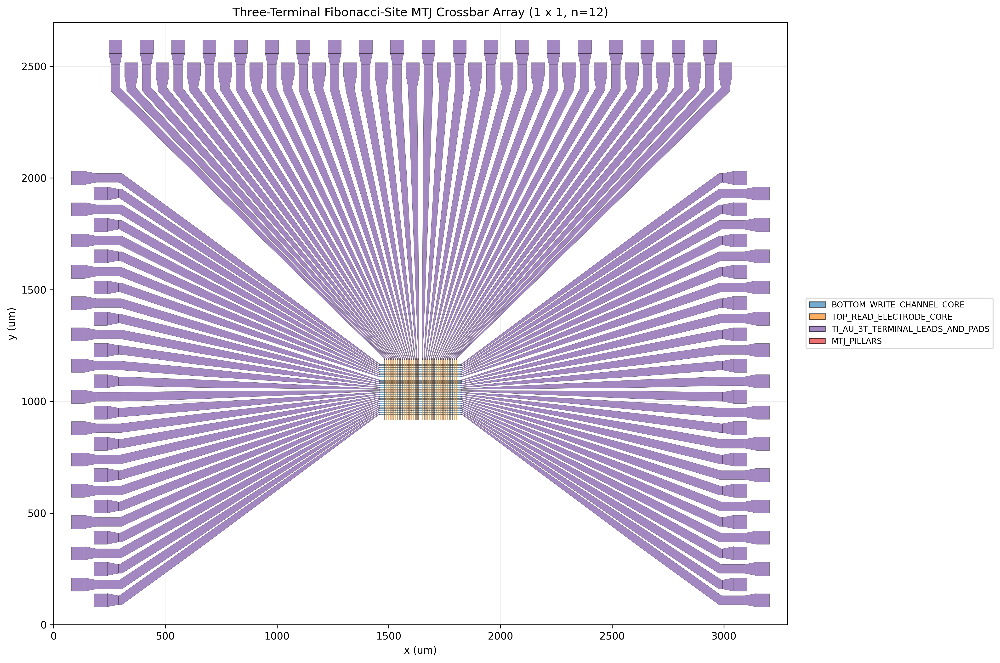

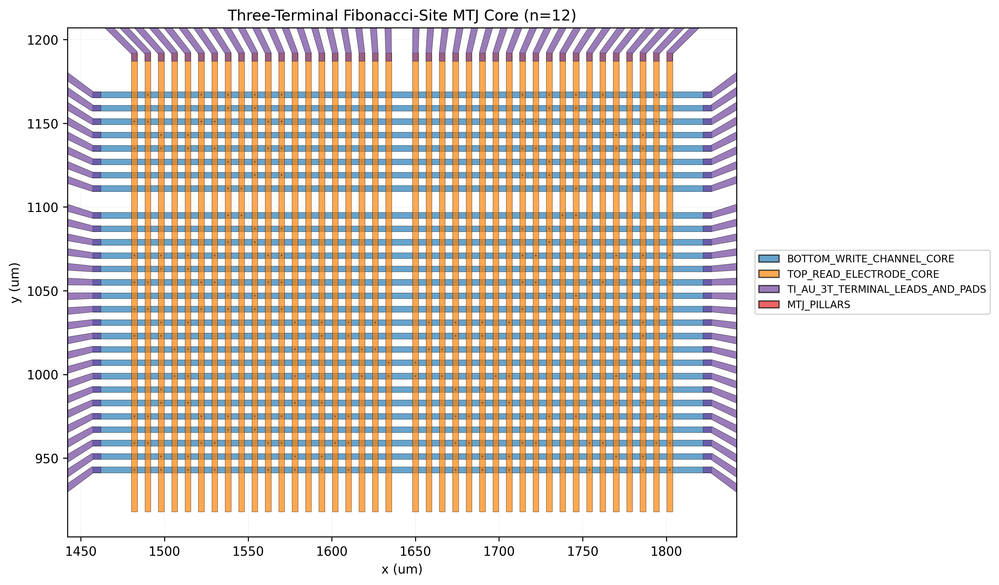

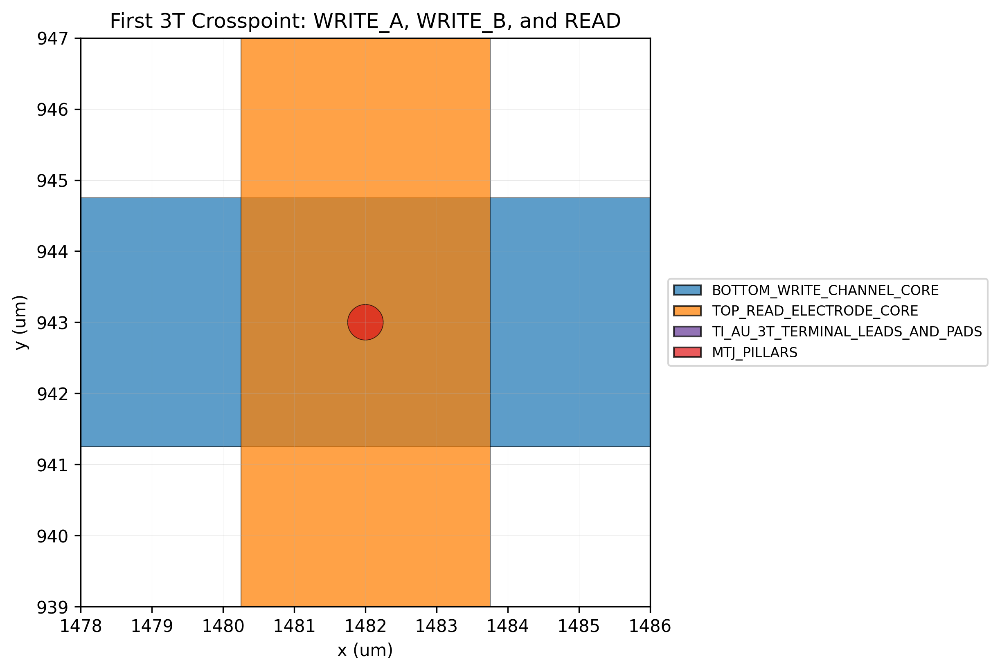

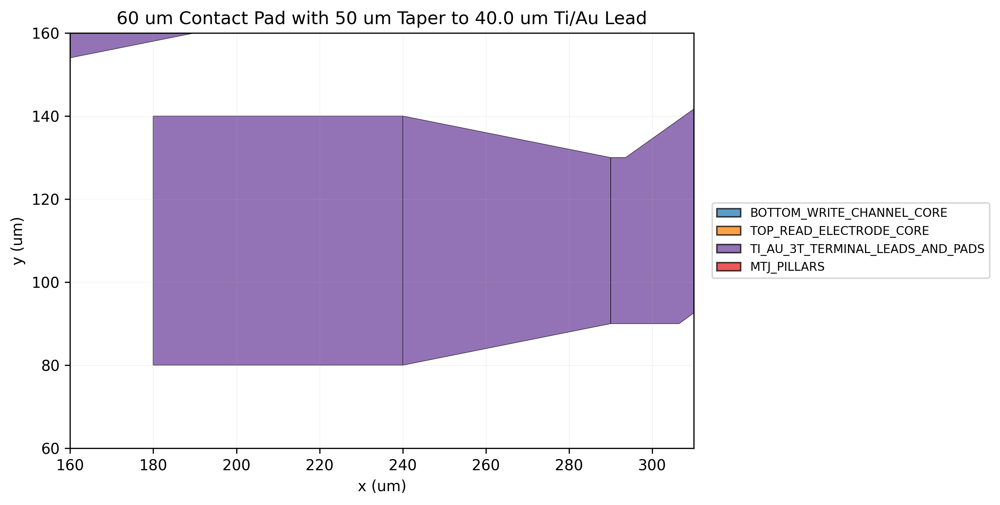

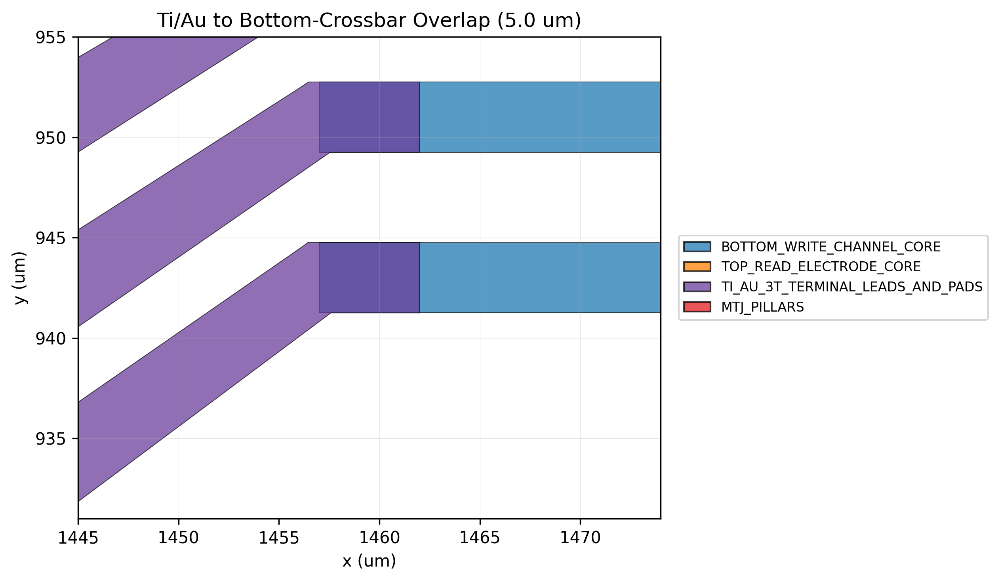

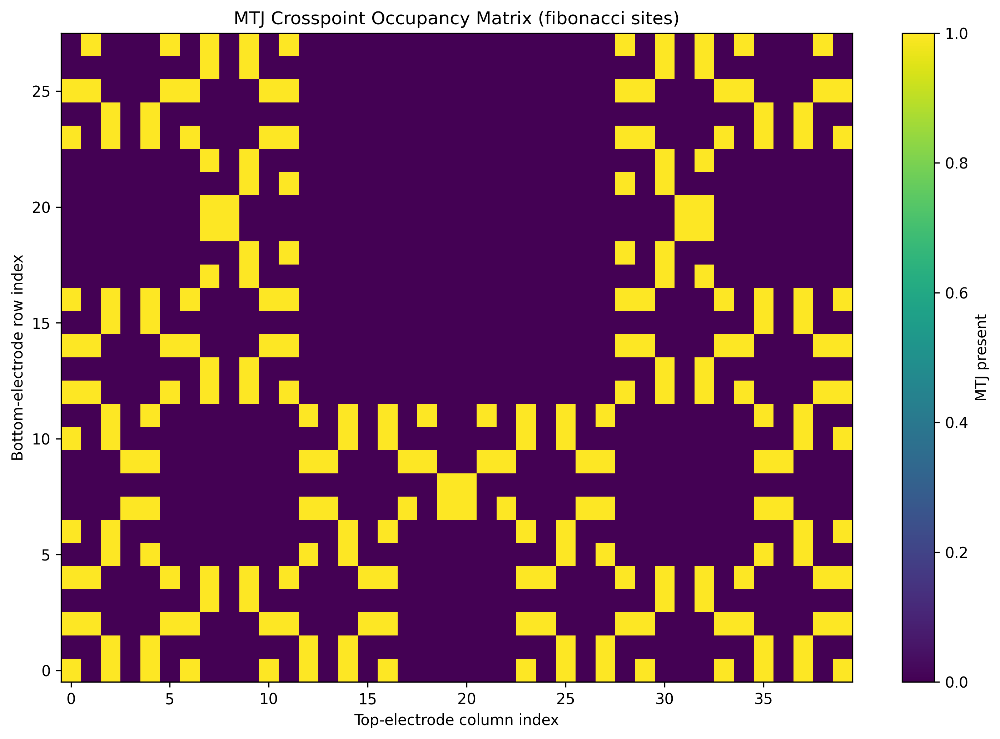

In [ ]:
"""Generate a split-metal, three-terminal Fibonacci-site MTJ crossbar.

Each populated MTJ is assigned three external terminal roles. ``WRITE_A`` and
``WRITE_B`` contact the two ends of its horizontal bottom-electrode channel,
and ``READ`` contacts its vertical top electrode. The default implementation is
a row-shared three-terminal array. Every MTJ on row ``r`` shares the same
``WRITE_A_Rr`` and ``WRITE_B_Rr`` channel ends, and every MTJ on column ``c``
shares ``READ_Cc``. This is the direct three-terminal interpretation of a
spin-orbit-torque-style MTJ crossbar. Independent per-pillar write selection
would require segmented local channels, selector devices, or additional metal
routing layers.

The Fibonacci turtle construction supplies candidate MTJ locations. The active
device region contains horizontal bottom write channels, vertical top read
conductors, and a 100 nm MTJ at each populated Fibonacci crosspoint. The two
conductor families remain on independent process layers and retain the inherited
3.5 micrometer width.

Long fanouts are placed on an independent low-resistance Ti/Au mask layer. Each
Ti/Au lead overlaps its corresponding thin-film conductor by a configurable
5 micrometers at the fanout elbow. The lead width increases in quantized,
piecewise-linear stages as conductor spacing expands toward the perimeter pads.
The width solver respects a same-layer edge-clearance target and automatically
reduces the widening profile if polygon-level checks detect an impending short.

The default layout exposes two bottom-channel contacts per row and one top-read
contact per column. ``ENABLE_AUXILIARY_READ_CONTACT`` can restore the opposite
end of every top conductor as an auxiliary Kelvin or redundancy contact. That
auxiliary contact belongs to the same read conductor and changes the physical
pad count from three-terminal to four-contact access.

Changing the Fibonacci order regenerates the conductor count, fanout length,
pad count, terminal map, pad placement, Ti/Au width profile, array envelope,
and exported hierarchy. ``PILLAR_POPULATION_MODE`` preserves the Fibonacci
bend-site mask by default. Set it to ``"all_crosspoints"`` to populate the
complete Cartesian crossbar.

GDSTK constructs fixed-width and variable-width metal polygons. PHIDL stores
the unit-cell hierarchy, builds the XY array, renders previews, and writes GDSII
or OASIS.
"""

from dataclasses import dataclass
from itertools import pairwise
from pathlib import Path
from typing import Final, Literal

import gdstk
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import PolyCollection
from matplotlib.patches import Patch, Rectangle
from phidl import Device

###############################################################
# Control knobs
###############################################################

# Output controls. Leave OUTPUT_BASENAME as None for an automatic name.
OUTPUT_BASENAME: Final[str | None] = None
OUTPUT_FORMAT: Final[Literal["gds", "oas"]] = "oas"
OUTPUT_DIRECTORY: Final[Path] = Path.cwd()

# Fibonacci site-generation controls.
FIBONACCI_ITERATIONS: Final[int] = 12  # Great options: 9, 12, 15, 18, 27 (27 requires ~25 minutes)
SEGMENT_LENGTH_UM: Final[float] = 8.000
TURN_ANGLE_DEG: Final[float] = 90.0
MIRROR_FRACTAL: Final[bool] = False
PILLAR_EVERY_NTH_BEND: Final[int] = 1

# Crossbar population behavior.
PILLAR_POPULATION_MODE: Final[Literal["fibonacci_sites", "all_crosspoints"]] = (
    "fibonacci_sites"
)

# Three-terminal network controls. The two ends of every horizontal bottom
# channel are WRITE_A and WRITE_B. One end of every vertical top conductor is
# the READ terminal. Set ENABLE_AUXILIARY_READ_CONTACT to True for a second
# physical contact on the same top-read conductor.
TOP_READ_CONTACT_SIDE: Final[Literal["bottom", "top"]] = "top"
ENABLE_AUXILIARY_READ_CONTACT: Final[bool] = False
TERMINAL_MAP_PREVIEW_COUNT: Final[int] = 8
AXIS_CLUSTER_TOLERANCE_UM: Final[float] = 1.0e-5
# Distance from an outermost MTJ row-column intersection to the first fanout
# elbow. This directly controls the compact straight-arm length requested for
# the central crossbar.
CROSSBAR_TO_FANOUT_ELBOW_UM: Final[float] = 25.000  # Between 25 to 300 um is good.
MINIMUM_TRACE_EDGE_GAP_UM: Final[float] = 0.500

# The main crossbar width is borrowed from the uploaded reference script.
ELECTRODE_WIDTH_UM: Final[float] = 3.500
PATH_TOLERANCE_UM: Final[float] = 1.0e-3

# MTJ geometry.
PILLAR_DIAMETER_NM: Final[float] = 500.0  # 100 by default
PILLAR_CIRCLE_POINTS: Final[int] = 256
ENABLE_PILLAR_DATABASE_GRID_SNAP: Final[bool] = True

# Contact-pad geometry. Each pad is exactly 60 um by 60 um by default.
PAD_WIDTH_UM: Final[float] = 60.0
PAD_HEIGHT_UM: Final[float] = 60.0
PAD_EDGE_GAP_UM: Final[float] = 10.0  # Between 10 to 50 um is good.
PAD_STAGGER_DEPTH_UM: Final[float] = 100.0

# Align the farthest outer edges of the left/right bottom-write pad banks and
# the enabled top-read pad bank to a common radius measured from the crossbar
# center. Extra radius expands every enabled side after the natural minimum
# fanout lengths have been calculated.
ALIGN_OUTERMOST_PAD_EDGES: Final[bool] = True
PAD_PERIMETER_EXTRA_RADIUS_UM: Final[float] = 0.0
PAD_EDGE_ALIGNMENT_TOLERANCE_UM: Final[float] = 1.0e-6

# The taper base uses the full transverse pad dimension and narrows linearly to
# the adaptive Ti/Au terminal width. PAD_TAPER_NECK_LENGTH_UM leaves a short constant-width
# section between the taper tip and the fanout anchor.
PAD_TAPER_LENGTH_UM: Final[float] = 50.0
PAD_TAPER_NECK_LENGTH_UM: Final[float] = 10.0
MINIMUM_PAD_CLEARANCE_UM: Final[float] = 10.0

# Split-metal lead architecture. The main bottom and top crossbars stop at
# their elbows on independent layers. A shared Ti/Au lead-and-pad layer begins
# inside each elbow and overlaps the corresponding crossbar by 5 um.
CROSSBAR_LEAD_OVERLAP_UM: Final[float] = 5.0
LOW_RESISTANCE_LEAD_MAX_WIDTH_UM: Final[float] = 40.0
LOW_RESISTANCE_LEAD_EDGE_GAP_UM: Final[float] = 2.0
LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION: Final[float] = 0.90
LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM: Final[float] = 0.50
LOW_RESISTANCE_LEAD_STAGE_FRACTIONS: Final[tuple[float, ...]] = (
    0.00,
    0.05,
    0.12,
    0.25,
    0.45,
    0.70,
    1.00,
)
AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE: Final[bool] = True
LEAD_WIDTH_REDUCTION_FACTOR: Final[float] = 0.90
MAX_LEAD_WIDTH_REDUCTION_ITERATIONS: Final[int] = 12
LEAD_BOOLEAN_PRECISION_UM: Final[float] = 1.0e-3
LEAD_CLEARANCE_AREA_TOLERANCE_UM2: Final[float] = 1.0e-5

# Optional resistance estimate. Leave as None to report geometry in squares
# without assigning a process-dependent Ti/Au sheet resistance.
ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE: Final[float | None] = None

# Fanout controls. Automatic mode limits the angle between a fanout segment
# and its outward routing direction. Larger angles shorten the device.
AUTO_FANOUT_LENGTH: Final[bool] = True
MAX_FANOUT_ANGLE_DEG: Final[float] = 45.0
MIN_FANOUT_LENGTH_UM: Final[float] = 250.0
FIXED_FANOUT_LENGTH_UM: Final[float] = 500.0

# Unit-cell and XY-array controls.
ARRAY_SIZE_X: Final[int] = 1
ARRAY_SIZE_Y: Final[int] = 1
CELL_MARGIN_UM: Final[float] = 40.0
ARRAY_CELL_EDGE_GAP_X_UM: Final[float] = 100.0
ARRAY_CELL_EDGE_GAP_Y_UM: Final[float] = 100.0

# GDSII and OASIS database controls. A 0.1 nm grid accurately resolves a
# 100 nm pillar and avoids integer-coordinate overflow for millimeter fanouts.
GDS_UNIT_M: Final[float] = 1.0e-6
GDS_PRECISION_M: Final[float] = 1.0e-10
GDS_INTEGER_COORDINATE_LIMIT: Final[int] = 2_000_000_000
OAS_CIRCLE_TOLERANCE_UM: Final[float] = 2.0e-4

# Notebook display controls.
DISPLAY_FULL_ARRAY: Final[bool] = True
DISPLAY_ACTIVE_CROSSBAR_ZOOM: Final[bool] = True
DISPLAY_FIRST_CROSSPOINT_DETAIL: Final[bool] = True
DISPLAY_FIRST_PAD_TAPER_DETAIL: Final[bool] = True
DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL: Final[bool] = True
DISPLAY_OCCUPANCY_MATRIX: Final[bool] = True
DOWNLOAD_AFTER_EXPORT_IN_COLAB: Final[bool] = False

PREVIEW_DPI: Final[int] = 300
PREVIEW_FIGSIZE_IN: Final[tuple[float, float]] = (13.0, 10.0)
PREVIEW_PADDING_UM: Final[float] = 80.0
PREVIEW_EDGE_LINEWIDTH: Final[float] = 0.16
PREVIEW_ALPHA: Final[float] = 0.62
CROSSBAR_ZOOM_PADDING_UM: Final[float] = 40.0
CROSSPOINT_DETAIL_HALF_WINDOW_UM: Final[float] = 4.0
PAD_TAPER_DETAIL_PADDING_UM: Final[float] = 20.0
OVERLAP_DETAIL_PADDING_UM: Final[float] = 12.0
SHOW_CELL_BOUNDARIES_IN_PREVIEW: Final[bool] = True
SHOW_PAD_LABELS_IN_PREVIEW: Final[bool] = False
PAD_LABEL_FONT_SIZE_PT: Final[float] = 4.5

DATABASE_GRID_UM: Final[float] = GDS_PRECISION_M / GDS_UNIT_M
DATABASE_GRID_NM: Final[float] = DATABASE_GRID_UM * 1.0e3

mpl.rcParams["figure.dpi"] = PREVIEW_DPI
mpl.rcParams["font.sans-serif"] = ["Tahoma", "DejaVu Sans"]
mpl.rcParams["font.weight"] = "normal"

Coordinate = tuple[float, float]
Polygon = list[Coordinate]
ElectrodeKind = Literal["bottom", "top"]
PadSide = Literal["left", "right", "bottom", "top"]
TerminalRole = Literal["write_a", "write_b", "read", "read_auxiliary"]


@dataclass(frozen=True)
class LayerSpec:
    """Describe one exported and previewed layout layer.

    Attributes:
        name: Human-readable layer name.
        layer: GDSII layer number.
        datatype: GDSII datatype number.
        color: Matplotlib preview color.
    """

    name: str
    layer: int
    datatype: int
    color: str


@dataclass(frozen=True)
class BoundingBox:
    """Store an axis-aligned bounding box in micrometers."""

    xmin: float
    ymin: float
    xmax: float
    ymax: float

    @property
    def width(self) -> float:
        """Return the bounding-box width."""
        return self.xmax - self.xmin

    @property
    def height(self) -> float:
        """Return the bounding-box height."""
        return self.ymax - self.ymin

    def translated(self, shift: Coordinate) -> "BoundingBox":
        """Return a translated copy of the bounding box."""
        return BoundingBox(
            xmin=self.xmin + shift[0],
            ymin=self.ymin + shift[1],
            xmax=self.xmax + shift[0],
            ymax=self.ymax + shift[1],
        )


@dataclass(frozen=True)
class PadTerminal:
    """Describe one rectangular Ti/Au perimeter contact pad.

    Attributes:
        name: Unique terminal name.
        electrode: Crossbar family contacted by this terminal.
        side: Physical side of the crossbar.
        conductor_index: Row or column conductor index.
        terminal_role: Three-terminal role assigned to the pad.
        center: Pad center coordinate in micrometers.
        width_um: Pad x dimension.
        height_um: Pad y dimension.
        lead_width_um: Ti/Au lead width at the narrow taper tip.
    """

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    center: Coordinate
    width_um: float
    height_um: float
    lead_width_um: float

    @property
    def bounds(self) -> BoundingBox:
        """Return the pad rectangle bounds."""
        half_width = 0.5 * self.width_um
        half_height = 0.5 * self.height_um
        return BoundingBox(
            xmin=self.center[0] - half_width,
            ymin=self.center[1] - half_height,
            xmax=self.center[0] + half_width,
            ymax=self.center[1] + half_height,
        )


@dataclass(frozen=True)
class RoutedTrace:
    """Describe one fixed-width main crossbar conductor."""

    name: str
    electrode: ElectrodeKind
    conductor_index: int
    axis_coordinate_um: float
    centerline_points: tuple[Coordinate, ...]


@dataclass(frozen=True)
class VariableWidthLead:
    """Describe one variable-width Ti/Au pad-to-crossbar lead."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    centerline_points: tuple[Coordinate, ...]
    widths_um: tuple[float, ...]

    def __post_init__(self) -> None:
        """Validate point and width cardinality."""
        if len(self.centerline_points) < 2:
            raise ValueError("A Ti/Au lead requires at least two points.")
        if len(self.centerline_points) != len(self.widths_um):
            raise ValueError(
                "A Ti/Au lead requires one width value per centerline point."
            )
        if any(width <= 0.0 for width in self.widths_um):
            raise ValueError("Every Ti/Au lead width must be positive.")

    @property
    def terminal_width_um(self) -> float:
        """Return the width meeting the pad taper tip."""
        return self.widths_um[-1]


@dataclass(frozen=True)
class LeadClearanceResult:
    """Store the result of a Ti/Au same-layer clearance check."""

    is_valid: bool
    message: str


@dataclass(frozen=True)
class ThreeTerminalAssignment:
    """Map one MTJ pillar to its shared external three-terminal conductors.

    Attributes:
        pillar_index: Index in the generated pillar collection.
        row_index: Bottom write-channel row index.
        column_index: Top read-conductor column index.
        center: MTJ center coordinate in micrometers.
        write_a_pad_name: Left bottom-channel terminal name.
        write_b_pad_name: Right bottom-channel terminal name.
        read_pad_name: Enabled top-read terminal name.
    """

    pillar_index: int
    row_index: int
    column_index: int
    center: Coordinate
    write_a_pad_name: str
    write_b_pad_name: str
    read_pad_name: str


@dataclass(frozen=True)
class CrossbarGeometry:
    """Store generated unit-cell geometry and topology metadata."""

    fibonacci_word: str
    detected_bend_count: int
    selected_fibonacci_site_count: int
    fibonacci_crosspoint_indices: tuple[tuple[int, int], ...]
    populated_crosspoint_indices: tuple[tuple[int, int], ...]
    row_coordinates_um: tuple[float, ...]
    column_coordinates_um: tuple[float, ...]
    pillar_centers: tuple[Coordinate, ...]
    terminal_assignments: tuple[ThreeTerminalAssignment, ...]
    bottom_routes: tuple[RoutedTrace, ...]
    top_routes: tuple[RoutedTrace, ...]
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    crossbar_bounds: BoundingBox
    routing_transition_bounds: BoundingBox
    bounds: BoundingBox
    row_fanout_length_um: float
    column_fanout_length_um: float
    maximum_row_fanout_angle_deg: float
    maximum_column_fanout_angle_deg: float
    bottom_pad_outer_edge_radius_um: float
    top_pad_outer_edge_radius_um: float
    bottom_pad_alignment_extension_um: float
    top_pad_alignment_extension_um: float
    bottom_lead_width_profile_um: tuple[float, ...]
    top_lead_width_profile_um: tuple[float, ...]
    lead_width_scale: float


LAYERS: Final[dict[str, LayerSpec]] = {
    "BOTTOM_ELECTRODE": LayerSpec(
        name="BOTTOM_WRITE_CHANNEL_CORE",
        layer=2,
        datatype=0,
        color="#1f78b4",
    ),
    "MTJ_PILLARS": LayerSpec(
        name="MTJ_PILLARS",
        layer=3,
        datatype=0,
        color="#e31a1c",
    ),
    "TOP_ELECTRODE": LayerSpec(
        name="TOP_READ_ELECTRODE_CORE",
        layer=4,
        datatype=0,
        color="#ff7f00",
    ),
    "TI_AU_LEADS": LayerSpec(
        name="TI_AU_3T_TERMINAL_LEADS_AND_PADS",
        layer=5,
        datatype=0,
        color="#6a3d9a",
    ),
}


def validate_control_knobs() -> None:
    """Validate all user-adjustable geometry and database controls."""
    if FIBONACCI_ITERATIONS < 1:
        raise ValueError("FIBONACCI_ITERATIONS must be at least 1.")
    if SEGMENT_LENGTH_UM <= 0.0:
        raise ValueError("SEGMENT_LENGTH_UM must be positive.")
    if not 0.0 < TURN_ANGLE_DEG < 180.0:
        raise ValueError("TURN_ANGLE_DEG must lie between 0 and 180 degrees.")
    if PILLAR_EVERY_NTH_BEND < 1:
        raise ValueError("PILLAR_EVERY_NTH_BEND must be at least 1.")
    if PILLAR_POPULATION_MODE not in {
        "fibonacci_sites",
        "all_crosspoints",
    }:
        raise ValueError(
            "PILLAR_POPULATION_MODE must be 'fibonacci_sites' or 'all_crosspoints'."
        )
    if TOP_READ_CONTACT_SIDE not in {"bottom", "top"}:
        raise ValueError("TOP_READ_CONTACT_SIDE must be 'bottom' or 'top'.")
    if TERMINAL_MAP_PREVIEW_COUNT < 0:
        raise ValueError("TERMINAL_MAP_PREVIEW_COUNT must be nonnegative.")
    if AXIS_CLUSTER_TOLERANCE_UM <= 0.0:
        raise ValueError("AXIS_CLUSTER_TOLERANCE_UM must be positive.")
    if CROSSBAR_TO_FANOUT_ELBOW_UM <= 0.0:
        raise ValueError("CROSSBAR_TO_FANOUT_ELBOW_UM must be positive.")
    if ELECTRODE_WIDTH_UM <= 0.0:
        raise ValueError("ELECTRODE_WIDTH_UM must be positive.")
    if SEGMENT_LENGTH_UM <= ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM:
        raise ValueError(
            "SEGMENT_LENGTH_UM must exceed ELECTRODE_WIDTH_UM plus "
            "MINIMUM_TRACE_EDGE_GAP_UM."
        )
    if PATH_TOLERANCE_UM <= 0.0:
        raise ValueError("PATH_TOLERANCE_UM must be positive.")
    if PILLAR_DIAMETER_NM <= 0.0:
        raise ValueError("PILLAR_DIAMETER_NM must be positive.")
    if PILLAR_CIRCLE_POINTS < 32:
        raise ValueError("PILLAR_CIRCLE_POINTS must be at least 32.")

    pillar_diameter_um = PILLAR_DIAMETER_NM * 1.0e-3
    if pillar_diameter_um > ELECTRODE_WIDTH_UM:
        raise ValueError("PILLAR_DIAMETER_NM must fit inside the crossbar width.")

    if PAD_WIDTH_UM <= 0.0 or PAD_HEIGHT_UM <= 0.0:
        raise ValueError("PAD_WIDTH_UM and PAD_HEIGHT_UM must be positive.")
    if PAD_EDGE_GAP_UM < 0.0:
        raise ValueError("PAD_EDGE_GAP_UM must be nonnegative.")
    if PAD_STAGGER_DEPTH_UM < 0.0:
        raise ValueError("PAD_STAGGER_DEPTH_UM must be nonnegative.")
    if PAD_PERIMETER_EXTRA_RADIUS_UM < 0.0:
        raise ValueError("PAD_PERIMETER_EXTRA_RADIUS_UM must be nonnegative.")
    if PAD_EDGE_ALIGNMENT_TOLERANCE_UM <= 0.0:
        raise ValueError("PAD_EDGE_ALIGNMENT_TOLERANCE_UM must be positive.")
    if PAD_TAPER_LENGTH_UM <= 0.0:
        raise ValueError("PAD_TAPER_LENGTH_UM must be positive.")
    if PAD_TAPER_NECK_LENGTH_UM < 0.0:
        raise ValueError("PAD_TAPER_NECK_LENGTH_UM must be nonnegative.")
    if MINIMUM_PAD_CLEARANCE_UM < 0.0:
        raise ValueError("MINIMUM_PAD_CLEARANCE_UM must be nonnegative.")

    minimum_corner_offset_um = (
        ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    ) / np.sqrt(2.0)
    if CROSSBAR_TO_FANOUT_ELBOW_UM < minimum_corner_offset_um:
        raise ValueError(
            "CROSSBAR_TO_FANOUT_ELBOW_UM is too short to preserve the "
            "requested finite-width corner clearance. Use at least "
            f"{minimum_corner_offset_um:.3f} um."
        )
    if CROSSBAR_LEAD_OVERLAP_UM <= 0.0:
        raise ValueError("CROSSBAR_LEAD_OVERLAP_UM must be positive.")
    if CROSSBAR_LEAD_OVERLAP_UM >= CROSSBAR_TO_FANOUT_ELBOW_UM:
        raise ValueError(
            "CROSSBAR_LEAD_OVERLAP_UM must remain smaller than "
            "CROSSBAR_TO_FANOUT_ELBOW_UM so the shared Ti/Au layer cannot "
            "reach an orthogonal crossbar column or row."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM < ELECTRODE_WIDTH_UM:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_MAX_WIDTH_UM must be at least the crossbar width."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM > min(PAD_WIDTH_UM, PAD_HEIGHT_UM):
        raise ValueError(
            "LOW_RESISTANCE_LEAD_MAX_WIDTH_UM must fit inside both pad dimensions."
        )
    if LOW_RESISTANCE_LEAD_EDGE_GAP_UM < 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_EDGE_GAP_UM must be nonnegative.")
    if not 0.0 < LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION <= 1.0:
        raise ValueError("LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION must lie in (0, 1].")
    if LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM <= 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM must be positive.")
    fractions = LOW_RESISTANCE_LEAD_STAGE_FRACTIONS
    if len(fractions) < 2:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_STAGE_FRACTIONS requires at least two entries."
        )
    if not np.isclose(fractions[0], 0.0) or not np.isclose(
        fractions[-1],
        1.0,
    ):
        raise ValueError(
            "LOW_RESISTANCE_LEAD_STAGE_FRACTIONS must start at 0 and end at 1."
        )
    if any(later <= earlier for earlier, later in pairwise(fractions)):
        raise ValueError(
            "LOW_RESISTANCE_LEAD_STAGE_FRACTIONS must be strictly increasing."
        )
    if not 0.0 < LEAD_WIDTH_REDUCTION_FACTOR < 1.0:
        raise ValueError("LEAD_WIDTH_REDUCTION_FACTOR must lie between 0 and 1.")
    if MAX_LEAD_WIDTH_REDUCTION_ITERATIONS < 1:
        raise ValueError("MAX_LEAD_WIDTH_REDUCTION_ITERATIONS must be at least 1.")
    if LEAD_BOOLEAN_PRECISION_UM <= 0.0:
        raise ValueError("LEAD_BOOLEAN_PRECISION_UM must be positive.")
    if LEAD_CLEARANCE_AREA_TOLERANCE_UM2 < 0.0:
        raise ValueError("LEAD_CLEARANCE_AREA_TOLERANCE_UM2 must be nonnegative.")
    if (
        ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None
        and ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE <= 0.0
    ):
        raise ValueError(
            "ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE must be positive or None."
        )

    if not 0.0 < MAX_FANOUT_ANGLE_DEG < 89.0:
        raise ValueError("MAX_FANOUT_ANGLE_DEG must lie between 0 and 89.")
    if MIN_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("MIN_FANOUT_LENGTH_UM must be positive.")
    if FIXED_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("FIXED_FANOUT_LENGTH_UM must be positive.")
    if ARRAY_SIZE_X < 1 or ARRAY_SIZE_Y < 1:
        raise ValueError("ARRAY_SIZE_X and ARRAY_SIZE_Y must be at least 1.")
    if CELL_MARGIN_UM < 0.0:
        raise ValueError("CELL_MARGIN_UM must be nonnegative.")
    if ARRAY_CELL_EDGE_GAP_X_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_X_UM must be positive.")
    if ARRAY_CELL_EDGE_GAP_Y_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_Y_UM must be positive.")
    if GDS_PRECISION_M <= 0.0 or GDS_UNIT_M <= 0.0:
        raise ValueError("GDS unit and precision values must be positive.")


def fibonacci_word(iterations: int) -> str:
    """Return the canonical Fibonacci word F_n.

    Args:
        iterations: Fibonacci word index with F_0 = "0" and F_1 = "01".

    Returns:
        Fibonacci word at the requested index.
    """
    if iterations == 0:
        return "0"
    if iterations == 1:
        return "01"

    previous_previous = "0"
    previous = "01"
    for _ in range(2, iterations + 1):
        current = previous + previous_previous
        previous_previous = previous
        previous = current

    return previous


def normalize_vector(vector: np.ndarray) -> np.ndarray:
    """Return a unit vector.

    Args:
        vector: Input vector.

    Returns:
        Unit vector with floating-point components.
    """
    norm = float(np.linalg.norm(vector))
    if norm <= 0.0:
        raise ValueError("A zero-length direction vector was generated.")
    return vector / norm


def rotate_direction(direction: np.ndarray, turn_sign: int) -> np.ndarray:
    """Rotate a direction by the configured signed turn angle.

    Args:
        direction: Two-component unit vector.
        turn_sign: +1 for a left turn and -1 for a right turn.

    Returns:
        Rotated unit vector.
    """
    if turn_sign not in {-1, 1}:
        raise ValueError("turn_sign must be +1 or -1.")

    angle_rad = np.deg2rad(turn_sign * TURN_ANGLE_DEG)
    rotation_matrix = np.array(
        [
            [np.cos(angle_rad), -np.sin(angle_rad)],
            [np.sin(angle_rad), np.cos(angle_rad)],
        ],
        dtype=float,
    )
    return normalize_vector(rotation_matrix @ direction)


def build_raw_centerline(word: str, step_um: float) -> np.ndarray:
    """Apply the odd-even drawing rule and return every segment endpoint.

    Args:
        word: Fibonacci word containing zero and one symbols.
        step_um: Centerline segment length in micrometers.

    Returns:
        Array with shape (len(word) + 1, 2).
    """
    position = np.array([0.0, 0.0], dtype=float)
    direction = np.array([1.0, 0.0], dtype=float)
    points = [position.copy()]
    mirror_sign = -1 if MIRROR_FRACTAL else 1

    for one_based_position, symbol in enumerate(word, start=1):
        position = position + step_um * direction
        points.append(position.copy())

        is_final_symbol = one_based_position == len(word)
        if symbol == "1" or is_final_symbol:
            continue
        if symbol != "0":
            raise ValueError(f"Unexpected Fibonacci word symbol: {symbol!r}")

        turn_sign = 1 if one_based_position % 2 == 0 else -1
        direction = rotate_direction(
            direction=direction,
            turn_sign=mirror_sign * turn_sign,
        )

    return np.asarray(points, dtype=float)


def find_bend_centers(raw_points: np.ndarray) -> list[Coordinate]:
    """Return the centerline coordinate of every true direction change.

    Args:
        raw_points: Every segment endpoint from the turtle construction.

    Returns:
        Ordered bend-center coordinates.
    """
    bend_centers: list[Coordinate] = []

    for point_index in range(1, len(raw_points) - 1):
        incoming = normalize_vector(
            raw_points[point_index] - raw_points[point_index - 1]
        )
        outgoing = normalize_vector(
            raw_points[point_index + 1] - raw_points[point_index]
        )
        cross_z = incoming[0] * outgoing[1] - incoming[1] * outgoing[0]
        if np.isclose(cross_z, 0.0, atol=1.0e-12):
            continue

        bend_centers.append(
            (
                float(raw_points[point_index, 0]),
                float(raw_points[point_index, 1]),
            )
        )

    return bend_centers


def deduplicate_coordinates(
    coordinates: list[Coordinate],
    grid_um: float,
) -> list[Coordinate]:
    """Remove duplicate coordinates after grid quantization.

    Args:
        coordinates: Coordinates to deduplicate.
        grid_um: Quantization grid in micrometers.

    Returns:
        Ordered unique coordinates.
    """
    if grid_um <= 0.0:
        raise ValueError("grid_um must be positive.")

    unique_coordinates: list[Coordinate] = []
    seen: set[tuple[int, int]] = set()

    for x_coord, y_coord in coordinates:
        key = (
            int(round(x_coord / grid_um)),
            int(round(y_coord / grid_um)),
        )
        if key in seen:
            continue
        seen.add(key)
        unique_coordinates.append((x_coord, y_coord))

    return unique_coordinates


def cluster_axis_values(
    values: list[float],
    tolerance_um: float,
) -> tuple[tuple[float, ...], tuple[int, ...]]:
    """Cluster nearly equal axis coordinates and return site assignments.

    Args:
        values: Axis coordinates in original site order.
        tolerance_um: Maximum separation retained in one coordinate cluster.

    Returns:
        Sorted cluster centers and one cluster index per original value.
    """
    if len(values) == 0:
        raise ValueError("At least one axis value is required.")
    if tolerance_um <= 0.0:
        raise ValueError("tolerance_um must be positive.")

    sorted_pairs = sorted(enumerate(values), key=lambda pair: pair[1])
    clusters: list[list[tuple[int, float]]] = []

    for original_index, value in sorted_pairs:
        if len(clusters) == 0:
            clusters.append([(original_index, value)])
            continue

        previous_values = [member_value for _, member_value in clusters[-1]]
        cluster_center = float(np.mean(previous_values))
        if abs(value - cluster_center) <= tolerance_um:
            clusters[-1].append((original_index, value))
        else:
            clusters.append([(original_index, value)])

    centers = tuple(
        float(np.mean([value for _, value in cluster])) for cluster in clusters
    )
    assignments = [-1] * len(values)
    for cluster_index, cluster in enumerate(clusters):
        for original_index, _ in cluster:
            assignments[original_index] = cluster_index

    if any(index < 0 for index in assignments):
        raise RuntimeError("Axis clustering left an unassigned coordinate.")

    return centers, tuple(assignments)


def centered_slot_positions(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return evenly spaced pad-bank positions centered about zero."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")

    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))


def compute_fanout_length(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
) -> tuple[float, float]:
    """Compute a fanout run and its resulting maximum route angle.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.

    Returns:
        Fanout length and maximum absolute fanout angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))

    if AUTO_FANOUT_LENGTH:
        maximum_angle_rad = np.deg2rad(MAX_FANOUT_ANGLE_DEG)
        angular_length_um = maximum_displacement_um / np.tan(maximum_angle_rad)
        fanout_length_um = max(MIN_FANOUT_LENGTH_UM, angular_length_um)
    else:
        fanout_length_um = FIXED_FANOUT_LENGTH_UM

    resulting_angle_deg = float(
        np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um))
    )
    return fanout_length_um, resulting_angle_deg


def maximum_fanout_angle(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    fanout_length_um: float,
) -> float:
    """Return the maximum route angle for a prescribed fanout length.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.
        fanout_length_um: Outward fanout run in micrometers.

    Returns:
        Maximum absolute route angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))
    return float(np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um)))


def predicted_pad_outer_edge_radius(
    elbow_radius_um: float,
    fanout_length_um: float,
    outward_pad_dimension_um: float,
) -> float:
    """Return the farthest staggered pad-edge radius from the origin.

    Args:
        elbow_radius_um: Radial distance from the origin to the fanout elbow.
        fanout_length_um: Outward run from the elbow to the fanout anchor.
        outward_pad_dimension_um: Pad dimension along the outward direction.

    Returns:
        Farthest pad-edge radius in micrometers.
    """
    if elbow_radius_um < 0.0:
        raise ValueError("elbow_radius_um must be nonnegative.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")
    if outward_pad_dimension_um <= 0.0:
        raise ValueError("outward_pad_dimension_um must be positive.")

    return (
        elbow_radius_um
        + fanout_length_um
        + PAD_TAPER_NECK_LENGTH_UM
        + PAD_TAPER_LENGTH_UM
        + outward_pad_dimension_um
        + PAD_STAGGER_DEPTH_UM
    )


def quantize_width_down(width_um: float) -> float:
    """Quantize a width downward to the configured fabrication increment."""
    quantum_um = LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM
    quantized = np.floor(width_um / quantum_um + 1.0e-12) * quantum_um
    return float(max(ELECTRODE_WIDTH_UM, quantized))


def compute_adaptive_lead_width_profile(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    maximum_fanout_angle_deg: float,
) -> tuple[float, ...]:
    """Compute a monotonic Ti/Au width profile from local route spacing.

    Each profile station follows the normalized fanout coordinate from the
    crossbar elbow to the outer routing anchor. The local centerline spacing is
    projected conservatively onto a route-normal direction using the maximum
    family fanout angle. A utilization factor and width quantization leave
    process margin beyond the requested same-layer edge clearance.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    conductor_array = np.asarray(conductor_coordinates_um, dtype=float)
    pad_slot_array = np.asarray(pad_slot_coordinates_um, dtype=float)
    projection_factor = float(np.cos(np.deg2rad(maximum_fanout_angle_deg)))

    widths_um: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for fraction in LOW_RESISTANCE_LEAD_STAGE_FRACTIONS:
        interpolated_coordinates = (
            1.0 - fraction
        ) * conductor_array + fraction * pad_slot_array
        if len(interpolated_coordinates) < 2:
            minimum_spacing_um = float("inf")
        else:
            minimum_spacing_um = float(np.min(np.diff(interpolated_coordinates)))

        projected_spacing_um = minimum_spacing_um * projection_factor
        available_width_um = projected_spacing_um - LOW_RESISTANCE_LEAD_EDGE_GAP_UM
        target_width_um = min(
            LOW_RESISTANCE_LEAD_MAX_WIDTH_UM,
            LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION * available_width_um,
        )
        width_um = quantize_width_down(target_width_um)
        width_um = max(previous_width_um, width_um)
        widths_um.append(width_um)
        previous_width_um = width_um

    widths_um[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in widths_um)


def scale_lead_width_profile(
    nominal_profile_um: tuple[float, ...],
    scale: float,
) -> tuple[float, ...]:
    """Scale profile widening above the crossbar width and requantize it."""
    if not 0.0 <= scale <= 1.0:
        raise ValueError("Lead width scale must lie between 0 and 1.")

    scaled_widths: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for nominal_width_um in nominal_profile_um:
        expanded_width_um = ELECTRODE_WIDTH_UM + scale * (
            nominal_width_um - ELECTRODE_WIDTH_UM
        )
        width_um = quantize_width_down(expanded_width_um)
        width_um = max(previous_width_um, width_um)
        scaled_widths.append(width_um)
        previous_width_um = width_um

    scaled_widths[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in scaled_widths)


def interpolate_coordinate(
    start: Coordinate,
    end: Coordinate,
    fraction: float,
) -> Coordinate:
    """Linearly interpolate between two coordinates."""
    return (
        start[0] + fraction * (end[0] - start[0]),
        start[1] + fraction * (end[1] - start[1]),
    )


def make_variable_width_path(lead: VariableWidthLead) -> gdstk.RobustPath:
    """Construct a GDSTK RobustPath for one Ti/Au lead."""
    path = gdstk.RobustPath(
        lead.centerline_points[0],
        lead.widths_um[0],
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for endpoint, width_um in zip(
        lead.centerline_points[1:],
        lead.widths_um[1:],
        strict=True,
    ):
        path.segment(endpoint, width=(width_um, "linear"))
    return path


def variable_width_lead_polygons(
    lead: VariableWidthLead,
) -> list[gdstk.Polygon]:
    """Return polygonal contours for one variable-width lead."""
    return make_variable_width_path(lead).to_polygons()


def remove_adjacent_duplicate_points(
    points: tuple[Coordinate, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[Coordinate, ...]:
    """Remove adjacent duplicate vertices from a routed centerline."""
    if len(points) == 0:
        return tuple()

    pruned = [points[0]]
    for point in points[1:]:
        previous = pruned[-1]
        if np.hypot(point[0] - previous[0], point[1] - previous[1]) <= tolerance_um:
            continue
        pruned.append(point)

    return tuple(pruned)


def remove_adjacent_duplicate_profile_points(
    points: tuple[Coordinate, ...],
    widths_um: tuple[float, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[tuple[Coordinate, ...], tuple[float, ...]]:
    """Prune duplicate profile vertices while preserving endpoint widths."""
    if len(points) != len(widths_um):
        raise ValueError("Profile points and widths must have equal lengths.")
    if len(points) == 0:
        return tuple(), tuple()

    pruned_points = [points[0]]
    pruned_widths = [widths_um[0]]
    for point, width_um in zip(points[1:], widths_um[1:], strict=True):
        previous = pruned_points[-1]
        separation_um = float(np.hypot(point[0] - previous[0], point[1] - previous[1]))
        if separation_um <= tolerance_um:
            pruned_widths[-1] = max(pruned_widths[-1], width_um)
            continue
        pruned_points.append(point)
        pruned_widths.append(width_um)

    return tuple(pruned_points), tuple(pruned_widths)


def translate_coordinate(
    coordinate: Coordinate,
    shift: Coordinate,
) -> Coordinate:
    """Translate one coordinate."""
    return coordinate[0] + shift[0], coordinate[1] + shift[1]


def translate_trace(trace: RoutedTrace, shift: Coordinate) -> RoutedTrace:
    """Translate one fixed-width main crossbar conductor."""
    axis_coordinate = trace.axis_coordinate_um
    if trace.electrode == "bottom":
        axis_coordinate += shift[1]
    else:
        axis_coordinate += shift[0]

    return RoutedTrace(
        name=trace.name,
        electrode=trace.electrode,
        conductor_index=trace.conductor_index,
        axis_coordinate_um=axis_coordinate,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in trace.centerline_points
        ),
    )


def translate_variable_width_lead(
    lead: VariableWidthLead,
    shift: Coordinate,
) -> VariableWidthLead:
    """Translate one variable-width Ti/Au lead."""
    return VariableWidthLead(
        name=lead.name,
        electrode=lead.electrode,
        side=lead.side,
        conductor_index=lead.conductor_index,
        terminal_role=lead.terminal_role,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in lead.centerline_points
        ),
        widths_um=lead.widths_um,
    )


def translate_pad(pad: PadTerminal, shift: Coordinate) -> PadTerminal:
    """Translate one Ti/Au contact pad."""
    return PadTerminal(
        name=pad.name,
        electrode=pad.electrode,
        side=pad.side,
        conductor_index=pad.conductor_index,
        terminal_role=pad.terminal_role,
        center=translate_coordinate(pad.center, shift),
        width_um=pad.width_um,
        height_um=pad.height_um,
        lead_width_um=pad.lead_width_um,
    )


def pad_taper_tip(pad: PadTerminal) -> Coordinate:
    """Return the center of the narrow electrode-width taper end.

    Args:
        pad: Contact pad whose taper points inward toward the crossbar.

    Returns:
        Center coordinate of the taper tip.
    """
    if pad.side == "left":
        return pad.bounds.xmax + PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "right":
        return pad.bounds.xmin - PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "bottom":
        return pad.center[0], pad.bounds.ymax + PAD_TAPER_LENGTH_UM
    if pad.side == "top":
        return pad.center[0], pad.bounds.ymin - PAD_TAPER_LENGTH_UM
    raise ValueError(f"Unsupported pad side: {pad.side!r}")


def pad_taper_polygon(pad: PadTerminal) -> Polygon:
    """Return a full-pad-edge taper to the adaptive Ti/Au lead width."""
    half_lead_width = 0.5 * pad.lead_width_um
    tip_x, tip_y = pad_taper_tip(pad)

    if pad.side == "left":
        base_x = pad.bounds.xmax
        return [
            (base_x, pad.bounds.ymin),
            (base_x, pad.bounds.ymax),
            (tip_x, tip_y + half_lead_width),
            (tip_x, tip_y - half_lead_width),
        ]
    if pad.side == "right":
        base_x = pad.bounds.xmin
        return [
            (base_x, pad.bounds.ymin),
            (tip_x, tip_y - half_lead_width),
            (tip_x, tip_y + half_lead_width),
            (base_x, pad.bounds.ymax),
        ]
    if pad.side == "bottom":
        base_y = pad.bounds.ymax
        return [
            (pad.bounds.xmin, base_y),
            (pad.bounds.xmax, base_y),
            (tip_x + half_lead_width, tip_y),
            (tip_x - half_lead_width, tip_y),
        ]
    if pad.side == "top":
        base_y = pad.bounds.ymin
        return [
            (pad.bounds.xmin, base_y),
            (tip_x - half_lead_width, tip_y),
            (tip_x + half_lead_width, tip_y),
            (pad.bounds.xmax, base_y),
        ]
    raise ValueError(f"Unsupported pad side: {pad.side!r}")


def polygon_bounds(polygon: Polygon) -> BoundingBox:
    """Return an axis-aligned bounding box for a polygon."""
    if len(polygon) < 3:
        raise ValueError("A polygon must contain at least three vertices.")
    vertices = np.asarray(polygon, dtype=float)
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )


def minimum_axis_spacing(coordinates: tuple[float, ...]) -> float:
    """Return the minimum spacing between sorted axis coordinates."""
    if len(coordinates) < 2:
        return float("inf")
    differences = np.diff(np.asarray(coordinates, dtype=float))
    return float(np.min(differences))


def validate_axis_trace_clearance(
    coordinates: tuple[float, ...],
    axis_name: str,
) -> None:
    """Verify that adjacent parallel traces retain the requested edge gap."""
    minimum_center_spacing = minimum_axis_spacing(coordinates)
    required_center_spacing = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if minimum_center_spacing + 1.0e-12 < required_center_spacing:
        raise ValueError(
            f"Adjacent {axis_name} conductors are only "
            f"{minimum_center_spacing:.6f} um apart. At least "
            f"{required_center_spacing:.6f} um is required."
        )


def rectangles_have_clearance(
    first: BoundingBox,
    second: BoundingBox,
    clearance_um: float,
) -> bool:
    """Return whether two rectangles are separated by the given clearance."""
    separated_in_x = (
        first.xmax + clearance_um <= second.xmin
        or second.xmax + clearance_um <= first.xmin
    )
    separated_in_y = (
        first.ymax + clearance_um <= second.ymin
        or second.ymax + clearance_um <= first.ymin
    )
    return separated_in_x or separated_in_y


def validate_pad_clearance(pads: tuple[PadTerminal, ...]) -> None:
    """Verify that no two contact pads touch or violate pad clearance."""
    for first_index, first_pad in enumerate(pads):
        for second_pad in pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_pad.bounds,
                second_pad.bounds,
                MINIMUM_PAD_CLEARANCE_UM,
            ):
                continue
            raise ValueError(
                "Contact-pad clearance violation between "
                f"{first_pad.name} and {second_pad.name}. Increase "
                "PAD_EDGE_GAP_UM, PAD_STAGGER_DEPTH_UM, or "
                "MIN_FANOUT_LENGTH_UM."
            )


def rectangle_gdstk_polygon(bounds: BoundingBox) -> gdstk.Polygon:
    """Return a GDSTK rectangle polygon from a bounding box."""
    return gdstk.rectangle(
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymax),
    )


def polygon_collection_bounds(
    polygons: list[gdstk.Polygon],
) -> BoundingBox:
    """Return the bounding box of a nonempty GDSTK polygon collection."""
    if len(polygons) == 0:
        raise ValueError("A nonempty polygon collection is required.")
    vertices = np.vstack(
        [np.asarray(polygon.points, dtype=float) for polygon in polygons]
    )
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )


def bounding_boxes_overlap(first: BoundingBox, second: BoundingBox) -> bool:
    """Return whether two bounding boxes overlap with positive area."""
    return not (
        first.xmax <= second.xmin
        or second.xmax <= first.xmin
        or first.ymax <= second.ymin
        or second.ymax <= first.ymin
    )


def polygon_intersection_area(
    first: list[gdstk.Polygon],
    second: list[gdstk.Polygon],
) -> float:
    """Return the Boolean intersection area of two polygon collections."""
    intersection = gdstk.boolean(
        first,
        second,
        "and",
        precision=LEAD_BOOLEAN_PRECISION_UM,
    )
    return float(sum(polygon.area() for polygon in intersection))


def lead_pad_lookup_key(
    electrode: ElectrodeKind,
    side: PadSide,
    conductor_index: int,
) -> tuple[ElectrodeKind, PadSide, int]:
    """Return a stable key shared by one lead and one terminal pad."""
    return electrode, side, conductor_index


def lead_net_polygons(
    lead: VariableWidthLead,
    pad: PadTerminal,
) -> list[gdstk.Polygon]:
    """Return path, taper, and pad polygons for one Ti/Au electrical net."""
    polygons = variable_width_lead_polygons(lead)
    polygons.append(gdstk.Polygon(pad_taper_polygon(pad)))
    polygons.append(rectangle_gdstk_polygon(pad.bounds))
    return polygons


def validate_tiau_lead_clearance(
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
) -> LeadClearanceResult:
    """Check same-layer Ti/Au spacing using polygon offsets and booleans.

    Adjacent nets are sufficient within each ordered side bank. A single
    grouped Boolean check then verifies separation between the horizontal
    bottom-electrode fanouts and vertical top-electrode fanouts.
    """
    pad_lookup = {
        lead_pad_lookup_key(
            pad.electrode,
            pad.side,
            pad.conductor_index,
        ): pad
        for pad in pads
    }

    expanded_by_name: dict[str, list[gdstk.Polygon]] = {}
    bounds_by_name: dict[str, BoundingBox] = {}
    for lead in leads:
        key = lead_pad_lookup_key(
            lead.electrode,
            lead.side,
            lead.conductor_index,
        )
        pad = pad_lookup[key]
        polygons = lead_net_polygons(lead, pad)
        expanded = gdstk.offset(
            polygons,
            0.5 * LOW_RESISTANCE_LEAD_EDGE_GAP_UM,
            join="round",
            tolerance=16,
            precision=LEAD_BOOLEAN_PRECISION_UM,
            use_union=True,
        )
        expanded_by_name[lead.name] = expanded
        bounds_by_name[lead.name] = polygon_collection_bounds(expanded)

    grouped_leads: dict[
        tuple[ElectrodeKind, PadSide],
        list[VariableWidthLead],
    ] = {}
    for lead in leads:
        grouped_leads.setdefault((lead.electrode, lead.side), []).append(lead)

    for group_key, group in grouped_leads.items():
        ordered_group = sorted(
            group,
            key=lambda lead: lead.conductor_index,
        )
        for first, second in pairwise(ordered_group):
            first_bounds = bounds_by_name[first.name]
            second_bounds = bounds_by_name[second.name]
            if not bounding_boxes_overlap(first_bounds, second_bounds):
                continue
            overlap_area_um2 = polygon_intersection_area(
                expanded_by_name[first.name],
                expanded_by_name[second.name],
            )
            if overlap_area_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
                return LeadClearanceResult(
                    is_valid=False,
                    message=(
                        "Ti/Au clearance violation between adjacent nets "
                        f"{first.name} and {second.name} in bank {group_key}."
                    ),
                )

    bottom_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "bottom"
        for polygon in expanded_by_name[lead.name]
    ]
    top_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "top"
        for polygon in expanded_by_name[lead.name]
    ]
    cross_family_overlap_um2 = polygon_intersection_area(
        bottom_polygons,
        top_polygons,
    )
    if cross_family_overlap_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
        return LeadClearanceResult(
            is_valid=False,
            message=(
                "A horizontal and vertical Ti/Au fanout violate the "
                "same-layer edge-clearance target."
            ),
        )

    return LeadClearanceResult(
        is_valid=True,
        message=(
            "All Ti/Au fanouts satisfy the configured polygon-level "
            "same-layer clearance."
        ),
    )


def validate_crossbar_lead_overlap(
    leads: tuple[VariableWidthLead, ...],
    routing_transition_bounds: BoundingBox,
) -> None:
    """Verify the configured 5 um Ti/Au-to-crossbar overlap geometry."""
    tolerance_um = 1.0e-9
    for lead in leads:
        first = lead.centerline_points[0]
        elbow = lead.centerline_points[1]
        overlap_length_um = float(np.hypot(first[0] - elbow[0], first[1] - elbow[1]))
        if not np.isclose(
            overlap_length_um,
            CROSSBAR_LEAD_OVERLAP_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} has a {overlap_length_um:.6f} um "
                "crossbar overlap instead of the configured value."
            )
        if not np.isclose(
            lead.widths_um[0],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ) or not np.isclose(
            lead.widths_um[1],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} must retain the crossbar width across "
                "the overlap landing."
            )

        if lead.side == "left":
            expected_elbow = routing_transition_bounds.xmin
            coordinate = elbow[0]
        elif lead.side == "right":
            expected_elbow = routing_transition_bounds.xmax
            coordinate = elbow[0]
        elif lead.side == "bottom":
            expected_elbow = routing_transition_bounds.ymin
            coordinate = elbow[1]
        else:
            expected_elbow = routing_transition_bounds.ymax
            coordinate = elbow[1]
        if not np.isclose(coordinate, expected_elbow, atol=tolerance_um):
            raise ValueError(
                f"Lead {lead.name} does not terminate at its crossbar elbow."
            )


def pad_bank_outer_edge_radii(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Return outer-edge radii for bottom- and top-electrode pad banks.

    Bottom-electrode pads are measured along x. Top-electrode pads are measured
    along y. The maximum includes the staggered subset on every side.

    Args:
        pads: Complete pad collection for one unit cell.
        center: Crossbar center in the same coordinate system as the pads.

    Returns:
        Bottom-electrode and top-electrode outer-edge radii in micrometers.
    """
    center_x, center_y = center
    bottom_radii = [
        max(
            abs(pad.bounds.xmin - center_x),
            abs(pad.bounds.xmax - center_x),
        )
        for pad in pads
        if pad.electrode == "bottom"
    ]
    top_radii = [
        max(
            abs(pad.bounds.ymin - center_y),
            abs(pad.bounds.ymax - center_y),
        )
        for pad in pads
        if pad.electrode == "top"
    ]
    if len(bottom_radii) == 0 or len(top_radii) == 0:
        raise ValueError("Both electrode pad families are required.")

    return max(bottom_radii), max(top_radii)


def validate_pad_outer_edge_alignment(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Validate and return the two pad-bank outer-edge radii."""
    bottom_radius_um, top_radius_um = pad_bank_outer_edge_radii(
        pads,
        center,
    )
    if ALIGN_OUTERMOST_PAD_EDGES:
        alignment_error_um = abs(bottom_radius_um - top_radius_um)
        if alignment_error_um > PAD_EDGE_ALIGNMENT_TOLERANCE_UM:
            raise ValueError(
                "Pad-bank radial alignment failed. Bottom and top outer-edge "
                f"radii differ by {alignment_error_um:.9f} um."
            )

    return bottom_radius_um, top_radius_um


def segment_intersection(
    first_start: Coordinate,
    first_end: Coordinate,
    second_start: Coordinate,
    second_end: Coordinate,
    tolerance: float = 1.0e-9,
) -> Coordinate | None:
    """Return the unique intersection of two closed line segments.

    Parallel and collinear segment pairs return None. The generated routing
    topology does not rely on collinear top-bottom overlaps.
    """
    p_vector = np.asarray(first_start, dtype=float)
    r_vector = np.asarray(first_end, dtype=float) - p_vector
    q_vector = np.asarray(second_start, dtype=float)
    s_vector = np.asarray(second_end, dtype=float) - q_vector

    cross_rs = r_vector[0] * s_vector[1] - r_vector[1] * s_vector[0]
    if abs(cross_rs) <= tolerance:
        return None

    q_minus_p = q_vector - p_vector
    t_value = (q_minus_p[0] * s_vector[1] - q_minus_p[1] * s_vector[0]) / cross_rs
    u_value = (q_minus_p[0] * r_vector[1] - q_minus_p[1] * r_vector[0]) / cross_rs

    if not -tolerance <= t_value <= 1.0 + tolerance:
        return None
    if not -tolerance <= u_value <= 1.0 + tolerance:
        return None

    intersection = p_vector + t_value * r_vector
    return float(intersection[0]), float(intersection[1])


def polyline_intersections(
    first_points: tuple[Coordinate, ...],
    second_points: tuple[Coordinate, ...],
    deduplication_tolerance_um: float = 1.0e-6,
) -> tuple[Coordinate, ...]:
    """Return unique intersections between two routed centerline polylines."""
    intersections: list[Coordinate] = []

    for first_index in range(len(first_points) - 1):
        for second_index in range(len(second_points) - 1):
            intersection = segment_intersection(
                first_start=first_points[first_index],
                first_end=first_points[first_index + 1],
                second_start=second_points[second_index],
                second_end=second_points[second_index + 1],
            )
            if intersection is None:
                continue
            is_duplicate = any(
                np.hypot(
                    intersection[0] - existing[0],
                    intersection[1] - existing[1],
                )
                <= deduplication_tolerance_um
                for existing in intersections
            )
            if not is_duplicate:
                intersections.append(intersection)

    return tuple(intersections)


def validate_three_terminal_assignments(
    assignments: tuple[ThreeTerminalAssignment, ...],
    pads: tuple[PadTerminal, ...],
) -> None:
    """Verify that each MTJ resolves to WRITE_A, WRITE_B, and READ pads."""
    pad_by_name = {pad.name: pad for pad in pads}
    if len(pad_by_name) != len(pads):
        raise ValueError("Terminal pad names must be unique.")

    for assignment in assignments:
        terminal_names = (
            assignment.write_a_pad_name,
            assignment.write_b_pad_name,
            assignment.read_pad_name,
        )
        if len(set(terminal_names)) != 3:
            raise ValueError(
                f"Pillar {assignment.pillar_index} does not have three distinct "
                "terminal names."
            )

        expected_roles: tuple[TerminalRole, ...] = (
            "write_a",
            "write_b",
            "read",
        )
        for terminal_name, expected_role in zip(
            terminal_names,
            expected_roles,
            strict=True,
        ):
            if terminal_name not in pad_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing pad "
                    f"{terminal_name}."
                )
            actual_role = pad_by_name[terminal_name].terminal_role
            if actual_role != expected_role:
                raise ValueError(
                    f"Pad {terminal_name} has role {actual_role!r}; expected "
                    f"{expected_role!r}."
                )


def validate_crossbar_centerline_topology(
    bottom_routes: tuple[RoutedTrace, ...],
    top_routes: tuple[RoutedTrace, ...],
) -> None:
    """Verify one and only one centerline crossing per row-column pair."""
    tolerance_um = 1.0e-5

    for bottom_route in bottom_routes:
        for top_route in top_routes:
            intersections = polyline_intersections(
                bottom_route.centerline_points,
                top_route.centerline_points,
            )
            expected = (
                top_route.axis_coordinate_um,
                bottom_route.axis_coordinate_um,
            )
            if len(intersections) != 1:
                raise ValueError(
                    "The fanout created an invalid number of top-bottom "
                    f"centerline intersections for {bottom_route.name} and "
                    f"{top_route.name}: {len(intersections)}."
                )
            actual = intersections[0]
            distance_um = np.hypot(
                actual[0] - expected[0],
                actual[1] - expected[1],
            )
            if distance_um > tolerance_um:
                raise ValueError(
                    "A top-bottom centerline intersection occurred outside "
                    "its intended crossbar coordinate."
                )


def geometry_extents(
    routes: tuple[RoutedTrace, ...],
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
    pillar_centers: tuple[Coordinate, ...],
) -> BoundingBox:
    """Return conservative extents for all unit-cell geometry."""
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3

    x_minimums: list[float] = []
    y_minimums: list[float] = []
    x_maximums: list[float] = []
    y_maximums: list[float] = []

    for route in routes:
        point_array = np.asarray(route.centerline_points, dtype=float)
        half_width_um = 0.5 * ELECTRODE_WIDTH_UM
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for lead in leads:
        point_array = np.asarray(lead.centerline_points, dtype=float)
        half_width_um = 0.5 * max(lead.widths_um)
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for pad in pads:
        x_minimums.append(pad.bounds.xmin)
        y_minimums.append(pad.bounds.ymin)
        x_maximums.append(pad.bounds.xmax)
        y_maximums.append(pad.bounds.ymax)

        taper_bounds = polygon_bounds(pad_taper_polygon(pad))
        x_minimums.append(taper_bounds.xmin)
        y_minimums.append(taper_bounds.ymin)
        x_maximums.append(taper_bounds.xmax)
        y_maximums.append(taper_bounds.ymax)

    for center_x, center_y in pillar_centers:
        x_minimums.append(center_x - pillar_radius_um)
        y_minimums.append(center_y - pillar_radius_um)
        x_maximums.append(center_x + pillar_radius_um)
        y_maximums.append(center_y + pillar_radius_um)

    if len(x_minimums) == 0:
        raise ValueError("No geometry was generated.")

    maximum_metal_width_um = max(
        ELECTRODE_WIDTH_UM,
        max((max(lead.widths_um) for lead in leads), default=0.0),
    )
    return BoundingBox(
        xmin=min(x_minimums) - maximum_metal_width_um,
        ymin=min(y_minimums) - maximum_metal_width_um,
        xmax=max(x_maximums) + maximum_metal_width_um,
        ymax=max(y_maximums) + maximum_metal_width_um,
    )


def generate_crossbar_geometry() -> CrossbarGeometry:
    """Generate a row-shared three-terminal MTJ crossbar and fanout."""
    word = fibonacci_word(FIBONACCI_ITERATIONS)
    raw_points = build_raw_centerline(word, SEGMENT_LENGTH_UM)
    all_bend_centers = find_bend_centers(raw_points)
    selected_sites = all_bend_centers[::PILLAR_EVERY_NTH_BEND]
    selected_sites = deduplicate_coordinates(
        selected_sites,
        max(DATABASE_GRID_UM, AXIS_CLUSTER_TOLERANCE_UM),
    )
    if len(selected_sites) == 0:
        raise ValueError("The selected Fibonacci iteration produced no bend sites.")

    raw_x_values = [site[0] for site in selected_sites]
    raw_y_values = [site[1] for site in selected_sites]
    raw_columns, column_assignments = cluster_axis_values(
        raw_x_values,
        AXIS_CLUSTER_TOLERANCE_UM,
    )
    raw_rows, row_assignments = cluster_axis_values(
        raw_y_values,
        AXIS_CLUSTER_TOLERANCE_UM,
    )

    x_center = 0.5 * (raw_columns[0] + raw_columns[-1])
    y_center = 0.5 * (raw_rows[0] + raw_rows[-1])
    columns = tuple(value - x_center for value in raw_columns)
    rows = tuple(value - y_center for value in raw_rows)

    validate_axis_trace_clearance(columns, "top-electrode column")
    validate_axis_trace_clearance(rows, "bottom-electrode row")

    fibonacci_indices = tuple(
        sorted(
            {
                (row_assignments[index], column_assignments[index])
                for index in range(len(selected_sites))
            }
        )
    )
    if PILLAR_POPULATION_MODE == "all_crosspoints":
        populated_indices = tuple(
            (row_index, column_index)
            for row_index in range(len(rows))
            for column_index in range(len(columns))
        )
    else:
        populated_indices = fibonacci_indices

    row_pad_pitch_um = PAD_HEIGHT_UM + PAD_EDGE_GAP_UM
    column_pad_pitch_um = PAD_WIDTH_UM + PAD_EDGE_GAP_UM
    row_pad_slots = centered_slot_positions(len(rows), row_pad_pitch_um)
    column_pad_slots = centered_slot_positions(
        len(columns),
        column_pad_pitch_um,
    )

    left_elbow_x = columns[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    right_elbow_x = columns[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM
    bottom_elbow_y = rows[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    top_elbow_y = rows[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM

    row_fanout_length_um, row_fanout_angle_deg = compute_fanout_length(
        rows,
        row_pad_slots,
    )
    column_fanout_length_um, column_fanout_angle_deg = compute_fanout_length(
        columns,
        column_pad_slots,
    )

    bottom_elbow_radius_um = max(abs(left_elbow_x), abs(right_elbow_x))
    top_elbow_radius_um = max(abs(bottom_elbow_y), abs(top_elbow_y))
    natural_bottom_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=bottom_elbow_radius_um,
        fanout_length_um=row_fanout_length_um,
        outward_pad_dimension_um=PAD_WIDTH_UM,
    )
    natural_top_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=top_elbow_radius_um,
        fanout_length_um=column_fanout_length_um,
        outward_pad_dimension_um=PAD_HEIGHT_UM,
    )

    bottom_pad_alignment_extension_um = 0.0
    top_pad_alignment_extension_um = 0.0
    if ALIGN_OUTERMOST_PAD_EDGES:
        bottom_bank_transverse_radius_um = (
            max(abs(value) for value in row_pad_slots) + 0.5 * PAD_HEIGHT_UM
        )
        top_bank_transverse_radius_um = (
            max(abs(value) for value in column_pad_slots) + 0.5 * PAD_WIDTH_UM
        )
        common_pad_radius_um = (
            max(
                natural_bottom_pad_radius_um,
                natural_top_pad_radius_um,
                bottom_bank_transverse_radius_um,
                top_bank_transverse_radius_um,
            )
            + PAD_PERIMETER_EXTRA_RADIUS_UM
        )
        bottom_pad_alignment_extension_um = (
            common_pad_radius_um - natural_bottom_pad_radius_um
        )
        top_pad_alignment_extension_um = (
            common_pad_radius_um - natural_top_pad_radius_um
        )
        row_fanout_length_um += bottom_pad_alignment_extension_um
        column_fanout_length_um += top_pad_alignment_extension_um
        row_fanout_angle_deg = maximum_fanout_angle(
            rows,
            row_pad_slots,
            row_fanout_length_um,
        )
        column_fanout_angle_deg = maximum_fanout_angle(
            columns,
            column_pad_slots,
            column_fanout_length_um,
        )

    left_row_outer_anchor_x = left_elbow_x - row_fanout_length_um
    right_row_outer_anchor_x = right_elbow_x + row_fanout_length_um
    bottom_column_outer_anchor_y = bottom_elbow_y - column_fanout_length_um
    top_column_outer_anchor_y = top_elbow_y + column_fanout_length_um

    nominal_bottom_profile = compute_adaptive_lead_width_profile(
        rows,
        row_pad_slots,
        row_fanout_angle_deg,
    )
    nominal_top_profile = compute_adaptive_lead_width_profile(
        columns,
        column_pad_slots,
        column_fanout_angle_deg,
    )

    bottom_routes = tuple(
        RoutedTrace(
            name=f"BOTTOM_CROSSBAR_ROW_{row_index:03d}",
            electrode="bottom",
            conductor_index=row_index,
            axis_coordinate_um=row_y,
            centerline_points=(
                (left_elbow_x, row_y),
                (right_elbow_x, row_y),
            ),
        )
        for row_index, row_y in enumerate(rows)
    )
    top_routes = tuple(
        RoutedTrace(
            name=f"TOP_CROSSBAR_COLUMN_{column_index:03d}",
            electrode="top",
            conductor_index=column_index,
            axis_coordinate_um=column_x,
            centerline_points=(
                (column_x, bottom_elbow_y),
                (column_x, top_elbow_y),
            ),
        )
        for column_index, column_x in enumerate(columns)
    )

    def build_leads_and_pads(
        width_scale: float,
    ) -> tuple[
        tuple[VariableWidthLead, ...],
        tuple[PadTerminal, ...],
        tuple[float, ...],
        tuple[float, ...],
    ]:
        bottom_profile = scale_lead_width_profile(
            nominal_bottom_profile,
            width_scale,
        )
        top_profile = scale_lead_width_profile(
            nominal_top_profile,
            width_scale,
        )
        leads: list[VariableWidthLead] = []
        pads: list[PadTerminal] = []

        for row_index, (row_y, pad_slot_y) in enumerate(
            zip(rows, row_pad_slots, strict=True)
        ):
            left_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 1 else 0.0
            right_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 0 else 0.0
            left_pad_center = (
                left_row_outer_anchor_x
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_WIDTH_UM
                - left_stagger,
                pad_slot_y,
            )
            right_pad_center = (
                right_row_outer_anchor_x
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_WIDTH_UM
                + right_stagger,
                pad_slot_y,
            )

            left_pad = PadTerminal(
                name=f"WRITE_A_R{row_index:03d}_LEFT",
                electrode="bottom",
                side="left",
                conductor_index=row_index,
                terminal_role="write_a",
                center=left_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            right_pad = PadTerminal(
                name=f"WRITE_B_R{row_index:03d}_RIGHT",
                electrode="bottom",
                side="right",
                conductor_index=row_index,
                terminal_role="write_b",
                center=right_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            pads.extend([left_pad, right_pad])

            left_elbow = (left_elbow_x, row_y)
            left_outer_anchor = (left_row_outer_anchor_x, pad_slot_y)
            left_points = [
                (left_elbow_x + CROSSBAR_LEAD_OVERLAP_UM, row_y),
                left_elbow,
            ]
            left_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                left_points.append(
                    interpolate_coordinate(
                        left_elbow,
                        left_outer_anchor,
                        fraction,
                    )
                )
                left_widths.append(width_um)
            left_points.append(pad_taper_tip(left_pad))
            left_widths.append(bottom_profile[-1])
            left_centerline, left_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(left_points),
                    tuple(left_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_A_R{row_index:03d}_LEFT",
                    electrode="bottom",
                    side="left",
                    conductor_index=row_index,
                    terminal_role="write_a",
                    centerline_points=left_centerline,
                    widths_um=left_profile_widths,
                )
            )

            right_elbow = (right_elbow_x, row_y)
            right_outer_anchor = (right_row_outer_anchor_x, pad_slot_y)
            right_points = [
                (right_elbow_x - CROSSBAR_LEAD_OVERLAP_UM, row_y),
                right_elbow,
            ]
            right_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                right_points.append(
                    interpolate_coordinate(
                        right_elbow,
                        right_outer_anchor,
                        fraction,
                    )
                )
                right_widths.append(width_um)
            right_points.append(pad_taper_tip(right_pad))
            right_widths.append(bottom_profile[-1])
            right_centerline, right_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(right_points),
                    tuple(right_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_B_R{row_index:03d}_RIGHT",
                    electrode="bottom",
                    side="right",
                    conductor_index=row_index,
                    terminal_role="write_b",
                    centerline_points=right_centerline,
                    widths_um=right_profile_widths,
                )
            )

        for column_index, (column_x, pad_slot_x) in enumerate(
            zip(columns, column_pad_slots, strict=True)
        ):
            bottom_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 1 else 0.0
            top_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 0 else 0.0
            bottom_pad_center = (
                pad_slot_x,
                bottom_column_outer_anchor_y
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_HEIGHT_UM
                - bottom_stagger,
            )
            top_pad_center = (
                pad_slot_x,
                top_column_outer_anchor_y
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_HEIGHT_UM
                + top_stagger,
            )

            bottom_pad_role: TerminalRole = (
                "read"
                if TOP_READ_CONTACT_SIDE == "bottom"
                else "read_auxiliary"
            )
            top_pad_role: TerminalRole = (
                "read" if TOP_READ_CONTACT_SIDE == "top" else "read_auxiliary"
            )
            bottom_pad_prefix = (
                "READ"
                if bottom_pad_role == "read"
                else "READ_AUX"
            )
            top_pad_prefix = "READ" if top_pad_role == "read" else "READ_AUX"

            bottom_pad = PadTerminal(
                name=f"{bottom_pad_prefix}_C{column_index:03d}_BOTTOM",
                electrode="top",
                side="bottom",
                conductor_index=column_index,
                terminal_role=bottom_pad_role,
                center=bottom_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )
            top_pad = PadTerminal(
                name=f"{top_pad_prefix}_C{column_index:03d}_TOP",
                electrode="top",
                side="top",
                conductor_index=column_index,
                terminal_role=top_pad_role,
                center=top_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )

            enable_bottom_contact = (
                TOP_READ_CONTACT_SIDE == "bottom"
                or ENABLE_AUXILIARY_READ_CONTACT
            )
            enable_top_contact = (
                TOP_READ_CONTACT_SIDE == "top"
                or ENABLE_AUXILIARY_READ_CONTACT
            )

            if enable_bottom_contact:
                pads.append(bottom_pad)
                bottom_elbow = (column_x, bottom_elbow_y)
                bottom_outer_anchor = (
                    pad_slot_x,
                    bottom_column_outer_anchor_y,
                )
                bottom_points = [
                    (column_x, bottom_elbow_y + CROSSBAR_LEAD_OVERLAP_UM),
                    bottom_elbow,
                ]
                bottom_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    bottom_points.append(
                        interpolate_coordinate(
                            bottom_elbow,
                            bottom_outer_anchor,
                            fraction,
                        )
                    )
                    bottom_widths.append(width_um)
                bottom_points.append(pad_taper_tip(bottom_pad))
                bottom_widths.append(top_profile[-1])
                bottom_centerline, bottom_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(bottom_points),
                        tuple(bottom_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{bottom_pad_prefix}_C"
                            f"{column_index:03d}_BOTTOM"
                        ),
                        electrode="top",
                        side="bottom",
                        conductor_index=column_index,
                        terminal_role=bottom_pad_role,
                        centerline_points=bottom_centerline,
                        widths_um=bottom_profile_widths,
                    )
                )

            if enable_top_contact:
                pads.append(top_pad)
                top_elbow = (column_x, top_elbow_y)
                top_outer_anchor = (pad_slot_x, top_column_outer_anchor_y)
                top_points = [
                    (column_x, top_elbow_y - CROSSBAR_LEAD_OVERLAP_UM),
                    top_elbow,
                ]
                top_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    top_points.append(
                        interpolate_coordinate(
                            top_elbow,
                            top_outer_anchor,
                            fraction,
                        )
                    )
                    top_widths.append(width_um)
                top_points.append(pad_taper_tip(top_pad))
                top_widths.append(top_profile[-1])
                top_centerline, top_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(top_points),
                        tuple(top_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{top_pad_prefix}_C"
                            f"{column_index:03d}_TOP"
                        ),
                        electrode="top",
                        side="top",
                        conductor_index=column_index,
                        terminal_role=top_pad_role,
                        centerline_points=top_centerline,
                        widths_um=top_profile_widths,
                    )
                )

        return (
            tuple(leads),
            tuple(pads),
            bottom_profile,
            top_profile,
        )

    width_scale = 1.0
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    bottom_profile: tuple[float, ...]
    top_profile: tuple[float, ...]
    clearance_result = LeadClearanceResult(False, "Uninitialized.")
    for reduction_iteration in range(MAX_LEAD_WIDTH_REDUCTION_ITERATIONS):
        lead_routes, pads, bottom_profile, top_profile = build_leads_and_pads(
            width_scale
        )
        validate_pad_clearance(pads)
        clearance_result = validate_tiau_lead_clearance(lead_routes, pads)
        if clearance_result.is_valid:
            break
        if not AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE:
            raise ValueError(clearance_result.message)
        width_scale *= LEAD_WIDTH_REDUCTION_FACTOR
    else:
        raise ValueError(
            "Automatic Ti/Au lead-width reduction did not produce a "
            "clearance-valid layout. " + clearance_result.message
        )

    pillar_centers = tuple(
        (columns[column_index], rows[row_index])
        for row_index, column_index in populated_indices
    )

    unshifted_routes = tuple(bottom_routes + top_routes)
    validate_crossbar_centerline_topology(bottom_routes, top_routes)
    routing_transition_bounds_unshifted = BoundingBox(
        xmin=left_elbow_x,
        ymin=bottom_elbow_y,
        xmax=right_elbow_x,
        ymax=top_elbow_y,
    )
    validate_crossbar_lead_overlap(
        lead_routes,
        routing_transition_bounds_unshifted,
    )
    bottom_pad_outer_edge_radius_um, top_pad_outer_edge_radius_um = (
        validate_pad_outer_edge_alignment(
            pads,
            center=(0.0, 0.0),
        )
    )

    unshifted_extents = geometry_extents(
        routes=unshifted_routes,
        leads=lead_routes,
        pads=pads,
        pillar_centers=pillar_centers,
    )
    shift = (
        CELL_MARGIN_UM - unshifted_extents.xmin,
        CELL_MARGIN_UM - unshifted_extents.ymin,
    )

    shifted_rows = tuple(value + shift[1] for value in rows)
    shifted_columns = tuple(value + shift[0] for value in columns)
    shifted_bottom_routes = tuple(
        translate_trace(route, shift) for route in bottom_routes
    )
    shifted_top_routes = tuple(translate_trace(route, shift) for route in top_routes)
    shifted_leads = tuple(
        translate_variable_width_lead(lead, shift) for lead in lead_routes
    )
    shifted_pads = tuple(translate_pad(pad, shift) for pad in pads)
    shifted_pillars = tuple(
        translate_coordinate(center, shift) for center in pillar_centers
    )
    selected_read_side = TOP_READ_CONTACT_SIDE.upper()
    terminal_assignments = tuple(
        ThreeTerminalAssignment(
            pillar_index=pillar_index,
            row_index=row_index,
            column_index=column_index,
            center=shifted_pillars[pillar_index],
            write_a_pad_name=f"WRITE_A_R{row_index:03d}_LEFT",
            write_b_pad_name=f"WRITE_B_R{row_index:03d}_RIGHT",
            read_pad_name=(
                f"READ_C{column_index:03d}_{selected_read_side}"
            ),
        )
        for pillar_index, (row_index, column_index) in enumerate(
            populated_indices
        )
    )

    crossbar_bounds = BoundingBox(
        xmin=columns[0],
        ymin=rows[0],
        xmax=columns[-1],
        ymax=rows[-1],
    ).translated(shift)
    routing_transition_bounds = routing_transition_bounds_unshifted.translated(shift)
    unit_bounds = BoundingBox(
        xmin=0.0,
        ymin=0.0,
        xmax=unshifted_extents.width + 2.0 * CELL_MARGIN_UM,
        ymax=unshifted_extents.height + 2.0 * CELL_MARGIN_UM,
    )

    validate_pad_clearance(shifted_pads)
    shifted_clearance = validate_tiau_lead_clearance(
        shifted_leads,
        shifted_pads,
    )
    if not shifted_clearance.is_valid:
        raise RuntimeError(
            "Ti/Au clearance changed during translation. " + shifted_clearance.message
        )
    validate_crossbar_centerline_topology(
        shifted_bottom_routes,
        shifted_top_routes,
    )
    validate_crossbar_lead_overlap(
        shifted_leads,
        routing_transition_bounds,
    )
    validate_three_terminal_assignments(
        terminal_assignments,
        shifted_pads,
    )
    shifted_bottom_pad_radius_um, shifted_top_pad_radius_um = (
        validate_pad_outer_edge_alignment(
            shifted_pads,
            center=shift,
        )
    )
    if not np.isclose(
        shifted_bottom_pad_radius_um,
        bottom_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Bottom-pad radius changed during translation.")
    if not np.isclose(
        shifted_top_pad_radius_um,
        top_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Top-pad radius changed during translation.")

    return CrossbarGeometry(
        fibonacci_word=word,
        detected_bend_count=len(all_bend_centers),
        selected_fibonacci_site_count=len(fibonacci_indices),
        fibonacci_crosspoint_indices=fibonacci_indices,
        populated_crosspoint_indices=populated_indices,
        row_coordinates_um=shifted_rows,
        column_coordinates_um=shifted_columns,
        pillar_centers=shifted_pillars,
        terminal_assignments=terminal_assignments,
        bottom_routes=shifted_bottom_routes,
        top_routes=shifted_top_routes,
        lead_routes=shifted_leads,
        pads=shifted_pads,
        crossbar_bounds=crossbar_bounds,
        routing_transition_bounds=routing_transition_bounds,
        bounds=unit_bounds,
        row_fanout_length_um=row_fanout_length_um,
        column_fanout_length_um=column_fanout_length_um,
        maximum_row_fanout_angle_deg=row_fanout_angle_deg,
        maximum_column_fanout_angle_deg=column_fanout_angle_deg,
        bottom_pad_outer_edge_radius_um=bottom_pad_outer_edge_radius_um,
        top_pad_outer_edge_radius_um=top_pad_outer_edge_radius_um,
        bottom_pad_alignment_extension_um=(bottom_pad_alignment_extension_um),
        top_pad_alignment_extension_um=top_pad_alignment_extension_um,
        bottom_lead_width_profile_um=bottom_profile,
        top_lead_width_profile_um=top_profile,
        lead_width_scale=width_scale,
    )


def snap_value_to_grid(value_um: float, grid_um: float) -> float:
    """Return a coordinate snapped to a positive database grid."""
    if grid_um <= 0.0:
        raise ValueError("Database grid must be positive.")
    return round(value_um / grid_um) * grid_um


def remove_adjacent_duplicate_vertices(vertices: Polygon) -> Polygon:
    """Remove adjacent duplicates produced by database-grid snapping."""
    if len(vertices) == 0:
        return []

    pruned_vertices = [vertices[0]]
    for vertex in vertices[1:]:
        if vertex != pruned_vertices[-1]:
            pruned_vertices.append(vertex)

    if len(pruned_vertices) > 1 and pruned_vertices[0] == pruned_vertices[-1]:
        pruned_vertices.pop()

    return pruned_vertices


def circle_points(
    center_x: float,
    center_y: float,
    radius_um: float,
    number_of_points: int,
    snap_grid_um: float | None = None,
) -> Polygon:
    """Return a grid-compatible polygonal circle."""
    angles = np.linspace(0.0, 2.0 * np.pi, number_of_points, endpoint=False)
    vertices = [
        (
            center_x + radius_um * np.cos(angle),
            center_y + radius_um * np.sin(angle),
        )
        for angle in angles
    ]

    if snap_grid_um is None:
        return vertices

    snapped_vertices = [
        (
            snap_value_to_grid(x_coord, snap_grid_um),
            snap_value_to_grid(y_coord, snap_grid_um),
        )
        for x_coord, y_coord in vertices
    ]
    snapped_vertices = remove_adjacent_duplicate_vertices(snapped_vertices)

    if len(snapped_vertices) < 32:
        raise ValueError(
            "The database grid is too coarse for the selected pillar diameter."
        )

    return snapped_vertices


def rectangle_points(bounds: BoundingBox) -> Polygon:
    """Return a four-vertex rectangle polygon."""
    return [
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymin),
        (bounds.xmax, bounds.ymax),
        (bounds.xmin, bounds.ymax),
    ]


def validate_polygon_inside_bounds(
    polygon: Polygon,
    bounds: BoundingBox,
    tolerance_um: float = 1.0e-6,
) -> None:
    """Verify that every polygon vertex stays inside the unit-cell bounds."""
    for x_coord, y_coord in polygon:
        inside_x = bounds.xmin - tolerance_um <= x_coord <= bounds.xmax + tolerance_um
        inside_y = bounds.ymin - tolerance_um <= y_coord <= bounds.ymax + tolerance_um
        if inside_x and inside_y:
            continue
        raise ValueError(
            "Generated polygon leaves the unit-cell envelope at "
            f"({x_coord:.6f}, {y_coord:.6f}) um."
        )


def add_flexpath_to_device(
    device: Device,
    route: RoutedTrace,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one fixed-width crossbar path into PHIDL polygons."""
    path = gdstk.FlexPath(
        route.centerline_points,
        ELECTRODE_WIDTH_UM,
        joins="miter",
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for path_polygon in path.to_polygons():
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )


def add_variable_width_lead_to_device(
    device: Device,
    lead: VariableWidthLead,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one variable-width Ti/Au lead into PHIDL polygons."""
    for path_polygon in variable_width_lead_polygons(lead):
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )


def build_crossbar_unit(geometry: CrossbarGeometry) -> Device:
    """Create one split-metal, three-terminal PHIDL crossbar unit."""
    unit = Device(f"FIBONACCI_3T_MTJ_SPLIT_METAL_UNIT_N{FIBONACCI_ITERATIONS}")

    bottom_layer = LAYERS["BOTTOM_ELECTRODE"]
    top_layer = LAYERS["TOP_ELECTRODE"]
    pillar_layer = LAYERS["MTJ_PILLARS"]
    lead_layer = LAYERS["TI_AU_LEADS"]

    for route in geometry.bottom_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=bottom_layer,
            bounds=geometry.bounds,
        )
    for route in geometry.top_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=top_layer,
            bounds=geometry.bounds,
        )
    for lead in geometry.lead_routes:
        add_variable_width_lead_to_device(
            device=unit,
            lead=lead,
            layer_spec=lead_layer,
            bounds=geometry.bounds,
        )

    for pad in geometry.pads:
        taper_polygon = pad_taper_polygon(pad)
        validate_polygon_inside_bounds(taper_polygon, geometry.bounds)
        unit.add_polygon(
            taper_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )

        pad_polygon = rectangle_points(pad.bounds)
        validate_polygon_inside_bounds(pad_polygon, geometry.bounds)
        unit.add_polygon(
            pad_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )

    snap_grid_um = DATABASE_GRID_UM if ENABLE_PILLAR_DATABASE_GRID_SNAP else None
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    for center_x, center_y in geometry.pillar_centers:
        pillar_polygon = circle_points(
            center_x=center_x,
            center_y=center_y,
            radius_um=pillar_radius_um,
            number_of_points=PILLAR_CIRCLE_POINTS,
            snap_grid_um=snap_grid_um,
        )
        validate_polygon_inside_bounds(pillar_polygon, geometry.bounds)
        unit.add_polygon(
            pillar_polygon,
            layer=(pillar_layer.layer, pillar_layer.datatype),
        )

    return unit


def build_xy_array(
    unit: Device,
    geometry: CrossbarGeometry,
) -> tuple[Device, float, float]:
    """Build a hierarchical XY array with guaranteed cell-edge clearance."""
    pitch_x_um = geometry.bounds.width + ARRAY_CELL_EDGE_GAP_X_UM
    pitch_y_um = geometry.bounds.height + ARRAY_CELL_EDGE_GAP_Y_UM

    top = Device(f"FIBONACCI_3T_MTJ_CROSSBAR_ARRAY_{ARRAY_SIZE_X}X{ARRAY_SIZE_Y}")
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            reference = top.add_ref(unit)
            reference.move(
                destination=(
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                )
            )

    return top, pitch_x_um, pitch_y_um


def validate_device_database_range(device: Device, precision_m: float) -> None:
    """Verify that GDS integer coordinates fit the selected precision."""
    bounding_box = np.asarray(device.bbox, dtype=float)
    if bounding_box.size == 0:
        return

    maximum_coordinate_um = float(np.max(np.abs(bounding_box)))
    maximum_database_coordinate = maximum_coordinate_um * GDS_UNIT_M / precision_m
    if maximum_database_coordinate > GDS_INTEGER_COORDINATE_LIMIT:
        raise ValueError(
            "The selected GDS precision exceeds the signed integer coordinate "
            "range for this layout. Increase GDS_PRECISION_M or reduce the "
            "Fibonacci iteration, pad pitch, or array size."
        )


def resolved_output_basename() -> str:
    """Return the requested or automatically generated output basename."""
    if OUTPUT_BASENAME is not None:
        return OUTPUT_BASENAME
    population_tag = (
        "FibonacciSites"
        if PILLAR_POPULATION_MODE == "fibonacci_sites"
        else "AllCrosspoints"
    )
    return (
        f"Fibonacci_3T_MTJ_Crossbar_{population_tag}_"
        f"{ARRAY_SIZE_X}x{ARRAY_SIZE_Y}_n{FIBONACCI_ITERATIONS}"
    )


def export_layout(
    device: Device,
    output_directory: Path,
    basename: str,
    output_format: Literal["gds", "oas"],
) -> Path:
    """Export a PHIDL hierarchy as GDSII or OASIS."""
    validate_device_database_range(device, GDS_PRECISION_M)
    output_directory.mkdir(parents=True, exist_ok=True)
    output_path = output_directory / f"{basename}.{output_format}"

    if output_format == "gds":
        device.write_gds(
            str(output_path),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        return output_path

    if output_format == "oas":
        temporary_gds = output_directory / f"{basename}_temporary_bridge.gds"
        device.write_gds(
            str(temporary_gds),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        library = gdstk.read_gds(str(temporary_gds))

        try:
            library.unit = GDS_UNIT_M
            library.precision = GDS_PRECISION_M
        except AttributeError:
            pass

        try:
            library.write_oas(
                str(output_path),
                circle_tolerance=OAS_CIRCLE_TOLERANCE_UM,
            )
        except TypeError:
            library.write_oas(str(output_path))

        temporary_gds.unlink(missing_ok=True)
        return output_path

    raise ValueError("OUTPUT_FORMAT must be 'gds' or 'oas'.")


def get_layer_tuple(layer_key: int | tuple[int, int]) -> tuple[int, int]:
    """Normalize a PHIDL polygon layer key."""
    if isinstance(layer_key, tuple):
        return int(layer_key[0]), int(layer_key[1])
    return int(layer_key), 0


def render_cell_boundaries(
    ax: plt.Axes,
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
) -> None:
    """Draw every unit-cell boundary in array coordinates."""
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            boundary = Rectangle(
                (
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                ),
                geometry.bounds.width,
                geometry.bounds.height,
                fill=False,
                linewidth=0.7,
                linestyle="--",
            )
            ax.add_patch(boundary)


def render_sharp_preview(
    device: Device,
    geometry: CrossbarGeometry,
    title: str,
    figure_size: tuple[float, float],
    dpi: int,
    padding_um: float,
    linewidth: float,
    alpha: float,
    x_limits: tuple[float, float] | None = None,
    y_limits: tuple[float, float] | None = None,
    show_array_boundaries: bool = False,
    pitch_x_um: float = 0.0,
    pitch_y_um: float = 0.0,
    show_pad_labels: bool = False,
) -> None:
    """Render a direct high-resolution Matplotlib layout preview."""
    polygons_by_spec = device.get_polygons(by_spec=True)
    color_map = {(spec.layer, spec.datatype): spec.color for spec in LAYERS.values()}
    name_map = {(spec.layer, spec.datatype): spec.name for spec in LAYERS.values()}

    _, ax = plt.subplots(figsize=figure_size, dpi=dpi)
    all_vertices: list[np.ndarray] = []
    legend_handles: list[Patch] = []

    for layer_key, polygons in polygons_by_spec.items():
        layer_tuple = get_layer_tuple(layer_key)
        color = color_map.get(layer_tuple, "#808080")
        layer_name = name_map.get(layer_tuple, str(layer_tuple))
        polygon_arrays = [
            np.asarray(polygon, dtype=float)
            for polygon in polygons
            if len(polygon) >= 3
        ]
        if len(polygon_arrays) == 0:
            continue

        collection = PolyCollection(
            polygon_arrays,
            facecolors=color,
            edgecolors="black",
            linewidths=linewidth,
            alpha=alpha,
        )
        ax.add_collection(collection)
        all_vertices.extend(polygon_arrays)
        legend_handles.append(
            Patch(
                facecolor=color,
                edgecolor="black",
                label=layer_name,
                alpha=alpha,
            )
        )

    if len(all_vertices) > 0:
        stacked_vertices = np.vstack(all_vertices)
        xmin = float(np.min(stacked_vertices[:, 0]))
        xmax = float(np.max(stacked_vertices[:, 0]))
        ymin = float(np.min(stacked_vertices[:, 1]))
        ymax = float(np.max(stacked_vertices[:, 1]))
        resolved_x_limits = (
            x_limits if x_limits is not None else (xmin - padding_um, xmax + padding_um)
        )
        ax.set_xlim(*resolved_x_limits)
        resolved_y_limits = (
            y_limits if y_limits is not None else (ymin - padding_um, ymax + padding_um)
        )
        ax.set_ylim(*resolved_y_limits)

    if show_array_boundaries and SHOW_CELL_BOUNDARIES_IN_PREVIEW:
        render_cell_boundaries(
            ax=ax,
            geometry=geometry,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
        )

    if show_pad_labels and SHOW_PAD_LABELS_IN_PREVIEW:
        for pad in geometry.pads:
            ax.text(
                pad.center[0],
                pad.center[1],
                pad.name,
                ha="center",
                va="center",
                fontsize=PAD_LABEL_FONT_SIZE_PT,
                rotation=90.0 if pad.side in {"left", "right"} else 0.0,
            )

    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("x (um)")
    ax.set_ylabel("y (um)")
    ax.set_title(title)
    ax.grid(True, linewidth=0.25, alpha=0.30)

    if len(legend_handles) > 0:
        ax.legend(
            handles=legend_handles,
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            frameon=True,
            fontsize=8,
        )

    plt.tight_layout()
    plt.subplots_adjust(right=0.82)
    plt.show()


def render_active_crossbar_zoom(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the central row-column matrix and all populated MTJ sites."""
    bounds = geometry.crossbar_bounds
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(f"Three-Terminal Fibonacci-Site MTJ Core (n={FIBONACCI_ITERATIONS})"),
        figure_size=(10.0, 8.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.28,
        alpha=0.68,
        x_limits=(
            bounds.xmin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.xmax + CROSSBAR_ZOOM_PADDING_UM,
        ),
        y_limits=(
            bounds.ymin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.ymax + CROSSBAR_ZOOM_PADDING_UM,
        ),
    )


def render_first_crosspoint_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render a local view around the first physical MTJ polygon."""
    if len(geometry.pillar_centers) == 0:
        return

    center_x, center_y = geometry.pillar_centers[0]
    half_window = CROSSPOINT_DETAIL_HALF_WINDOW_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title="First 3T Crosspoint: WRITE_A, WRITE_B, and READ",
        figure_size=(6.5, 6.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.42,
        alpha=0.72,
        x_limits=(center_x - half_window, center_x + half_window),
        y_limits=(center_y - half_window, center_y + half_window),
    )


def render_first_pad_taper_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one Ti/Au pad and its adaptive-width taper."""
    if len(geometry.pads) == 0:
        return

    pad = geometry.pads[0]
    taper_bounds = polygon_bounds(pad_taper_polygon(pad))
    detail_bounds = BoundingBox(
        xmin=min(pad.bounds.xmin, taper_bounds.xmin),
        ymin=min(pad.bounds.ymin, taper_bounds.ymin),
        xmax=max(pad.bounds.xmax, taper_bounds.xmax),
        ymax=max(pad.bounds.ymax, taper_bounds.ymax),
    )
    padding = PAD_TAPER_DETAIL_PADDING_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            f"{PAD_WIDTH_UM:.0f} um Contact Pad with "
            f"{PAD_TAPER_LENGTH_UM:.0f} um Taper to "
            f"{pad.lead_width_um:.1f} um Ti/Au Lead"
        ),
        figure_size=(8.0, 5.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.40,
        alpha=0.72,
        x_limits=(detail_bounds.xmin - padding, detail_bounds.xmax + padding),
        y_limits=(detail_bounds.ymin - padding, detail_bounds.ymax + padding),
    )


def render_first_crossbar_overlap_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the first Ti/Au-to-bottom-crossbar overlap landing."""
    matching_leads = [
        lead
        for lead in geometry.lead_routes
        if lead.electrode == "bottom" and lead.side == "left"
    ]
    if len(matching_leads) == 0:
        return

    lead = min(matching_leads, key=lambda item: item.conductor_index)
    first = lead.centerline_points[0]
    elbow = lead.centerline_points[1]
    xmin = min(first[0], elbow[0]) - OVERLAP_DETAIL_PADDING_UM
    xmax = max(first[0], elbow[0]) + OVERLAP_DETAIL_PADDING_UM
    center_y = 0.5 * (first[1] + elbow[1])
    half_height = max(
        OVERLAP_DETAIL_PADDING_UM,
        2.0 * ELECTRODE_WIDTH_UM,
    )
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(f"Ti/Au to Bottom-Crossbar Overlap ({CROSSBAR_LEAD_OVERLAP_UM:.1f} um)"),
        figure_size=(8.0, 5.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.45,
        alpha=0.74,
        x_limits=(xmin, xmax),
        y_limits=(center_y - half_height, center_y + half_height),
    )


def render_occupancy_matrix(geometry: CrossbarGeometry) -> None:
    """Render the populated crosspoint mask as a compact matrix map."""
    row_count = len(geometry.row_coordinates_um)
    column_count = len(geometry.column_coordinates_um)
    occupancy = np.zeros((row_count, column_count), dtype=int)
    for row_index, column_index in geometry.populated_crosspoint_indices:
        occupancy[row_index, column_index] = 1

    _, ax = plt.subplots(figsize=(10.0, 7.0), dpi=PREVIEW_DPI)
    image = ax.imshow(
        occupancy,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
    )
    ax.set_xlabel("Top-electrode column index")
    ax.set_ylabel("Bottom-electrode row index")
    ax.set_title(
        f"MTJ Crosspoint Occupancy Matrix ({PILLAR_POPULATION_MODE.replace('_', ' ')})"
    )
    colorbar = plt.colorbar(image, ax=ax)
    colorbar.set_label("MTJ present")
    plt.tight_layout()
    plt.show()


def linear_taper_squares(
    length_um: float,
    initial_width_um: float,
    final_width_um: float,
) -> float:
    """Return exact squares for a linearly tapered rectangular conductor."""
    if length_um < 0.0:
        raise ValueError("Taper length must be nonnegative.")
    if initial_width_um <= 0.0 or final_width_um <= 0.0:
        raise ValueError("Taper widths must be positive.")
    if np.isclose(initial_width_um, final_width_um):
        return length_um / initial_width_um
    return float(
        length_um
        * np.log(final_width_um / initial_width_um)
        / (final_width_um - initial_width_um)
    )


def variable_width_lead_squares(lead: VariableWidthLead) -> float:
    """Return the geometry factor in squares for one Ti/Au lead path."""
    total_squares = 0.0
    for (start, end), (start_width, end_width) in zip(
        pairwise(lead.centerline_points),
        pairwise(lead.widths_um),
        strict=True,
    ):
        length_um = float(np.hypot(end[0] - start[0], end[1] - start[1]))
        total_squares += linear_taper_squares(
            length_um,
            start_width,
            end_width,
        )
    return total_squares


def print_layout_summary(
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
    layout_path: Path,
) -> None:
    """Print three-terminal topology, fanout, and resistance metrics."""
    row_count = len(geometry.row_coordinates_um)
    column_count = len(geometry.column_coordinates_um)
    geometric_crosspoint_count = row_count * column_count
    populated_crosspoint_count = len(geometry.pillar_centers)
    inactive_crosspoint_count = geometric_crosspoint_count - populated_crosspoint_count
    write_a_pad_count = sum(
        pad.terminal_role == "write_a" for pad in geometry.pads
    )
    write_b_pad_count = sum(
        pad.terminal_role == "write_b" for pad in geometry.pads
    )
    read_pad_count = sum(pad.terminal_role == "read" for pad in geometry.pads)
    auxiliary_read_pad_count = sum(
        pad.terminal_role == "read_auxiliary" for pad in geometry.pads
    )
    pads_per_unit = len(geometry.pads)
    unit_count = ARRAY_SIZE_X * ARRAY_SIZE_Y
    elbow_offsets_um = (
        geometry.crossbar_bounds.xmin - geometry.routing_transition_bounds.xmin,
        geometry.routing_transition_bounds.xmax - geometry.crossbar_bounds.xmax,
        geometry.crossbar_bounds.ymin - geometry.routing_transition_bounds.ymin,
        geometry.routing_transition_bounds.ymax - geometry.crossbar_bounds.ymax,
    )

    pad_lookup = {
        lead_pad_lookup_key(
            pad.electrode,
            pad.side,
            pad.conductor_index,
        ): pad
        for pad in geometry.pads
    }
    adaptive_squares: list[float] = []
    constant_width_squares: list[float] = []
    for lead in geometry.lead_routes:
        route_squares = variable_width_lead_squares(lead)
        pad = pad_lookup[
            lead_pad_lookup_key(
                lead.electrode,
                lead.side,
                lead.conductor_index,
            )
        ]
        transverse_pad_width_um = (
            pad.height_um if pad.side in {"left", "right"} else pad.width_um
        )
        route_squares += linear_taper_squares(
            PAD_TAPER_LENGTH_UM,
            transverse_pad_width_um,
            pad.lead_width_um,
        )
        adaptive_squares.append(route_squares)

        centerline_length_um = sum(
            float(np.hypot(end[0] - start[0], end[1] - start[1]))
            for start, end in pairwise(lead.centerline_points)
        )
        constant_width_squares.append(
            centerline_length_um / ELECTRODE_WIDTH_UM
            + linear_taper_squares(
                PAD_TAPER_LENGTH_UM,
                transverse_pad_width_um,
                ELECTRODE_WIDTH_UM,
            )
        )

    mean_adaptive_squares = float(np.mean(adaptive_squares))
    maximum_adaptive_squares = float(np.max(adaptive_squares))
    mean_constant_squares = float(np.mean(constant_width_squares))
    mean_reduction_factor = mean_constant_squares / mean_adaptive_squares
    overlap_area_um2 = CROSSBAR_LEAD_OVERLAP_UM * ELECTRODE_WIDTH_UM

    print(f"Exported layout: {layout_path}")
    print("MTJ architecture: three-terminal row-shared crossbar")
    print(
        "Per-pillar terminals: T1=WRITE_A row end, "
        "T2=WRITE_B row end, T3=READ column"
    )
    print(
        "Addressing scope: WRITE_A/WRITE_B are shared by row; "
        "READ is shared by column"
    )
    print(f"Top READ contact side: {TOP_READ_CONTACT_SIDE}")
    print(
        "Auxiliary READ contact enabled: "
        f"{ENABLE_AUXILIARY_READ_CONTACT}"
    )
    print(f"Fibonacci order n: {FIBONACCI_ITERATIONS}")
    print(f"Fibonacci word length: {len(geometry.fibonacci_word)}")
    print(f"Detected Fibonacci bends: {geometry.detected_bend_count}")
    print(f"Selected unique Fibonacci sites: {geometry.selected_fibonacci_site_count}")
    print(f"Bottom write-channel rows per unit: {row_count}")
    print(f"Top read-electrode columns per unit: {column_count}")
    print(f"Geometric row-column crossings per unit: {geometric_crosspoint_count}")
    print(f"MTJ pillars per unit: {populated_crosspoint_count}")
    print(f"Unpopulated geometric crossings per unit: {inactive_crosspoint_count}")
    print(f"WRITE_A bottom-channel pads per unit: {write_a_pad_count}")
    print(f"WRITE_B bottom-channel pads per unit: {write_b_pad_count}")
    print(f"READ top-electrode pads per unit: {read_pad_count}")
    print(
        "Auxiliary top-read pads per unit: "
        f"{auxiliary_read_pad_count}"
    )
    print(f"Total Ti/Au leads per unit: {len(geometry.lead_routes)}")
    print(f"Total pads per unit: {pads_per_unit}")
    print(f"Total pads in XY array: {pads_per_unit * unit_count}")
    print(f"Total MTJ pillars in XY array: {populated_crosspoint_count * unit_count}")
    print(f"Main crossbar width: {ELECTRODE_WIDTH_UM:.3f} um")
    print(f"Pillar diameter: {PILLAR_DIAMETER_NM:.3f} nm")
    print(f"Contact-pad size: {PAD_WIDTH_UM:.3f} um x {PAD_HEIGHT_UM:.3f} um")
    print(
        "Crossbar intersection-to-elbow offset: "
        f"{min(elbow_offsets_um):.3f} to "
        f"{max(elbow_offsets_um):.3f} um"
    )
    print(
        "Ti/Au-to-crossbar overlap length / nominal area: "
        f"{CROSSBAR_LEAD_OVERLAP_UM:.3f} um / "
        f"{overlap_area_um2:.3f} um^2"
    )
    print(
        "Pad taper length / Ti/Au terminal width: "
        f"{PAD_TAPER_LENGTH_UM:.3f} um / "
        f"{max(pad.lead_width_um for pad in geometry.pads):.3f} um"
    )
    print(
        "WRITE_A/WRITE_B Ti/Au width profile: "
        + ", ".join(f"{width:.1f}" for width in geometry.bottom_lead_width_profile_um)
        + " um"
    )
    print(
        "READ Ti/Au width profile: "
        + ", ".join(f"{width:.1f}" for width in geometry.top_lead_width_profile_um)
        + " um"
    )
    print(f"Automatic Ti/Au width scale: {geometry.lead_width_scale:.6f}")
    print(
        "Configured minimum Ti/Au edge clearance: "
        f"{LOW_RESISTANCE_LEAD_EDGE_GAP_UM:.3f} um"
    )
    print(
        "Bottom write-row fanout length / maximum angle: "
        f"{geometry.row_fanout_length_um:.3f} um / "
        f"{geometry.maximum_row_fanout_angle_deg:.3f} deg"
    )
    print(
        "Top read-column fanout length / maximum angle: "
        f"{geometry.column_fanout_length_um:.3f} um / "
        f"{geometry.maximum_column_fanout_angle_deg:.3f} deg"
    )
    print(
        "Bottom / top fanout alignment extension: "
        f"{geometry.bottom_pad_alignment_extension_um:.3f} um / "
        f"{geometry.top_pad_alignment_extension_um:.3f} um"
    )
    print(
        "Bottom / top outermost pad-edge radius: "
        f"{geometry.bottom_pad_outer_edge_radius_um:.3f} um / "
        f"{geometry.top_pad_outer_edge_radius_um:.3f} um"
    )
    print(
        "Pad-edge radial alignment error: "
        f"{abs(geometry.bottom_pad_outer_edge_radius_um - geometry.top_pad_outer_edge_radius_um):.9f} um"
    )
    print(
        "First-order mean / maximum Ti/Au geometry factor: "
        f"{mean_adaptive_squares:.3f} / "
        f"{maximum_adaptive_squares:.3f} squares"
    )
    print(
        "Mean geometry-factor reduction relative to a 3.5 um fanout: "
        f"{mean_reduction_factor:.3f}x"
    )
    if ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None:
        print(
            "Estimated mean / maximum Ti/Au lead resistance: "
            f"{mean_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} / "
            f"{maximum_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} ohm"
        )
    print(
        "Resistance model note: geometry factors exclude contact resistance, "
        "film nonuniformity, and elbow current crowding."
    )
    print(
        "Unit-cell envelope: "
        f"{geometry.bounds.width:.3f} um x "
        f"{geometry.bounds.height:.3f} um"
    )
    print(f"Array pitch: {pitch_x_um:.3f} um x {pitch_y_um:.3f} um")
    print(
        "Guaranteed cell-envelope gap: "
        f"{ARRAY_CELL_EDGE_GAP_X_UM:.3f} um x "
        f"{ARRAY_CELL_EDGE_GAP_Y_UM:.3f} um"
    )
    print(f"Database grid: {DATABASE_GRID_NM:.4f} nm")
    print(f"Pillar population mode: {PILLAR_POPULATION_MODE}")
    print("Layer 2: bottom WRITE_A-to-WRITE_B channel core")
    print("Layer 3: MTJ pillars")
    print("Layer 4: top READ electrode core")
    print("Layer 5: Ti/Au three-terminal leads and pads")

    preview_count = min(
        TERMINAL_MAP_PREVIEW_COUNT,
        len(geometry.terminal_assignments),
    )
    if preview_count > 0:
        print(f"First {preview_count} MTJ terminal assignments:")
        for assignment in geometry.terminal_assignments[:preview_count]:
            print(
                f"  MTJ {assignment.pillar_index:03d} at "
                f"({assignment.center[0]:.3f}, {assignment.center[1]:.3f}) um: "
                f"{assignment.write_a_pad_name}, "
                f"{assignment.write_b_pad_name}, "
                f"{assignment.read_pad_name}"
            )

    if PILLAR_POPULATION_MODE == "fibonacci_sites" and inactive_crosspoint_count > 0:
        print(
            "Topology note: inactive row-column crossings contain no MTJ "
            "polygon. Use PILLAR_POPULATION_MODE='all_crosspoints' for a "
            "fully populated rectangular crossbar."
        )


def main() -> Path:
    """Build, export, summarize, and preview the complete layout."""
    validate_control_knobs()
    geometry = generate_crossbar_geometry()
    crossbar_unit = build_crossbar_unit(geometry)
    array_device, pitch_x_um, pitch_y_um = build_xy_array(
        crossbar_unit,
        geometry,
    )

    layout_path = export_layout(
        device=array_device,
        output_directory=OUTPUT_DIRECTORY,
        basename=resolved_output_basename(),
        output_format=OUTPUT_FORMAT,
    )
    print_layout_summary(
        geometry=geometry,
        pitch_x_um=pitch_x_um,
        pitch_y_um=pitch_y_um,
        layout_path=layout_path,
    )

    if DISPLAY_FULL_ARRAY:
        render_sharp_preview(
            device=array_device,
            geometry=geometry,
            title=(
                "Three-Terminal Fibonacci-Site MTJ Crossbar Array "
                f"({ARRAY_SIZE_X} x {ARRAY_SIZE_Y}, n={FIBONACCI_ITERATIONS})"
            ),
            figure_size=PREVIEW_FIGSIZE_IN,
            dpi=PREVIEW_DPI,
            padding_um=PREVIEW_PADDING_UM,
            linewidth=PREVIEW_EDGE_LINEWIDTH,
            alpha=PREVIEW_ALPHA,
            show_array_boundaries=True,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
            show_pad_labels=True,
        )

    if DISPLAY_ACTIVE_CROSSBAR_ZOOM:
        render_active_crossbar_zoom(crossbar_unit, geometry)

    if DISPLAY_FIRST_CROSSPOINT_DETAIL:
        render_first_crosspoint_detail(crossbar_unit, geometry)

    if DISPLAY_FIRST_PAD_TAPER_DETAIL:
        render_first_pad_taper_detail(crossbar_unit, geometry)

    if DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL:
        render_first_crossbar_overlap_detail(crossbar_unit, geometry)

    if DISPLAY_OCCUPANCY_MATRIX:
        render_occupancy_matrix(geometry)

    if DOWNLOAD_AFTER_EXPORT_IN_COLAB:
        try:
            from google.colab import files

            files.download(str(layout_path))
        except ImportError:
            pass

    return layout_path


if __name__ == "__main__":
    main()

Exported layout: /content/MTJ_Crossbar_28Rows_40Columns_1x1.oas
MTJ architecture: regular row-shared three-terminal crossbar
Per-pillar external terminals: T1=WRITE_A row end, T2=WRITE_B row end, T3=READ column
Local geometry: 3 x 3 um via pads centered on the left and right neighboring crossbar intersections
Grid: 28 rows x 40 columns
Row pitch / column pitch: 8.000 / 8.000 um
Pillar population mode: checkerboard
Intersection period / phase: 2 / 0
Geometric crosspoints per unit: 1120
Populated MTJ crosspoints per unit: 532
Unpopulated crosspoints per unit: 588
Via intersection offset: 1 column pitch
Unique square local via sites per unit: 560
Logical left/right via references per unit: 1064
Via sites shared by adjacent MTJs: 504
Local via landing / cut size: 3.000 x 3.000 / 0.800 x 0.800 um
Planar via-pad enclosure inside the 3.5 um crosspoint: 0.250 um per edge
WRITE_A pads per unit: 28
WRITE_B pads per unit: 28
READ pads per unit: 40
Auxiliary READ pads per unit: 0
Total Ti/Au leads

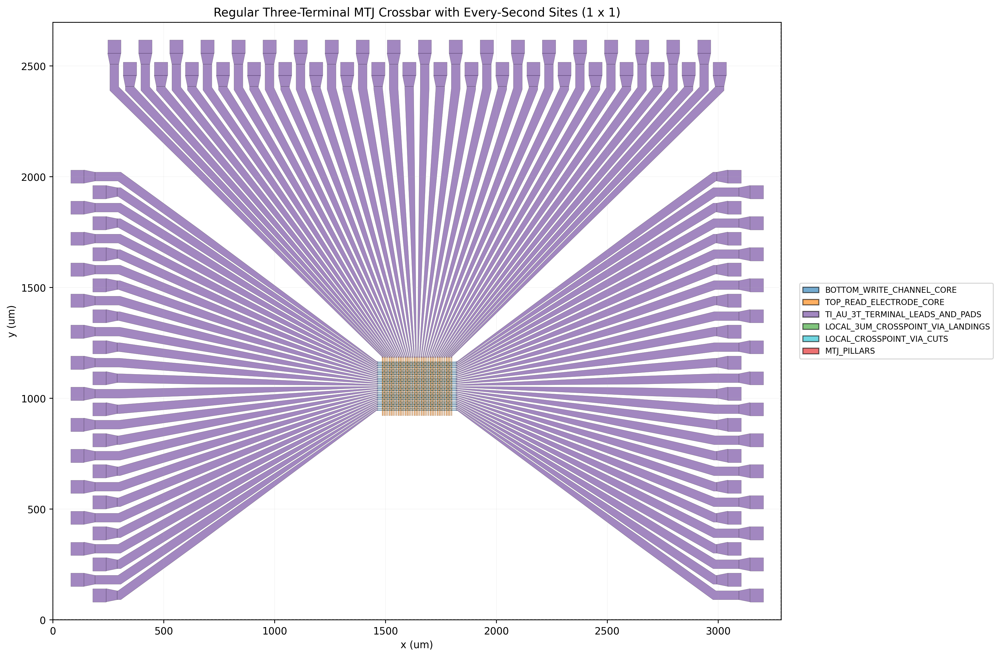

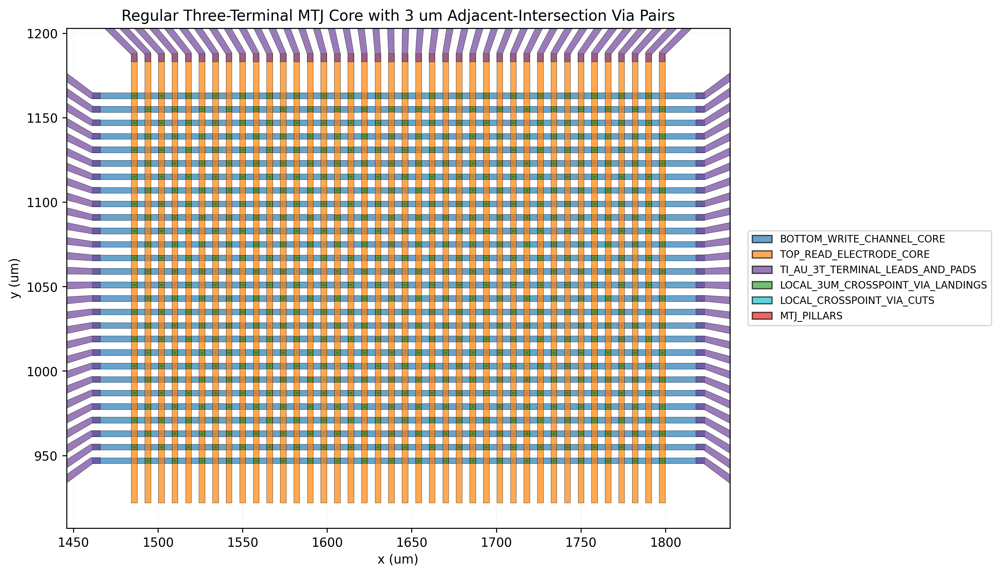

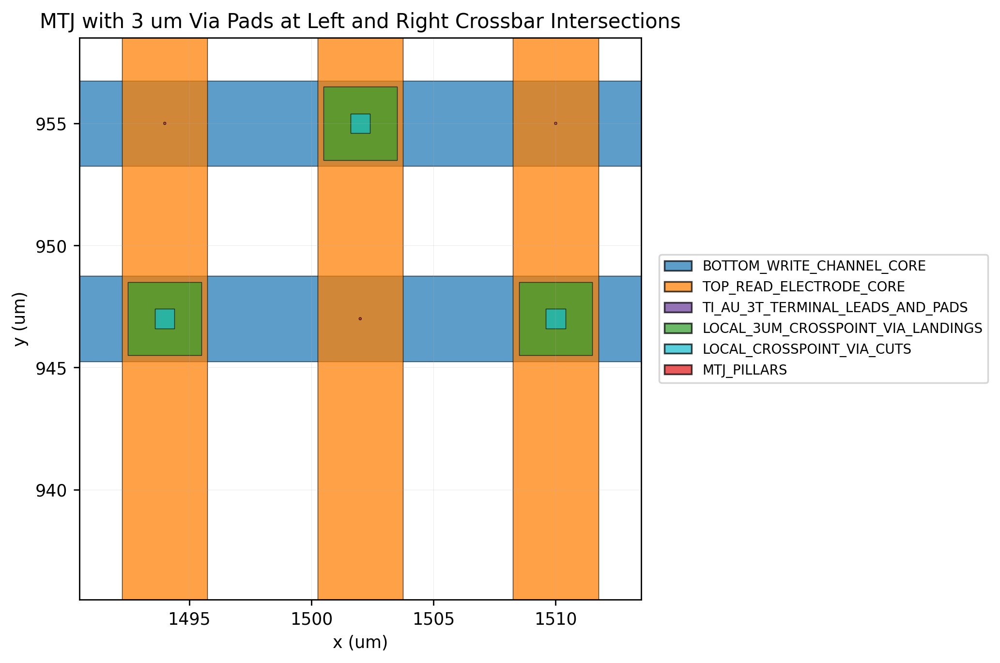

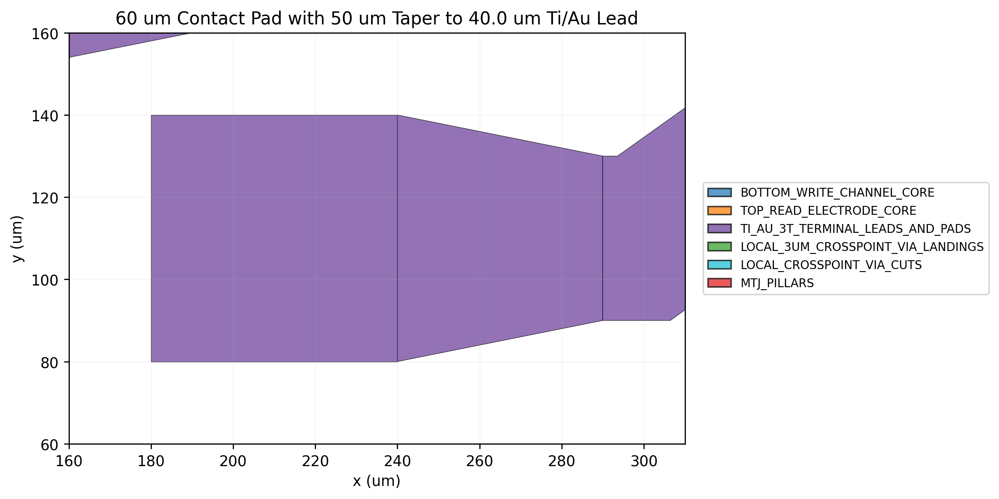

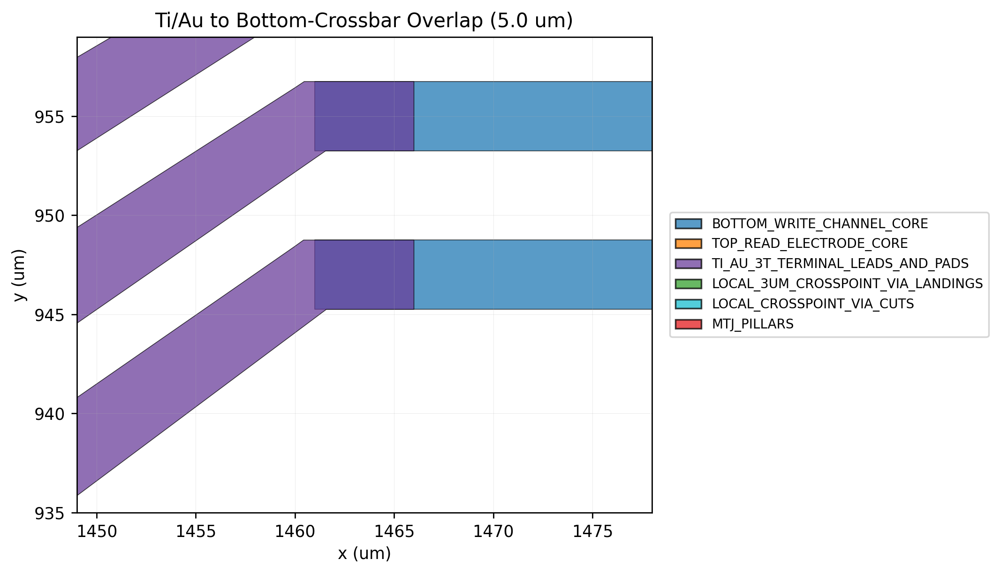

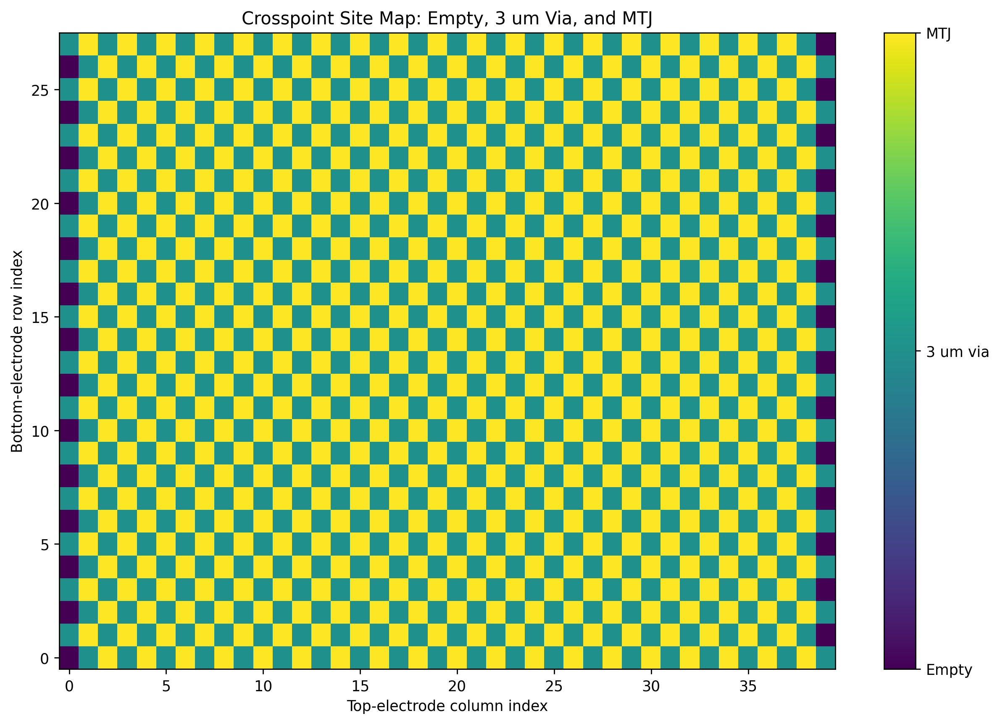

In [ ]:
"""Generate a regular three-terminal MTJ crossbar with 3 um crosspoint vias.

The layout uses an explicit rectangular grid. Horizontal bottom electrodes form
WRITE_A-to-WRITE_B channels, and vertical top electrodes form READ conductors.
MTJ pillars occupy every second crossbar intersection according to the selected
population rule.

Every generated MTJ uses the two neighboring crossbar intersections on its
horizontal row as local via sites. For an MTJ at row ``r`` and column ``c``, the
left via is centered exactly at ``(r, c - LOCAL_VIA_INTERSECTION_OFFSET)`` and
the right via is centered exactly at
``(r, c + LOCAL_VIA_INTERSECTION_OFFSET)``. The default offset is one
intersection. Each landing is a 3 micrometer by 3 micrometer square centered on
the planar overlap of the horizontal and vertical electrodes. Since each core
electrode is 3.5 micrometers wide, the default landing retains 0.25 micrometer
planar enclosure on every edge of the crosspoint.

MTJ sites at the outermost columns are omitted so every generated pillar has a
valid via intersection on both sides. Adjacent MTJs can share the intervening
via site. Shared via geometry is deduplicated in the exported mask, and every
MTJ assignment still references an ordered left and right via pair.

The perimeter network remains row shared. Every MTJ on row ``r`` shares the
external ``WRITE_A_Rr`` and ``WRITE_B_Rr`` pads, and every populated MTJ on
column ``c`` shares ``READ_Cc``. The GDS layers define planar mask geometry.
Which buried electrode a crosspoint via contacts is determined by the process
stack, dielectric openings, and etch sequence.

Long fanouts remain on the independent low-resistance Ti/Au layer. Each lead
overlaps its thin-film crossbar by 5 micrometers at the elbow, widens in
quantized stages as routing space opens, and is checked for same-layer spacing.
GDSTK constructs fixed-width and variable-width polygons. PHIDL builds the
hierarchy, renders notebook previews, and exports GDSII or OASIS.
"""

from __future__ import annotations

from dataclasses import dataclass
from itertools import pairwise
from pathlib import Path
from typing import Final, Literal

import gdstk
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import PolyCollection
from matplotlib.patches import Patch, Rectangle
from phidl import Device

###############################################################################
# Control knobs
###############################################################################

# Output controls. Leave OUTPUT_BASENAME as None for an automatic name.
OUTPUT_BASENAME: Final[str | None] = None
OUTPUT_FORMAT: Final[Literal["gds", "oas"]] = "oas"
OUTPUT_DIRECTORY: Final[Path] = Path.cwd()

# Regular crossbar grid. The defaults preserve the 28 x 40 conductor count and
# 8 um pitch associated with the previous n = 12 layout.
NUM_ROWS: Final[int] = 28
NUM_COLUMNS: Final[int] = 40
ROW_PITCH_UM: Final[float] = 8.000
COLUMN_PITCH_UM: Final[float] = 8.000

# MTJ population. "checkerboard" implements the requested every-second-site
# layout. "row_major_stride" selects every Nth flattened grid index. Edge
# columns that cannot support a via intersection on both sides are omitted.
PILLAR_POPULATION_MODE: Final[
    Literal["checkerboard", "row_major_stride", "all_crosspoints"]
] = "checkerboard"
INTERSECTION_PERIOD: Final[int] = 2
INTERSECTION_PHASE: Final[int] = 0

# Three-terminal network controls. The two ends of every horizontal bottom
# channel are WRITE_A and WRITE_B. One end of every vertical top conductor is
# the READ terminal. The auxiliary contact adds a second physical probe point
# to the same READ conductor.
TOP_READ_CONTACT_SIDE: Final[Literal["bottom", "top"]] = "top"
ENABLE_AUXILIARY_READ_CONTACT: Final[bool] = False
TERMINAL_MAP_PREVIEW_COUNT: Final[int] = 8

# Core crossbar geometry.
ELECTRODE_WIDTH_UM: Final[float] = 3.500
MINIMUM_TRACE_EDGE_GAP_UM: Final[float] = 0.500
CROSSBAR_TO_FANOUT_ELBOW_UM: Final[float] = 25.000
PATH_TOLERANCE_UM: Final[float] = 1.0e-3

# MTJ geometry.
PILLAR_DIAMETER_NM: Final[float] = 100.0
PILLAR_CIRCLE_POINTS: Final[int] = 256
ENABLE_PILLAR_DATABASE_GRID_SNAP: Final[bool] = True

# Local crosspoint via geometry. Each MTJ uses the neighboring crossbar
# intersection one column to its left and one column to its right. The square
# landing is centered on the full top-bottom electrode intersection.
LOCAL_VIA_INTERSECTION_OFFSET: Final[int] = 1
LOCAL_VIA_LANDING_SIZE_UM: Final[float] = 3.000
LOCAL_VIA_CUT_SIZE_UM: Final[float] = 0.800
MINIMUM_LOCAL_VIA_EDGE_GAP_UM: Final[float] = 0.250
REQUIRE_UNPOPULATED_VIA_SITES: Final[bool] = True
ENABLE_LOCAL_VIA_CUTS: Final[bool] = True

# Contact-pad geometry.
PAD_WIDTH_UM: Final[float] = 60.0
PAD_HEIGHT_UM: Final[float] = 60.0
PAD_EDGE_GAP_UM: Final[float] = 10.0
PAD_STAGGER_DEPTH_UM: Final[float] = 100.0

# Align the farthest outer edges of the bottom-write and enabled top-read pad
# banks to a common radius measured from the active crossbar center.
ALIGN_OUTERMOST_PAD_EDGES: Final[bool] = True
PAD_PERIMETER_EXTRA_RADIUS_UM: Final[float] = 0.0
PAD_EDGE_ALIGNMENT_TOLERANCE_UM: Final[float] = 1.0e-6

# Pad taper geometry.
PAD_TAPER_LENGTH_UM: Final[float] = 50.0
PAD_TAPER_NECK_LENGTH_UM: Final[float] = 10.0
MINIMUM_PAD_CLEARANCE_UM: Final[float] = 10.0

# Split-metal Ti/Au lead architecture.
CROSSBAR_LEAD_OVERLAP_UM: Final[float] = 5.0
LOW_RESISTANCE_LEAD_MAX_WIDTH_UM: Final[float] = 40.0
LOW_RESISTANCE_LEAD_EDGE_GAP_UM: Final[float] = 2.0
LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION: Final[float] = 0.90
LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM: Final[float] = 0.50
LOW_RESISTANCE_LEAD_STAGE_FRACTIONS: Final[tuple[float, ...]] = (
    0.00,
    0.05,
    0.12,
    0.25,
    0.45,
    0.70,
    1.00,
)
AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE: Final[bool] = True
LEAD_WIDTH_REDUCTION_FACTOR: Final[float] = 0.90
MAX_LEAD_WIDTH_REDUCTION_ITERATIONS: Final[int] = 12
LEAD_BOOLEAN_PRECISION_UM: Final[float] = 1.0e-3
LEAD_CLEARANCE_AREA_TOLERANCE_UM2: Final[float] = 1.0e-5

# Optional resistance estimate.
ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE: Final[float | None] = None

# Fanout controls.
AUTO_FANOUT_LENGTH: Final[bool] = True
MAX_FANOUT_ANGLE_DEG: Final[float] = 45.0
MIN_FANOUT_LENGTH_UM: Final[float] = 250.0
FIXED_FANOUT_LENGTH_UM: Final[float] = 500.0

# Unit-cell and XY-array controls.
ARRAY_SIZE_X: Final[int] = 1
ARRAY_SIZE_Y: Final[int] = 1
CELL_MARGIN_UM: Final[float] = 40.0
ARRAY_CELL_EDGE_GAP_X_UM: Final[float] = 100.0
ARRAY_CELL_EDGE_GAP_Y_UM: Final[float] = 100.0

# GDSII and OASIS database controls.
GDS_UNIT_M: Final[float] = 1.0e-6
GDS_PRECISION_M: Final[float] = 1.0e-10
GDS_INTEGER_COORDINATE_LIMIT: Final[int] = 2_000_000_000
OAS_CIRCLE_TOLERANCE_UM: Final[float] = 2.0e-4

# Notebook display controls.
DISPLAY_FULL_ARRAY: Final[bool] = True
DISPLAY_ACTIVE_CROSSBAR_ZOOM: Final[bool] = True
DISPLAY_FIRST_CROSSPOINT_DETAIL: Final[bool] = True
DISPLAY_FIRST_PAD_TAPER_DETAIL: Final[bool] = True
DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL: Final[bool] = True
DISPLAY_OCCUPANCY_MATRIX: Final[bool] = True
DOWNLOAD_AFTER_EXPORT_IN_COLAB: Final[bool] = False

PREVIEW_DPI: Final[int] = 250
PREVIEW_FIGSIZE_IN: Final[tuple[float, float]] = (13.0, 10.0)
PREVIEW_PADDING_UM: Final[float] = 80.0
PREVIEW_EDGE_LINEWIDTH: Final[float] = 0.16
PREVIEW_ALPHA: Final[float] = 0.62
CROSSBAR_ZOOM_PADDING_UM: Final[float] = 40.0
CROSSPOINT_DETAIL_HALF_WINDOW_UM: Final[float] = 11.5
PAD_TAPER_DETAIL_PADDING_UM: Final[float] = 20.0
OVERLAP_DETAIL_PADDING_UM: Final[float] = 12.0
SHOW_CELL_BOUNDARIES_IN_PREVIEW: Final[bool] = True
SHOW_PAD_LABELS_IN_PREVIEW: Final[bool] = False
PAD_LABEL_FONT_SIZE_PT: Final[float] = 4.5

DATABASE_GRID_UM: Final[float] = GDS_PRECISION_M / GDS_UNIT_M
DATABASE_GRID_NM: Final[float] = DATABASE_GRID_UM * 1.0e3

mpl.rcParams["figure.dpi"] = PREVIEW_DPI
mpl.rcParams["font.sans-serif"] = ["Tahoma", "DejaVu Sans"]
mpl.rcParams["font.weight"] = "normal"

Coordinate = tuple[float, float]
Polygon = list[Coordinate]
ElectrodeKind = Literal["bottom", "top"]
PadSide = Literal["left", "right", "bottom", "top"]
TerminalRole = Literal["write_a", "write_b", "read", "read_auxiliary"]


@dataclass(frozen=True)
class LayerSpec:
    """Describe one exported and previewed layout layer."""

    name: str
    layer: int
    datatype: int
    color: str


@dataclass(frozen=True)
class BoundingBox:
    """Store an axis-aligned bounding box in micrometers."""

    xmin: float
    ymin: float
    xmax: float
    ymax: float

    @property
    def width(self) -> float:
        """Return the bounding-box width."""
        return self.xmax - self.xmin

    @property
    def height(self) -> float:
        """Return the bounding-box height."""
        return self.ymax - self.ymin

    def translated(self, shift: Coordinate) -> "BoundingBox":
        """Return a translated copy of the bounding box."""
        return BoundingBox(
            xmin=self.xmin + shift[0],
            ymin=self.ymin + shift[1],
            xmax=self.xmax + shift[0],
            ymax=self.ymax + shift[1],
        )


@dataclass(frozen=True)
class PadTerminal:
    """Describe one rectangular Ti/Au perimeter terminal pad."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    center: Coordinate
    width_um: float
    height_um: float
    lead_width_um: float

    @property
    def bounds(self) -> BoundingBox:
        """Return the pad rectangle bounds."""
        half_width = 0.5 * self.width_um
        half_height = 0.5 * self.height_um
        return BoundingBox(
            xmin=self.center[0] - half_width,
            ymin=self.center[1] - half_height,
            xmax=self.center[0] + half_width,
            ymax=self.center[1] + half_height,
        )


@dataclass(frozen=True)
class RoutedTrace:
    """Describe one fixed-width main crossbar conductor."""

    name: str
    electrode: ElectrodeKind
    conductor_index: int
    axis_coordinate_um: float
    centerline_points: tuple[Coordinate, ...]


@dataclass(frozen=True)
class VariableWidthLead:
    """Describe one variable-width Ti/Au pad-to-crossbar lead."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    centerline_points: tuple[Coordinate, ...]
    widths_um: tuple[float, ...]

    def __post_init__(self) -> None:
        """Validate point and width cardinality."""
        if len(self.centerline_points) < 2:
            raise ValueError("A Ti/Au lead requires at least two points.")
        if len(self.centerline_points) != len(self.widths_um):
            raise ValueError(
                "A Ti/Au lead requires one width value per centerline point."
            )
        if any(width <= 0.0 for width in self.widths_um):
            raise ValueError("Every Ti/Au lead width must be positive.")

    @property
    def terminal_width_um(self) -> float:
        """Return the width meeting the pad taper tip."""
        return self.widths_um[-1]


@dataclass(frozen=True)
class LeadClearanceResult:
    """Store the result of a Ti/Au same-layer clearance check."""

    is_valid: bool
    message: str


@dataclass(frozen=True)
class LocalViaPad:
    """Describe one unique square via landing centered on a crosspoint."""

    name: str
    row_index: int
    column_index: int
    center: Coordinate
    associated_pillar_indices: tuple[int, ...]
    landing_size_um: float
    cut_size_um: float

    @property
    def landing_bounds(self) -> BoundingBox:
        """Return square landing-pad bounds."""
        half_size = 0.5 * self.landing_size_um
        return BoundingBox(
            xmin=self.center[0] - half_size,
            ymin=self.center[1] - half_size,
            xmax=self.center[0] + half_size,
            ymax=self.center[1] + half_size,
        )

    @property
    def cut_bounds(self) -> BoundingBox:
        """Return centered square via-cut bounds."""
        half_size = 0.5 * self.cut_size_um
        return BoundingBox(
            xmin=self.center[0] - half_size,
            ymin=self.center[1] - half_size,
            xmax=self.center[0] + half_size,
            ymax=self.center[1] + half_size,
        )

    def translated(self, shift: Coordinate) -> "LocalViaPad":
        """Return a translated local via pad."""
        return LocalViaPad(
            name=self.name,
            row_index=self.row_index,
            column_index=self.column_index,
            center=(self.center[0] + shift[0], self.center[1] + shift[1]),
            associated_pillar_indices=self.associated_pillar_indices,
            landing_size_um=self.landing_size_um,
            cut_size_um=self.cut_size_um,
        )


@dataclass(frozen=True)
class ThreeTerminalAssignment:
    """Map one MTJ to shared terminals and its local via landing names."""

    pillar_index: int
    row_index: int
    column_index: int
    center: Coordinate
    write_a_pad_name: str
    write_b_pad_name: str
    read_pad_name: str
    local_via_pad_names: tuple[str, ...]


@dataclass(frozen=True)
class CrossbarGeometry:
    """Store generated unit-cell geometry and topology metadata."""

    populated_crosspoint_indices: tuple[tuple[int, int], ...]
    row_coordinates_um: tuple[float, ...]
    column_coordinates_um: tuple[float, ...]
    pillar_centers: tuple[Coordinate, ...]
    local_via_pads: tuple[LocalViaPad, ...]
    terminal_assignments: tuple[ThreeTerminalAssignment, ...]
    bottom_routes: tuple[RoutedTrace, ...]
    top_routes: tuple[RoutedTrace, ...]
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    crossbar_bounds: BoundingBox
    routing_transition_bounds: BoundingBox
    bounds: BoundingBox
    row_fanout_length_um: float
    column_fanout_length_um: float
    maximum_row_fanout_angle_deg: float
    maximum_column_fanout_angle_deg: float
    bottom_pad_outer_edge_radius_um: float
    top_pad_outer_edge_radius_um: float
    bottom_pad_alignment_extension_um: float
    top_pad_alignment_extension_um: float
    bottom_lead_width_profile_um: tuple[float, ...]
    top_lead_width_profile_um: tuple[float, ...]
    lead_width_scale: float


LAYERS: Final[dict[str, LayerSpec]] = {
    "BOTTOM_ELECTRODE": LayerSpec(
        name="BOTTOM_WRITE_CHANNEL_CORE",
        layer=2,
        datatype=0,
        color="#1f78b4",
    ),
    "MTJ_PILLARS": LayerSpec(
        name="MTJ_PILLARS",
        layer=3,
        datatype=0,
        color="#e31a1c",
    ),
    "TOP_ELECTRODE": LayerSpec(
        name="TOP_READ_ELECTRODE_CORE",
        layer=4,
        datatype=0,
        color="#ff7f00",
    ),
    "TI_AU_LEADS": LayerSpec(
        name="TI_AU_3T_TERMINAL_LEADS_AND_PADS",
        layer=5,
        datatype=0,
        color="#6a3d9a",
    ),
    "LOCAL_VIA_LANDINGS": LayerSpec(
        name="LOCAL_3UM_CROSSPOINT_VIA_LANDINGS",
        layer=6,
        datatype=0,
        color="#33a02c",
    ),
    "LOCAL_VIA_CUTS": LayerSpec(
        name="LOCAL_CROSSPOINT_VIA_CUTS",
        layer=7,
        datatype=0,
        color="#17becf",
    ),
}


def validate_control_knobs() -> None:
    """Validate all user-adjustable geometry and database controls."""
    if NUM_ROWS < 1 or NUM_COLUMNS < 1:
        raise ValueError("NUM_ROWS and NUM_COLUMNS must be at least 1.")
    if ROW_PITCH_UM <= 0.0 or COLUMN_PITCH_UM <= 0.0:
        raise ValueError("ROW_PITCH_UM and COLUMN_PITCH_UM must be positive.")
    if PILLAR_POPULATION_MODE not in {
        "checkerboard",
        "row_major_stride",
        "all_crosspoints",
    }:
        raise ValueError("Unsupported PILLAR_POPULATION_MODE.")
    if INTERSECTION_PERIOD < 1:
        raise ValueError("INTERSECTION_PERIOD must be at least 1.")
    if not 0 <= INTERSECTION_PHASE < INTERSECTION_PERIOD:
        raise ValueError(
            "INTERSECTION_PHASE must lie in [0, INTERSECTION_PERIOD)."
        )
    if TOP_READ_CONTACT_SIDE not in {"bottom", "top"}:
        raise ValueError("TOP_READ_CONTACT_SIDE must be 'bottom' or 'top'.")
    if TERMINAL_MAP_PREVIEW_COUNT < 0:
        raise ValueError("TERMINAL_MAP_PREVIEW_COUNT must be nonnegative.")
    if CROSSBAR_TO_FANOUT_ELBOW_UM <= 0.0:
        raise ValueError("CROSSBAR_TO_FANOUT_ELBOW_UM must be positive.")
    if ELECTRODE_WIDTH_UM <= 0.0:
        raise ValueError("ELECTRODE_WIDTH_UM must be positive.")
    required_pitch_um = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if ROW_PITCH_UM + 1.0e-12 < required_pitch_um:
        raise ValueError(
            "ROW_PITCH_UM must exceed the electrode width plus the trace gap."
        )
    if COLUMN_PITCH_UM + 1.0e-12 < required_pitch_um:
        raise ValueError(
            "COLUMN_PITCH_UM must exceed the electrode width plus the trace gap."
        )
    if PATH_TOLERANCE_UM <= 0.0:
        raise ValueError("PATH_TOLERANCE_UM must be positive.")
    if PILLAR_DIAMETER_NM <= 0.0:
        raise ValueError("PILLAR_DIAMETER_NM must be positive.")
    if PILLAR_CIRCLE_POINTS < 32:
        raise ValueError("PILLAR_CIRCLE_POINTS must be at least 32.")
    if PILLAR_DIAMETER_NM * 1.0e-3 > ELECTRODE_WIDTH_UM:
        raise ValueError("The MTJ pillar must fit inside the electrode width.")

    if LOCAL_VIA_INTERSECTION_OFFSET < 1:
        raise ValueError("LOCAL_VIA_INTERSECTION_OFFSET must be at least 1.")
    minimum_column_count = 2 * LOCAL_VIA_INTERSECTION_OFFSET + 1
    if NUM_COLUMNS < minimum_column_count:
        raise ValueError(
            "NUM_COLUMNS must provide a left and right via intersection for "
            "each generated MTJ."
        )
    if LOCAL_VIA_LANDING_SIZE_UM <= 0.0:
        raise ValueError("LOCAL_VIA_LANDING_SIZE_UM must be positive.")
    if LOCAL_VIA_CUT_SIZE_UM <= 0.0:
        raise ValueError("LOCAL_VIA_CUT_SIZE_UM must be positive.")
    if LOCAL_VIA_CUT_SIZE_UM > LOCAL_VIA_LANDING_SIZE_UM:
        raise ValueError("The via cut must fit inside its square landing pad.")
    if LOCAL_VIA_LANDING_SIZE_UM > ELECTRODE_WIDTH_UM:
        raise ValueError(
            "The local via landing must fit within the planar top-bottom "
            "electrode intersection."
        )
    if MINIMUM_LOCAL_VIA_EDGE_GAP_UM < 0.0:
        raise ValueError("MINIMUM_LOCAL_VIA_EDGE_GAP_UM must be nonnegative.")
    if (
        REQUIRE_UNPOPULATED_VIA_SITES
        and PILLAR_POPULATION_MODE == "all_crosspoints"
    ):
        raise ValueError(
            "all_crosspoints is incompatible with unpopulated adjacent via "
            "sites. Use checkerboard or row_major_stride."
        )

    if PAD_WIDTH_UM <= 0.0 or PAD_HEIGHT_UM <= 0.0:
        raise ValueError("PAD_WIDTH_UM and PAD_HEIGHT_UM must be positive.")
    if PAD_EDGE_GAP_UM < 0.0:
        raise ValueError("PAD_EDGE_GAP_UM must be nonnegative.")
    if PAD_STAGGER_DEPTH_UM < 0.0:
        raise ValueError("PAD_STAGGER_DEPTH_UM must be nonnegative.")
    if PAD_PERIMETER_EXTRA_RADIUS_UM < 0.0:
        raise ValueError("PAD_PERIMETER_EXTRA_RADIUS_UM must be nonnegative.")
    if PAD_EDGE_ALIGNMENT_TOLERANCE_UM <= 0.0:
        raise ValueError("PAD_EDGE_ALIGNMENT_TOLERANCE_UM must be positive.")
    if PAD_TAPER_LENGTH_UM <= 0.0:
        raise ValueError("PAD_TAPER_LENGTH_UM must be positive.")
    if PAD_TAPER_NECK_LENGTH_UM < 0.0:
        raise ValueError("PAD_TAPER_NECK_LENGTH_UM must be nonnegative.")
    if MINIMUM_PAD_CLEARANCE_UM < 0.0:
        raise ValueError("MINIMUM_PAD_CLEARANCE_UM must be nonnegative.")

    minimum_corner_offset_um = (
        ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    ) / np.sqrt(2.0)
    if CROSSBAR_TO_FANOUT_ELBOW_UM < minimum_corner_offset_um:
        raise ValueError(
            "CROSSBAR_TO_FANOUT_ELBOW_UM is too short for finite-width "
            f"corner clearance. Use at least {minimum_corner_offset_um:.3f} um."
        )
    if CROSSBAR_LEAD_OVERLAP_UM <= 0.0:
        raise ValueError("CROSSBAR_LEAD_OVERLAP_UM must be positive.")
    if CROSSBAR_LEAD_OVERLAP_UM >= CROSSBAR_TO_FANOUT_ELBOW_UM:
        raise ValueError(
            "CROSSBAR_LEAD_OVERLAP_UM must remain smaller than the elbow offset."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM < ELECTRODE_WIDTH_UM:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_MAX_WIDTH_UM must reach the crossbar width."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM > min(PAD_WIDTH_UM, PAD_HEIGHT_UM):
        raise ValueError("The maximum Ti/Au lead width must fit in each pad.")
    if LOW_RESISTANCE_LEAD_EDGE_GAP_UM < 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_EDGE_GAP_UM must be nonnegative.")
    if not 0.0 < LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION <= 1.0:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION must lie in (0, 1]."
        )
    if LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM <= 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM must be positive.")
    fractions = LOW_RESISTANCE_LEAD_STAGE_FRACTIONS
    if len(fractions) < 2:
        raise ValueError("At least two lead-profile fractions are required.")
    if not np.isclose(fractions[0], 0.0) or not np.isclose(fractions[-1], 1.0):
        raise ValueError("Lead-profile fractions must begin at 0 and end at 1.")
    if any(later <= earlier for earlier, later in pairwise(fractions)):
        raise ValueError("Lead-profile fractions must be strictly increasing.")
    if not 0.0 < LEAD_WIDTH_REDUCTION_FACTOR < 1.0:
        raise ValueError("LEAD_WIDTH_REDUCTION_FACTOR must lie between 0 and 1.")
    if MAX_LEAD_WIDTH_REDUCTION_ITERATIONS < 1:
        raise ValueError(
            "MAX_LEAD_WIDTH_REDUCTION_ITERATIONS must be at least 1."
        )
    if LEAD_BOOLEAN_PRECISION_UM <= 0.0:
        raise ValueError("LEAD_BOOLEAN_PRECISION_UM must be positive.")
    if LEAD_CLEARANCE_AREA_TOLERANCE_UM2 < 0.0:
        raise ValueError("LEAD_CLEARANCE_AREA_TOLERANCE_UM2 must be nonnegative.")
    if (
        ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None
        and ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE <= 0.0
    ):
        raise ValueError(
            "ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE must be positive "
            "or None."
        )

    if not 0.0 < MAX_FANOUT_ANGLE_DEG < 89.0:
        raise ValueError("MAX_FANOUT_ANGLE_DEG must lie between 0 and 89.")
    if MIN_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("MIN_FANOUT_LENGTH_UM must be positive.")
    if FIXED_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("FIXED_FANOUT_LENGTH_UM must be positive.")
    if ARRAY_SIZE_X < 1 or ARRAY_SIZE_Y < 1:
        raise ValueError("ARRAY_SIZE_X and ARRAY_SIZE_Y must be at least 1.")
    if CELL_MARGIN_UM < 0.0:
        raise ValueError("CELL_MARGIN_UM must be nonnegative.")
    if ARRAY_CELL_EDGE_GAP_X_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_X_UM must be positive.")
    if ARRAY_CELL_EDGE_GAP_Y_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_Y_UM must be positive.")
    if GDS_PRECISION_M <= 0.0 or GDS_UNIT_M <= 0.0:
        raise ValueError("GDS unit and precision values must be positive.")


def centered_axis_coordinates(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return a centered regular axis with the requested count and pitch."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")
    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))


def selected_crosspoint_indices() -> tuple[tuple[int, int], ...]:
    """Return MTJ intersections with room for a via site on both sides."""
    selected: list[tuple[int, int]] = []
    first_allowed_column = LOCAL_VIA_INTERSECTION_OFFSET
    stop_column = NUM_COLUMNS - LOCAL_VIA_INTERSECTION_OFFSET

    for row_index in range(NUM_ROWS):
        for column_index in range(first_allowed_column, stop_column):
            if PILLAR_POPULATION_MODE == "all_crosspoints":
                selected.append((row_index, column_index))
                continue

            if PILLAR_POPULATION_MODE == "checkerboard":
                logical_index = row_index + column_index
            else:
                logical_index = row_index * NUM_COLUMNS + column_index

            if logical_index % INTERSECTION_PERIOD == INTERSECTION_PHASE:
                selected.append((row_index, column_index))

    if len(selected) == 0:
        raise ValueError("The selected intersection rule produced no MTJ sites.")
    return tuple(selected)


def build_local_via_pads(
    rows: tuple[float, ...],
    columns: tuple[float, ...],
    populated_indices: tuple[tuple[int, int], ...],
) -> tuple[LocalViaPad, ...]:
    """Create deduplicated 3 um pads at adjacent crossbar intersections."""
    associations: dict[tuple[int, int], set[int]] = {}
    populated_set = set(populated_indices)

    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        neighbor_columns = (
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        for via_column_index in neighbor_columns:
            if not 0 <= via_column_index < len(columns):
                raise ValueError(
                    f"Pillar {pillar_index} lacks a via intersection on both sides."
                )
            via_site = (row_index, via_column_index)
            if REQUIRE_UNPOPULATED_VIA_SITES and via_site in populated_set:
                raise ValueError(
                    "A requested local via site is also populated by an MTJ. "
                    "Use an alternating population rule or disable "
                    "REQUIRE_UNPOPULATED_VIA_SITES."
                )
            associations.setdefault(via_site, set()).add(pillar_index)

    return tuple(
        LocalViaPad(
            name=f"LOCAL_VIA_XPT_R{row_index:03d}_C{column_index:03d}",
            row_index=row_index,
            column_index=column_index,
            center=(columns[column_index], rows[row_index]),
            associated_pillar_indices=tuple(sorted(pillar_indices)),
            landing_size_um=LOCAL_VIA_LANDING_SIZE_UM,
            cut_size_um=LOCAL_VIA_CUT_SIZE_UM,
        )
        for (row_index, column_index), pillar_indices in sorted(
            associations.items()
        )
    )


def local_via_names_by_pillar(
    local_via_pads: tuple[LocalViaPad, ...],
    populated_indices: tuple[tuple[int, int], ...],
) -> dict[int, tuple[str, str]]:
    """Return ordered left and right via names for every MTJ."""
    via_by_site = {
        (via.row_index, via.column_index): via.name for via in local_via_pads
    }
    names_by_pillar: dict[int, tuple[str, str]] = {}

    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        left_site = (
            row_index,
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
        )
        right_site = (
            row_index,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        names_by_pillar[pillar_index] = (
            via_by_site[left_site],
            via_by_site[right_site],
        )

    return names_by_pillar


def centered_slot_positions(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return evenly spaced pad-bank positions centered about zero."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")

    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))

def compute_fanout_length(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
) -> tuple[float, float]:
    """Compute a fanout run and its resulting maximum route angle.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.

    Returns:
        Fanout length and maximum absolute fanout angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))

    if AUTO_FANOUT_LENGTH:
        maximum_angle_rad = np.deg2rad(MAX_FANOUT_ANGLE_DEG)
        angular_length_um = maximum_displacement_um / np.tan(maximum_angle_rad)
        fanout_length_um = max(MIN_FANOUT_LENGTH_UM, angular_length_um)
    else:
        fanout_length_um = FIXED_FANOUT_LENGTH_UM

    resulting_angle_deg = float(
        np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um))
    )
    return fanout_length_um, resulting_angle_deg

def maximum_fanout_angle(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    fanout_length_um: float,
) -> float:
    """Return the maximum route angle for a prescribed fanout length.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.
        fanout_length_um: Outward fanout run in micrometers.

    Returns:
        Maximum absolute route angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))
    return float(np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um)))

def predicted_pad_outer_edge_radius(
    elbow_radius_um: float,
    fanout_length_um: float,
    outward_pad_dimension_um: float,
) -> float:
    """Return the farthest staggered pad-edge radius from the origin.

    Args:
        elbow_radius_um: Radial distance from the origin to the fanout elbow.
        fanout_length_um: Outward run from the elbow to the fanout anchor.
        outward_pad_dimension_um: Pad dimension along the outward direction.

    Returns:
        Farthest pad-edge radius in micrometers.
    """
    if elbow_radius_um < 0.0:
        raise ValueError("elbow_radius_um must be nonnegative.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")
    if outward_pad_dimension_um <= 0.0:
        raise ValueError("outward_pad_dimension_um must be positive.")

    return (
        elbow_radius_um
        + fanout_length_um
        + PAD_TAPER_NECK_LENGTH_UM
        + PAD_TAPER_LENGTH_UM
        + outward_pad_dimension_um
        + PAD_STAGGER_DEPTH_UM
    )

def quantize_width_down(width_um: float) -> float:
    """Quantize a width downward to the configured fabrication increment."""
    quantum_um = LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM
    quantized = np.floor(width_um / quantum_um + 1.0e-12) * quantum_um
    return float(max(ELECTRODE_WIDTH_UM, quantized))

def compute_adaptive_lead_width_profile(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    maximum_fanout_angle_deg: float,
) -> tuple[float, ...]:
    """Compute a monotonic Ti/Au width profile from local route spacing.

    Each profile station follows the normalized fanout coordinate from the
    crossbar elbow to the outer routing anchor. The local centerline spacing is
    projected conservatively onto a route-normal direction using the maximum
    family fanout angle. A utilization factor and width quantization leave
    process margin beyond the requested same-layer edge clearance.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    conductor_array = np.asarray(conductor_coordinates_um, dtype=float)
    pad_slot_array = np.asarray(pad_slot_coordinates_um, dtype=float)
    projection_factor = float(np.cos(np.deg2rad(maximum_fanout_angle_deg)))

    widths_um: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for fraction in LOW_RESISTANCE_LEAD_STAGE_FRACTIONS:
        interpolated_coordinates = (
            1.0 - fraction
        ) * conductor_array + fraction * pad_slot_array
        if len(interpolated_coordinates) < 2:
            minimum_spacing_um = float("inf")
        else:
            minimum_spacing_um = float(np.min(np.diff(interpolated_coordinates)))

        projected_spacing_um = minimum_spacing_um * projection_factor
        available_width_um = projected_spacing_um - LOW_RESISTANCE_LEAD_EDGE_GAP_UM
        target_width_um = min(
            LOW_RESISTANCE_LEAD_MAX_WIDTH_UM,
            LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION * available_width_um,
        )
        width_um = quantize_width_down(target_width_um)
        width_um = max(previous_width_um, width_um)
        widths_um.append(width_um)
        previous_width_um = width_um

    widths_um[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in widths_um)

def scale_lead_width_profile(
    nominal_profile_um: tuple[float, ...],
    scale: float,
) -> tuple[float, ...]:
    """Scale profile widening above the crossbar width and requantize it."""
    if not 0.0 <= scale <= 1.0:
        raise ValueError("Lead width scale must lie between 0 and 1.")

    scaled_widths: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for nominal_width_um in nominal_profile_um:
        expanded_width_um = ELECTRODE_WIDTH_UM + scale * (
            nominal_width_um - ELECTRODE_WIDTH_UM
        )
        width_um = quantize_width_down(expanded_width_um)
        width_um = max(previous_width_um, width_um)
        scaled_widths.append(width_um)
        previous_width_um = width_um

    scaled_widths[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in scaled_widths)

def interpolate_coordinate(
    start: Coordinate,
    end: Coordinate,
    fraction: float,
) -> Coordinate:
    """Linearly interpolate between two coordinates."""
    return (
        start[0] + fraction * (end[0] - start[0]),
        start[1] + fraction * (end[1] - start[1]),
    )

def make_variable_width_path(lead: VariableWidthLead) -> gdstk.RobustPath:
    """Construct a GDSTK RobustPath for one Ti/Au lead."""
    path = gdstk.RobustPath(
        lead.centerline_points[0],
        lead.widths_um[0],
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for endpoint, width_um in zip(
        lead.centerline_points[1:],
        lead.widths_um[1:],
        strict=True,
    ):
        path.segment(endpoint, width=(width_um, "linear"))
    return path

def variable_width_lead_polygons(
    lead: VariableWidthLead,
) -> list[gdstk.Polygon]:
    """Return polygonal contours for one variable-width lead."""
    return make_variable_width_path(lead).to_polygons()

def remove_adjacent_duplicate_points(
    points: tuple[Coordinate, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[Coordinate, ...]:
    """Remove adjacent duplicate vertices from a routed centerline."""
    if len(points) == 0:
        return tuple()

    pruned = [points[0]]
    for point in points[1:]:
        previous = pruned[-1]
        if np.hypot(point[0] - previous[0], point[1] - previous[1]) <= tolerance_um:
            continue
        pruned.append(point)

    return tuple(pruned)

def remove_adjacent_duplicate_profile_points(
    points: tuple[Coordinate, ...],
    widths_um: tuple[float, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[tuple[Coordinate, ...], tuple[float, ...]]:
    """Prune duplicate profile vertices while preserving endpoint widths."""
    if len(points) != len(widths_um):
        raise ValueError("Profile points and widths must have equal lengths.")
    if len(points) == 0:
        return tuple(), tuple()

    pruned_points = [points[0]]
    pruned_widths = [widths_um[0]]
    for point, width_um in zip(points[1:], widths_um[1:], strict=True):
        previous = pruned_points[-1]
        separation_um = float(np.hypot(point[0] - previous[0], point[1] - previous[1]))
        if separation_um <= tolerance_um:
            pruned_widths[-1] = max(pruned_widths[-1], width_um)
            continue
        pruned_points.append(point)
        pruned_widths.append(width_um)

    return tuple(pruned_points), tuple(pruned_widths)

def translate_coordinate(
    coordinate: Coordinate,
    shift: Coordinate,
) -> Coordinate:
    """Translate one coordinate."""
    return coordinate[0] + shift[0], coordinate[1] + shift[1]

def translate_trace(trace: RoutedTrace, shift: Coordinate) -> RoutedTrace:
    """Translate one fixed-width main crossbar conductor."""
    axis_coordinate = trace.axis_coordinate_um
    if trace.electrode == "bottom":
        axis_coordinate += shift[1]
    else:
        axis_coordinate += shift[0]

    return RoutedTrace(
        name=trace.name,
        electrode=trace.electrode,
        conductor_index=trace.conductor_index,
        axis_coordinate_um=axis_coordinate,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in trace.centerline_points
        ),
    )

def translate_variable_width_lead(
    lead: VariableWidthLead,
    shift: Coordinate,
) -> VariableWidthLead:
    """Translate one variable-width Ti/Au lead."""
    return VariableWidthLead(
        name=lead.name,
        electrode=lead.electrode,
        side=lead.side,
        conductor_index=lead.conductor_index,
        terminal_role=lead.terminal_role,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in lead.centerline_points
        ),
        widths_um=lead.widths_um,
    )

def translate_pad(pad: PadTerminal, shift: Coordinate) -> PadTerminal:
    """Translate one Ti/Au contact pad."""
    return PadTerminal(
        name=pad.name,
        electrode=pad.electrode,
        side=pad.side,
        conductor_index=pad.conductor_index,
        terminal_role=pad.terminal_role,
        center=translate_coordinate(pad.center, shift),
        width_um=pad.width_um,
        height_um=pad.height_um,
        lead_width_um=pad.lead_width_um,
    )

def translate_local_via_pad(
    via_pad: LocalViaPad,
    shift: Coordinate,
) -> LocalViaPad:
    """Translate one local square via pad."""
    return via_pad.translated(shift)


def pad_taper_tip(pad: PadTerminal) -> Coordinate:
    """Return the center of the narrow electrode-width taper end.

    Args:
        pad: Contact pad whose taper points inward toward the crossbar.

    Returns:
        Center coordinate of the taper tip.
    """
    if pad.side == "left":
        return pad.bounds.xmax + PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "right":
        return pad.bounds.xmin - PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "bottom":
        return pad.center[0], pad.bounds.ymax + PAD_TAPER_LENGTH_UM
    if pad.side == "top":
        return pad.center[0], pad.bounds.ymin - PAD_TAPER_LENGTH_UM
    raise ValueError(f"Unsupported pad side: {pad.side!r}")

def pad_taper_polygon(pad: PadTerminal) -> Polygon:
    """Return a full-pad-edge taper to the adaptive Ti/Au lead width."""
    half_lead_width = 0.5 * pad.lead_width_um
    tip_x, tip_y = pad_taper_tip(pad)

    if pad.side == "left":
        base_x = pad.bounds.xmax
        return [
            (base_x, pad.bounds.ymin),
            (base_x, pad.bounds.ymax),
            (tip_x, tip_y + half_lead_width),
            (tip_x, tip_y - half_lead_width),
        ]
    if pad.side == "right":
        base_x = pad.bounds.xmin
        return [
            (base_x, pad.bounds.ymin),
            (tip_x, tip_y - half_lead_width),
            (tip_x, tip_y + half_lead_width),
            (base_x, pad.bounds.ymax),
        ]
    if pad.side == "bottom":
        base_y = pad.bounds.ymax
        return [
            (pad.bounds.xmin, base_y),
            (pad.bounds.xmax, base_y),
            (tip_x + half_lead_width, tip_y),
            (tip_x - half_lead_width, tip_y),
        ]
    if pad.side == "top":
        base_y = pad.bounds.ymin
        return [
            (pad.bounds.xmin, base_y),
            (tip_x - half_lead_width, tip_y),
            (tip_x + half_lead_width, tip_y),
            (pad.bounds.xmax, base_y),
        ]
    raise ValueError(f"Unsupported pad side: {pad.side!r}")

def polygon_bounds(polygon: Polygon) -> BoundingBox:
    """Return an axis-aligned bounding box for a polygon."""
    if len(polygon) < 3:
        raise ValueError("A polygon must contain at least three vertices.")
    vertices = np.asarray(polygon, dtype=float)
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )

def minimum_axis_spacing(coordinates: tuple[float, ...]) -> float:
    """Return the minimum spacing between sorted axis coordinates."""
    if len(coordinates) < 2:
        return float("inf")
    differences = np.diff(np.asarray(coordinates, dtype=float))
    return float(np.min(differences))

def validate_axis_trace_clearance(
    coordinates: tuple[float, ...],
    axis_name: str,
) -> None:
    """Verify that adjacent parallel traces retain the requested edge gap."""
    minimum_center_spacing = minimum_axis_spacing(coordinates)
    required_center_spacing = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if minimum_center_spacing + 1.0e-12 < required_center_spacing:
        raise ValueError(
            f"Adjacent {axis_name} conductors are only "
            f"{minimum_center_spacing:.6f} um apart. At least "
            f"{required_center_spacing:.6f} um is required."
        )

def rectangles_have_clearance(
    first: BoundingBox,
    second: BoundingBox,
    clearance_um: float,
) -> bool:
    """Return whether two rectangles are separated by the given clearance."""
    separated_in_x = (
        first.xmax + clearance_um <= second.xmin
        or second.xmax + clearance_um <= first.xmin
    )
    separated_in_y = (
        first.ymax + clearance_um <= second.ymin
        or second.ymax + clearance_um <= first.ymin
    )
    return separated_in_x or separated_in_y

def validate_pad_clearance(pads: tuple[PadTerminal, ...]) -> None:
    """Verify that no two contact pads touch or violate pad clearance."""
    for first_index, first_pad in enumerate(pads):
        for second_pad in pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_pad.bounds,
                second_pad.bounds,
                MINIMUM_PAD_CLEARANCE_UM,
            ):
                continue
            raise ValueError(
                "Contact-pad clearance violation between "
                f"{first_pad.name} and {second_pad.name}. Increase "
                "PAD_EDGE_GAP_UM, PAD_STAGGER_DEPTH_UM, or "
                "MIN_FANOUT_LENGTH_UM."
            )

def rectangle_gdstk_polygon(bounds: BoundingBox) -> gdstk.Polygon:
    """Return a GDSTK rectangle polygon from a bounding box."""
    return gdstk.rectangle(
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymax),
    )

def polygon_collection_bounds(
    polygons: list[gdstk.Polygon],
) -> BoundingBox:
    """Return the bounding box of a nonempty GDSTK polygon collection."""
    if len(polygons) == 0:
        raise ValueError("A nonempty polygon collection is required.")
    vertices = np.vstack(
        [np.asarray(polygon.points, dtype=float) for polygon in polygons]
    )
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )

def bounding_boxes_overlap(first: BoundingBox, second: BoundingBox) -> bool:
    """Return whether two bounding boxes overlap with positive area."""
    return not (
        first.xmax <= second.xmin
        or second.xmax <= first.xmin
        or first.ymax <= second.ymin
        or second.ymax <= first.ymin
    )

def polygon_intersection_area(
    first: list[gdstk.Polygon],
    second: list[gdstk.Polygon],
) -> float:
    """Return the Boolean intersection area of two polygon collections."""
    intersection = gdstk.boolean(
        first,
        second,
        "and",
        precision=LEAD_BOOLEAN_PRECISION_UM,
    )
    return float(sum(polygon.area() for polygon in intersection))

def lead_pad_lookup_key(
    electrode: ElectrodeKind,
    side: PadSide,
    conductor_index: int,
) -> tuple[ElectrodeKind, PadSide, int]:
    """Return a stable key shared by one lead and one terminal pad."""
    return electrode, side, conductor_index

def lead_net_polygons(
    lead: VariableWidthLead,
    pad: PadTerminal,
) -> list[gdstk.Polygon]:
    """Return path, taper, and pad polygons for one Ti/Au electrical net."""
    polygons = variable_width_lead_polygons(lead)
    polygons.append(gdstk.Polygon(pad_taper_polygon(pad)))
    polygons.append(rectangle_gdstk_polygon(pad.bounds))
    return polygons

def validate_tiau_lead_clearance(
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
) -> LeadClearanceResult:
    """Check same-layer Ti/Au spacing using polygon offsets and booleans.

    Adjacent nets are sufficient within each ordered side bank. A single
    grouped Boolean check then verifies separation between the horizontal
    bottom-electrode fanouts and vertical top-electrode fanouts.
    """
    pad_lookup = {
        lead_pad_lookup_key(
            pad.electrode,
            pad.side,
            pad.conductor_index,
        ): pad
        for pad in pads
    }

    expanded_by_name: dict[str, list[gdstk.Polygon]] = {}
    bounds_by_name: dict[str, BoundingBox] = {}
    for lead in leads:
        key = lead_pad_lookup_key(
            lead.electrode,
            lead.side,
            lead.conductor_index,
        )
        pad = pad_lookup[key]
        polygons = lead_net_polygons(lead, pad)
        expanded = gdstk.offset(
            polygons,
            0.5 * LOW_RESISTANCE_LEAD_EDGE_GAP_UM,
            join="round",
            tolerance=16,
            precision=LEAD_BOOLEAN_PRECISION_UM,
            use_union=True,
        )
        expanded_by_name[lead.name] = expanded
        bounds_by_name[lead.name] = polygon_collection_bounds(expanded)

    grouped_leads: dict[
        tuple[ElectrodeKind, PadSide],
        list[VariableWidthLead],
    ] = {}
    for lead in leads:
        grouped_leads.setdefault((lead.electrode, lead.side), []).append(lead)

    for group_key, group in grouped_leads.items():
        ordered_group = sorted(
            group,
            key=lambda lead: lead.conductor_index,
        )
        for first, second in pairwise(ordered_group):
            first_bounds = bounds_by_name[first.name]
            second_bounds = bounds_by_name[second.name]
            if not bounding_boxes_overlap(first_bounds, second_bounds):
                continue
            overlap_area_um2 = polygon_intersection_area(
                expanded_by_name[first.name],
                expanded_by_name[second.name],
            )
            if overlap_area_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
                return LeadClearanceResult(
                    is_valid=False,
                    message=(
                        "Ti/Au clearance violation between adjacent nets "
                        f"{first.name} and {second.name} in bank {group_key}."
                    ),
                )

    bottom_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "bottom"
        for polygon in expanded_by_name[lead.name]
    ]
    top_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "top"
        for polygon in expanded_by_name[lead.name]
    ]
    cross_family_overlap_um2 = polygon_intersection_area(
        bottom_polygons,
        top_polygons,
    )
    if cross_family_overlap_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
        return LeadClearanceResult(
            is_valid=False,
            message=(
                "A horizontal and vertical Ti/Au fanout violate the "
                "same-layer edge-clearance target."
            ),
        )

    return LeadClearanceResult(
        is_valid=True,
        message=(
            "All Ti/Au fanouts satisfy the configured polygon-level "
            "same-layer clearance."
        ),
    )

def validate_crossbar_lead_overlap(
    leads: tuple[VariableWidthLead, ...],
    routing_transition_bounds: BoundingBox,
) -> None:
    """Verify the configured 5 um Ti/Au-to-crossbar overlap geometry."""
    tolerance_um = 1.0e-9
    for lead in leads:
        first = lead.centerline_points[0]
        elbow = lead.centerline_points[1]
        overlap_length_um = float(np.hypot(first[0] - elbow[0], first[1] - elbow[1]))
        if not np.isclose(
            overlap_length_um,
            CROSSBAR_LEAD_OVERLAP_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} has a {overlap_length_um:.6f} um "
                "crossbar overlap instead of the configured value."
            )
        if not np.isclose(
            lead.widths_um[0],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ) or not np.isclose(
            lead.widths_um[1],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} must retain the crossbar width across "
                "the overlap landing."
            )

        if lead.side == "left":
            expected_elbow = routing_transition_bounds.xmin
            coordinate = elbow[0]
        elif lead.side == "right":
            expected_elbow = routing_transition_bounds.xmax
            coordinate = elbow[0]
        elif lead.side == "bottom":
            expected_elbow = routing_transition_bounds.ymin
            coordinate = elbow[1]
        else:
            expected_elbow = routing_transition_bounds.ymax
            coordinate = elbow[1]
        if not np.isclose(coordinate, expected_elbow, atol=tolerance_um):
            raise ValueError(
                f"Lead {lead.name} does not terminate at its crossbar elbow."
            )

def pad_bank_outer_edge_radii(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Return outer-edge radii for bottom- and top-electrode pad banks.

    Bottom-electrode pads are measured along x. Top-electrode pads are measured
    along y. The maximum includes the staggered subset on every side.

    Args:
        pads: Complete pad collection for one unit cell.
        center: Crossbar center in the same coordinate system as the pads.

    Returns:
        Bottom-electrode and top-electrode outer-edge radii in micrometers.
    """
    center_x, center_y = center
    bottom_radii = [
        max(
            abs(pad.bounds.xmin - center_x),
            abs(pad.bounds.xmax - center_x),
        )
        for pad in pads
        if pad.electrode == "bottom"
    ]
    top_radii = [
        max(
            abs(pad.bounds.ymin - center_y),
            abs(pad.bounds.ymax - center_y),
        )
        for pad in pads
        if pad.electrode == "top"
    ]
    if len(bottom_radii) == 0 or len(top_radii) == 0:
        raise ValueError("Both electrode pad families are required.")

    return max(bottom_radii), max(top_radii)

def validate_pad_outer_edge_alignment(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Validate and return the two pad-bank outer-edge radii."""
    bottom_radius_um, top_radius_um = pad_bank_outer_edge_radii(
        pads,
        center,
    )
    if ALIGN_OUTERMOST_PAD_EDGES:
        alignment_error_um = abs(bottom_radius_um - top_radius_um)
        if alignment_error_um > PAD_EDGE_ALIGNMENT_TOLERANCE_UM:
            raise ValueError(
                "Pad-bank radial alignment failed. Bottom and top outer-edge "
                f"radii differ by {alignment_error_um:.9f} um."
            )

    return bottom_radius_um, top_radius_um

def segment_intersection(
    first_start: Coordinate,
    first_end: Coordinate,
    second_start: Coordinate,
    second_end: Coordinate,
    tolerance: float = 1.0e-9,
) -> Coordinate | None:
    """Return the unique intersection of two closed line segments.

    Parallel and collinear segment pairs return None. The generated routing
    topology does not rely on collinear top-bottom overlaps.
    """
    p_vector = np.asarray(first_start, dtype=float)
    r_vector = np.asarray(first_end, dtype=float) - p_vector
    q_vector = np.asarray(second_start, dtype=float)
    s_vector = np.asarray(second_end, dtype=float) - q_vector

    cross_rs = r_vector[0] * s_vector[1] - r_vector[1] * s_vector[0]
    if abs(cross_rs) <= tolerance:
        return None

    q_minus_p = q_vector - p_vector
    t_value = (q_minus_p[0] * s_vector[1] - q_minus_p[1] * s_vector[0]) / cross_rs
    u_value = (q_minus_p[0] * r_vector[1] - q_minus_p[1] * r_vector[0]) / cross_rs

    if not -tolerance <= t_value <= 1.0 + tolerance:
        return None
    if not -tolerance <= u_value <= 1.0 + tolerance:
        return None

    intersection = p_vector + t_value * r_vector
    return float(intersection[0]), float(intersection[1])

def polyline_intersections(
    first_points: tuple[Coordinate, ...],
    second_points: tuple[Coordinate, ...],
    deduplication_tolerance_um: float = 1.0e-6,
) -> tuple[Coordinate, ...]:
    """Return unique intersections between two routed centerline polylines."""
    intersections: list[Coordinate] = []

    for first_index in range(len(first_points) - 1):
        for second_index in range(len(second_points) - 1):
            intersection = segment_intersection(
                first_start=first_points[first_index],
                first_end=first_points[first_index + 1],
                second_start=second_points[second_index],
                second_end=second_points[second_index + 1],
            )
            if intersection is None:
                continue
            is_duplicate = any(
                np.hypot(
                    intersection[0] - existing[0],
                    intersection[1] - existing[1],
                )
                <= deduplication_tolerance_um
                for existing in intersections
            )
            if not is_duplicate:
                intersections.append(intersection)

    return tuple(intersections)

def validate_local_via_pads(
    local_via_pads: tuple[LocalViaPad, ...],
    pillar_centers: tuple[Coordinate, ...],
    populated_indices: tuple[tuple[int, int], ...],
    rows: tuple[float, ...],
    columns: tuple[float, ...],
) -> None:
    """Validate crosspoint centering, 3 um size, enclosure, and sharing."""
    if len(pillar_centers) != len(populated_indices):
        raise ValueError("Pillar centers and logical indices must have equal counts.")

    expected_associations: dict[tuple[int, int], set[int]] = {}
    populated_set = set(populated_indices)
    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        for via_column_index in (
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        ):
            if not 0 <= via_column_index < len(columns):
                raise ValueError(
                    f"Pillar {pillar_index} lacks a valid two-sided via pair."
                )
            via_site = (row_index, via_column_index)
            if REQUIRE_UNPOPULATED_VIA_SITES and via_site in populated_set:
                raise ValueError(
                    f"Via site {via_site} is also occupied by an MTJ pillar."
                )
            expected_associations.setdefault(via_site, set()).add(pillar_index)

    if len(local_via_pads) != len(expected_associations):
        raise ValueError(
            "The unique local-via count does not match the adjacent "
            "crosspoint-site count."
        )

    via_names = {via.name for via in local_via_pads}
    if len(via_names) != len(local_via_pads):
        raise ValueError("Local via pad names must be unique.")

    via_sites = {(via.row_index, via.column_index) for via in local_via_pads}
    if via_sites != set(expected_associations):
        raise ValueError("Generated local via sites differ from the expected sites.")

    half_electrode = 0.5 * ELECTRODE_WIDTH_UM
    tolerance_um = 1.0e-9
    for via_pad in local_via_pads:
        site = (via_pad.row_index, via_pad.column_index)
        expected_center = (
            columns[via_pad.column_index],
            rows[via_pad.row_index],
        )
        if np.hypot(
            via_pad.center[0] - expected_center[0],
            via_pad.center[1] - expected_center[1],
        ) > tolerance_um:
            raise ValueError(f"{via_pad.name} is not centered on its crosspoint.")

        expected_pillars = tuple(sorted(expected_associations[site]))
        if via_pad.associated_pillar_indices != expected_pillars:
            raise ValueError(f"{via_pad.name} has incorrect pillar associations.")
        if not np.isclose(
            via_pad.landing_size_um,
            LOCAL_VIA_LANDING_SIZE_UM,
            atol=tolerance_um,
        ):
            raise ValueError(f"{via_pad.name} has an incorrect landing size.")
        if not np.isclose(
            via_pad.cut_size_um,
            LOCAL_VIA_CUT_SIZE_UM,
            atol=tolerance_um,
        ):
            raise ValueError(f"{via_pad.name} has an incorrect cut size.")

        landing = via_pad.landing_bounds
        cut = via_pad.cut_bounds
        if (
            cut.xmin < landing.xmin - tolerance_um
            or cut.ymin < landing.ymin - tolerance_um
            or cut.xmax > landing.xmax + tolerance_um
            or cut.ymax > landing.ymax + tolerance_um
        ):
            raise ValueError(f"Via cut leaves the landing pad in {via_pad.name}.")

        crosspoint_x, crosspoint_y = expected_center
        if (
            landing.xmin < crosspoint_x - half_electrode - tolerance_um
            or landing.xmax > crosspoint_x + half_electrode + tolerance_um
            or landing.ymin < crosspoint_y - half_electrode - tolerance_um
            or landing.ymax > crosspoint_y + half_electrode + tolerance_um
        ):
            raise ValueError(
                f"{via_pad.name} leaves the planar top-bottom crosspoint overlap."
            )

    for first_index, first_via in enumerate(local_via_pads):
        for second_via in local_via_pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_via.landing_bounds,
                second_via.landing_bounds,
                MINIMUM_LOCAL_VIA_EDGE_GAP_UM,
            ):
                continue
            raise ValueError(
                "Local via landing clearance violation between "
                f"{first_via.name} and {second_via.name}."
            )


def validate_three_terminal_assignments(
    assignments: tuple[ThreeTerminalAssignment, ...],
    pads: tuple[PadTerminal, ...],
    local_via_pads: tuple[LocalViaPad, ...],
) -> None:
    """Verify shared terminals and ordered adjacent via names for every MTJ."""
    pad_by_name = {pad.name: pad for pad in pads}
    if len(pad_by_name) != len(pads):
        raise ValueError("Terminal pad names must be unique.")
    via_by_name = {via.name: via for via in local_via_pads}
    if len(via_by_name) != len(local_via_pads):
        raise ValueError("Local via pad names must be unique.")

    for assignment in assignments:
        terminal_names = (
            assignment.write_a_pad_name,
            assignment.write_b_pad_name,
            assignment.read_pad_name,
        )
        if len(set(terminal_names)) != 3:
            raise ValueError(
                f"Pillar {assignment.pillar_index} lacks three distinct "
                "external terminal names."
            )
        expected_roles: tuple[TerminalRole, ...] = (
            "write_a",
            "write_b",
            "read",
        )
        for terminal_name, expected_role in zip(
            terminal_names,
            expected_roles,
            strict=True,
        ):
            if terminal_name not in pad_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing pad "
                    f"{terminal_name}."
                )
            if pad_by_name[terminal_name].terminal_role != expected_role:
                raise ValueError(
                    f"Pad {terminal_name} has the wrong terminal role."
                )

        if len(assignment.local_via_pad_names) != 2:
            raise ValueError(
                f"Pillar {assignment.pillar_index} requires two local vias."
            )
        left_name, right_name = assignment.local_via_pad_names
        for via_name in (left_name, right_name):
            if via_name not in via_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing via "
                    f"{via_name}."
                )
            if assignment.pillar_index not in (
                via_by_name[via_name].associated_pillar_indices
            ):
                raise ValueError(f"Via {via_name} maps to the wrong pillar.")

        left_via = via_by_name[left_name]
        right_via = via_by_name[right_name]
        expected_left_site = (
            assignment.row_index,
            assignment.column_index - LOCAL_VIA_INTERSECTION_OFFSET,
        )
        expected_right_site = (
            assignment.row_index,
            assignment.column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        if (left_via.row_index, left_via.column_index) != expected_left_site:
            raise ValueError(f"Pillar {assignment.pillar_index} has a wrong left via.")
        if (right_via.row_index, right_via.column_index) != expected_right_site:
            raise ValueError(
                f"Pillar {assignment.pillar_index} has a wrong right via."
            )


def validate_crossbar_centerline_topology(
    bottom_routes: tuple[RoutedTrace, ...],
    top_routes: tuple[RoutedTrace, ...],
) -> None:
    """Verify one and only one centerline crossing per row-column pair."""
    tolerance_um = 1.0e-5

    for bottom_route in bottom_routes:
        for top_route in top_routes:
            intersections = polyline_intersections(
                bottom_route.centerline_points,
                top_route.centerline_points,
            )
            expected = (
                top_route.axis_coordinate_um,
                bottom_route.axis_coordinate_um,
            )
            if len(intersections) != 1:
                raise ValueError(
                    "The fanout created an invalid number of top-bottom "
                    f"centerline intersections for {bottom_route.name} and "
                    f"{top_route.name}: {len(intersections)}."
                )
            actual = intersections[0]
            distance_um = np.hypot(
                actual[0] - expected[0],
                actual[1] - expected[1],
            )
            if distance_um > tolerance_um:
                raise ValueError(
                    "A top-bottom centerline intersection occurred outside "
                    "its intended crossbar coordinate."
                )

def geometry_extents(
    routes: tuple[RoutedTrace, ...],
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
    pillar_centers: tuple[Coordinate, ...],
    local_via_pads: tuple[LocalViaPad, ...],
) -> BoundingBox:
    """Return conservative extents for all unit-cell geometry."""
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    x_minimums: list[float] = []
    y_minimums: list[float] = []
    x_maximums: list[float] = []
    y_maximums: list[float] = []

    for route in routes:
        point_array = np.asarray(route.centerline_points, dtype=float)
        half_width_um = 0.5 * ELECTRODE_WIDTH_UM
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for lead in leads:
        point_array = np.asarray(lead.centerline_points, dtype=float)
        half_width_um = 0.5 * max(lead.widths_um)
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for pad in pads:
        x_minimums.append(pad.bounds.xmin)
        y_minimums.append(pad.bounds.ymin)
        x_maximums.append(pad.bounds.xmax)
        y_maximums.append(pad.bounds.ymax)
        taper_bounds = polygon_bounds(pad_taper_polygon(pad))
        x_minimums.append(taper_bounds.xmin)
        y_minimums.append(taper_bounds.ymin)
        x_maximums.append(taper_bounds.xmax)
        y_maximums.append(taper_bounds.ymax)

    for center_x, center_y in pillar_centers:
        x_minimums.append(center_x - pillar_radius_um)
        y_minimums.append(center_y - pillar_radius_um)
        x_maximums.append(center_x + pillar_radius_um)
        y_maximums.append(center_y + pillar_radius_um)

    for via_pad in local_via_pads:
        landing = via_pad.landing_bounds
        x_minimums.append(landing.xmin)
        y_minimums.append(landing.ymin)
        x_maximums.append(landing.xmax)
        y_maximums.append(landing.ymax)

    if len(x_minimums) == 0:
        raise ValueError("No geometry was generated.")

    maximum_metal_width_um = max(
        ELECTRODE_WIDTH_UM,
        LOCAL_VIA_LANDING_SIZE_UM,
        max((max(lead.widths_um) for lead in leads), default=0.0),
    )
    return BoundingBox(
        xmin=min(x_minimums) - maximum_metal_width_um,
        ymin=min(y_minimums) - maximum_metal_width_um,
        xmax=max(x_maximums) + maximum_metal_width_um,
        ymax=max(y_maximums) + maximum_metal_width_um,
    )


def generate_crossbar_geometry() -> CrossbarGeometry:
    """Generate the regular every-second-site three-terminal crossbar."""
    rows = centered_axis_coordinates(NUM_ROWS, ROW_PITCH_UM)
    columns = centered_axis_coordinates(NUM_COLUMNS, COLUMN_PITCH_UM)
    validate_axis_trace_clearance(columns, "top-electrode column")
    validate_axis_trace_clearance(rows, "bottom-electrode row")
    populated_indices = selected_crosspoint_indices()

    row_pad_pitch_um = PAD_HEIGHT_UM + PAD_EDGE_GAP_UM
    column_pad_pitch_um = PAD_WIDTH_UM + PAD_EDGE_GAP_UM
    row_pad_slots = centered_slot_positions(len(rows), row_pad_pitch_um)
    column_pad_slots = centered_slot_positions(
        len(columns),
        column_pad_pitch_um,
    )

    left_elbow_x = columns[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    right_elbow_x = columns[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM
    bottom_elbow_y = rows[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    top_elbow_y = rows[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM

    row_fanout_length_um, row_fanout_angle_deg = compute_fanout_length(
        rows,
        row_pad_slots,
    )
    column_fanout_length_um, column_fanout_angle_deg = compute_fanout_length(
        columns,
        column_pad_slots,
    )

    bottom_elbow_radius_um = max(abs(left_elbow_x), abs(right_elbow_x))
    top_elbow_radius_um = max(abs(bottom_elbow_y), abs(top_elbow_y))
    natural_bottom_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=bottom_elbow_radius_um,
        fanout_length_um=row_fanout_length_um,
        outward_pad_dimension_um=PAD_WIDTH_UM,
    )
    natural_top_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=top_elbow_radius_um,
        fanout_length_um=column_fanout_length_um,
        outward_pad_dimension_um=PAD_HEIGHT_UM,
    )

    bottom_pad_alignment_extension_um = 0.0
    top_pad_alignment_extension_um = 0.0
    if ALIGN_OUTERMOST_PAD_EDGES:
        bottom_bank_transverse_radius_um = (
            max(abs(value) for value in row_pad_slots) + 0.5 * PAD_HEIGHT_UM
        )
        top_bank_transverse_radius_um = (
            max(abs(value) for value in column_pad_slots) + 0.5 * PAD_WIDTH_UM
        )
        common_pad_radius_um = (
            max(
                natural_bottom_pad_radius_um,
                natural_top_pad_radius_um,
                bottom_bank_transverse_radius_um,
                top_bank_transverse_radius_um,
            )
            + PAD_PERIMETER_EXTRA_RADIUS_UM
        )
        bottom_pad_alignment_extension_um = (
            common_pad_radius_um - natural_bottom_pad_radius_um
        )
        top_pad_alignment_extension_um = (
            common_pad_radius_um - natural_top_pad_radius_um
        )
        row_fanout_length_um += bottom_pad_alignment_extension_um
        column_fanout_length_um += top_pad_alignment_extension_um
        row_fanout_angle_deg = maximum_fanout_angle(
            rows,
            row_pad_slots,
            row_fanout_length_um,
        )
        column_fanout_angle_deg = maximum_fanout_angle(
            columns,
            column_pad_slots,
            column_fanout_length_um,
        )

    left_row_outer_anchor_x = left_elbow_x - row_fanout_length_um
    right_row_outer_anchor_x = right_elbow_x + row_fanout_length_um
    bottom_column_outer_anchor_y = bottom_elbow_y - column_fanout_length_um
    top_column_outer_anchor_y = top_elbow_y + column_fanout_length_um

    nominal_bottom_profile = compute_adaptive_lead_width_profile(
        rows,
        row_pad_slots,
        row_fanout_angle_deg,
    )
    nominal_top_profile = compute_adaptive_lead_width_profile(
        columns,
        column_pad_slots,
        column_fanout_angle_deg,
    )

    bottom_routes = tuple(
        RoutedTrace(
            name=f"BOTTOM_CROSSBAR_ROW_{row_index:03d}",
            electrode="bottom",
            conductor_index=row_index,
            axis_coordinate_um=row_y,
            centerline_points=(
                (left_elbow_x, row_y),
                (right_elbow_x, row_y),
            ),
        )
        for row_index, row_y in enumerate(rows)
    )
    top_routes = tuple(
        RoutedTrace(
            name=f"TOP_CROSSBAR_COLUMN_{column_index:03d}",
            electrode="top",
            conductor_index=column_index,
            axis_coordinate_um=column_x,
            centerline_points=(
                (column_x, bottom_elbow_y),
                (column_x, top_elbow_y),
            ),
        )
        for column_index, column_x in enumerate(columns)
    )

    def build_leads_and_pads(
        width_scale: float,
    ) -> tuple[
        tuple[VariableWidthLead, ...],
        tuple[PadTerminal, ...],
        tuple[float, ...],
        tuple[float, ...],
    ]:
        bottom_profile = scale_lead_width_profile(
            nominal_bottom_profile,
            width_scale,
        )
        top_profile = scale_lead_width_profile(
            nominal_top_profile,
            width_scale,
        )
        leads: list[VariableWidthLead] = []
        pads: list[PadTerminal] = []

        for row_index, (row_y, pad_slot_y) in enumerate(
            zip(rows, row_pad_slots, strict=True)
        ):
            left_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 1 else 0.0
            right_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 0 else 0.0
            left_pad_center = (
                left_row_outer_anchor_x
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_WIDTH_UM
                - left_stagger,
                pad_slot_y,
            )
            right_pad_center = (
                right_row_outer_anchor_x
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_WIDTH_UM
                + right_stagger,
                pad_slot_y,
            )

            left_pad = PadTerminal(
                name=f"WRITE_A_R{row_index:03d}_LEFT",
                electrode="bottom",
                side="left",
                conductor_index=row_index,
                terminal_role="write_a",
                center=left_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            right_pad = PadTerminal(
                name=f"WRITE_B_R{row_index:03d}_RIGHT",
                electrode="bottom",
                side="right",
                conductor_index=row_index,
                terminal_role="write_b",
                center=right_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            pads.extend([left_pad, right_pad])

            left_elbow = (left_elbow_x, row_y)
            left_outer_anchor = (left_row_outer_anchor_x, pad_slot_y)
            left_points = [
                (left_elbow_x + CROSSBAR_LEAD_OVERLAP_UM, row_y),
                left_elbow,
            ]
            left_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                left_points.append(
                    interpolate_coordinate(
                        left_elbow,
                        left_outer_anchor,
                        fraction,
                    )
                )
                left_widths.append(width_um)
            left_points.append(pad_taper_tip(left_pad))
            left_widths.append(bottom_profile[-1])
            left_centerline, left_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(left_points),
                    tuple(left_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_A_R{row_index:03d}_LEFT",
                    electrode="bottom",
                    side="left",
                    conductor_index=row_index,
                    terminal_role="write_a",
                    centerline_points=left_centerline,
                    widths_um=left_profile_widths,
                )
            )

            right_elbow = (right_elbow_x, row_y)
            right_outer_anchor = (right_row_outer_anchor_x, pad_slot_y)
            right_points = [
                (right_elbow_x - CROSSBAR_LEAD_OVERLAP_UM, row_y),
                right_elbow,
            ]
            right_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                right_points.append(
                    interpolate_coordinate(
                        right_elbow,
                        right_outer_anchor,
                        fraction,
                    )
                )
                right_widths.append(width_um)
            right_points.append(pad_taper_tip(right_pad))
            right_widths.append(bottom_profile[-1])
            right_centerline, right_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(right_points),
                    tuple(right_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_B_R{row_index:03d}_RIGHT",
                    electrode="bottom",
                    side="right",
                    conductor_index=row_index,
                    terminal_role="write_b",
                    centerline_points=right_centerline,
                    widths_um=right_profile_widths,
                )
            )

        for column_index, (column_x, pad_slot_x) in enumerate(
            zip(columns, column_pad_slots, strict=True)
        ):
            bottom_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 1 else 0.0
            top_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 0 else 0.0
            bottom_pad_center = (
                pad_slot_x,
                bottom_column_outer_anchor_y
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_HEIGHT_UM
                - bottom_stagger,
            )
            top_pad_center = (
                pad_slot_x,
                top_column_outer_anchor_y
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_HEIGHT_UM
                + top_stagger,
            )

            bottom_pad_role: TerminalRole = (
                "read"
                if TOP_READ_CONTACT_SIDE == "bottom"
                else "read_auxiliary"
            )
            top_pad_role: TerminalRole = (
                "read" if TOP_READ_CONTACT_SIDE == "top" else "read_auxiliary"
            )
            bottom_pad_prefix = (
                "READ"
                if bottom_pad_role == "read"
                else "READ_AUX"
            )
            top_pad_prefix = "READ" if top_pad_role == "read" else "READ_AUX"

            bottom_pad = PadTerminal(
                name=f"{bottom_pad_prefix}_C{column_index:03d}_BOTTOM",
                electrode="top",
                side="bottom",
                conductor_index=column_index,
                terminal_role=bottom_pad_role,
                center=bottom_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )
            top_pad = PadTerminal(
                name=f"{top_pad_prefix}_C{column_index:03d}_TOP",
                electrode="top",
                side="top",
                conductor_index=column_index,
                terminal_role=top_pad_role,
                center=top_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )

            enable_bottom_contact = (
                TOP_READ_CONTACT_SIDE == "bottom"
                or ENABLE_AUXILIARY_READ_CONTACT
            )
            enable_top_contact = (
                TOP_READ_CONTACT_SIDE == "top"
                or ENABLE_AUXILIARY_READ_CONTACT
            )

            if enable_bottom_contact:
                pads.append(bottom_pad)
                bottom_elbow = (column_x, bottom_elbow_y)
                bottom_outer_anchor = (
                    pad_slot_x,
                    bottom_column_outer_anchor_y,
                )
                bottom_points = [
                    (column_x, bottom_elbow_y + CROSSBAR_LEAD_OVERLAP_UM),
                    bottom_elbow,
                ]
                bottom_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    bottom_points.append(
                        interpolate_coordinate(
                            bottom_elbow,
                            bottom_outer_anchor,
                            fraction,
                        )
                    )
                    bottom_widths.append(width_um)
                bottom_points.append(pad_taper_tip(bottom_pad))
                bottom_widths.append(top_profile[-1])
                bottom_centerline, bottom_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(bottom_points),
                        tuple(bottom_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{bottom_pad_prefix}_C"
                            f"{column_index:03d}_BOTTOM"
                        ),
                        electrode="top",
                        side="bottom",
                        conductor_index=column_index,
                        terminal_role=bottom_pad_role,
                        centerline_points=bottom_centerline,
                        widths_um=bottom_profile_widths,
                    )
                )

            if enable_top_contact:
                pads.append(top_pad)
                top_elbow = (column_x, top_elbow_y)
                top_outer_anchor = (pad_slot_x, top_column_outer_anchor_y)
                top_points = [
                    (column_x, top_elbow_y - CROSSBAR_LEAD_OVERLAP_UM),
                    top_elbow,
                ]
                top_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    top_points.append(
                        interpolate_coordinate(
                            top_elbow,
                            top_outer_anchor,
                            fraction,
                        )
                    )
                    top_widths.append(width_um)
                top_points.append(pad_taper_tip(top_pad))
                top_widths.append(top_profile[-1])
                top_centerline, top_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(top_points),
                        tuple(top_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{top_pad_prefix}_C"
                            f"{column_index:03d}_TOP"
                        ),
                        electrode="top",
                        side="top",
                        conductor_index=column_index,
                        terminal_role=top_pad_role,
                        centerline_points=top_centerline,
                        widths_um=top_profile_widths,
                    )
                )

        return (
            tuple(leads),
            tuple(pads),
            bottom_profile,
            top_profile,
        )

    width_scale = 1.0
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    bottom_profile: tuple[float, ...]
    top_profile: tuple[float, ...]
    clearance_result = LeadClearanceResult(False, "Uninitialized.")
    for reduction_iteration in range(MAX_LEAD_WIDTH_REDUCTION_ITERATIONS):
        lead_routes, pads, bottom_profile, top_profile = build_leads_and_pads(
            width_scale
        )
        validate_pad_clearance(pads)
        clearance_result = validate_tiau_lead_clearance(lead_routes, pads)
        if clearance_result.is_valid:
            break
        if not AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE:
            raise ValueError(clearance_result.message)
        width_scale *= LEAD_WIDTH_REDUCTION_FACTOR
    else:
        raise ValueError(
            "Automatic Ti/Au lead-width reduction did not produce a "
            "clearance-valid layout. " + clearance_result.message
        )


    pillar_centers = tuple(
        (columns[column_index], rows[row_index])
        for row_index, column_index in populated_indices
    )
    local_via_pads = build_local_via_pads(
        rows,
        columns,
        populated_indices,
    )
    validate_local_via_pads(
        local_via_pads,
        pillar_centers,
        populated_indices,
        rows,
        columns,
    )

    unshifted_routes = tuple(bottom_routes + top_routes)
    validate_crossbar_centerline_topology(bottom_routes, top_routes)
    routing_transition_bounds_unshifted = BoundingBox(
        xmin=left_elbow_x,
        ymin=bottom_elbow_y,
        xmax=right_elbow_x,
        ymax=top_elbow_y,
    )
    validate_crossbar_lead_overlap(
        lead_routes,
        routing_transition_bounds_unshifted,
    )
    bottom_pad_outer_edge_radius_um, top_pad_outer_edge_radius_um = (
        validate_pad_outer_edge_alignment(
            pads,
            center=(0.0, 0.0),
        )
    )

    unshifted_extents = geometry_extents(
        routes=unshifted_routes,
        leads=lead_routes,
        pads=pads,
        pillar_centers=pillar_centers,
        local_via_pads=local_via_pads,
    )
    shift = (
        CELL_MARGIN_UM - unshifted_extents.xmin,
        CELL_MARGIN_UM - unshifted_extents.ymin,
    )

    shifted_rows = tuple(value + shift[1] for value in rows)
    shifted_columns = tuple(value + shift[0] for value in columns)
    shifted_bottom_routes = tuple(
        translate_trace(route, shift) for route in bottom_routes
    )
    shifted_top_routes = tuple(
        translate_trace(route, shift) for route in top_routes
    )
    shifted_leads = tuple(
        translate_variable_width_lead(lead, shift) for lead in lead_routes
    )
    shifted_pads = tuple(translate_pad(pad, shift) for pad in pads)
    shifted_pillars = tuple(
        translate_coordinate(center, shift) for center in pillar_centers
    )
    shifted_local_vias = tuple(
        translate_local_via_pad(via_pad, shift) for via_pad in local_via_pads
    )
    via_names_by_pillar = local_via_names_by_pillar(
        shifted_local_vias,
        populated_indices,
    )
    selected_read_side = TOP_READ_CONTACT_SIDE.upper()
    terminal_assignments = tuple(
        ThreeTerminalAssignment(
            pillar_index=pillar_index,
            row_index=row_index,
            column_index=column_index,
            center=shifted_pillars[pillar_index],
            write_a_pad_name=f"WRITE_A_R{row_index:03d}_LEFT",
            write_b_pad_name=f"WRITE_B_R{row_index:03d}_RIGHT",
            read_pad_name=f"READ_C{column_index:03d}_{selected_read_side}",
            local_via_pad_names=via_names_by_pillar[pillar_index],
        )
        for pillar_index, (row_index, column_index) in enumerate(populated_indices)
    )

    crossbar_bounds = BoundingBox(
        xmin=columns[0],
        ymin=rows[0],
        xmax=columns[-1],
        ymax=rows[-1],
    ).translated(shift)
    routing_transition_bounds = routing_transition_bounds_unshifted.translated(shift)
    unit_bounds = BoundingBox(
        xmin=0.0,
        ymin=0.0,
        xmax=unshifted_extents.width + 2.0 * CELL_MARGIN_UM,
        ymax=unshifted_extents.height + 2.0 * CELL_MARGIN_UM,
    )

    validate_pad_clearance(shifted_pads)
    shifted_clearance = validate_tiau_lead_clearance(
        shifted_leads,
        shifted_pads,
    )
    if not shifted_clearance.is_valid:
        raise RuntimeError(
            "Ti/Au clearance changed during translation. "
            + shifted_clearance.message
        )
    validate_crossbar_centerline_topology(
        shifted_bottom_routes,
        shifted_top_routes,
    )
    validate_crossbar_lead_overlap(
        shifted_leads,
        routing_transition_bounds,
    )
    validate_local_via_pads(
        shifted_local_vias,
        shifted_pillars,
        populated_indices,
        shifted_rows,
        shifted_columns,
    )
    validate_three_terminal_assignments(
        terminal_assignments,
        shifted_pads,
        shifted_local_vias,
    )
    shifted_bottom_pad_radius_um, shifted_top_pad_radius_um = (
        validate_pad_outer_edge_alignment(
            shifted_pads,
            center=shift,
        )
    )
    if not np.isclose(
        shifted_bottom_pad_radius_um,
        bottom_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Bottom-pad radius changed during translation.")
    if not np.isclose(
        shifted_top_pad_radius_um,
        top_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Top-pad radius changed during translation.")

    return CrossbarGeometry(
        populated_crosspoint_indices=populated_indices,
        row_coordinates_um=shifted_rows,
        column_coordinates_um=shifted_columns,
        pillar_centers=shifted_pillars,
        local_via_pads=shifted_local_vias,
        terminal_assignments=terminal_assignments,
        bottom_routes=shifted_bottom_routes,
        top_routes=shifted_top_routes,
        lead_routes=shifted_leads,
        pads=shifted_pads,
        crossbar_bounds=crossbar_bounds,
        routing_transition_bounds=routing_transition_bounds,
        bounds=unit_bounds,
        row_fanout_length_um=row_fanout_length_um,
        column_fanout_length_um=column_fanout_length_um,
        maximum_row_fanout_angle_deg=row_fanout_angle_deg,
        maximum_column_fanout_angle_deg=column_fanout_angle_deg,
        bottom_pad_outer_edge_radius_um=bottom_pad_outer_edge_radius_um,
        top_pad_outer_edge_radius_um=top_pad_outer_edge_radius_um,
        bottom_pad_alignment_extension_um=bottom_pad_alignment_extension_um,
        top_pad_alignment_extension_um=top_pad_alignment_extension_um,
        bottom_lead_width_profile_um=bottom_profile,
        top_lead_width_profile_um=top_profile,
        lead_width_scale=width_scale,
    )


def snap_value_to_grid(value_um: float, grid_um: float) -> float:
    """Return a coordinate snapped to a positive database grid."""
    if grid_um <= 0.0:
        raise ValueError("Database grid must be positive.")
    return round(value_um / grid_um) * grid_um

def remove_adjacent_duplicate_vertices(vertices: Polygon) -> Polygon:
    """Remove adjacent duplicates produced by database-grid snapping."""
    if len(vertices) == 0:
        return []

    pruned_vertices = [vertices[0]]
    for vertex in vertices[1:]:
        if vertex != pruned_vertices[-1]:
            pruned_vertices.append(vertex)

    if len(pruned_vertices) > 1 and pruned_vertices[0] == pruned_vertices[-1]:
        pruned_vertices.pop()

    return pruned_vertices

def circle_points(
    center_x: float,
    center_y: float,
    radius_um: float,
    number_of_points: int,
    snap_grid_um: float | None = None,
) -> Polygon:
    """Return a grid-compatible polygonal circle."""
    angles = np.linspace(0.0, 2.0 * np.pi, number_of_points, endpoint=False)
    vertices = [
        (
            center_x + radius_um * np.cos(angle),
            center_y + radius_um * np.sin(angle),
        )
        for angle in angles
    ]

    if snap_grid_um is None:
        return vertices

    snapped_vertices = [
        (
            snap_value_to_grid(x_coord, snap_grid_um),
            snap_value_to_grid(y_coord, snap_grid_um),
        )
        for x_coord, y_coord in vertices
    ]
    snapped_vertices = remove_adjacent_duplicate_vertices(snapped_vertices)

    if len(snapped_vertices) < 32:
        raise ValueError(
            "The database grid is too coarse for the selected pillar diameter."
        )

    return snapped_vertices

def rectangle_points(bounds: BoundingBox) -> Polygon:
    """Return a four-vertex rectangle polygon."""
    return [
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymin),
        (bounds.xmax, bounds.ymax),
        (bounds.xmin, bounds.ymax),
    ]

def validate_polygon_inside_bounds(
    polygon: Polygon,
    bounds: BoundingBox,
    tolerance_um: float = 1.0e-6,
) -> None:
    """Verify that every polygon vertex stays inside the unit-cell bounds."""
    for x_coord, y_coord in polygon:
        inside_x = bounds.xmin - tolerance_um <= x_coord <= bounds.xmax + tolerance_um
        inside_y = bounds.ymin - tolerance_um <= y_coord <= bounds.ymax + tolerance_um
        if inside_x and inside_y:
            continue
        raise ValueError(
            "Generated polygon leaves the unit-cell envelope at "
            f"({x_coord:.6f}, {y_coord:.6f}) um."
        )

def add_flexpath_to_device(
    device: Device,
    route: RoutedTrace,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one fixed-width crossbar path into PHIDL polygons."""
    path = gdstk.FlexPath(
        route.centerline_points,
        ELECTRODE_WIDTH_UM,
        joins="miter",
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for path_polygon in path.to_polygons():
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )

def add_variable_width_lead_to_device(
    device: Device,
    lead: VariableWidthLead,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one variable-width Ti/Au lead into PHIDL polygons."""
    for path_polygon in variable_width_lead_polygons(lead):
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )

def build_crossbar_unit(geometry: CrossbarGeometry) -> Device:
    """Create one regular split-metal three-terminal PHIDL crossbar unit."""
    unit = Device(
        f"MTJ_Crossbar_"
        f"{NUM_ROWS}X{NUM_COLUMNS}_UNIT"
    )

    bottom_layer = LAYERS["BOTTOM_ELECTRODE"]
    top_layer = LAYERS["TOP_ELECTRODE"]
    pillar_layer = LAYERS["MTJ_PILLARS"]
    lead_layer = LAYERS["TI_AU_LEADS"]
    via_landing_layer = LAYERS["LOCAL_VIA_LANDINGS"]
    via_cut_layer = LAYERS["LOCAL_VIA_CUTS"]

    for route in geometry.bottom_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=bottom_layer,
            bounds=geometry.bounds,
        )
    for route in geometry.top_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=top_layer,
            bounds=geometry.bounds,
        )
    for lead in geometry.lead_routes:
        add_variable_width_lead_to_device(
            device=unit,
            lead=lead,
            layer_spec=lead_layer,
            bounds=geometry.bounds,
        )

    for pad in geometry.pads:
        taper_polygon = pad_taper_polygon(pad)
        validate_polygon_inside_bounds(taper_polygon, geometry.bounds)
        unit.add_polygon(
            taper_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )
        pad_polygon = rectangle_points(pad.bounds)
        validate_polygon_inside_bounds(pad_polygon, geometry.bounds)
        unit.add_polygon(
            pad_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )

    for via_pad in geometry.local_via_pads:
        landing_polygon = rectangle_points(via_pad.landing_bounds)
        validate_polygon_inside_bounds(landing_polygon, geometry.bounds)
        unit.add_polygon(
            landing_polygon,
            layer=(via_landing_layer.layer, via_landing_layer.datatype),
        )
        if ENABLE_LOCAL_VIA_CUTS:
            cut_polygon = rectangle_points(via_pad.cut_bounds)
            validate_polygon_inside_bounds(cut_polygon, geometry.bounds)
            unit.add_polygon(
                cut_polygon,
                layer=(via_cut_layer.layer, via_cut_layer.datatype),
            )

    snap_grid_um = DATABASE_GRID_UM if ENABLE_PILLAR_DATABASE_GRID_SNAP else None
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    for center_x, center_y in geometry.pillar_centers:
        pillar_polygon = circle_points(
            center_x=center_x,
            center_y=center_y,
            radius_um=pillar_radius_um,
            number_of_points=PILLAR_CIRCLE_POINTS,
            snap_grid_um=snap_grid_um,
        )
        validate_polygon_inside_bounds(pillar_polygon, geometry.bounds)
        unit.add_polygon(
            pillar_polygon,
            layer=(pillar_layer.layer, pillar_layer.datatype),
        )

    return unit


def build_xy_array(
    unit: Device,
    geometry: CrossbarGeometry,
) -> tuple[Device, float, float]:
    """Build a hierarchical XY array with guaranteed cell-edge clearance."""
    pitch_x_um = geometry.bounds.width + ARRAY_CELL_EDGE_GAP_X_UM
    pitch_y_um = geometry.bounds.height + ARRAY_CELL_EDGE_GAP_Y_UM

    top = Device(
        f"MTJ_Crossbar_"
        f"{ARRAY_SIZE_X}X{ARRAY_SIZE_Y}"
    )
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            reference = top.add_ref(unit)
            reference.move(
                destination=(
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                )
            )

    return top, pitch_x_um, pitch_y_um


def validate_device_database_range(device: Device, precision_m: float) -> None:
    """Verify that GDS integer coordinates fit the selected precision."""
    bounding_box = np.asarray(device.bbox, dtype=float)
    if bounding_box.size == 0:
        return

    maximum_coordinate_um = float(np.max(np.abs(bounding_box)))
    maximum_database_coordinate = maximum_coordinate_um * GDS_UNIT_M / precision_m
    if maximum_database_coordinate > GDS_INTEGER_COORDINATE_LIMIT:
        raise ValueError(
            "The selected GDS precision exceeds the signed integer coordinate "
            "range for this layout. Increase GDS_PRECISION_M or reduce the "
            "row count, column count, pad pitch, or array size."
        )

def resolved_output_basename() -> str:
    """Return the requested or automatically generated output basename."""
    if OUTPUT_BASENAME is not None:
        return OUTPUT_BASENAME
    population_tag = {
        "checkerboard": f"CheckerboardEvery{INTERSECTION_PERIOD}",
        "row_major_stride": f"RowMajorEvery{INTERSECTION_PERIOD}",
        "all_crosspoints": "AllCrosspoints",
    }[PILLAR_POPULATION_MODE]
    return (
        f"MTJ_Crossbar_"
        f"{NUM_ROWS}Rows_{NUM_COLUMNS}Columns_"
        f"{ARRAY_SIZE_X}x{ARRAY_SIZE_Y}"
    )


def export_layout(
    device: Device,
    output_directory: Path,
    basename: str,
    output_format: Literal["gds", "oas"],
) -> Path:
    """Export a PHIDL hierarchy as GDSII or OASIS."""
    validate_device_database_range(device, GDS_PRECISION_M)
    output_directory.mkdir(parents=True, exist_ok=True)
    output_path = output_directory / f"{basename}.{output_format}"

    if output_format == "gds":
        device.write_gds(
            str(output_path),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        return output_path

    if output_format == "oas":
        temporary_gds = output_directory / f"{basename}_temporary_bridge.gds"
        device.write_gds(
            str(temporary_gds),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        library = gdstk.read_gds(str(temporary_gds))

        try:
            library.unit = GDS_UNIT_M
            library.precision = GDS_PRECISION_M
        except AttributeError:
            pass

        try:
            library.write_oas(
                str(output_path),
                circle_tolerance=OAS_CIRCLE_TOLERANCE_UM,
            )
        except TypeError:
            library.write_oas(str(output_path))

        temporary_gds.unlink(missing_ok=True)
        return output_path

    raise ValueError("OUTPUT_FORMAT must be 'gds' or 'oas'.")

def get_layer_tuple(layer_key: int | tuple[int, int]) -> tuple[int, int]:
    """Normalize a PHIDL polygon layer key."""
    if isinstance(layer_key, tuple):
        return int(layer_key[0]), int(layer_key[1])
    return int(layer_key), 0

def render_cell_boundaries(
    ax: plt.Axes,
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
) -> None:
    """Draw every unit-cell boundary in array coordinates."""
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            boundary = Rectangle(
                (
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                ),
                geometry.bounds.width,
                geometry.bounds.height,
                fill=False,
                linewidth=0.7,
                linestyle="--",
            )
            ax.add_patch(boundary)

def render_sharp_preview(
    device: Device,
    geometry: CrossbarGeometry,
    title: str,
    figure_size: tuple[float, float],
    dpi: int,
    padding_um: float,
    linewidth: float,
    alpha: float,
    x_limits: tuple[float, float] | None = None,
    y_limits: tuple[float, float] | None = None,
    show_array_boundaries: bool = False,
    pitch_x_um: float = 0.0,
    pitch_y_um: float = 0.0,
    show_pad_labels: bool = False,
) -> None:
    """Render a direct high-resolution Matplotlib layout preview."""
    polygons_by_spec = device.get_polygons(by_spec=True)
    color_map = {(spec.layer, spec.datatype): spec.color for spec in LAYERS.values()}
    name_map = {(spec.layer, spec.datatype): spec.name for spec in LAYERS.values()}

    _, ax = plt.subplots(figsize=figure_size, dpi=dpi)
    all_vertices: list[np.ndarray] = []
    legend_handles: list[Patch] = []

    for layer_key, polygons in polygons_by_spec.items():
        layer_tuple = get_layer_tuple(layer_key)
        color = color_map.get(layer_tuple, "#808080")
        layer_name = name_map.get(layer_tuple, str(layer_tuple))
        polygon_arrays = [
            np.asarray(polygon, dtype=float)
            for polygon in polygons
            if len(polygon) >= 3
        ]
        if len(polygon_arrays) == 0:
            continue

        collection = PolyCollection(
            polygon_arrays,
            facecolors=color,
            edgecolors="black",
            linewidths=linewidth,
            alpha=alpha,
        )
        ax.add_collection(collection)
        all_vertices.extend(polygon_arrays)
        legend_handles.append(
            Patch(
                facecolor=color,
                edgecolor="black",
                label=layer_name,
                alpha=alpha,
            )
        )

    if len(all_vertices) > 0:
        stacked_vertices = np.vstack(all_vertices)
        xmin = float(np.min(stacked_vertices[:, 0]))
        xmax = float(np.max(stacked_vertices[:, 0]))
        ymin = float(np.min(stacked_vertices[:, 1]))
        ymax = float(np.max(stacked_vertices[:, 1]))
        resolved_x_limits = (
            x_limits if x_limits is not None else (xmin - padding_um, xmax + padding_um)
        )
        ax.set_xlim(*resolved_x_limits)
        resolved_y_limits = (
            y_limits if y_limits is not None else (ymin - padding_um, ymax + padding_um)
        )
        ax.set_ylim(*resolved_y_limits)

    if show_array_boundaries and SHOW_CELL_BOUNDARIES_IN_PREVIEW:
        render_cell_boundaries(
            ax=ax,
            geometry=geometry,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
        )

    if show_pad_labels and SHOW_PAD_LABELS_IN_PREVIEW:
        for pad in geometry.pads:
            ax.text(
                pad.center[0],
                pad.center[1],
                pad.name,
                ha="center",
                va="center",
                fontsize=PAD_LABEL_FONT_SIZE_PT,
                rotation=90.0 if pad.side in {"left", "right"} else 0.0,
            )

    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("x (um)")
    ax.set_ylabel("y (um)")
    ax.set_title(title)
    ax.grid(True, linewidth=0.25, alpha=0.30)

    if len(legend_handles) > 0:
        ax.legend(
            handles=legend_handles,
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            frameon=True,
            fontsize=8,
        )

    plt.tight_layout()
    plt.subplots_adjust(right=0.82)
    plt.show()

def render_active_crossbar_zoom(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the regular central crossbar and populated MTJ sites."""
    bounds = geometry.crossbar_bounds
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            "Regular Three-Terminal MTJ Core with 3 um Adjacent-Intersection "
            "Via Pairs"
        ),
        figure_size=(10.0, 8.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.28,
        alpha=0.68,
        x_limits=(
            bounds.xmin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.xmax + CROSSBAR_ZOOM_PADDING_UM,
        ),
        y_limits=(
            bounds.ymin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.ymax + CROSSBAR_ZOOM_PADDING_UM,
        ),
    )


def render_first_crosspoint_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one MTJ and the 3 um vias at its adjacent intersections."""
    if len(geometry.pillar_centers) == 0:
        return

    center_x, center_y = geometry.pillar_centers[0]
    half_window = CROSSPOINT_DETAIL_HALF_WINDOW_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title="MTJ with 3 um Via Pads at Left and Right Crossbar Intersections",
        figure_size=(6.5, 6.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.42,
        alpha=0.72,
        x_limits=(center_x - half_window, center_x + half_window),
        y_limits=(center_y - half_window, center_y + half_window),
    )


def render_first_pad_taper_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one Ti/Au pad and its adaptive-width taper."""
    if len(geometry.pads) == 0:
        return

    pad = geometry.pads[0]
    taper_bounds = polygon_bounds(pad_taper_polygon(pad))
    detail_bounds = BoundingBox(
        xmin=min(pad.bounds.xmin, taper_bounds.xmin),
        ymin=min(pad.bounds.ymin, taper_bounds.ymin),
        xmax=max(pad.bounds.xmax, taper_bounds.xmax),
        ymax=max(pad.bounds.ymax, taper_bounds.ymax),
    )
    padding = PAD_TAPER_DETAIL_PADDING_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            f"{PAD_WIDTH_UM:.0f} um Contact Pad with "
            f"{PAD_TAPER_LENGTH_UM:.0f} um Taper to "
            f"{pad.lead_width_um:.1f} um Ti/Au Lead"
        ),
        figure_size=(8.0, 5.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.40,
        alpha=0.72,
        x_limits=(detail_bounds.xmin - padding, detail_bounds.xmax + padding),
        y_limits=(detail_bounds.ymin - padding, detail_bounds.ymax + padding),
    )

def render_first_crossbar_overlap_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the first Ti/Au-to-bottom-crossbar overlap landing."""
    matching_leads = [
        lead
        for lead in geometry.lead_routes
        if lead.electrode == "bottom" and lead.side == "left"
    ]
    if len(matching_leads) == 0:
        return

    lead = min(matching_leads, key=lambda item: item.conductor_index)
    first = lead.centerline_points[0]
    elbow = lead.centerline_points[1]
    xmin = min(first[0], elbow[0]) - OVERLAP_DETAIL_PADDING_UM
    xmax = max(first[0], elbow[0]) + OVERLAP_DETAIL_PADDING_UM
    center_y = 0.5 * (first[1] + elbow[1])
    half_height = max(
        OVERLAP_DETAIL_PADDING_UM,
        2.0 * ELECTRODE_WIDTH_UM,
    )
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(f"Ti/Au to Bottom-Crossbar Overlap ({CROSSBAR_LEAD_OVERLAP_UM:.1f} um)"),
        figure_size=(8.0, 5.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.45,
        alpha=0.74,
        x_limits=(xmin, xmax),
        y_limits=(center_y - half_height, center_y + half_height),
    )

def render_occupancy_matrix(geometry: CrossbarGeometry) -> None:
    """Render empty, via, and MTJ crosspoint sites in one matrix."""
    row_count = len(geometry.row_coordinates_um)
    column_count = len(geometry.column_coordinates_um)
    site_map = np.zeros((row_count, column_count), dtype=int)

    for via_pad in geometry.local_via_pads:
        site_map[via_pad.row_index, via_pad.column_index] = 1
    for row_index, column_index in geometry.populated_crosspoint_indices:
        site_map[row_index, column_index] = 2

    _, ax = plt.subplots(figsize=(10.0, 7.0), dpi=PREVIEW_DPI)
    image = ax.imshow(
        site_map,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        vmin=0,
        vmax=2,
    )
    ax.set_xlabel("Top-electrode column index")
    ax.set_ylabel("Bottom-electrode row index")
    ax.set_title("Crosspoint Site Map: Empty, 3 um Via, and MTJ")
    colorbar = plt.colorbar(image, ax=ax, ticks=[0, 1, 2])
    colorbar.ax.set_yticklabels(["Empty", "3 um via", "MTJ"])
    plt.tight_layout()
    plt.show()


def linear_taper_squares(
    length_um: float,
    initial_width_um: float,
    final_width_um: float,
) -> float:
    """Return exact squares for a linearly tapered rectangular conductor."""
    if length_um < 0.0:
        raise ValueError("Taper length must be nonnegative.")
    if initial_width_um <= 0.0 or final_width_um <= 0.0:
        raise ValueError("Taper widths must be positive.")
    if np.isclose(initial_width_um, final_width_um):
        return length_um / initial_width_um
    return float(
        length_um
        * np.log(final_width_um / initial_width_um)
        / (final_width_um - initial_width_um)
    )

def variable_width_lead_squares(lead: VariableWidthLead) -> float:
    """Return the geometry factor in squares for one Ti/Au lead path."""
    total_squares = 0.0
    for (start, end), (start_width, end_width) in zip(
        pairwise(lead.centerline_points),
        pairwise(lead.widths_um),
        strict=True,
    ):
        length_um = float(np.hypot(end[0] - start[0], end[1] - start[1]))
        total_squares += linear_taper_squares(
            length_um,
            start_width,
            end_width,
        )
    return total_squares

def print_layout_summary(
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
    layout_path: Path,
) -> None:
    """Print topology, via, fanout, and resistance metrics."""
    geometric_crosspoint_count = NUM_ROWS * NUM_COLUMNS
    populated_crosspoint_count = len(geometry.pillar_centers)
    inactive_crosspoint_count = geometric_crosspoint_count - populated_crosspoint_count
    write_a_pad_count = sum(
        pad.terminal_role == "write_a" for pad in geometry.pads
    )
    write_b_pad_count = sum(
        pad.terminal_role == "write_b" for pad in geometry.pads
    )
    read_pad_count = sum(pad.terminal_role == "read" for pad in geometry.pads)
    auxiliary_read_pad_count = sum(
        pad.terminal_role == "read_auxiliary" for pad in geometry.pads
    )
    pads_per_unit = len(geometry.pads)
    unit_count = ARRAY_SIZE_X * ARRAY_SIZE_Y
    elbow_offsets_um = (
        geometry.crossbar_bounds.xmin - geometry.routing_transition_bounds.xmin,
        geometry.routing_transition_bounds.xmax - geometry.crossbar_bounds.xmax,
        geometry.crossbar_bounds.ymin - geometry.routing_transition_bounds.ymin,
        geometry.routing_transition_bounds.ymax - geometry.crossbar_bounds.ymax,
    )

    pad_lookup = {
        lead_pad_lookup_key(pad.electrode, pad.side, pad.conductor_index): pad
        for pad in geometry.pads
    }
    adaptive_squares: list[float] = []
    constant_width_squares: list[float] = []
    for lead in geometry.lead_routes:
        route_squares = variable_width_lead_squares(lead)
        pad = pad_lookup[
            lead_pad_lookup_key(
                lead.electrode,
                lead.side,
                lead.conductor_index,
            )
        ]
        transverse_pad_width_um = (
            pad.height_um if pad.side in {"left", "right"} else pad.width_um
        )
        route_squares += linear_taper_squares(
            PAD_TAPER_LENGTH_UM,
            transverse_pad_width_um,
            pad.lead_width_um,
        )
        adaptive_squares.append(route_squares)

        centerline_length_um = sum(
            float(np.hypot(end[0] - start[0], end[1] - start[1]))
            for start, end in pairwise(lead.centerline_points)
        )
        constant_width_squares.append(
            centerline_length_um / ELECTRODE_WIDTH_UM
            + linear_taper_squares(
                PAD_TAPER_LENGTH_UM,
                transverse_pad_width_um,
                ELECTRODE_WIDTH_UM,
            )
        )

    mean_adaptive_squares = float(np.mean(adaptive_squares))
    maximum_adaptive_squares = float(np.max(adaptive_squares))
    mean_constant_squares = float(np.mean(constant_width_squares))
    mean_reduction_factor = mean_constant_squares / mean_adaptive_squares
    overlap_area_um2 = CROSSBAR_LEAD_OVERLAP_UM * ELECTRODE_WIDTH_UM

    print(f"Exported layout: {layout_path}")
    print("MTJ architecture: regular row-shared three-terminal crossbar")
    print(
        "Per-pillar external terminals: T1=WRITE_A row end, "
        "T2=WRITE_B row end, T3=READ column"
    )
    print(
        "Local geometry: 3 x 3 um via pads centered on the left and right "
        "neighboring crossbar intersections"
    )
    print(f"Grid: {NUM_ROWS} rows x {NUM_COLUMNS} columns")
    print(f"Row pitch / column pitch: {ROW_PITCH_UM:.3f} / {COLUMN_PITCH_UM:.3f} um")
    print(f"Pillar population mode: {PILLAR_POPULATION_MODE}")
    print(f"Intersection period / phase: {INTERSECTION_PERIOD} / {INTERSECTION_PHASE}")
    print(f"Geometric crosspoints per unit: {geometric_crosspoint_count}")
    print(f"Populated MTJ crosspoints per unit: {populated_crosspoint_count}")
    print(f"Unpopulated crosspoints per unit: {inactive_crosspoint_count}")
    logical_via_reference_count = 2 * populated_crosspoint_count
    shared_via_site_count = sum(
        len(via.associated_pillar_indices) > 1
        for via in geometry.local_via_pads
    )
    via_enclosure_um = 0.5 * (
        ELECTRODE_WIDTH_UM - LOCAL_VIA_LANDING_SIZE_UM
    )
    print(
        "Via intersection offset: "
        f"{LOCAL_VIA_INTERSECTION_OFFSET} column pitch"
    )
    print(
        "Unique square local via sites per unit: "
        f"{len(geometry.local_via_pads)}"
    )
    print(f"Logical left/right via references per unit: {logical_via_reference_count}")
    print(f"Via sites shared by adjacent MTJs: {shared_via_site_count}")
    print(
        "Local via landing / cut size: "
        f"{LOCAL_VIA_LANDING_SIZE_UM:.3f} x "
        f"{LOCAL_VIA_LANDING_SIZE_UM:.3f} / "
        f"{LOCAL_VIA_CUT_SIZE_UM:.3f} x "
        f"{LOCAL_VIA_CUT_SIZE_UM:.3f} um"
    )
    print(
        "Planar via-pad enclosure inside the 3.5 um crosspoint: "
        f"{via_enclosure_um:.3f} um per edge"
    )
    print(f"WRITE_A pads per unit: {write_a_pad_count}")
    print(f"WRITE_B pads per unit: {write_b_pad_count}")
    print(f"READ pads per unit: {read_pad_count}")
    print(f"Auxiliary READ pads per unit: {auxiliary_read_pad_count}")
    print(f"Total Ti/Au leads per unit: {len(geometry.lead_routes)}")
    print(f"Total perimeter pads per unit: {pads_per_unit}")
    print(f"Total MTJ pillars in XY array: {populated_crosspoint_count * unit_count}")
    print(f"Main crossbar width: {ELECTRODE_WIDTH_UM:.3f} um")
    print(f"Pillar diameter: {PILLAR_DIAMETER_NM:.3f} nm")
    print(f"Perimeter pad size: {PAD_WIDTH_UM:.3f} x {PAD_HEIGHT_UM:.3f} um")
    print(
        "Crossbar intersection-to-elbow offset: "
        f"{min(elbow_offsets_um):.3f} to {max(elbow_offsets_um):.3f} um"
    )
    print(
        "Ti/Au-to-crossbar overlap length / nominal area: "
        f"{CROSSBAR_LEAD_OVERLAP_UM:.3f} um / {overlap_area_um2:.3f} um^2"
    )
    print(
        "WRITE_A/WRITE_B Ti/Au width profile: "
        + ", ".join(
            f"{width:.1f}" for width in geometry.bottom_lead_width_profile_um
        )
        + " um"
    )
    print(
        "READ Ti/Au width profile: "
        + ", ".join(
            f"{width:.1f}" for width in geometry.top_lead_width_profile_um
        )
        + " um"
    )
    print(f"Automatic Ti/Au width scale: {geometry.lead_width_scale:.6f}")
    print(
        "Bottom write-row fanout length / maximum angle: "
        f"{geometry.row_fanout_length_um:.3f} um / "
        f"{geometry.maximum_row_fanout_angle_deg:.3f} deg"
    )
    print(
        "Top read-column fanout length / maximum angle: "
        f"{geometry.column_fanout_length_um:.3f} um / "
        f"{geometry.maximum_column_fanout_angle_deg:.3f} deg"
    )
    print(
        "Bottom / top outermost pad-edge radius: "
        f"{geometry.bottom_pad_outer_edge_radius_um:.3f} / "
        f"{geometry.top_pad_outer_edge_radius_um:.3f} um"
    )
    print(
        "First-order mean / maximum Ti/Au geometry factor: "
        f"{mean_adaptive_squares:.3f} / {maximum_adaptive_squares:.3f} squares"
    )
    print(
        "Mean geometry-factor reduction relative to a 3.5 um fanout: "
        f"{mean_reduction_factor:.3f}x"
    )
    if ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None:
        print(
            "Estimated mean / maximum Ti/Au lead resistance: "
            f"{mean_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} / "
            f"{maximum_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} ohm"
        )
    print(
        "Unit-cell envelope: "
        f"{geometry.bounds.width:.3f} x {geometry.bounds.height:.3f} um"
    )
    print(f"Array pitch: {pitch_x_um:.3f} x {pitch_y_um:.3f} um")
    print(f"Database grid: {DATABASE_GRID_NM:.4f} nm")
    print("Layer 2: bottom WRITE_A-to-WRITE_B channel core")
    print("Layer 3: MTJ pillars")
    print("Layer 4: top READ electrode core")
    print("Layer 5: Ti/Au perimeter leads and pads")
    print("Layer 6: 3 um square crosspoint via landing pads")
    print("Layer 7: square local via cuts")
    print(
        "Process note: each local via pad is centered in the planar overlap of "
        "the top and bottom electrodes. Its actual vertical contact target is "
        "set by the dielectric opening and etch sequence."
    )

    preview_count = min(
        TERMINAL_MAP_PREVIEW_COUNT,
        len(geometry.terminal_assignments),
    )
    if preview_count > 0:
        print(f"First {preview_count} MTJ terminal assignments:")
        for assignment in geometry.terminal_assignments[:preview_count]:
            print(
                f"  MTJ {assignment.pillar_index:03d} at "
                f"({assignment.center[0]:.3f}, {assignment.center[1]:.3f}) um: "
                f"{assignment.write_a_pad_name}, "
                f"{assignment.write_b_pad_name}, "
                f"{assignment.read_pad_name}; local vias="
                + ", ".join(assignment.local_via_pad_names)
            )


def main() -> Path:
    """Build, export, summarize, and preview the complete layout."""
    validate_control_knobs()
    geometry = generate_crossbar_geometry()
    crossbar_unit = build_crossbar_unit(geometry)
    array_device, pitch_x_um, pitch_y_um = build_xy_array(
        crossbar_unit,
        geometry,
    )

    layout_path = export_layout(
        device=array_device,
        output_directory=OUTPUT_DIRECTORY,
        basename=resolved_output_basename(),
        output_format=OUTPUT_FORMAT,
    )
    print_layout_summary(
        geometry=geometry,
        pitch_x_um=pitch_x_um,
        pitch_y_um=pitch_y_um,
        layout_path=layout_path,
    )

    if DISPLAY_FULL_ARRAY:
        render_sharp_preview(
            device=array_device,
            geometry=geometry,
            title=(
                "Regular Three-Terminal MTJ Crossbar with Every-Second Sites "
                f"({ARRAY_SIZE_X} x {ARRAY_SIZE_Y})"
            ),
            figure_size=PREVIEW_FIGSIZE_IN,
            dpi=PREVIEW_DPI,
            padding_um=PREVIEW_PADDING_UM,
            linewidth=PREVIEW_EDGE_LINEWIDTH,
            alpha=PREVIEW_ALPHA,
            show_array_boundaries=True,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
            show_pad_labels=True,
        )

    if DISPLAY_ACTIVE_CROSSBAR_ZOOM:
        render_active_crossbar_zoom(crossbar_unit, geometry)
    if DISPLAY_FIRST_CROSSPOINT_DETAIL:
        render_first_crosspoint_detail(crossbar_unit, geometry)
    if DISPLAY_FIRST_PAD_TAPER_DETAIL:
        render_first_pad_taper_detail(crossbar_unit, geometry)
    if DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL:
        render_first_crossbar_overlap_detail(crossbar_unit, geometry)
    if DISPLAY_OCCUPANCY_MATRIX:
        render_occupancy_matrix(geometry)

    if DOWNLOAD_AFTER_EXPORT_IN_COLAB:
        try:
            from google.colab import files

            files.download(str(layout_path))
        except ImportError:
            pass

    return layout_path


if __name__ == "__main__":
    main()

Exported layout: /content/MTJ_Crossbar_CheckerboardEvery2_28Rows_40Columns_1x1.oas
MTJ architecture: regular row-shared three-terminal crossbar with dual-ended perimeter access
Electrical terminals: T1=WRITE_A row end, T2=WRITE_B row end, T3=shared READ column
Physical contacts: both ends of every horizontal crossbar and both ends of every vertical crossbar
Primary READ label side: top
Local geometry: 3 x 3 um landing pads centered on the left and right neighboring crossbar intersections
Grid: 28 rows x 40 columns
Row pitch / column pitch: 8.000 / 8.000 um
Pillar population mode: checkerboard
Intersection period / phase: 2 / 0
Geometric crosspoints per unit: 1120
Populated MTJ crosspoints per unit: 532
Unpopulated crosspoints per unit: 588
Via intersection offset: 1 column pitch
Unique square local via sites per unit: 560
Logical left/right via references per unit: 1064
Via sites shared by adjacent MTJs: 504
Local landing-pad size: 3.000 x 3.000 um
Planar via-pad enclosure inside the 3

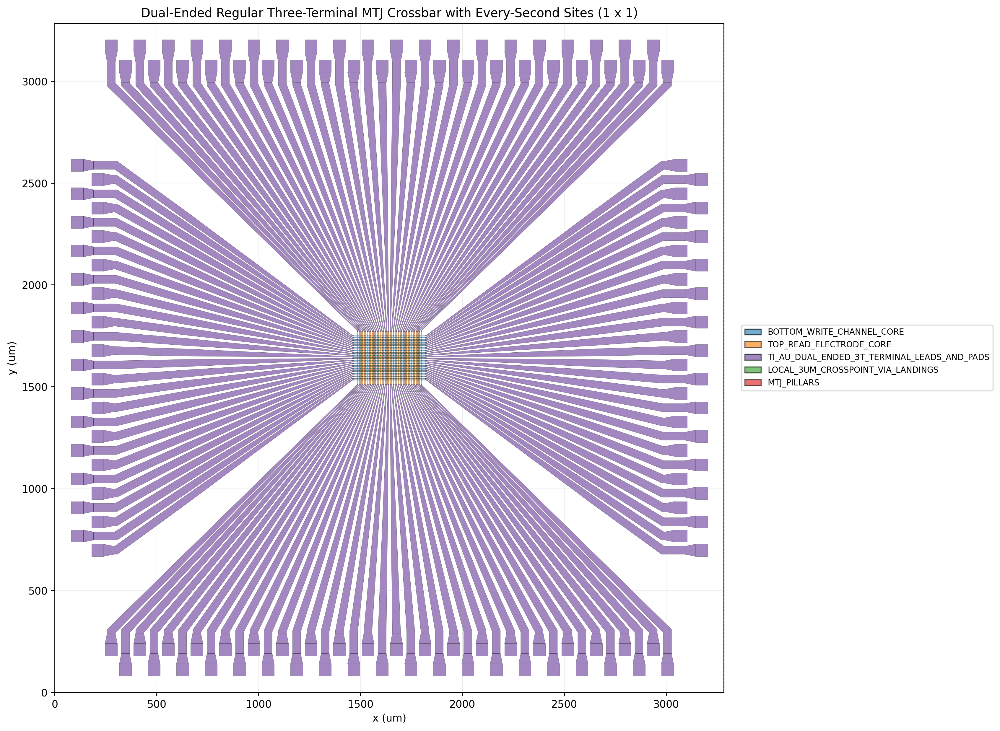

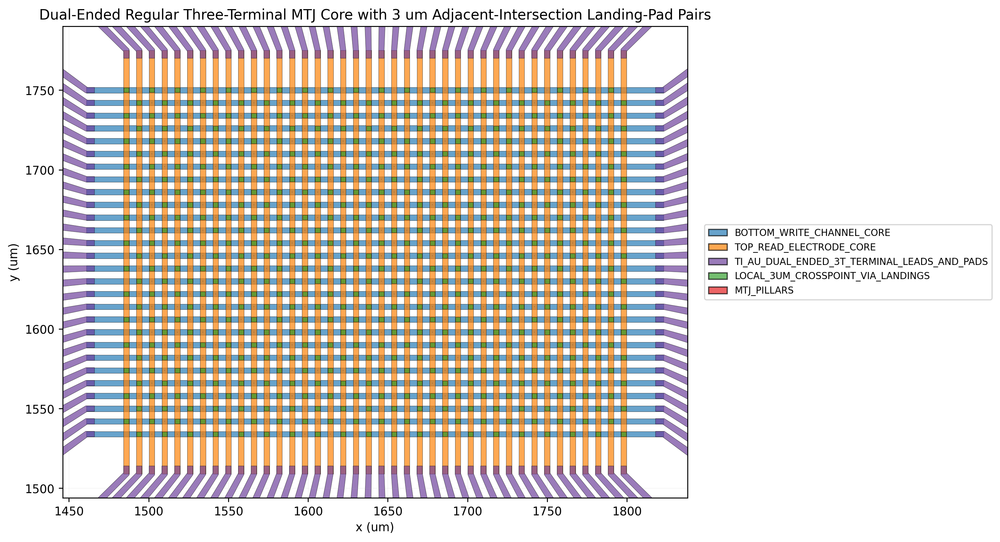

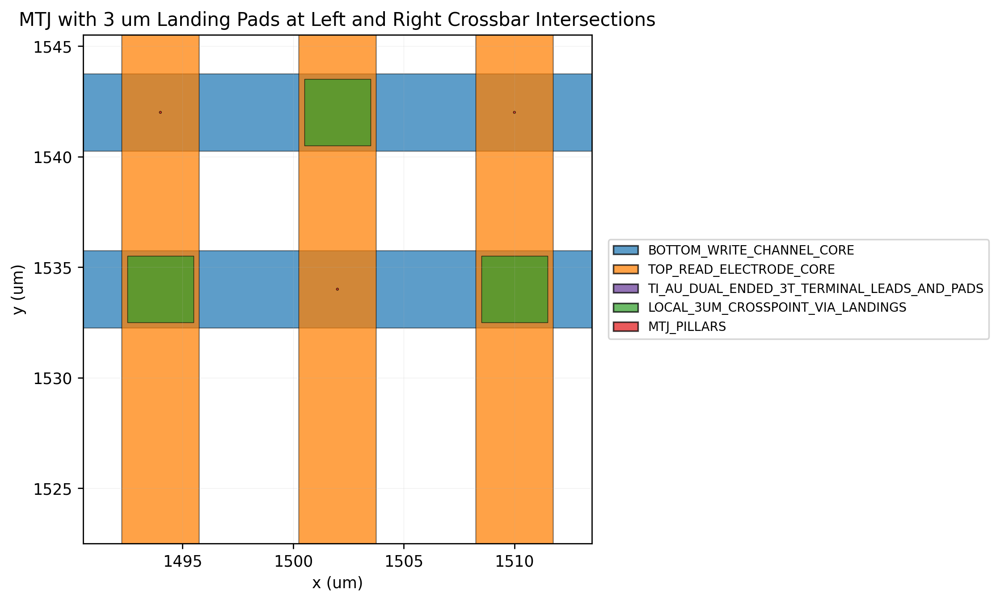

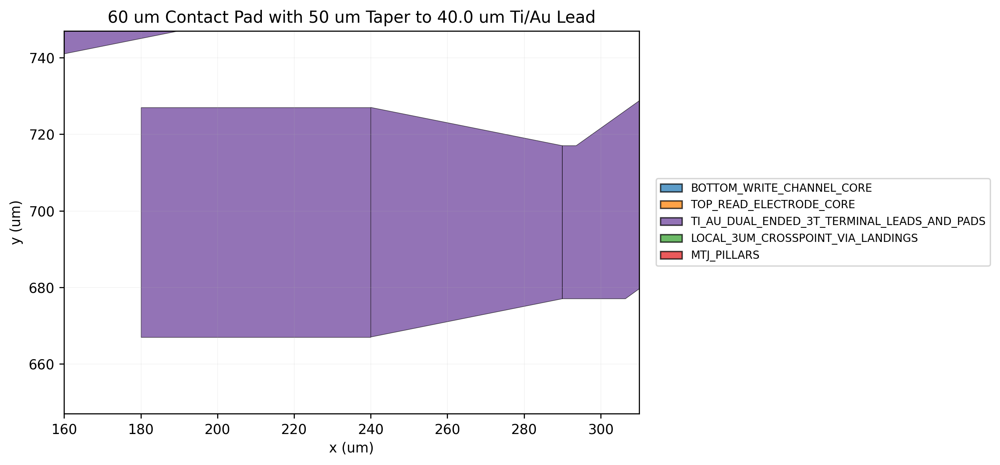

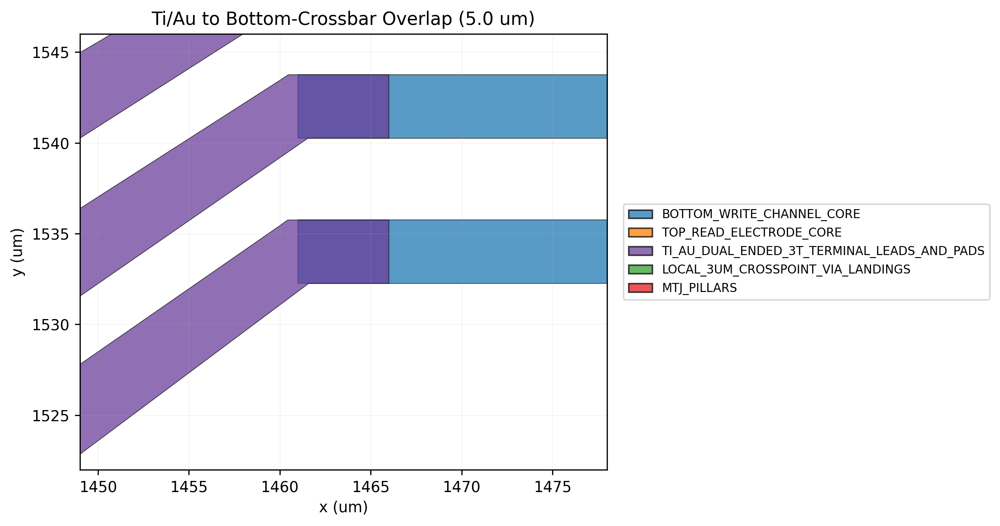

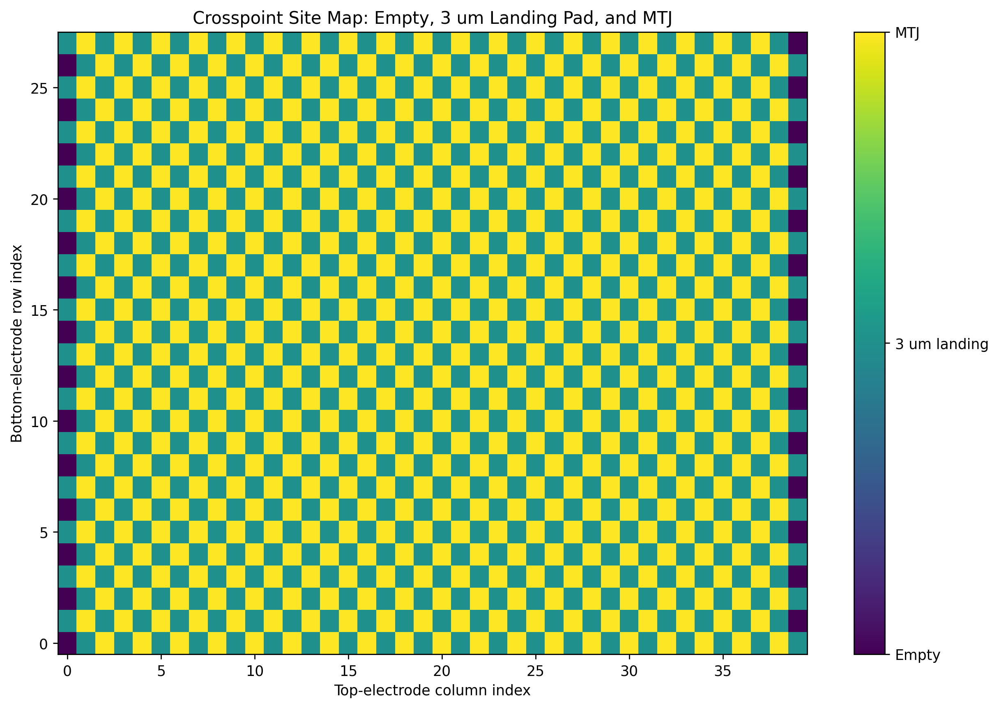

In [2]:
"""Generate a dual-ended regular three-terminal MTJ crossbar with 3 um landing pads.

The layout uses an explicit rectangular grid. Horizontal bottom electrodes form
WRITE_A-to-WRITE_B channels, and vertical top electrodes form READ conductors.
MTJ pillars occupy every second crossbar intersection according to the selected
population rule.

Every generated MTJ uses the two neighboring crossbar intersections on its
horizontal row as local via sites. For an MTJ at row ``r`` and column ``c``, the
left via is centered exactly at ``(r, c - LOCAL_VIA_INTERSECTION_OFFSET)`` and
the right via is centered exactly at
``(r, c + LOCAL_VIA_INTERSECTION_OFFSET)``. The default offset is one
intersection. Each landing is a 3 micrometer by 3 micrometer square centered on
the planar overlap of the horizontal and vertical electrodes. Since each core
electrode is 3.5 micrometers wide, the default landing retains 0.25 micrometer
planar enclosure on every edge of the crosspoint.

MTJ sites at the outermost columns are omitted so every generated pillar has a
valid landing intersection on both sides. Adjacent MTJs can share the intervening
landing site. Shared landing geometry is deduplicated in the exported mask, and
every MTJ assignment still references an ordered left and right landing pair.

The perimeter network remains row and column shared. Every horizontal bottom
crossbar is contacted at both ends by ``WRITE_A_Rr_LEFT`` and
``WRITE_B_Rr_RIGHT``. Every vertical top crossbar is contacted at both ends by
``READ_Cc`` and ``READ_AUX_Cc`` pads. The two top-crossbar pads belong to the
same electrical READ conductor, so the MTJ remains a three-terminal device
with four physical perimeter access points for the selected row-column path.
The GDS layers define planar mask geometry, including the 3 um local landing
pads at their selected crossbar intersections.

Long fanouts remain on the independent low-resistance Ti/Au layer. Each lead
overlaps its thin-film crossbar by 5 micrometers at the elbow, widens in
quantized stages as routing space opens, and is checked for same-layer spacing.
GDSTK constructs fixed-width and variable-width polygons. PHIDL builds the
hierarchy, renders notebook previews, and exports GDSII or OASIS.
"""

from __future__ import annotations

from dataclasses import dataclass
from itertools import pairwise
from pathlib import Path
from typing import Final, Literal

import gdstk
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import PolyCollection
from matplotlib.patches import Patch, Rectangle
from phidl import Device

###############################################################################
# Control knobs
###############################################################################

# Output controls. Leave OUTPUT_BASENAME as None for an automatic name.
OUTPUT_BASENAME: Final[str | None] = None
OUTPUT_FORMAT: Final[Literal["gds", "oas"]] = "oas"
OUTPUT_DIRECTORY: Final[Path] = Path.cwd()

# Regular crossbar grid. The defaults preserve the 28 x 40 conductor count and
# 8 um pitch associated with the previous n = 12 layout.
NUM_ROWS: Final[int] = 28
NUM_COLUMNS: Final[int] = 40
ROW_PITCH_UM: Final[float] = 8.000
COLUMN_PITCH_UM: Final[float] = 8.000

# MTJ population. "checkerboard" implements the requested every-second-site
# layout. "row_major_stride" selects every Nth flattened grid index. Edge
# columns that cannot support a via intersection on both sides are omitted.
PILLAR_POPULATION_MODE: Final[
    Literal["checkerboard", "row_major_stride", "all_crosspoints"]
] = "checkerboard"
INTERSECTION_PERIOD: Final[int] = 2
INTERSECTION_PHASE: Final[int] = 0

# Dual-ended terminal controls. Every horizontal bottom channel already uses
# WRITE_A and WRITE_B at its left and right ends. The enabled auxiliary READ
# contact adds the missing lead and pad at the opposite end of every vertical
# top crossbar. TOP_READ_CONTACT_SIDE selects which end carries the primary
# READ label; both top-crossbar ends are physically connected.
TOP_READ_CONTACT_SIDE: Final[Literal["bottom", "top"]] = "top"
ENABLE_AUXILIARY_READ_CONTACT: Final[bool] = True
TERMINAL_MAP_PREVIEW_COUNT: Final[int] = 8

# Core crossbar geometry.
ELECTRODE_WIDTH_UM: Final[float] = 3.500
MINIMUM_TRACE_EDGE_GAP_UM: Final[float] = 0.500
CROSSBAR_TO_FANOUT_ELBOW_UM: Final[float] = 25.000
PATH_TOLERANCE_UM: Final[float] = 1.0e-3

# MTJ geometry.
PILLAR_DIAMETER_NM: Final[float] = 100.0
PILLAR_CIRCLE_POINTS: Final[int] = 256
ENABLE_PILLAR_DATABASE_GRID_SNAP: Final[bool] = True

# Local crosspoint landing geometry. Each MTJ uses the neighboring crossbar
# intersection one column to its left and one column to its right. The square
# landing is centered on the full top-bottom electrode intersection.
LOCAL_VIA_INTERSECTION_OFFSET: Final[int] = 1
LOCAL_VIA_LANDING_SIZE_UM: Final[float] = 3.000
MINIMUM_LOCAL_VIA_EDGE_GAP_UM: Final[float] = 0.250
REQUIRE_UNPOPULATED_VIA_SITES: Final[bool] = True

# Contact-pad geometry.
PAD_WIDTH_UM: Final[float] = 60.0
PAD_HEIGHT_UM: Final[float] = 60.0
PAD_EDGE_GAP_UM: Final[float] = 10.0
PAD_STAGGER_DEPTH_UM: Final[float] = 100.0

# Align the farthest outer edges of the bottom-write and enabled top-read pad
# banks to a common radius measured from the active crossbar center.
ALIGN_OUTERMOST_PAD_EDGES: Final[bool] = True
PAD_PERIMETER_EXTRA_RADIUS_UM: Final[float] = 0.0
PAD_EDGE_ALIGNMENT_TOLERANCE_UM: Final[float] = 1.0e-6

# Pad taper geometry.
PAD_TAPER_LENGTH_UM: Final[float] = 50.0
PAD_TAPER_NECK_LENGTH_UM: Final[float] = 10.0
MINIMUM_PAD_CLEARANCE_UM: Final[float] = 10.0

# Split-metal Ti/Au lead architecture.
CROSSBAR_LEAD_OVERLAP_UM: Final[float] = 5.0
LOW_RESISTANCE_LEAD_MAX_WIDTH_UM: Final[float] = 40.0
LOW_RESISTANCE_LEAD_EDGE_GAP_UM: Final[float] = 2.0
LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION: Final[float] = 0.90
LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM: Final[float] = 0.50
LOW_RESISTANCE_LEAD_STAGE_FRACTIONS: Final[tuple[float, ...]] = (
    0.00,
    0.05,
    0.12,
    0.25,
    0.45,
    0.70,
    1.00,
)
AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE: Final[bool] = True
LEAD_WIDTH_REDUCTION_FACTOR: Final[float] = 0.90
MAX_LEAD_WIDTH_REDUCTION_ITERATIONS: Final[int] = 12
LEAD_BOOLEAN_PRECISION_UM: Final[float] = 1.0e-3
LEAD_CLEARANCE_AREA_TOLERANCE_UM2: Final[float] = 1.0e-5

# Optional resistance estimate.
ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE: Final[float | None] = None

# Fanout controls.
AUTO_FANOUT_LENGTH: Final[bool] = True
MAX_FANOUT_ANGLE_DEG: Final[float] = 45.0
MIN_FANOUT_LENGTH_UM: Final[float] = 250.0
FIXED_FANOUT_LENGTH_UM: Final[float] = 500.0

# Unit-cell and XY-array controls.
ARRAY_SIZE_X: Final[int] = 1
ARRAY_SIZE_Y: Final[int] = 1
CELL_MARGIN_UM: Final[float] = 40.0
ARRAY_CELL_EDGE_GAP_X_UM: Final[float] = 100.0
ARRAY_CELL_EDGE_GAP_Y_UM: Final[float] = 100.0

# GDSII and OASIS database controls.
GDS_UNIT_M: Final[float] = 1.0e-6
GDS_PRECISION_M: Final[float] = 1.0e-10
GDS_INTEGER_COORDINATE_LIMIT: Final[int] = 2_000_000_000
OAS_CIRCLE_TOLERANCE_UM: Final[float] = 2.0e-4

# Notebook display controls.
DISPLAY_FULL_ARRAY: Final[bool] = True
DISPLAY_ACTIVE_CROSSBAR_ZOOM: Final[bool] = True
DISPLAY_FIRST_CROSSPOINT_DETAIL: Final[bool] = True
DISPLAY_FIRST_PAD_TAPER_DETAIL: Final[bool] = True
DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL: Final[bool] = True
DISPLAY_OCCUPANCY_MATRIX: Final[bool] = True
DOWNLOAD_AFTER_EXPORT_IN_COLAB: Final[bool] = False

PREVIEW_DPI: Final[int] = 250
PREVIEW_FIGSIZE_IN: Final[tuple[float, float]] = (13.0, 10.0)
PREVIEW_PADDING_UM: Final[float] = 80.0
PREVIEW_EDGE_LINEWIDTH: Final[float] = 0.16
PREVIEW_ALPHA: Final[float] = 0.62
CROSSBAR_ZOOM_PADDING_UM: Final[float] = 40.0
CROSSPOINT_DETAIL_HALF_WINDOW_UM: Final[float] = 11.5
PAD_TAPER_DETAIL_PADDING_UM: Final[float] = 20.0
OVERLAP_DETAIL_PADDING_UM: Final[float] = 12.0
SHOW_CELL_BOUNDARIES_IN_PREVIEW: Final[bool] = True
SHOW_PAD_LABELS_IN_PREVIEW: Final[bool] = False
PAD_LABEL_FONT_SIZE_PT: Final[float] = 4.5

DATABASE_GRID_UM: Final[float] = GDS_PRECISION_M / GDS_UNIT_M
DATABASE_GRID_NM: Final[float] = DATABASE_GRID_UM * 1.0e3

mpl.rcParams["figure.dpi"] = PREVIEW_DPI
mpl.rcParams["font.sans-serif"] = ["Tahoma", "DejaVu Sans"]
mpl.rcParams["font.weight"] = "normal"

Coordinate = tuple[float, float]
Polygon = list[Coordinate]
ElectrodeKind = Literal["bottom", "top"]
PadSide = Literal["left", "right", "bottom", "top"]
TerminalRole = Literal["write_a", "write_b", "read", "read_auxiliary"]


@dataclass(frozen=True)
class LayerSpec:
    """Describe one exported and previewed layout layer."""

    name: str
    layer: int
    datatype: int
    color: str


@dataclass(frozen=True)
class BoundingBox:
    """Store an axis-aligned bounding box in micrometers."""

    xmin: float
    ymin: float
    xmax: float
    ymax: float

    @property
    def width(self) -> float:
        """Return the bounding-box width."""
        return self.xmax - self.xmin

    @property
    def height(self) -> float:
        """Return the bounding-box height."""
        return self.ymax - self.ymin

    def translated(self, shift: Coordinate) -> "BoundingBox":
        """Return a translated copy of the bounding box."""
        return BoundingBox(
            xmin=self.xmin + shift[0],
            ymin=self.ymin + shift[1],
            xmax=self.xmax + shift[0],
            ymax=self.ymax + shift[1],
        )


@dataclass(frozen=True)
class PadTerminal:
    """Describe one rectangular Ti/Au perimeter terminal pad."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    center: Coordinate
    width_um: float
    height_um: float
    lead_width_um: float

    @property
    def bounds(self) -> BoundingBox:
        """Return the pad rectangle bounds."""
        half_width = 0.5 * self.width_um
        half_height = 0.5 * self.height_um
        return BoundingBox(
            xmin=self.center[0] - half_width,
            ymin=self.center[1] - half_height,
            xmax=self.center[0] + half_width,
            ymax=self.center[1] + half_height,
        )


@dataclass(frozen=True)
class RoutedTrace:
    """Describe one fixed-width main crossbar conductor."""

    name: str
    electrode: ElectrodeKind
    conductor_index: int
    axis_coordinate_um: float
    centerline_points: tuple[Coordinate, ...]


@dataclass(frozen=True)
class VariableWidthLead:
    """Describe one variable-width Ti/Au pad-to-crossbar lead."""

    name: str
    electrode: ElectrodeKind
    side: PadSide
    conductor_index: int
    terminal_role: TerminalRole
    centerline_points: tuple[Coordinate, ...]
    widths_um: tuple[float, ...]

    def __post_init__(self) -> None:
        """Validate point and width cardinality."""
        if len(self.centerline_points) < 2:
            raise ValueError("A Ti/Au lead requires at least two points.")
        if len(self.centerline_points) != len(self.widths_um):
            raise ValueError(
                "A Ti/Au lead requires one width value per centerline point."
            )
        if any(width <= 0.0 for width in self.widths_um):
            raise ValueError("Every Ti/Au lead width must be positive.")

    @property
    def terminal_width_um(self) -> float:
        """Return the width meeting the pad taper tip."""
        return self.widths_um[-1]


@dataclass(frozen=True)
class LeadClearanceResult:
    """Store the result of a Ti/Au same-layer clearance check."""

    is_valid: bool
    message: str


@dataclass(frozen=True)
class LocalViaPad:
    """Describe one unique square via landing centered on a crosspoint."""

    name: str
    row_index: int
    column_index: int
    center: Coordinate
    associated_pillar_indices: tuple[int, ...]
    landing_size_um: float

    @property
    def landing_bounds(self) -> BoundingBox:
        """Return square landing-pad bounds."""
        half_size = 0.5 * self.landing_size_um
        return BoundingBox(
            xmin=self.center[0] - half_size,
            ymin=self.center[1] - half_size,
            xmax=self.center[0] + half_size,
            ymax=self.center[1] + half_size,
        )

    def translated(self, shift: Coordinate) -> "LocalViaPad":
        """Return a translated local via pad."""
        return LocalViaPad(
            name=self.name,
            row_index=self.row_index,
            column_index=self.column_index,
            center=(self.center[0] + shift[0], self.center[1] + shift[1]),
            associated_pillar_indices=self.associated_pillar_indices,
            landing_size_um=self.landing_size_um,
        )


@dataclass(frozen=True)
class ThreeTerminalAssignment:
    """Map one MTJ to shared terminals and its local via landing names."""

    pillar_index: int
    row_index: int
    column_index: int
    center: Coordinate
    write_a_pad_name: str
    write_b_pad_name: str
    read_pad_name: str
    local_via_pad_names: tuple[str, ...]


@dataclass(frozen=True)
class CrossbarGeometry:
    """Store generated unit-cell geometry and topology metadata."""

    populated_crosspoint_indices: tuple[tuple[int, int], ...]
    row_coordinates_um: tuple[float, ...]
    column_coordinates_um: tuple[float, ...]
    pillar_centers: tuple[Coordinate, ...]
    local_via_pads: tuple[LocalViaPad, ...]
    terminal_assignments: tuple[ThreeTerminalAssignment, ...]
    bottom_routes: tuple[RoutedTrace, ...]
    top_routes: tuple[RoutedTrace, ...]
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    crossbar_bounds: BoundingBox
    routing_transition_bounds: BoundingBox
    bounds: BoundingBox
    row_fanout_length_um: float
    column_fanout_length_um: float
    maximum_row_fanout_angle_deg: float
    maximum_column_fanout_angle_deg: float
    bottom_pad_outer_edge_radius_um: float
    top_pad_outer_edge_radius_um: float
    bottom_pad_alignment_extension_um: float
    top_pad_alignment_extension_um: float
    bottom_lead_width_profile_um: tuple[float, ...]
    top_lead_width_profile_um: tuple[float, ...]
    lead_width_scale: float


LAYERS: Final[dict[str, LayerSpec]] = {
    "BOTTOM_ELECTRODE": LayerSpec(
        name="BOTTOM_WRITE_CHANNEL_CORE",
        layer=2,
        datatype=0,
        color="#1f78b4",
    ),
    "MTJ_PILLARS": LayerSpec(
        name="MTJ_PILLARS",
        layer=3,
        datatype=0,
        color="#e31a1c",
    ),
    "TOP_ELECTRODE": LayerSpec(
        name="TOP_READ_ELECTRODE_CORE",
        layer=4,
        datatype=0,
        color="#ff7f00",
    ),
    "TI_AU_LEADS": LayerSpec(
        name="TI_AU_DUAL_ENDED_3T_TERMINAL_LEADS_AND_PADS",
        layer=5,
        datatype=0,
        color="#6a3d9a",
    ),
    "LOCAL_VIA_LANDINGS": LayerSpec(
        name="LOCAL_3UM_CROSSPOINT_VIA_LANDINGS",
        layer=6,
        datatype=0,
        color="#33a02c",
    ),
}


def validate_control_knobs() -> None:
    """Validate all user-adjustable geometry and database controls."""
    if NUM_ROWS < 1 or NUM_COLUMNS < 1:
        raise ValueError("NUM_ROWS and NUM_COLUMNS must be at least 1.")
    if ROW_PITCH_UM <= 0.0 or COLUMN_PITCH_UM <= 0.0:
        raise ValueError("ROW_PITCH_UM and COLUMN_PITCH_UM must be positive.")
    if PILLAR_POPULATION_MODE not in {
        "checkerboard",
        "row_major_stride",
        "all_crosspoints",
    }:
        raise ValueError("Unsupported PILLAR_POPULATION_MODE.")
    if INTERSECTION_PERIOD < 1:
        raise ValueError("INTERSECTION_PERIOD must be at least 1.")
    if not 0 <= INTERSECTION_PHASE < INTERSECTION_PERIOD:
        raise ValueError(
            "INTERSECTION_PHASE must lie in [0, INTERSECTION_PERIOD)."
        )
    if TOP_READ_CONTACT_SIDE not in {"bottom", "top"}:
        raise ValueError("TOP_READ_CONTACT_SIDE must be 'bottom' or 'top'.")
    if not ENABLE_AUXILIARY_READ_CONTACT:
        raise ValueError(
            "This dual-ended layout requires "
            "ENABLE_AUXILIARY_READ_CONTACT=True."
        )
    if TERMINAL_MAP_PREVIEW_COUNT < 0:
        raise ValueError("TERMINAL_MAP_PREVIEW_COUNT must be nonnegative.")
    if CROSSBAR_TO_FANOUT_ELBOW_UM <= 0.0:
        raise ValueError("CROSSBAR_TO_FANOUT_ELBOW_UM must be positive.")
    if ELECTRODE_WIDTH_UM <= 0.0:
        raise ValueError("ELECTRODE_WIDTH_UM must be positive.")
    required_pitch_um = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if ROW_PITCH_UM + 1.0e-12 < required_pitch_um:
        raise ValueError(
            "ROW_PITCH_UM must exceed the electrode width plus the trace gap."
        )
    if COLUMN_PITCH_UM + 1.0e-12 < required_pitch_um:
        raise ValueError(
            "COLUMN_PITCH_UM must exceed the electrode width plus the trace gap."
        )
    if PATH_TOLERANCE_UM <= 0.0:
        raise ValueError("PATH_TOLERANCE_UM must be positive.")
    if PILLAR_DIAMETER_NM <= 0.0:
        raise ValueError("PILLAR_DIAMETER_NM must be positive.")
    if PILLAR_CIRCLE_POINTS < 32:
        raise ValueError("PILLAR_CIRCLE_POINTS must be at least 32.")
    if PILLAR_DIAMETER_NM * 1.0e-3 > ELECTRODE_WIDTH_UM:
        raise ValueError("The MTJ pillar must fit inside the electrode width.")

    if LOCAL_VIA_INTERSECTION_OFFSET < 1:
        raise ValueError("LOCAL_VIA_INTERSECTION_OFFSET must be at least 1.")
    minimum_column_count = 2 * LOCAL_VIA_INTERSECTION_OFFSET + 1
    if NUM_COLUMNS < minimum_column_count:
        raise ValueError(
            "NUM_COLUMNS must provide a left and right via intersection for "
            "each generated MTJ."
        )
    if LOCAL_VIA_LANDING_SIZE_UM <= 0.0:
        raise ValueError("LOCAL_VIA_LANDING_SIZE_UM must be positive.")
    if LOCAL_VIA_LANDING_SIZE_UM > ELECTRODE_WIDTH_UM:
        raise ValueError(
            "The local via landing must fit within the planar top-bottom "
            "electrode intersection."
        )
    if MINIMUM_LOCAL_VIA_EDGE_GAP_UM < 0.0:
        raise ValueError("MINIMUM_LOCAL_VIA_EDGE_GAP_UM must be nonnegative.")
    if (
        REQUIRE_UNPOPULATED_VIA_SITES
        and PILLAR_POPULATION_MODE == "all_crosspoints"
    ):
        raise ValueError(
            "all_crosspoints is incompatible with unpopulated adjacent via "
            "sites. Use checkerboard or row_major_stride."
        )

    if PAD_WIDTH_UM <= 0.0 or PAD_HEIGHT_UM <= 0.0:
        raise ValueError("PAD_WIDTH_UM and PAD_HEIGHT_UM must be positive.")
    if PAD_EDGE_GAP_UM < 0.0:
        raise ValueError("PAD_EDGE_GAP_UM must be nonnegative.")
    if PAD_STAGGER_DEPTH_UM < 0.0:
        raise ValueError("PAD_STAGGER_DEPTH_UM must be nonnegative.")
    if PAD_PERIMETER_EXTRA_RADIUS_UM < 0.0:
        raise ValueError("PAD_PERIMETER_EXTRA_RADIUS_UM must be nonnegative.")
    if PAD_EDGE_ALIGNMENT_TOLERANCE_UM <= 0.0:
        raise ValueError("PAD_EDGE_ALIGNMENT_TOLERANCE_UM must be positive.")
    if PAD_TAPER_LENGTH_UM <= 0.0:
        raise ValueError("PAD_TAPER_LENGTH_UM must be positive.")
    if PAD_TAPER_NECK_LENGTH_UM < 0.0:
        raise ValueError("PAD_TAPER_NECK_LENGTH_UM must be nonnegative.")
    if MINIMUM_PAD_CLEARANCE_UM < 0.0:
        raise ValueError("MINIMUM_PAD_CLEARANCE_UM must be nonnegative.")

    minimum_corner_offset_um = (
        ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    ) / np.sqrt(2.0)
    if CROSSBAR_TO_FANOUT_ELBOW_UM < minimum_corner_offset_um:
        raise ValueError(
            "CROSSBAR_TO_FANOUT_ELBOW_UM is too short for finite-width "
            f"corner clearance. Use at least {minimum_corner_offset_um:.3f} um."
        )
    if CROSSBAR_LEAD_OVERLAP_UM <= 0.0:
        raise ValueError("CROSSBAR_LEAD_OVERLAP_UM must be positive.")
    if CROSSBAR_LEAD_OVERLAP_UM >= CROSSBAR_TO_FANOUT_ELBOW_UM:
        raise ValueError(
            "CROSSBAR_LEAD_OVERLAP_UM must remain smaller than the elbow offset."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM < ELECTRODE_WIDTH_UM:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_MAX_WIDTH_UM must reach the crossbar width."
        )
    if LOW_RESISTANCE_LEAD_MAX_WIDTH_UM > min(PAD_WIDTH_UM, PAD_HEIGHT_UM):
        raise ValueError("The maximum Ti/Au lead width must fit in each pad.")
    if LOW_RESISTANCE_LEAD_EDGE_GAP_UM < 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_EDGE_GAP_UM must be nonnegative.")
    if not 0.0 < LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION <= 1.0:
        raise ValueError(
            "LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION must lie in (0, 1]."
        )
    if LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM <= 0.0:
        raise ValueError("LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM must be positive.")
    fractions = LOW_RESISTANCE_LEAD_STAGE_FRACTIONS
    if len(fractions) < 2:
        raise ValueError("At least two lead-profile fractions are required.")
    if not np.isclose(fractions[0], 0.0) or not np.isclose(fractions[-1], 1.0):
        raise ValueError("Lead-profile fractions must begin at 0 and end at 1.")
    if any(later <= earlier for earlier, later in pairwise(fractions)):
        raise ValueError("Lead-profile fractions must be strictly increasing.")
    if not 0.0 < LEAD_WIDTH_REDUCTION_FACTOR < 1.0:
        raise ValueError("LEAD_WIDTH_REDUCTION_FACTOR must lie between 0 and 1.")
    if MAX_LEAD_WIDTH_REDUCTION_ITERATIONS < 1:
        raise ValueError(
            "MAX_LEAD_WIDTH_REDUCTION_ITERATIONS must be at least 1."
        )
    if LEAD_BOOLEAN_PRECISION_UM <= 0.0:
        raise ValueError("LEAD_BOOLEAN_PRECISION_UM must be positive.")
    if LEAD_CLEARANCE_AREA_TOLERANCE_UM2 < 0.0:
        raise ValueError("LEAD_CLEARANCE_AREA_TOLERANCE_UM2 must be nonnegative.")
    if (
        ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None
        and ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE <= 0.0
    ):
        raise ValueError(
            "ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE must be positive "
            "or None."
        )

    if not 0.0 < MAX_FANOUT_ANGLE_DEG < 89.0:
        raise ValueError("MAX_FANOUT_ANGLE_DEG must lie between 0 and 89.")
    if MIN_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("MIN_FANOUT_LENGTH_UM must be positive.")
    if FIXED_FANOUT_LENGTH_UM <= 0.0:
        raise ValueError("FIXED_FANOUT_LENGTH_UM must be positive.")
    if ARRAY_SIZE_X < 1 or ARRAY_SIZE_Y < 1:
        raise ValueError("ARRAY_SIZE_X and ARRAY_SIZE_Y must be at least 1.")
    if CELL_MARGIN_UM < 0.0:
        raise ValueError("CELL_MARGIN_UM must be nonnegative.")
    if ARRAY_CELL_EDGE_GAP_X_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_X_UM must be positive.")
    if ARRAY_CELL_EDGE_GAP_Y_UM <= 0.0:
        raise ValueError("ARRAY_CELL_EDGE_GAP_Y_UM must be positive.")
    if GDS_PRECISION_M <= 0.0 or GDS_UNIT_M <= 0.0:
        raise ValueError("GDS unit and precision values must be positive.")


def centered_axis_coordinates(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return a centered regular axis with the requested count and pitch."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")
    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))


def selected_crosspoint_indices() -> tuple[tuple[int, int], ...]:
    """Return MTJ intersections with room for a via site on both sides."""
    selected: list[tuple[int, int]] = []
    first_allowed_column = LOCAL_VIA_INTERSECTION_OFFSET
    stop_column = NUM_COLUMNS - LOCAL_VIA_INTERSECTION_OFFSET

    for row_index in range(NUM_ROWS):
        for column_index in range(first_allowed_column, stop_column):
            if PILLAR_POPULATION_MODE == "all_crosspoints":
                selected.append((row_index, column_index))
                continue

            if PILLAR_POPULATION_MODE == "checkerboard":
                logical_index = row_index + column_index
            else:
                logical_index = row_index * NUM_COLUMNS + column_index

            if logical_index % INTERSECTION_PERIOD == INTERSECTION_PHASE:
                selected.append((row_index, column_index))

    if len(selected) == 0:
        raise ValueError("The selected intersection rule produced no MTJ sites.")
    return tuple(selected)


def build_local_via_pads(
    rows: tuple[float, ...],
    columns: tuple[float, ...],
    populated_indices: tuple[tuple[int, int], ...],
) -> tuple[LocalViaPad, ...]:
    """Create deduplicated 3 um pads at adjacent crossbar intersections."""
    associations: dict[tuple[int, int], set[int]] = {}
    populated_set = set(populated_indices)

    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        neighbor_columns = (
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        for via_column_index in neighbor_columns:
            if not 0 <= via_column_index < len(columns):
                raise ValueError(
                    f"Pillar {pillar_index} lacks a via intersection on both sides."
                )
            via_site = (row_index, via_column_index)
            if REQUIRE_UNPOPULATED_VIA_SITES and via_site in populated_set:
                raise ValueError(
                    "A requested local via site is also populated by an MTJ. "
                    "Use an alternating population rule or disable "
                    "REQUIRE_UNPOPULATED_VIA_SITES."
                )
            associations.setdefault(via_site, set()).add(pillar_index)

    return tuple(
        LocalViaPad(
            name=f"LOCAL_VIA_XPT_R{row_index:03d}_C{column_index:03d}",
            row_index=row_index,
            column_index=column_index,
            center=(columns[column_index], rows[row_index]),
            associated_pillar_indices=tuple(sorted(pillar_indices)),
            landing_size_um=LOCAL_VIA_LANDING_SIZE_UM,
        )
        for (row_index, column_index), pillar_indices in sorted(
            associations.items()
        )
    )


def local_via_names_by_pillar(
    local_via_pads: tuple[LocalViaPad, ...],
    populated_indices: tuple[tuple[int, int], ...],
) -> dict[int, tuple[str, str]]:
    """Return ordered left and right via names for every MTJ."""
    via_by_site = {
        (via.row_index, via.column_index): via.name for via in local_via_pads
    }
    names_by_pillar: dict[int, tuple[str, str]] = {}

    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        left_site = (
            row_index,
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
        )
        right_site = (
            row_index,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        names_by_pillar[pillar_index] = (
            via_by_site[left_site],
            via_by_site[right_site],
        )

    return names_by_pillar


def centered_slot_positions(count: int, pitch_um: float) -> tuple[float, ...]:
    """Return evenly spaced pad-bank positions centered about zero."""
    if count < 1:
        raise ValueError("count must be at least 1.")
    if pitch_um <= 0.0:
        raise ValueError("pitch_um must be positive.")

    center_index = 0.5 * (count - 1)
    return tuple((index - center_index) * pitch_um for index in range(count))

def compute_fanout_length(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
) -> tuple[float, float]:
    """Compute a fanout run and its resulting maximum route angle.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.

    Returns:
        Fanout length and maximum absolute fanout angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))

    if AUTO_FANOUT_LENGTH:
        maximum_angle_rad = np.deg2rad(MAX_FANOUT_ANGLE_DEG)
        angular_length_um = maximum_displacement_um / np.tan(maximum_angle_rad)
        fanout_length_um = max(MIN_FANOUT_LENGTH_UM, angular_length_um)
    else:
        fanout_length_um = FIXED_FANOUT_LENGTH_UM

    resulting_angle_deg = float(
        np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um))
    )
    return fanout_length_um, resulting_angle_deg

def maximum_fanout_angle(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    fanout_length_um: float,
) -> float:
    """Return the maximum route angle for a prescribed fanout length.

    Args:
        conductor_coordinates_um: Sorted row or column coordinates.
        pad_slot_coordinates_um: Corresponding sorted pad-bank coordinates.
        fanout_length_um: Outward fanout run in micrometers.

    Returns:
        Maximum absolute route angle in degrees.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")

    displacements = np.abs(
        np.asarray(pad_slot_coordinates_um, dtype=float)
        - np.asarray(conductor_coordinates_um, dtype=float)
    )
    maximum_displacement_um = float(np.max(displacements))
    return float(np.rad2deg(np.arctan2(maximum_displacement_um, fanout_length_um)))

def predicted_pad_outer_edge_radius(
    elbow_radius_um: float,
    fanout_length_um: float,
    outward_pad_dimension_um: float,
) -> float:
    """Return the farthest staggered pad-edge radius from the origin.

    Args:
        elbow_radius_um: Radial distance from the origin to the fanout elbow.
        fanout_length_um: Outward run from the elbow to the fanout anchor.
        outward_pad_dimension_um: Pad dimension along the outward direction.

    Returns:
        Farthest pad-edge radius in micrometers.
    """
    if elbow_radius_um < 0.0:
        raise ValueError("elbow_radius_um must be nonnegative.")
    if fanout_length_um <= 0.0:
        raise ValueError("fanout_length_um must be positive.")
    if outward_pad_dimension_um <= 0.0:
        raise ValueError("outward_pad_dimension_um must be positive.")

    return (
        elbow_radius_um
        + fanout_length_um
        + PAD_TAPER_NECK_LENGTH_UM
        + PAD_TAPER_LENGTH_UM
        + outward_pad_dimension_um
        + PAD_STAGGER_DEPTH_UM
    )

def quantize_width_down(width_um: float) -> float:
    """Quantize a width downward to the configured fabrication increment."""
    quantum_um = LOW_RESISTANCE_LEAD_WIDTH_QUANTUM_UM
    quantized = np.floor(width_um / quantum_um + 1.0e-12) * quantum_um
    return float(max(ELECTRODE_WIDTH_UM, quantized))

def compute_adaptive_lead_width_profile(
    conductor_coordinates_um: tuple[float, ...],
    pad_slot_coordinates_um: tuple[float, ...],
    maximum_fanout_angle_deg: float,
) -> tuple[float, ...]:
    """Compute a monotonic Ti/Au width profile from local route spacing.

    Each profile station follows the normalized fanout coordinate from the
    crossbar elbow to the outer routing anchor. The local centerline spacing is
    projected conservatively onto a route-normal direction using the maximum
    family fanout angle. A utilization factor and width quantization leave
    process margin beyond the requested same-layer edge clearance.
    """
    if len(conductor_coordinates_um) != len(pad_slot_coordinates_um):
        raise ValueError("Conductor and pad-slot counts must match.")

    conductor_array = np.asarray(conductor_coordinates_um, dtype=float)
    pad_slot_array = np.asarray(pad_slot_coordinates_um, dtype=float)
    projection_factor = float(np.cos(np.deg2rad(maximum_fanout_angle_deg)))

    widths_um: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for fraction in LOW_RESISTANCE_LEAD_STAGE_FRACTIONS:
        interpolated_coordinates = (
            1.0 - fraction
        ) * conductor_array + fraction * pad_slot_array
        if len(interpolated_coordinates) < 2:
            minimum_spacing_um = float("inf")
        else:
            minimum_spacing_um = float(np.min(np.diff(interpolated_coordinates)))

        projected_spacing_um = minimum_spacing_um * projection_factor
        available_width_um = projected_spacing_um - LOW_RESISTANCE_LEAD_EDGE_GAP_UM
        target_width_um = min(
            LOW_RESISTANCE_LEAD_MAX_WIDTH_UM,
            LOW_RESISTANCE_LEAD_WIDTH_UTILIZATION * available_width_um,
        )
        width_um = quantize_width_down(target_width_um)
        width_um = max(previous_width_um, width_um)
        widths_um.append(width_um)
        previous_width_um = width_um

    widths_um[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in widths_um)

def scale_lead_width_profile(
    nominal_profile_um: tuple[float, ...],
    scale: float,
) -> tuple[float, ...]:
    """Scale profile widening above the crossbar width and requantize it."""
    if not 0.0 <= scale <= 1.0:
        raise ValueError("Lead width scale must lie between 0 and 1.")

    scaled_widths: list[float] = []
    previous_width_um = ELECTRODE_WIDTH_UM
    for nominal_width_um in nominal_profile_um:
        expanded_width_um = ELECTRODE_WIDTH_UM + scale * (
            nominal_width_um - ELECTRODE_WIDTH_UM
        )
        width_um = quantize_width_down(expanded_width_um)
        width_um = max(previous_width_um, width_um)
        scaled_widths.append(width_um)
        previous_width_um = width_um

    scaled_widths[0] = ELECTRODE_WIDTH_UM
    return tuple(float(width) for width in scaled_widths)

def interpolate_coordinate(
    start: Coordinate,
    end: Coordinate,
    fraction: float,
) -> Coordinate:
    """Linearly interpolate between two coordinates."""
    return (
        start[0] + fraction * (end[0] - start[0]),
        start[1] + fraction * (end[1] - start[1]),
    )

def make_variable_width_path(lead: VariableWidthLead) -> gdstk.RobustPath:
    """Construct a GDSTK RobustPath for one Ti/Au lead."""
    path = gdstk.RobustPath(
        lead.centerline_points[0],
        lead.widths_um[0],
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for endpoint, width_um in zip(
        lead.centerline_points[1:],
        lead.widths_um[1:],
        strict=True,
    ):
        path.segment(endpoint, width=(width_um, "linear"))
    return path

def variable_width_lead_polygons(
    lead: VariableWidthLead,
) -> list[gdstk.Polygon]:
    """Return polygonal contours for one variable-width lead."""
    return make_variable_width_path(lead).to_polygons()

def remove_adjacent_duplicate_points(
    points: tuple[Coordinate, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[Coordinate, ...]:
    """Remove adjacent duplicate vertices from a routed centerline."""
    if len(points) == 0:
        return tuple()

    pruned = [points[0]]
    for point in points[1:]:
        previous = pruned[-1]
        if np.hypot(point[0] - previous[0], point[1] - previous[1]) <= tolerance_um:
            continue
        pruned.append(point)

    return tuple(pruned)

def remove_adjacent_duplicate_profile_points(
    points: tuple[Coordinate, ...],
    widths_um: tuple[float, ...],
    tolerance_um: float = 1.0e-12,
) -> tuple[tuple[Coordinate, ...], tuple[float, ...]]:
    """Prune duplicate profile vertices while preserving endpoint widths."""
    if len(points) != len(widths_um):
        raise ValueError("Profile points and widths must have equal lengths.")
    if len(points) == 0:
        return tuple(), tuple()

    pruned_points = [points[0]]
    pruned_widths = [widths_um[0]]
    for point, width_um in zip(points[1:], widths_um[1:], strict=True):
        previous = pruned_points[-1]
        separation_um = float(np.hypot(point[0] - previous[0], point[1] - previous[1]))
        if separation_um <= tolerance_um:
            pruned_widths[-1] = max(pruned_widths[-1], width_um)
            continue
        pruned_points.append(point)
        pruned_widths.append(width_um)

    return tuple(pruned_points), tuple(pruned_widths)

def translate_coordinate(
    coordinate: Coordinate,
    shift: Coordinate,
) -> Coordinate:
    """Translate one coordinate."""
    return coordinate[0] + shift[0], coordinate[1] + shift[1]

def translate_trace(trace: RoutedTrace, shift: Coordinate) -> RoutedTrace:
    """Translate one fixed-width main crossbar conductor."""
    axis_coordinate = trace.axis_coordinate_um
    if trace.electrode == "bottom":
        axis_coordinate += shift[1]
    else:
        axis_coordinate += shift[0]

    return RoutedTrace(
        name=trace.name,
        electrode=trace.electrode,
        conductor_index=trace.conductor_index,
        axis_coordinate_um=axis_coordinate,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in trace.centerline_points
        ),
    )

def translate_variable_width_lead(
    lead: VariableWidthLead,
    shift: Coordinate,
) -> VariableWidthLead:
    """Translate one variable-width Ti/Au lead."""
    return VariableWidthLead(
        name=lead.name,
        electrode=lead.electrode,
        side=lead.side,
        conductor_index=lead.conductor_index,
        terminal_role=lead.terminal_role,
        centerline_points=tuple(
            translate_coordinate(point, shift) for point in lead.centerline_points
        ),
        widths_um=lead.widths_um,
    )

def translate_pad(pad: PadTerminal, shift: Coordinate) -> PadTerminal:
    """Translate one Ti/Au contact pad."""
    return PadTerminal(
        name=pad.name,
        electrode=pad.electrode,
        side=pad.side,
        conductor_index=pad.conductor_index,
        terminal_role=pad.terminal_role,
        center=translate_coordinate(pad.center, shift),
        width_um=pad.width_um,
        height_um=pad.height_um,
        lead_width_um=pad.lead_width_um,
    )

def translate_local_via_pad(
    via_pad: LocalViaPad,
    shift: Coordinate,
) -> LocalViaPad:
    """Translate one local square via pad."""
    return via_pad.translated(shift)


def pad_taper_tip(pad: PadTerminal) -> Coordinate:
    """Return the center of the narrow electrode-width taper end.

    Args:
        pad: Contact pad whose taper points inward toward the crossbar.

    Returns:
        Center coordinate of the taper tip.
    """
    if pad.side == "left":
        return pad.bounds.xmax + PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "right":
        return pad.bounds.xmin - PAD_TAPER_LENGTH_UM, pad.center[1]
    if pad.side == "bottom":
        return pad.center[0], pad.bounds.ymax + PAD_TAPER_LENGTH_UM
    if pad.side == "top":
        return pad.center[0], pad.bounds.ymin - PAD_TAPER_LENGTH_UM
    raise ValueError(f"Unsupported pad side: {pad.side!r}")

def pad_taper_polygon(pad: PadTerminal) -> Polygon:
    """Return a full-pad-edge taper to the adaptive Ti/Au lead width."""
    half_lead_width = 0.5 * pad.lead_width_um
    tip_x, tip_y = pad_taper_tip(pad)

    if pad.side == "left":
        base_x = pad.bounds.xmax
        return [
            (base_x, pad.bounds.ymin),
            (base_x, pad.bounds.ymax),
            (tip_x, tip_y + half_lead_width),
            (tip_x, tip_y - half_lead_width),
        ]
    if pad.side == "right":
        base_x = pad.bounds.xmin
        return [
            (base_x, pad.bounds.ymin),
            (tip_x, tip_y - half_lead_width),
            (tip_x, tip_y + half_lead_width),
            (base_x, pad.bounds.ymax),
        ]
    if pad.side == "bottom":
        base_y = pad.bounds.ymax
        return [
            (pad.bounds.xmin, base_y),
            (pad.bounds.xmax, base_y),
            (tip_x + half_lead_width, tip_y),
            (tip_x - half_lead_width, tip_y),
        ]
    if pad.side == "top":
        base_y = pad.bounds.ymin
        return [
            (pad.bounds.xmin, base_y),
            (tip_x - half_lead_width, tip_y),
            (tip_x + half_lead_width, tip_y),
            (pad.bounds.xmax, base_y),
        ]
    raise ValueError(f"Unsupported pad side: {pad.side!r}")

def polygon_bounds(polygon: Polygon) -> BoundingBox:
    """Return an axis-aligned bounding box for a polygon."""
    if len(polygon) < 3:
        raise ValueError("A polygon must contain at least three vertices.")
    vertices = np.asarray(polygon, dtype=float)
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )

def minimum_axis_spacing(coordinates: tuple[float, ...]) -> float:
    """Return the minimum spacing between sorted axis coordinates."""
    if len(coordinates) < 2:
        return float("inf")
    differences = np.diff(np.asarray(coordinates, dtype=float))
    return float(np.min(differences))

def validate_axis_trace_clearance(
    coordinates: tuple[float, ...],
    axis_name: str,
) -> None:
    """Verify that adjacent parallel traces retain the requested edge gap."""
    minimum_center_spacing = minimum_axis_spacing(coordinates)
    required_center_spacing = ELECTRODE_WIDTH_UM + MINIMUM_TRACE_EDGE_GAP_UM
    if minimum_center_spacing + 1.0e-12 < required_center_spacing:
        raise ValueError(
            f"Adjacent {axis_name} conductors are only "
            f"{minimum_center_spacing:.6f} um apart. At least "
            f"{required_center_spacing:.6f} um is required."
        )

def rectangles_have_clearance(
    first: BoundingBox,
    second: BoundingBox,
    clearance_um: float,
) -> bool:
    """Return whether two rectangles are separated by the given clearance."""
    separated_in_x = (
        first.xmax + clearance_um <= second.xmin
        or second.xmax + clearance_um <= first.xmin
    )
    separated_in_y = (
        first.ymax + clearance_um <= second.ymin
        or second.ymax + clearance_um <= first.ymin
    )
    return separated_in_x or separated_in_y

def validate_pad_clearance(pads: tuple[PadTerminal, ...]) -> None:
    """Verify that no two contact pads touch or violate pad clearance."""
    for first_index, first_pad in enumerate(pads):
        for second_pad in pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_pad.bounds,
                second_pad.bounds,
                MINIMUM_PAD_CLEARANCE_UM,
            ):
                continue
            raise ValueError(
                "Contact-pad clearance violation between "
                f"{first_pad.name} and {second_pad.name}. Increase "
                "PAD_EDGE_GAP_UM, PAD_STAGGER_DEPTH_UM, or "
                "MIN_FANOUT_LENGTH_UM."
            )

def rectangle_gdstk_polygon(bounds: BoundingBox) -> gdstk.Polygon:
    """Return a GDSTK rectangle polygon from a bounding box."""
    return gdstk.rectangle(
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymax),
    )

def polygon_collection_bounds(
    polygons: list[gdstk.Polygon],
) -> BoundingBox:
    """Return the bounding box of a nonempty GDSTK polygon collection."""
    if len(polygons) == 0:
        raise ValueError("A nonempty polygon collection is required.")
    vertices = np.vstack(
        [np.asarray(polygon.points, dtype=float) for polygon in polygons]
    )
    return BoundingBox(
        xmin=float(np.min(vertices[:, 0])),
        ymin=float(np.min(vertices[:, 1])),
        xmax=float(np.max(vertices[:, 0])),
        ymax=float(np.max(vertices[:, 1])),
    )

def bounding_boxes_overlap(first: BoundingBox, second: BoundingBox) -> bool:
    """Return whether two bounding boxes overlap with positive area."""
    return not (
        first.xmax <= second.xmin
        or second.xmax <= first.xmin
        or first.ymax <= second.ymin
        or second.ymax <= first.ymin
    )

def polygon_intersection_area(
    first: list[gdstk.Polygon],
    second: list[gdstk.Polygon],
) -> float:
    """Return the Boolean intersection area of two polygon collections."""
    intersection = gdstk.boolean(
        first,
        second,
        "and",
        precision=LEAD_BOOLEAN_PRECISION_UM,
    )
    return float(sum(polygon.area() for polygon in intersection))

def lead_pad_lookup_key(
    electrode: ElectrodeKind,
    side: PadSide,
    conductor_index: int,
) -> tuple[ElectrodeKind, PadSide, int]:
    """Return a stable key shared by one lead and one terminal pad."""
    return electrode, side, conductor_index

def lead_net_polygons(
    lead: VariableWidthLead,
    pad: PadTerminal,
) -> list[gdstk.Polygon]:
    """Return path, taper, and pad polygons for one Ti/Au electrical net."""
    polygons = variable_width_lead_polygons(lead)
    polygons.append(gdstk.Polygon(pad_taper_polygon(pad)))
    polygons.append(rectangle_gdstk_polygon(pad.bounds))
    return polygons

def validate_tiau_lead_clearance(
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
) -> LeadClearanceResult:
    """Check same-layer Ti/Au spacing using polygon offsets and booleans.

    Adjacent nets are sufficient within each ordered side bank. A single
    grouped Boolean check then verifies separation between the horizontal
    bottom-electrode fanouts and vertical top-electrode fanouts.
    """
    pad_lookup = {
        lead_pad_lookup_key(
            pad.electrode,
            pad.side,
            pad.conductor_index,
        ): pad
        for pad in pads
    }

    expanded_by_name: dict[str, list[gdstk.Polygon]] = {}
    bounds_by_name: dict[str, BoundingBox] = {}
    for lead in leads:
        key = lead_pad_lookup_key(
            lead.electrode,
            lead.side,
            lead.conductor_index,
        )
        pad = pad_lookup[key]
        polygons = lead_net_polygons(lead, pad)
        expanded = gdstk.offset(
            polygons,
            0.5 * LOW_RESISTANCE_LEAD_EDGE_GAP_UM,
            join="round",
            tolerance=16,
            precision=LEAD_BOOLEAN_PRECISION_UM,
            use_union=True,
        )
        expanded_by_name[lead.name] = expanded
        bounds_by_name[lead.name] = polygon_collection_bounds(expanded)

    grouped_leads: dict[
        tuple[ElectrodeKind, PadSide],
        list[VariableWidthLead],
    ] = {}
    for lead in leads:
        grouped_leads.setdefault((lead.electrode, lead.side), []).append(lead)

    for group_key, group in grouped_leads.items():
        ordered_group = sorted(
            group,
            key=lambda lead: lead.conductor_index,
        )
        for first, second in pairwise(ordered_group):
            first_bounds = bounds_by_name[first.name]
            second_bounds = bounds_by_name[second.name]
            if not bounding_boxes_overlap(first_bounds, second_bounds):
                continue
            overlap_area_um2 = polygon_intersection_area(
                expanded_by_name[first.name],
                expanded_by_name[second.name],
            )
            if overlap_area_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
                return LeadClearanceResult(
                    is_valid=False,
                    message=(
                        "Ti/Au clearance violation between adjacent nets "
                        f"{first.name} and {second.name} in bank {group_key}."
                    ),
                )

    bottom_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "bottom"
        for polygon in expanded_by_name[lead.name]
    ]
    top_polygons = [
        polygon
        for lead in leads
        if lead.electrode == "top"
        for polygon in expanded_by_name[lead.name]
    ]
    cross_family_overlap_um2 = polygon_intersection_area(
        bottom_polygons,
        top_polygons,
    )
    if cross_family_overlap_um2 > LEAD_CLEARANCE_AREA_TOLERANCE_UM2:
        return LeadClearanceResult(
            is_valid=False,
            message=(
                "A horizontal and vertical Ti/Au fanout violate the "
                "same-layer edge-clearance target."
            ),
        )

    return LeadClearanceResult(
        is_valid=True,
        message=(
            "All Ti/Au fanouts satisfy the configured polygon-level "
            "same-layer clearance."
        ),
    )

def validate_crossbar_lead_overlap(
    leads: tuple[VariableWidthLead, ...],
    routing_transition_bounds: BoundingBox,
) -> None:
    """Verify the configured 5 um Ti/Au-to-crossbar overlap geometry."""
    tolerance_um = 1.0e-9
    for lead in leads:
        first = lead.centerline_points[0]
        elbow = lead.centerline_points[1]
        overlap_length_um = float(np.hypot(first[0] - elbow[0], first[1] - elbow[1]))
        if not np.isclose(
            overlap_length_um,
            CROSSBAR_LEAD_OVERLAP_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} has a {overlap_length_um:.6f} um "
                "crossbar overlap instead of the configured value."
            )
        if not np.isclose(
            lead.widths_um[0],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ) or not np.isclose(
            lead.widths_um[1],
            ELECTRODE_WIDTH_UM,
            atol=tolerance_um,
        ):
            raise ValueError(
                f"Lead {lead.name} must retain the crossbar width across "
                "the overlap landing."
            )

        if lead.side == "left":
            expected_elbow = routing_transition_bounds.xmin
            coordinate = elbow[0]
        elif lead.side == "right":
            expected_elbow = routing_transition_bounds.xmax
            coordinate = elbow[0]
        elif lead.side == "bottom":
            expected_elbow = routing_transition_bounds.ymin
            coordinate = elbow[1]
        else:
            expected_elbow = routing_transition_bounds.ymax
            coordinate = elbow[1]
        if not np.isclose(coordinate, expected_elbow, atol=tolerance_um):
            raise ValueError(
                f"Lead {lead.name} does not terminate at its crossbar elbow."
            )

def pad_bank_outer_edge_radii(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Return outer-edge radii for bottom- and top-electrode pad banks.

    Bottom-electrode pads are measured along x. Top-electrode pads are measured
    along y. The maximum includes the staggered subset on every side.

    Args:
        pads: Complete pad collection for one unit cell.
        center: Crossbar center in the same coordinate system as the pads.

    Returns:
        Bottom-electrode and top-electrode outer-edge radii in micrometers.
    """
    center_x, center_y = center
    bottom_radii = [
        max(
            abs(pad.bounds.xmin - center_x),
            abs(pad.bounds.xmax - center_x),
        )
        for pad in pads
        if pad.electrode == "bottom"
    ]
    top_radii = [
        max(
            abs(pad.bounds.ymin - center_y),
            abs(pad.bounds.ymax - center_y),
        )
        for pad in pads
        if pad.electrode == "top"
    ]
    if len(bottom_radii) == 0 or len(top_radii) == 0:
        raise ValueError("Both electrode pad families are required.")

    return max(bottom_radii), max(top_radii)

def validate_pad_outer_edge_alignment(
    pads: tuple[PadTerminal, ...],
    center: Coordinate,
) -> tuple[float, float]:
    """Validate and return the two pad-bank outer-edge radii."""
    bottom_radius_um, top_radius_um = pad_bank_outer_edge_radii(
        pads,
        center,
    )
    if ALIGN_OUTERMOST_PAD_EDGES:
        alignment_error_um = abs(bottom_radius_um - top_radius_um)
        if alignment_error_um > PAD_EDGE_ALIGNMENT_TOLERANCE_UM:
            raise ValueError(
                "Pad-bank radial alignment failed. Bottom and top outer-edge "
                f"radii differ by {alignment_error_um:.9f} um."
            )

    return bottom_radius_um, top_radius_um

def segment_intersection(
    first_start: Coordinate,
    first_end: Coordinate,
    second_start: Coordinate,
    second_end: Coordinate,
    tolerance: float = 1.0e-9,
) -> Coordinate | None:
    """Return the unique intersection of two closed line segments.

    Parallel and collinear segment pairs return None. The generated routing
    topology does not rely on collinear top-bottom overlaps.
    """
    p_vector = np.asarray(first_start, dtype=float)
    r_vector = np.asarray(first_end, dtype=float) - p_vector
    q_vector = np.asarray(second_start, dtype=float)
    s_vector = np.asarray(second_end, dtype=float) - q_vector

    cross_rs = r_vector[0] * s_vector[1] - r_vector[1] * s_vector[0]
    if abs(cross_rs) <= tolerance:
        return None

    q_minus_p = q_vector - p_vector
    t_value = (q_minus_p[0] * s_vector[1] - q_minus_p[1] * s_vector[0]) / cross_rs
    u_value = (q_minus_p[0] * r_vector[1] - q_minus_p[1] * r_vector[0]) / cross_rs

    if not -tolerance <= t_value <= 1.0 + tolerance:
        return None
    if not -tolerance <= u_value <= 1.0 + tolerance:
        return None

    intersection = p_vector + t_value * r_vector
    return float(intersection[0]), float(intersection[1])

def polyline_intersections(
    first_points: tuple[Coordinate, ...],
    second_points: tuple[Coordinate, ...],
    deduplication_tolerance_um: float = 1.0e-6,
) -> tuple[Coordinate, ...]:
    """Return unique intersections between two routed centerline polylines."""
    intersections: list[Coordinate] = []

    for first_index in range(len(first_points) - 1):
        for second_index in range(len(second_points) - 1):
            intersection = segment_intersection(
                first_start=first_points[first_index],
                first_end=first_points[first_index + 1],
                second_start=second_points[second_index],
                second_end=second_points[second_index + 1],
            )
            if intersection is None:
                continue
            is_duplicate = any(
                np.hypot(
                    intersection[0] - existing[0],
                    intersection[1] - existing[1],
                )
                <= deduplication_tolerance_um
                for existing in intersections
            )
            if not is_duplicate:
                intersections.append(intersection)

    return tuple(intersections)

def validate_local_via_pads(
    local_via_pads: tuple[LocalViaPad, ...],
    pillar_centers: tuple[Coordinate, ...],
    populated_indices: tuple[tuple[int, int], ...],
    rows: tuple[float, ...],
    columns: tuple[float, ...],
) -> None:
    """Validate crosspoint centering, 3 um size, enclosure, and sharing."""
    if len(pillar_centers) != len(populated_indices):
        raise ValueError("Pillar centers and logical indices must have equal counts.")

    expected_associations: dict[tuple[int, int], set[int]] = {}
    populated_set = set(populated_indices)
    for pillar_index, (row_index, column_index) in enumerate(populated_indices):
        for via_column_index in (
            column_index - LOCAL_VIA_INTERSECTION_OFFSET,
            column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        ):
            if not 0 <= via_column_index < len(columns):
                raise ValueError(
                    f"Pillar {pillar_index} lacks a valid two-sided via pair."
                )
            via_site = (row_index, via_column_index)
            if REQUIRE_UNPOPULATED_VIA_SITES and via_site in populated_set:
                raise ValueError(
                    f"Via site {via_site} is also occupied by an MTJ pillar."
                )
            expected_associations.setdefault(via_site, set()).add(pillar_index)

    if len(local_via_pads) != len(expected_associations):
        raise ValueError(
            "The unique local-via count does not match the adjacent "
            "crosspoint-site count."
        )

    via_names = {via.name for via in local_via_pads}
    if len(via_names) != len(local_via_pads):
        raise ValueError("Local via pad names must be unique.")

    via_sites = {(via.row_index, via.column_index) for via in local_via_pads}
    if via_sites != set(expected_associations):
        raise ValueError("Generated local via sites differ from the expected sites.")

    half_electrode = 0.5 * ELECTRODE_WIDTH_UM
    tolerance_um = 1.0e-9
    for via_pad in local_via_pads:
        site = (via_pad.row_index, via_pad.column_index)
        expected_center = (
            columns[via_pad.column_index],
            rows[via_pad.row_index],
        )
        if np.hypot(
            via_pad.center[0] - expected_center[0],
            via_pad.center[1] - expected_center[1],
        ) > tolerance_um:
            raise ValueError(f"{via_pad.name} is not centered on its crosspoint.")

        expected_pillars = tuple(sorted(expected_associations[site]))
        if via_pad.associated_pillar_indices != expected_pillars:
            raise ValueError(f"{via_pad.name} has incorrect pillar associations.")
        if not np.isclose(
            via_pad.landing_size_um,
            LOCAL_VIA_LANDING_SIZE_UM,
            atol=tolerance_um,
        ):
            raise ValueError(f"{via_pad.name} has an incorrect landing size.")
        landing = via_pad.landing_bounds

        crosspoint_x, crosspoint_y = expected_center
        if (
            landing.xmin < crosspoint_x - half_electrode - tolerance_um
            or landing.xmax > crosspoint_x + half_electrode + tolerance_um
            or landing.ymin < crosspoint_y - half_electrode - tolerance_um
            or landing.ymax > crosspoint_y + half_electrode + tolerance_um
        ):
            raise ValueError(
                f"{via_pad.name} leaves the planar top-bottom crosspoint overlap."
            )

    for first_index, first_via in enumerate(local_via_pads):
        for second_via in local_via_pads[first_index + 1 :]:
            if rectangles_have_clearance(
                first_via.landing_bounds,
                second_via.landing_bounds,
                MINIMUM_LOCAL_VIA_EDGE_GAP_UM,
            ):
                continue
            raise ValueError(
                "Local via landing clearance violation between "
                f"{first_via.name} and {second_via.name}."
            )


def validate_three_terminal_assignments(
    assignments: tuple[ThreeTerminalAssignment, ...],
    pads: tuple[PadTerminal, ...],
    local_via_pads: tuple[LocalViaPad, ...],
) -> None:
    """Verify shared terminals and ordered adjacent via names for every MTJ."""
    pad_by_name = {pad.name: pad for pad in pads}
    if len(pad_by_name) != len(pads):
        raise ValueError("Terminal pad names must be unique.")
    via_by_name = {via.name: via for via in local_via_pads}
    if len(via_by_name) != len(local_via_pads):
        raise ValueError("Local via pad names must be unique.")

    for assignment in assignments:
        terminal_names = (
            assignment.write_a_pad_name,
            assignment.write_b_pad_name,
            assignment.read_pad_name,
        )
        if len(set(terminal_names)) != 3:
            raise ValueError(
                f"Pillar {assignment.pillar_index} lacks three distinct "
                "external terminal names."
            )
        expected_roles: tuple[TerminalRole, ...] = (
            "write_a",
            "write_b",
            "read",
        )
        for terminal_name, expected_role in zip(
            terminal_names,
            expected_roles,
            strict=True,
        ):
            if terminal_name not in pad_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing pad "
                    f"{terminal_name}."
                )
            if pad_by_name[terminal_name].terminal_role != expected_role:
                raise ValueError(
                    f"Pad {terminal_name} has the wrong terminal role."
                )

        if len(assignment.local_via_pad_names) != 2:
            raise ValueError(
                f"Pillar {assignment.pillar_index} requires two local vias."
            )
        left_name, right_name = assignment.local_via_pad_names
        for via_name in (left_name, right_name):
            if via_name not in via_by_name:
                raise ValueError(
                    f"Pillar {assignment.pillar_index} references missing via "
                    f"{via_name}."
                )
            if assignment.pillar_index not in (
                via_by_name[via_name].associated_pillar_indices
            ):
                raise ValueError(f"Via {via_name} maps to the wrong pillar.")

        left_via = via_by_name[left_name]
        right_via = via_by_name[right_name]
        expected_left_site = (
            assignment.row_index,
            assignment.column_index - LOCAL_VIA_INTERSECTION_OFFSET,
        )
        expected_right_site = (
            assignment.row_index,
            assignment.column_index + LOCAL_VIA_INTERSECTION_OFFSET,
        )
        if (left_via.row_index, left_via.column_index) != expected_left_site:
            raise ValueError(f"Pillar {assignment.pillar_index} has a wrong left via.")
        if (right_via.row_index, right_via.column_index) != expected_right_site:
            raise ValueError(
                f"Pillar {assignment.pillar_index} has a wrong right via."
            )


def validate_crossbar_centerline_topology(
    bottom_routes: tuple[RoutedTrace, ...],
    top_routes: tuple[RoutedTrace, ...],
) -> None:
    """Verify one and only one centerline crossing per row-column pair."""
    tolerance_um = 1.0e-5

    for bottom_route in bottom_routes:
        for top_route in top_routes:
            intersections = polyline_intersections(
                bottom_route.centerline_points,
                top_route.centerline_points,
            )
            expected = (
                top_route.axis_coordinate_um,
                bottom_route.axis_coordinate_um,
            )
            if len(intersections) != 1:
                raise ValueError(
                    "The fanout created an invalid number of top-bottom "
                    f"centerline intersections for {bottom_route.name} and "
                    f"{top_route.name}: {len(intersections)}."
                )
            actual = intersections[0]
            distance_um = np.hypot(
                actual[0] - expected[0],
                actual[1] - expected[1],
            )
            if distance_um > tolerance_um:
                raise ValueError(
                    "A top-bottom centerline intersection occurred outside "
                    "its intended crossbar coordinate."
                )

def geometry_extents(
    routes: tuple[RoutedTrace, ...],
    leads: tuple[VariableWidthLead, ...],
    pads: tuple[PadTerminal, ...],
    pillar_centers: tuple[Coordinate, ...],
    local_via_pads: tuple[LocalViaPad, ...],
) -> BoundingBox:
    """Return conservative extents for all unit-cell geometry."""
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    x_minimums: list[float] = []
    y_minimums: list[float] = []
    x_maximums: list[float] = []
    y_maximums: list[float] = []

    for route in routes:
        point_array = np.asarray(route.centerline_points, dtype=float)
        half_width_um = 0.5 * ELECTRODE_WIDTH_UM
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for lead in leads:
        point_array = np.asarray(lead.centerline_points, dtype=float)
        half_width_um = 0.5 * max(lead.widths_um)
        x_minimums.append(float(np.min(point_array[:, 0])) - half_width_um)
        y_minimums.append(float(np.min(point_array[:, 1])) - half_width_um)
        x_maximums.append(float(np.max(point_array[:, 0])) + half_width_um)
        y_maximums.append(float(np.max(point_array[:, 1])) + half_width_um)

    for pad in pads:
        x_minimums.append(pad.bounds.xmin)
        y_minimums.append(pad.bounds.ymin)
        x_maximums.append(pad.bounds.xmax)
        y_maximums.append(pad.bounds.ymax)
        taper_bounds = polygon_bounds(pad_taper_polygon(pad))
        x_minimums.append(taper_bounds.xmin)
        y_minimums.append(taper_bounds.ymin)
        x_maximums.append(taper_bounds.xmax)
        y_maximums.append(taper_bounds.ymax)

    for center_x, center_y in pillar_centers:
        x_minimums.append(center_x - pillar_radius_um)
        y_minimums.append(center_y - pillar_radius_um)
        x_maximums.append(center_x + pillar_radius_um)
        y_maximums.append(center_y + pillar_radius_um)

    for via_pad in local_via_pads:
        landing = via_pad.landing_bounds
        x_minimums.append(landing.xmin)
        y_minimums.append(landing.ymin)
        x_maximums.append(landing.xmax)
        y_maximums.append(landing.ymax)

    if len(x_minimums) == 0:
        raise ValueError("No geometry was generated.")

    maximum_metal_width_um = max(
        ELECTRODE_WIDTH_UM,
        LOCAL_VIA_LANDING_SIZE_UM,
        max((max(lead.widths_um) for lead in leads), default=0.0),
    )
    return BoundingBox(
        xmin=min(x_minimums) - maximum_metal_width_um,
        ymin=min(y_minimums) - maximum_metal_width_um,
        xmax=max(x_maximums) + maximum_metal_width_um,
        ymax=max(y_maximums) + maximum_metal_width_um,
    )


def generate_crossbar_geometry() -> CrossbarGeometry:
    """Generate the regular every-second-site three-terminal crossbar."""
    rows = centered_axis_coordinates(NUM_ROWS, ROW_PITCH_UM)
    columns = centered_axis_coordinates(NUM_COLUMNS, COLUMN_PITCH_UM)
    validate_axis_trace_clearance(columns, "top-electrode column")
    validate_axis_trace_clearance(rows, "bottom-electrode row")
    populated_indices = selected_crosspoint_indices()

    row_pad_pitch_um = PAD_HEIGHT_UM + PAD_EDGE_GAP_UM
    column_pad_pitch_um = PAD_WIDTH_UM + PAD_EDGE_GAP_UM
    row_pad_slots = centered_slot_positions(len(rows), row_pad_pitch_um)
    column_pad_slots = centered_slot_positions(
        len(columns),
        column_pad_pitch_um,
    )

    left_elbow_x = columns[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    right_elbow_x = columns[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM
    bottom_elbow_y = rows[0] - CROSSBAR_TO_FANOUT_ELBOW_UM
    top_elbow_y = rows[-1] + CROSSBAR_TO_FANOUT_ELBOW_UM

    row_fanout_length_um, row_fanout_angle_deg = compute_fanout_length(
        rows,
        row_pad_slots,
    )
    column_fanout_length_um, column_fanout_angle_deg = compute_fanout_length(
        columns,
        column_pad_slots,
    )

    bottom_elbow_radius_um = max(abs(left_elbow_x), abs(right_elbow_x))
    top_elbow_radius_um = max(abs(bottom_elbow_y), abs(top_elbow_y))
    natural_bottom_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=bottom_elbow_radius_um,
        fanout_length_um=row_fanout_length_um,
        outward_pad_dimension_um=PAD_WIDTH_UM,
    )
    natural_top_pad_radius_um = predicted_pad_outer_edge_radius(
        elbow_radius_um=top_elbow_radius_um,
        fanout_length_um=column_fanout_length_um,
        outward_pad_dimension_um=PAD_HEIGHT_UM,
    )

    bottom_pad_alignment_extension_um = 0.0
    top_pad_alignment_extension_um = 0.0
    if ALIGN_OUTERMOST_PAD_EDGES:
        bottom_bank_transverse_radius_um = (
            max(abs(value) for value in row_pad_slots) + 0.5 * PAD_HEIGHT_UM
        )
        top_bank_transverse_radius_um = (
            max(abs(value) for value in column_pad_slots) + 0.5 * PAD_WIDTH_UM
        )
        common_pad_radius_um = (
            max(
                natural_bottom_pad_radius_um,
                natural_top_pad_radius_um,
                bottom_bank_transverse_radius_um,
                top_bank_transverse_radius_um,
            )
            + PAD_PERIMETER_EXTRA_RADIUS_UM
        )
        bottom_pad_alignment_extension_um = (
            common_pad_radius_um - natural_bottom_pad_radius_um
        )
        top_pad_alignment_extension_um = (
            common_pad_radius_um - natural_top_pad_radius_um
        )
        row_fanout_length_um += bottom_pad_alignment_extension_um
        column_fanout_length_um += top_pad_alignment_extension_um
        row_fanout_angle_deg = maximum_fanout_angle(
            rows,
            row_pad_slots,
            row_fanout_length_um,
        )
        column_fanout_angle_deg = maximum_fanout_angle(
            columns,
            column_pad_slots,
            column_fanout_length_um,
        )

    left_row_outer_anchor_x = left_elbow_x - row_fanout_length_um
    right_row_outer_anchor_x = right_elbow_x + row_fanout_length_um
    bottom_column_outer_anchor_y = bottom_elbow_y - column_fanout_length_um
    top_column_outer_anchor_y = top_elbow_y + column_fanout_length_um

    nominal_bottom_profile = compute_adaptive_lead_width_profile(
        rows,
        row_pad_slots,
        row_fanout_angle_deg,
    )
    nominal_top_profile = compute_adaptive_lead_width_profile(
        columns,
        column_pad_slots,
        column_fanout_angle_deg,
    )

    bottom_routes = tuple(
        RoutedTrace(
            name=f"BOTTOM_CROSSBAR_ROW_{row_index:03d}",
            electrode="bottom",
            conductor_index=row_index,
            axis_coordinate_um=row_y,
            centerline_points=(
                (left_elbow_x, row_y),
                (right_elbow_x, row_y),
            ),
        )
        for row_index, row_y in enumerate(rows)
    )
    top_routes = tuple(
        RoutedTrace(
            name=f"TOP_CROSSBAR_COLUMN_{column_index:03d}",
            electrode="top",
            conductor_index=column_index,
            axis_coordinate_um=column_x,
            centerline_points=(
                (column_x, bottom_elbow_y),
                (column_x, top_elbow_y),
            ),
        )
        for column_index, column_x in enumerate(columns)
    )

    def build_leads_and_pads(
        width_scale: float,
    ) -> tuple[
        tuple[VariableWidthLead, ...],
        tuple[PadTerminal, ...],
        tuple[float, ...],
        tuple[float, ...],
    ]:
        bottom_profile = scale_lead_width_profile(
            nominal_bottom_profile,
            width_scale,
        )
        top_profile = scale_lead_width_profile(
            nominal_top_profile,
            width_scale,
        )
        leads: list[VariableWidthLead] = []
        pads: list[PadTerminal] = []

        for row_index, (row_y, pad_slot_y) in enumerate(
            zip(rows, row_pad_slots, strict=True)
        ):
            left_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 1 else 0.0
            right_stagger = PAD_STAGGER_DEPTH_UM if row_index % 2 == 0 else 0.0
            left_pad_center = (
                left_row_outer_anchor_x
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_WIDTH_UM
                - left_stagger,
                pad_slot_y,
            )
            right_pad_center = (
                right_row_outer_anchor_x
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_WIDTH_UM
                + right_stagger,
                pad_slot_y,
            )

            left_pad = PadTerminal(
                name=f"WRITE_A_R{row_index:03d}_LEFT",
                electrode="bottom",
                side="left",
                conductor_index=row_index,
                terminal_role="write_a",
                center=left_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            right_pad = PadTerminal(
                name=f"WRITE_B_R{row_index:03d}_RIGHT",
                electrode="bottom",
                side="right",
                conductor_index=row_index,
                terminal_role="write_b",
                center=right_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=bottom_profile[-1],
            )
            pads.extend([left_pad, right_pad])

            left_elbow = (left_elbow_x, row_y)
            left_outer_anchor = (left_row_outer_anchor_x, pad_slot_y)
            left_points = [
                (left_elbow_x + CROSSBAR_LEAD_OVERLAP_UM, row_y),
                left_elbow,
            ]
            left_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                left_points.append(
                    interpolate_coordinate(
                        left_elbow,
                        left_outer_anchor,
                        fraction,
                    )
                )
                left_widths.append(width_um)
            left_points.append(pad_taper_tip(left_pad))
            left_widths.append(bottom_profile[-1])
            left_centerline, left_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(left_points),
                    tuple(left_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_A_R{row_index:03d}_LEFT",
                    electrode="bottom",
                    side="left",
                    conductor_index=row_index,
                    terminal_role="write_a",
                    centerline_points=left_centerline,
                    widths_um=left_profile_widths,
                )
            )

            right_elbow = (right_elbow_x, row_y)
            right_outer_anchor = (right_row_outer_anchor_x, pad_slot_y)
            right_points = [
                (right_elbow_x - CROSSBAR_LEAD_OVERLAP_UM, row_y),
                right_elbow,
            ]
            right_widths = [ELECTRODE_WIDTH_UM, bottom_profile[0]]
            for fraction, width_um in zip(
                LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                bottom_profile[1:],
                strict=True,
            ):
                right_points.append(
                    interpolate_coordinate(
                        right_elbow,
                        right_outer_anchor,
                        fraction,
                    )
                )
                right_widths.append(width_um)
            right_points.append(pad_taper_tip(right_pad))
            right_widths.append(bottom_profile[-1])
            right_centerline, right_profile_widths = (
                remove_adjacent_duplicate_profile_points(
                    tuple(right_points),
                    tuple(right_widths),
                )
            )
            leads.append(
                VariableWidthLead(
                    name=f"TIAU_WRITE_B_R{row_index:03d}_RIGHT",
                    electrode="bottom",
                    side="right",
                    conductor_index=row_index,
                    terminal_role="write_b",
                    centerline_points=right_centerline,
                    widths_um=right_profile_widths,
                )
            )

        for column_index, (column_x, pad_slot_x) in enumerate(
            zip(columns, column_pad_slots, strict=True)
        ):
            bottom_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 1 else 0.0
            top_stagger = PAD_STAGGER_DEPTH_UM if column_index % 2 == 0 else 0.0
            bottom_pad_center = (
                pad_slot_x,
                bottom_column_outer_anchor_y
                - PAD_TAPER_NECK_LENGTH_UM
                - PAD_TAPER_LENGTH_UM
                - 0.5 * PAD_HEIGHT_UM
                - bottom_stagger,
            )
            top_pad_center = (
                pad_slot_x,
                top_column_outer_anchor_y
                + PAD_TAPER_NECK_LENGTH_UM
                + PAD_TAPER_LENGTH_UM
                + 0.5 * PAD_HEIGHT_UM
                + top_stagger,
            )

            bottom_pad_role: TerminalRole = (
                "read"
                if TOP_READ_CONTACT_SIDE == "bottom"
                else "read_auxiliary"
            )
            top_pad_role: TerminalRole = (
                "read" if TOP_READ_CONTACT_SIDE == "top" else "read_auxiliary"
            )
            bottom_pad_prefix = (
                "READ"
                if bottom_pad_role == "read"
                else "READ_AUX"
            )
            top_pad_prefix = "READ" if top_pad_role == "read" else "READ_AUX"

            bottom_pad = PadTerminal(
                name=f"{bottom_pad_prefix}_C{column_index:03d}_BOTTOM",
                electrode="top",
                side="bottom",
                conductor_index=column_index,
                terminal_role=bottom_pad_role,
                center=bottom_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )
            top_pad = PadTerminal(
                name=f"{top_pad_prefix}_C{column_index:03d}_TOP",
                electrode="top",
                side="top",
                conductor_index=column_index,
                terminal_role=top_pad_role,
                center=top_pad_center,
                width_um=PAD_WIDTH_UM,
                height_um=PAD_HEIGHT_UM,
                lead_width_um=top_profile[-1],
            )

            enable_bottom_contact = (
                TOP_READ_CONTACT_SIDE == "bottom"
                or ENABLE_AUXILIARY_READ_CONTACT
            )
            enable_top_contact = (
                TOP_READ_CONTACT_SIDE == "top"
                or ENABLE_AUXILIARY_READ_CONTACT
            )

            if enable_bottom_contact:
                pads.append(bottom_pad)
                bottom_elbow = (column_x, bottom_elbow_y)
                bottom_outer_anchor = (
                    pad_slot_x,
                    bottom_column_outer_anchor_y,
                )
                bottom_points = [
                    (column_x, bottom_elbow_y + CROSSBAR_LEAD_OVERLAP_UM),
                    bottom_elbow,
                ]
                bottom_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    bottom_points.append(
                        interpolate_coordinate(
                            bottom_elbow,
                            bottom_outer_anchor,
                            fraction,
                        )
                    )
                    bottom_widths.append(width_um)
                bottom_points.append(pad_taper_tip(bottom_pad))
                bottom_widths.append(top_profile[-1])
                bottom_centerline, bottom_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(bottom_points),
                        tuple(bottom_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{bottom_pad_prefix}_C"
                            f"{column_index:03d}_BOTTOM"
                        ),
                        electrode="top",
                        side="bottom",
                        conductor_index=column_index,
                        terminal_role=bottom_pad_role,
                        centerline_points=bottom_centerline,
                        widths_um=bottom_profile_widths,
                    )
                )

            if enable_top_contact:
                pads.append(top_pad)
                top_elbow = (column_x, top_elbow_y)
                top_outer_anchor = (pad_slot_x, top_column_outer_anchor_y)
                top_points = [
                    (column_x, top_elbow_y - CROSSBAR_LEAD_OVERLAP_UM),
                    top_elbow,
                ]
                top_widths = [ELECTRODE_WIDTH_UM, top_profile[0]]
                for fraction, width_um in zip(
                    LOW_RESISTANCE_LEAD_STAGE_FRACTIONS[1:],
                    top_profile[1:],
                    strict=True,
                ):
                    top_points.append(
                        interpolate_coordinate(
                            top_elbow,
                            top_outer_anchor,
                            fraction,
                        )
                    )
                    top_widths.append(width_um)
                top_points.append(pad_taper_tip(top_pad))
                top_widths.append(top_profile[-1])
                top_centerline, top_profile_widths = (
                    remove_adjacent_duplicate_profile_points(
                        tuple(top_points),
                        tuple(top_widths),
                    )
                )
                leads.append(
                    VariableWidthLead(
                        name=(
                            f"TIAU_{top_pad_prefix}_C"
                            f"{column_index:03d}_TOP"
                        ),
                        electrode="top",
                        side="top",
                        conductor_index=column_index,
                        terminal_role=top_pad_role,
                        centerline_points=top_centerline,
                        widths_um=top_profile_widths,
                    )
                )

        return (
            tuple(leads),
            tuple(pads),
            bottom_profile,
            top_profile,
        )

    width_scale = 1.0
    lead_routes: tuple[VariableWidthLead, ...]
    pads: tuple[PadTerminal, ...]
    bottom_profile: tuple[float, ...]
    top_profile: tuple[float, ...]
    clearance_result = LeadClearanceResult(False, "Uninitialized.")
    for reduction_iteration in range(MAX_LEAD_WIDTH_REDUCTION_ITERATIONS):
        lead_routes, pads, bottom_profile, top_profile = build_leads_and_pads(
            width_scale
        )
        validate_pad_clearance(pads)
        clearance_result = validate_tiau_lead_clearance(lead_routes, pads)
        if clearance_result.is_valid:
            break
        if not AUTO_REDUCE_LEAD_WIDTHS_FOR_CLEARANCE:
            raise ValueError(clearance_result.message)
        width_scale *= LEAD_WIDTH_REDUCTION_FACTOR
    else:
        raise ValueError(
            "Automatic Ti/Au lead-width reduction did not produce a "
            "clearance-valid layout. " + clearance_result.message
        )


    pillar_centers = tuple(
        (columns[column_index], rows[row_index])
        for row_index, column_index in populated_indices
    )
    local_via_pads = build_local_via_pads(
        rows,
        columns,
        populated_indices,
    )
    validate_local_via_pads(
        local_via_pads,
        pillar_centers,
        populated_indices,
        rows,
        columns,
    )

    unshifted_routes = tuple(bottom_routes + top_routes)
    validate_crossbar_centerline_topology(bottom_routes, top_routes)
    routing_transition_bounds_unshifted = BoundingBox(
        xmin=left_elbow_x,
        ymin=bottom_elbow_y,
        xmax=right_elbow_x,
        ymax=top_elbow_y,
    )
    validate_crossbar_lead_overlap(
        lead_routes,
        routing_transition_bounds_unshifted,
    )
    bottom_pad_outer_edge_radius_um, top_pad_outer_edge_radius_um = (
        validate_pad_outer_edge_alignment(
            pads,
            center=(0.0, 0.0),
        )
    )

    unshifted_extents = geometry_extents(
        routes=unshifted_routes,
        leads=lead_routes,
        pads=pads,
        pillar_centers=pillar_centers,
        local_via_pads=local_via_pads,
    )
    shift = (
        CELL_MARGIN_UM - unshifted_extents.xmin,
        CELL_MARGIN_UM - unshifted_extents.ymin,
    )

    shifted_rows = tuple(value + shift[1] for value in rows)
    shifted_columns = tuple(value + shift[0] for value in columns)
    shifted_bottom_routes = tuple(
        translate_trace(route, shift) for route in bottom_routes
    )
    shifted_top_routes = tuple(
        translate_trace(route, shift) for route in top_routes
    )
    shifted_leads = tuple(
        translate_variable_width_lead(lead, shift) for lead in lead_routes
    )
    shifted_pads = tuple(translate_pad(pad, shift) for pad in pads)
    shifted_pillars = tuple(
        translate_coordinate(center, shift) for center in pillar_centers
    )
    shifted_local_vias = tuple(
        translate_local_via_pad(via_pad, shift) for via_pad in local_via_pads
    )
    via_names_by_pillar = local_via_names_by_pillar(
        shifted_local_vias,
        populated_indices,
    )
    selected_read_side = TOP_READ_CONTACT_SIDE.upper()
    terminal_assignments = tuple(
        ThreeTerminalAssignment(
            pillar_index=pillar_index,
            row_index=row_index,
            column_index=column_index,
            center=shifted_pillars[pillar_index],
            write_a_pad_name=f"WRITE_A_R{row_index:03d}_LEFT",
            write_b_pad_name=f"WRITE_B_R{row_index:03d}_RIGHT",
            read_pad_name=f"READ_C{column_index:03d}_{selected_read_side}",
            local_via_pad_names=via_names_by_pillar[pillar_index],
        )
        for pillar_index, (row_index, column_index) in enumerate(populated_indices)
    )

    crossbar_bounds = BoundingBox(
        xmin=columns[0],
        ymin=rows[0],
        xmax=columns[-1],
        ymax=rows[-1],
    ).translated(shift)
    routing_transition_bounds = routing_transition_bounds_unshifted.translated(shift)
    unit_bounds = BoundingBox(
        xmin=0.0,
        ymin=0.0,
        xmax=unshifted_extents.width + 2.0 * CELL_MARGIN_UM,
        ymax=unshifted_extents.height + 2.0 * CELL_MARGIN_UM,
    )

    validate_pad_clearance(shifted_pads)
    shifted_clearance = validate_tiau_lead_clearance(
        shifted_leads,
        shifted_pads,
    )
    if not shifted_clearance.is_valid:
        raise RuntimeError(
            "Ti/Au clearance changed during translation. "
            + shifted_clearance.message
        )
    validate_crossbar_centerline_topology(
        shifted_bottom_routes,
        shifted_top_routes,
    )
    validate_crossbar_lead_overlap(
        shifted_leads,
        routing_transition_bounds,
    )
    validate_local_via_pads(
        shifted_local_vias,
        shifted_pillars,
        populated_indices,
        shifted_rows,
        shifted_columns,
    )
    validate_three_terminal_assignments(
        terminal_assignments,
        shifted_pads,
        shifted_local_vias,
    )
    shifted_bottom_pad_radius_um, shifted_top_pad_radius_um = (
        validate_pad_outer_edge_alignment(
            shifted_pads,
            center=shift,
        )
    )
    if not np.isclose(
        shifted_bottom_pad_radius_um,
        bottom_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Bottom-pad radius changed during translation.")
    if not np.isclose(
        shifted_top_pad_radius_um,
        top_pad_outer_edge_radius_um,
        atol=PAD_EDGE_ALIGNMENT_TOLERANCE_UM,
    ):
        raise RuntimeError("Top-pad radius changed during translation.")

    return CrossbarGeometry(
        populated_crosspoint_indices=populated_indices,
        row_coordinates_um=shifted_rows,
        column_coordinates_um=shifted_columns,
        pillar_centers=shifted_pillars,
        local_via_pads=shifted_local_vias,
        terminal_assignments=terminal_assignments,
        bottom_routes=shifted_bottom_routes,
        top_routes=shifted_top_routes,
        lead_routes=shifted_leads,
        pads=shifted_pads,
        crossbar_bounds=crossbar_bounds,
        routing_transition_bounds=routing_transition_bounds,
        bounds=unit_bounds,
        row_fanout_length_um=row_fanout_length_um,
        column_fanout_length_um=column_fanout_length_um,
        maximum_row_fanout_angle_deg=row_fanout_angle_deg,
        maximum_column_fanout_angle_deg=column_fanout_angle_deg,
        bottom_pad_outer_edge_radius_um=bottom_pad_outer_edge_radius_um,
        top_pad_outer_edge_radius_um=top_pad_outer_edge_radius_um,
        bottom_pad_alignment_extension_um=bottom_pad_alignment_extension_um,
        top_pad_alignment_extension_um=top_pad_alignment_extension_um,
        bottom_lead_width_profile_um=bottom_profile,
        top_lead_width_profile_um=top_profile,
        lead_width_scale=width_scale,
    )


def snap_value_to_grid(value_um: float, grid_um: float) -> float:
    """Return a coordinate snapped to a positive database grid."""
    if grid_um <= 0.0:
        raise ValueError("Database grid must be positive.")
    return round(value_um / grid_um) * grid_um

def remove_adjacent_duplicate_vertices(vertices: Polygon) -> Polygon:
    """Remove adjacent duplicates produced by database-grid snapping."""
    if len(vertices) == 0:
        return []

    pruned_vertices = [vertices[0]]
    for vertex in vertices[1:]:
        if vertex != pruned_vertices[-1]:
            pruned_vertices.append(vertex)

    if len(pruned_vertices) > 1 and pruned_vertices[0] == pruned_vertices[-1]:
        pruned_vertices.pop()

    return pruned_vertices

def circle_points(
    center_x: float,
    center_y: float,
    radius_um: float,
    number_of_points: int,
    snap_grid_um: float | None = None,
) -> Polygon:
    """Return a grid-compatible polygonal circle."""
    angles = np.linspace(0.0, 2.0 * np.pi, number_of_points, endpoint=False)
    vertices = [
        (
            center_x + radius_um * np.cos(angle),
            center_y + radius_um * np.sin(angle),
        )
        for angle in angles
    ]

    if snap_grid_um is None:
        return vertices

    snapped_vertices = [
        (
            snap_value_to_grid(x_coord, snap_grid_um),
            snap_value_to_grid(y_coord, snap_grid_um),
        )
        for x_coord, y_coord in vertices
    ]
    snapped_vertices = remove_adjacent_duplicate_vertices(snapped_vertices)

    if len(snapped_vertices) < 32:
        raise ValueError(
            "The database grid is too coarse for the selected pillar diameter."
        )

    return snapped_vertices

def rectangle_points(bounds: BoundingBox) -> Polygon:
    """Return a four-vertex rectangle polygon."""
    return [
        (bounds.xmin, bounds.ymin),
        (bounds.xmax, bounds.ymin),
        (bounds.xmax, bounds.ymax),
        (bounds.xmin, bounds.ymax),
    ]

def validate_polygon_inside_bounds(
    polygon: Polygon,
    bounds: BoundingBox,
    tolerance_um: float = 1.0e-6,
) -> None:
    """Verify that every polygon vertex stays inside the unit-cell bounds."""
    for x_coord, y_coord in polygon:
        inside_x = bounds.xmin - tolerance_um <= x_coord <= bounds.xmax + tolerance_um
        inside_y = bounds.ymin - tolerance_um <= y_coord <= bounds.ymax + tolerance_um
        if inside_x and inside_y:
            continue
        raise ValueError(
            "Generated polygon leaves the unit-cell envelope at "
            f"({x_coord:.6f}, {y_coord:.6f}) um."
        )

def add_flexpath_to_device(
    device: Device,
    route: RoutedTrace,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one fixed-width crossbar path into PHIDL polygons."""
    path = gdstk.FlexPath(
        route.centerline_points,
        ELECTRODE_WIDTH_UM,
        joins="miter",
        ends="flush",
        tolerance=PATH_TOLERANCE_UM,
    )
    for path_polygon in path.to_polygons():
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )

def add_variable_width_lead_to_device(
    device: Device,
    lead: VariableWidthLead,
    layer_spec: LayerSpec,
    bounds: BoundingBox,
) -> None:
    """Convert one variable-width Ti/Au lead into PHIDL polygons."""
    for path_polygon in variable_width_lead_polygons(lead):
        polygon_points = [
            (float(x_coord), float(y_coord)) for x_coord, y_coord in path_polygon.points
        ]
        validate_polygon_inside_bounds(polygon_points, bounds)
        device.add_polygon(
            polygon_points,
            layer=(layer_spec.layer, layer_spec.datatype),
        )

def build_crossbar_unit(geometry: CrossbarGeometry) -> Device:
    """Create one regular split-metal three-terminal PHIDL crossbar unit."""
    unit = Device(
        f"REGULAR_3T_DUAL_ENDED_MTJ_EVERY_{INTERSECTION_PERIOD}_"
        f"{NUM_ROWS}X{NUM_COLUMNS}_UNIT"
    )

    bottom_layer = LAYERS["BOTTOM_ELECTRODE"]
    top_layer = LAYERS["TOP_ELECTRODE"]
    pillar_layer = LAYERS["MTJ_PILLARS"]
    lead_layer = LAYERS["TI_AU_LEADS"]
    via_landing_layer = LAYERS["LOCAL_VIA_LANDINGS"]

    for route in geometry.bottom_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=bottom_layer,
            bounds=geometry.bounds,
        )
    for route in geometry.top_routes:
        add_flexpath_to_device(
            device=unit,
            route=route,
            layer_spec=top_layer,
            bounds=geometry.bounds,
        )
    for lead in geometry.lead_routes:
        add_variable_width_lead_to_device(
            device=unit,
            lead=lead,
            layer_spec=lead_layer,
            bounds=geometry.bounds,
        )

    for pad in geometry.pads:
        taper_polygon = pad_taper_polygon(pad)
        validate_polygon_inside_bounds(taper_polygon, geometry.bounds)
        unit.add_polygon(
            taper_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )
        pad_polygon = rectangle_points(pad.bounds)
        validate_polygon_inside_bounds(pad_polygon, geometry.bounds)
        unit.add_polygon(
            pad_polygon,
            layer=(lead_layer.layer, lead_layer.datatype),
        )

    for via_pad in geometry.local_via_pads:
        landing_polygon = rectangle_points(via_pad.landing_bounds)
        validate_polygon_inside_bounds(landing_polygon, geometry.bounds)
        unit.add_polygon(
            landing_polygon,
            layer=(via_landing_layer.layer, via_landing_layer.datatype),
        )

    snap_grid_um = DATABASE_GRID_UM if ENABLE_PILLAR_DATABASE_GRID_SNAP else None
    pillar_radius_um = 0.5 * PILLAR_DIAMETER_NM * 1.0e-3
    for center_x, center_y in geometry.pillar_centers:
        pillar_polygon = circle_points(
            center_x=center_x,
            center_y=center_y,
            radius_um=pillar_radius_um,
            number_of_points=PILLAR_CIRCLE_POINTS,
            snap_grid_um=snap_grid_um,
        )
        validate_polygon_inside_bounds(pillar_polygon, geometry.bounds)
        unit.add_polygon(
            pillar_polygon,
            layer=(pillar_layer.layer, pillar_layer.datatype),
        )

    return unit


def build_xy_array(
    unit: Device,
    geometry: CrossbarGeometry,
) -> tuple[Device, float, float]:
    """Build a hierarchical XY array with guaranteed cell-edge clearance."""
    pitch_x_um = geometry.bounds.width + ARRAY_CELL_EDGE_GAP_X_UM
    pitch_y_um = geometry.bounds.height + ARRAY_CELL_EDGE_GAP_Y_UM

    top = Device(
        f"REGULAR_3T_DUAL_ENDED_MTJ_EVERY_{INTERSECTION_PERIOD}_ARRAY_"
        f"{ARRAY_SIZE_X}X{ARRAY_SIZE_Y}"
    )
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            reference = top.add_ref(unit)
            reference.move(
                destination=(
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                )
            )

    return top, pitch_x_um, pitch_y_um


def validate_device_database_range(device: Device, precision_m: float) -> None:
    """Verify that GDS integer coordinates fit the selected precision."""
    bounding_box = np.asarray(device.bbox, dtype=float)
    if bounding_box.size == 0:
        return

    maximum_coordinate_um = float(np.max(np.abs(bounding_box)))
    maximum_database_coordinate = maximum_coordinate_um * GDS_UNIT_M / precision_m
    if maximum_database_coordinate > GDS_INTEGER_COORDINATE_LIMIT:
        raise ValueError(
            "The selected GDS precision exceeds the signed integer coordinate "
            "range for this layout. Increase GDS_PRECISION_M or reduce the "
            "row count, column count, pad pitch, or array size."
        )

def resolved_output_basename() -> str:
    """Return the requested or automatically generated output basename."""
    if OUTPUT_BASENAME is not None:
        return OUTPUT_BASENAME
    population_tag = {
        "checkerboard": f"CheckerboardEvery{INTERSECTION_PERIOD}",
        "row_major_stride": f"RowMajorEvery{INTERSECTION_PERIOD}",
        "all_crosspoints": "AllCrosspoints",
    }[PILLAR_POPULATION_MODE]
    return (
        f"MTJ_Crossbar_{population_tag}_"
        f"{NUM_ROWS}Rows_{NUM_COLUMNS}Columns_"
        f"{ARRAY_SIZE_X}x{ARRAY_SIZE_Y}"
    )


def export_layout(
    device: Device,
    output_directory: Path,
    basename: str,
    output_format: Literal["gds", "oas"],
) -> Path:
    """Export a PHIDL hierarchy as GDSII or OASIS."""
    validate_device_database_range(device, GDS_PRECISION_M)
    output_directory.mkdir(parents=True, exist_ok=True)
    output_path = output_directory / f"{basename}.{output_format}"

    if output_format == "gds":
        device.write_gds(
            str(output_path),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        return output_path

    if output_format == "oas":
        temporary_gds = output_directory / f"{basename}_temporary_bridge.gds"
        device.write_gds(
            str(temporary_gds),
            unit=GDS_UNIT_M,
            precision=GDS_PRECISION_M,
            auto_rename=True,
        )
        library = gdstk.read_gds(str(temporary_gds))

        try:
            library.unit = GDS_UNIT_M
            library.precision = GDS_PRECISION_M
        except AttributeError:
            pass

        try:
            library.write_oas(
                str(output_path),
                circle_tolerance=OAS_CIRCLE_TOLERANCE_UM,
            )
        except TypeError:
            library.write_oas(str(output_path))

        temporary_gds.unlink(missing_ok=True)
        return output_path

    raise ValueError("OUTPUT_FORMAT must be 'gds' or 'oas'.")

def get_layer_tuple(layer_key: int | tuple[int, int]) -> tuple[int, int]:
    """Normalize a PHIDL polygon layer key."""
    if isinstance(layer_key, tuple):
        return int(layer_key[0]), int(layer_key[1])
    return int(layer_key), 0

def render_cell_boundaries(
    ax: plt.Axes,
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
) -> None:
    """Draw every unit-cell boundary in array coordinates."""
    for row_index in range(ARRAY_SIZE_Y):
        for column_index in range(ARRAY_SIZE_X):
            boundary = Rectangle(
                (
                    column_index * pitch_x_um,
                    row_index * pitch_y_um,
                ),
                geometry.bounds.width,
                geometry.bounds.height,
                fill=False,
                linewidth=0.7,
                linestyle="--",
            )
            ax.add_patch(boundary)

def render_sharp_preview(
    device: Device,
    geometry: CrossbarGeometry,
    title: str,
    figure_size: tuple[float, float],
    dpi: int,
    padding_um: float,
    linewidth: float,
    alpha: float,
    x_limits: tuple[float, float] | None = None,
    y_limits: tuple[float, float] | None = None,
    show_array_boundaries: bool = False,
    pitch_x_um: float = 0.0,
    pitch_y_um: float = 0.0,
    show_pad_labels: bool = False,
) -> None:
    """Render a direct high-resolution Matplotlib layout preview."""
    polygons_by_spec = device.get_polygons(by_spec=True)
    color_map = {(spec.layer, spec.datatype): spec.color for spec in LAYERS.values()}
    name_map = {(spec.layer, spec.datatype): spec.name for spec in LAYERS.values()}

    _, ax = plt.subplots(figsize=figure_size, dpi=dpi)
    all_vertices: list[np.ndarray] = []
    legend_handles: list[Patch] = []

    for layer_key, polygons in polygons_by_spec.items():
        layer_tuple = get_layer_tuple(layer_key)
        color = color_map.get(layer_tuple, "#808080")
        layer_name = name_map.get(layer_tuple, str(layer_tuple))
        polygon_arrays = [
            np.asarray(polygon, dtype=float)
            for polygon in polygons
            if len(polygon) >= 3
        ]
        if len(polygon_arrays) == 0:
            continue

        collection = PolyCollection(
            polygon_arrays,
            facecolors=color,
            edgecolors="black",
            linewidths=linewidth,
            alpha=alpha,
        )
        ax.add_collection(collection)
        all_vertices.extend(polygon_arrays)
        legend_handles.append(
            Patch(
                facecolor=color,
                edgecolor="black",
                label=layer_name,
                alpha=alpha,
            )
        )

    if len(all_vertices) > 0:
        stacked_vertices = np.vstack(all_vertices)
        xmin = float(np.min(stacked_vertices[:, 0]))
        xmax = float(np.max(stacked_vertices[:, 0]))
        ymin = float(np.min(stacked_vertices[:, 1]))
        ymax = float(np.max(stacked_vertices[:, 1]))
        resolved_x_limits = (
            x_limits if x_limits is not None else (xmin - padding_um, xmax + padding_um)
        )
        ax.set_xlim(*resolved_x_limits)
        resolved_y_limits = (
            y_limits if y_limits is not None else (ymin - padding_um, ymax + padding_um)
        )
        ax.set_ylim(*resolved_y_limits)

    if show_array_boundaries and SHOW_CELL_BOUNDARIES_IN_PREVIEW:
        render_cell_boundaries(
            ax=ax,
            geometry=geometry,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
        )

    if show_pad_labels and SHOW_PAD_LABELS_IN_PREVIEW:
        for pad in geometry.pads:
            ax.text(
                pad.center[0],
                pad.center[1],
                pad.name,
                ha="center",
                va="center",
                fontsize=PAD_LABEL_FONT_SIZE_PT,
                rotation=90.0 if pad.side in {"left", "right"} else 0.0,
            )

    ax.set_aspect("equal", adjustable="box")
    ax.set_xlabel("x (um)")
    ax.set_ylabel("y (um)")
    ax.set_title(title)
    ax.grid(True, linewidth=0.25, alpha=0.30)

    if len(legend_handles) > 0:
        ax.legend(
            handles=legend_handles,
            loc="center left",
            bbox_to_anchor=(1.02, 0.5),
            frameon=True,
            fontsize=8,
        )

    plt.tight_layout()
    plt.subplots_adjust(right=0.82)
    plt.show()

def render_active_crossbar_zoom(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the regular central crossbar and populated MTJ sites."""
    bounds = geometry.crossbar_bounds
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            "Dual-Ended Regular Three-Terminal MTJ Core with 3 um "
            "Adjacent-Intersection Landing-Pad Pairs"
        ),
        figure_size=(10.0, 8.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.28,
        alpha=0.68,
        x_limits=(
            bounds.xmin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.xmax + CROSSBAR_ZOOM_PADDING_UM,
        ),
        y_limits=(
            bounds.ymin - CROSSBAR_ZOOM_PADDING_UM,
            bounds.ymax + CROSSBAR_ZOOM_PADDING_UM,
        ),
    )


def render_first_crosspoint_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one MTJ and its adjacent 3 um crosspoint landing pads."""
    if len(geometry.pillar_centers) == 0:
        return

    center_x, center_y = geometry.pillar_centers[0]
    half_window = CROSSPOINT_DETAIL_HALF_WINDOW_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title="MTJ with 3 um Landing Pads at Left and Right Crossbar Intersections",
        figure_size=(6.5, 6.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.42,
        alpha=0.72,
        x_limits=(center_x - half_window, center_x + half_window),
        y_limits=(center_y - half_window, center_y + half_window),
    )


def render_first_pad_taper_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render one Ti/Au pad and its adaptive-width taper."""
    if len(geometry.pads) == 0:
        return

    pad = geometry.pads[0]
    taper_bounds = polygon_bounds(pad_taper_polygon(pad))
    detail_bounds = BoundingBox(
        xmin=min(pad.bounds.xmin, taper_bounds.xmin),
        ymin=min(pad.bounds.ymin, taper_bounds.ymin),
        xmax=max(pad.bounds.xmax, taper_bounds.xmax),
        ymax=max(pad.bounds.ymax, taper_bounds.ymax),
    )
    padding = PAD_TAPER_DETAIL_PADDING_UM
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(
            f"{PAD_WIDTH_UM:.0f} um Contact Pad with "
            f"{PAD_TAPER_LENGTH_UM:.0f} um Taper to "
            f"{pad.lead_width_um:.1f} um Ti/Au Lead"
        ),
        figure_size=(8.0, 5.5),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.40,
        alpha=0.72,
        x_limits=(detail_bounds.xmin - padding, detail_bounds.xmax + padding),
        y_limits=(detail_bounds.ymin - padding, detail_bounds.ymax + padding),
    )

def render_first_crossbar_overlap_detail(
    unit: Device,
    geometry: CrossbarGeometry,
) -> None:
    """Render the first Ti/Au-to-bottom-crossbar overlap landing."""
    matching_leads = [
        lead
        for lead in geometry.lead_routes
        if lead.electrode == "bottom" and lead.side == "left"
    ]
    if len(matching_leads) == 0:
        return

    lead = min(matching_leads, key=lambda item: item.conductor_index)
    first = lead.centerline_points[0]
    elbow = lead.centerline_points[1]
    xmin = min(first[0], elbow[0]) - OVERLAP_DETAIL_PADDING_UM
    xmax = max(first[0], elbow[0]) + OVERLAP_DETAIL_PADDING_UM
    center_y = 0.5 * (first[1] + elbow[1])
    half_height = max(
        OVERLAP_DETAIL_PADDING_UM,
        2.0 * ELECTRODE_WIDTH_UM,
    )
    render_sharp_preview(
        device=unit,
        geometry=geometry,
        title=(f"Ti/Au to Bottom-Crossbar Overlap ({CROSSBAR_LEAD_OVERLAP_UM:.1f} um)"),
        figure_size=(8.0, 5.0),
        dpi=PREVIEW_DPI,
        padding_um=0.0,
        linewidth=0.45,
        alpha=0.74,
        x_limits=(xmin, xmax),
        y_limits=(center_y - half_height, center_y + half_height),
    )

def render_occupancy_matrix(geometry: CrossbarGeometry) -> None:
    """Render empty, landing-pad, and MTJ crosspoint sites in one matrix."""
    row_count = len(geometry.row_coordinates_um)
    column_count = len(geometry.column_coordinates_um)
    site_map = np.zeros((row_count, column_count), dtype=int)

    for via_pad in geometry.local_via_pads:
        site_map[via_pad.row_index, via_pad.column_index] = 1
    for row_index, column_index in geometry.populated_crosspoint_indices:
        site_map[row_index, column_index] = 2

    _, ax = plt.subplots(figsize=(10.0, 7.0), dpi=PREVIEW_DPI)
    image = ax.imshow(
        site_map,
        origin="lower",
        aspect="auto",
        interpolation="nearest",
        vmin=0,
        vmax=2,
    )
    ax.set_xlabel("Top-electrode column index")
    ax.set_ylabel("Bottom-electrode row index")
    ax.set_title("Crosspoint Site Map: Empty, 3 um Landing Pad, and MTJ")
    colorbar = plt.colorbar(image, ax=ax, ticks=[0, 1, 2])
    colorbar.ax.set_yticklabels(["Empty", "3 um landing", "MTJ"])
    plt.tight_layout()
    plt.show()


def linear_taper_squares(
    length_um: float,
    initial_width_um: float,
    final_width_um: float,
) -> float:
    """Return exact squares for a linearly tapered rectangular conductor."""
    if length_um < 0.0:
        raise ValueError("Taper length must be nonnegative.")
    if initial_width_um <= 0.0 or final_width_um <= 0.0:
        raise ValueError("Taper widths must be positive.")
    if np.isclose(initial_width_um, final_width_um):
        return length_um / initial_width_um
    return float(
        length_um
        * np.log(final_width_um / initial_width_um)
        / (final_width_um - initial_width_um)
    )

def variable_width_lead_squares(lead: VariableWidthLead) -> float:
    """Return the geometry factor in squares for one Ti/Au lead path."""
    total_squares = 0.0
    for (start, end), (start_width, end_width) in zip(
        pairwise(lead.centerline_points),
        pairwise(lead.widths_um),
        strict=True,
    ):
        length_um = float(np.hypot(end[0] - start[0], end[1] - start[1]))
        total_squares += linear_taper_squares(
            length_um,
            start_width,
            end_width,
        )
    return total_squares

def print_layout_summary(
    geometry: CrossbarGeometry,
    pitch_x_um: float,
    pitch_y_um: float,
    layout_path: Path,
) -> None:
    """Print topology, landing, fanout, and resistance metrics."""
    geometric_crosspoint_count = NUM_ROWS * NUM_COLUMNS
    populated_crosspoint_count = len(geometry.pillar_centers)
    inactive_crosspoint_count = geometric_crosspoint_count - populated_crosspoint_count
    write_a_pad_count = sum(
        pad.terminal_role == "write_a" for pad in geometry.pads
    )
    write_b_pad_count = sum(
        pad.terminal_role == "write_b" for pad in geometry.pads
    )
    read_pad_count = sum(pad.terminal_role == "read" for pad in geometry.pads)
    auxiliary_read_pad_count = sum(
        pad.terminal_role == "read_auxiliary" for pad in geometry.pads
    )
    pads_per_unit = len(geometry.pads)
    unit_count = ARRAY_SIZE_X * ARRAY_SIZE_Y
    elbow_offsets_um = (
        geometry.crossbar_bounds.xmin - geometry.routing_transition_bounds.xmin,
        geometry.routing_transition_bounds.xmax - geometry.crossbar_bounds.xmax,
        geometry.crossbar_bounds.ymin - geometry.routing_transition_bounds.ymin,
        geometry.routing_transition_bounds.ymax - geometry.crossbar_bounds.ymax,
    )

    pad_lookup = {
        lead_pad_lookup_key(pad.electrode, pad.side, pad.conductor_index): pad
        for pad in geometry.pads
    }
    adaptive_squares: list[float] = []
    constant_width_squares: list[float] = []
    for lead in geometry.lead_routes:
        route_squares = variable_width_lead_squares(lead)
        pad = pad_lookup[
            lead_pad_lookup_key(
                lead.electrode,
                lead.side,
                lead.conductor_index,
            )
        ]
        transverse_pad_width_um = (
            pad.height_um if pad.side in {"left", "right"} else pad.width_um
        )
        route_squares += linear_taper_squares(
            PAD_TAPER_LENGTH_UM,
            transverse_pad_width_um,
            pad.lead_width_um,
        )
        adaptive_squares.append(route_squares)

        centerline_length_um = sum(
            float(np.hypot(end[0] - start[0], end[1] - start[1]))
            for start, end in pairwise(lead.centerline_points)
        )
        constant_width_squares.append(
            centerline_length_um / ELECTRODE_WIDTH_UM
            + linear_taper_squares(
                PAD_TAPER_LENGTH_UM,
                transverse_pad_width_um,
                ELECTRODE_WIDTH_UM,
            )
        )

    mean_adaptive_squares = float(np.mean(adaptive_squares))
    maximum_adaptive_squares = float(np.max(adaptive_squares))
    mean_constant_squares = float(np.mean(constant_width_squares))
    mean_reduction_factor = mean_constant_squares / mean_adaptive_squares
    overlap_area_um2 = CROSSBAR_LEAD_OVERLAP_UM * ELECTRODE_WIDTH_UM

    print(f"Exported layout: {layout_path}")
    print(
        "MTJ architecture: regular row-shared three-terminal crossbar "
        "with dual-ended perimeter access"
    )
    print(
        "Electrical terminals: T1=WRITE_A row end, T2=WRITE_B row end, "
        "T3=shared READ column"
    )
    print(
        "Physical contacts: both ends of every horizontal crossbar and "
        "both ends of every vertical crossbar"
    )
    print(f"Primary READ label side: {TOP_READ_CONTACT_SIDE}")
    print(
        "Local geometry: 3 x 3 um landing pads centered on the left and right "
        "neighboring crossbar intersections"
    )
    print(f"Grid: {NUM_ROWS} rows x {NUM_COLUMNS} columns")
    print(f"Row pitch / column pitch: {ROW_PITCH_UM:.3f} / {COLUMN_PITCH_UM:.3f} um")
    print(f"Pillar population mode: {PILLAR_POPULATION_MODE}")
    print(f"Intersection period / phase: {INTERSECTION_PERIOD} / {INTERSECTION_PHASE}")
    print(f"Geometric crosspoints per unit: {geometric_crosspoint_count}")
    print(f"Populated MTJ crosspoints per unit: {populated_crosspoint_count}")
    print(f"Unpopulated crosspoints per unit: {inactive_crosspoint_count}")
    logical_via_reference_count = 2 * populated_crosspoint_count
    shared_via_site_count = sum(
        len(via.associated_pillar_indices) > 1
        for via in geometry.local_via_pads
    )
    via_enclosure_um = 0.5 * (
        ELECTRODE_WIDTH_UM - LOCAL_VIA_LANDING_SIZE_UM
    )
    print(
        "Via intersection offset: "
        f"{LOCAL_VIA_INTERSECTION_OFFSET} column pitch"
    )
    print(
        "Unique square local via sites per unit: "
        f"{len(geometry.local_via_pads)}"
    )
    print(f"Logical left/right via references per unit: {logical_via_reference_count}")
    print(f"Via sites shared by adjacent MTJs: {shared_via_site_count}")
    print(
        "Local landing-pad size: "
        f"{LOCAL_VIA_LANDING_SIZE_UM:.3f} x "
        f"{LOCAL_VIA_LANDING_SIZE_UM:.3f} um"
    )
    print(
        "Planar via-pad enclosure inside the 3.5 um crosspoint: "
        f"{via_enclosure_um:.3f} um per edge"
    )
    print(f"WRITE_A pads per unit: {write_a_pad_count}")
    print(f"WRITE_B pads per unit: {write_b_pad_count}")
    print(f"Primary READ pads per unit: {read_pad_count}")
    print(f"Opposite-end READ_AUX pads per unit: {auxiliary_read_pad_count}")
    print(
        "Vertical crossbars with two terminal pads: "
        f"{min(read_pad_count, auxiliary_read_pad_count)} of {NUM_COLUMNS}"
    )
    print(f"Total Ti/Au leads per unit: {len(geometry.lead_routes)}")
    print(f"Total perimeter pads per unit: {pads_per_unit}")
    print(f"Total MTJ pillars in XY array: {populated_crosspoint_count * unit_count}")
    print(f"Main crossbar width: {ELECTRODE_WIDTH_UM:.3f} um")
    print(f"Pillar diameter: {PILLAR_DIAMETER_NM:.3f} nm")
    print(f"Perimeter pad size: {PAD_WIDTH_UM:.3f} x {PAD_HEIGHT_UM:.3f} um")
    print(
        "Crossbar intersection-to-elbow offset: "
        f"{min(elbow_offsets_um):.3f} to {max(elbow_offsets_um):.3f} um"
    )
    print(
        "Ti/Au-to-crossbar overlap length / nominal area: "
        f"{CROSSBAR_LEAD_OVERLAP_UM:.3f} um / {overlap_area_um2:.3f} um^2"
    )
    print(
        "WRITE_A/WRITE_B Ti/Au width profile: "
        + ", ".join(
            f"{width:.1f}" for width in geometry.bottom_lead_width_profile_um
        )
        + " um"
    )
    print(
        "READ Ti/Au width profile: "
        + ", ".join(
            f"{width:.1f}" for width in geometry.top_lead_width_profile_um
        )
        + " um"
    )
    print(f"Automatic Ti/Au width scale: {geometry.lead_width_scale:.6f}")
    print(
        "Bottom write-row fanout length / maximum angle: "
        f"{geometry.row_fanout_length_um:.3f} um / "
        f"{geometry.maximum_row_fanout_angle_deg:.3f} deg"
    )
    print(
        "Top read-column fanout length / maximum angle: "
        f"{geometry.column_fanout_length_um:.3f} um / "
        f"{geometry.maximum_column_fanout_angle_deg:.3f} deg"
    )
    print(
        "Bottom / top outermost pad-edge radius: "
        f"{geometry.bottom_pad_outer_edge_radius_um:.3f} / "
        f"{geometry.top_pad_outer_edge_radius_um:.3f} um"
    )
    print(
        "First-order mean / maximum Ti/Au geometry factor: "
        f"{mean_adaptive_squares:.3f} / {maximum_adaptive_squares:.3f} squares"
    )
    print(
        "Mean geometry-factor reduction relative to a 3.5 um fanout: "
        f"{mean_reduction_factor:.3f}x"
    )
    if ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE is not None:
        print(
            "Estimated mean / maximum Ti/Au lead resistance: "
            f"{mean_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} / "
            f"{maximum_adaptive_squares * ASSUMED_TIAU_SHEET_RESISTANCE_OHM_PER_SQUARE:.3f} ohm"
        )
    print(
        "Unit-cell envelope: "
        f"{geometry.bounds.width:.3f} x {geometry.bounds.height:.3f} um"
    )
    print(f"Array pitch: {pitch_x_um:.3f} x {pitch_y_um:.3f} um")
    print(f"Database grid: {DATABASE_GRID_NM:.4f} nm")
    print("Layer 2: bottom WRITE_A-to-WRITE_B channel core")
    print("Layer 3: MTJ pillars")
    print("Layer 4: top READ electrode core")
    print("Layer 5: dual-ended Ti/Au perimeter leads and pads")
    print("Layer 6: 3 um square crosspoint landing pads")

    preview_count = min(
        TERMINAL_MAP_PREVIEW_COUNT,
        len(geometry.terminal_assignments),
    )
    if preview_count > 0:
        print(f"First {preview_count} MTJ terminal assignments:")
        for assignment in geometry.terminal_assignments[:preview_count]:
            print(
                f"  MTJ {assignment.pillar_index:03d} at "
                f"({assignment.center[0]:.3f}, {assignment.center[1]:.3f}) um: "
                f"{assignment.write_a_pad_name}, "
                f"{assignment.write_b_pad_name}, "
                f"{assignment.read_pad_name}, "
                f"READ_AUX_C{assignment.column_index:03d}_"
                f"{'BOTTOM' if TOP_READ_CONTACT_SIDE == 'top' else 'TOP'}; "
                "local vias="
                + ", ".join(assignment.local_via_pad_names)
            )


def main() -> Path:
    """Build, export, summarize, and preview the complete layout."""
    validate_control_knobs()
    geometry = generate_crossbar_geometry()
    crossbar_unit = build_crossbar_unit(geometry)
    array_device, pitch_x_um, pitch_y_um = build_xy_array(
        crossbar_unit,
        geometry,
    )

    layout_path = export_layout(
        device=array_device,
        output_directory=OUTPUT_DIRECTORY,
        basename=resolved_output_basename(),
        output_format=OUTPUT_FORMAT,
    )
    print_layout_summary(
        geometry=geometry,
        pitch_x_um=pitch_x_um,
        pitch_y_um=pitch_y_um,
        layout_path=layout_path,
    )

    if DISPLAY_FULL_ARRAY:
        render_sharp_preview(
            device=array_device,
            geometry=geometry,
            title=(
                "Dual-Ended Regular Three-Terminal MTJ Crossbar with "
                "Every-Second Sites "
                f"({ARRAY_SIZE_X} x {ARRAY_SIZE_Y})"
            ),
            figure_size=PREVIEW_FIGSIZE_IN,
            dpi=PREVIEW_DPI,
            padding_um=PREVIEW_PADDING_UM,
            linewidth=PREVIEW_EDGE_LINEWIDTH,
            alpha=PREVIEW_ALPHA,
            show_array_boundaries=True,
            pitch_x_um=pitch_x_um,
            pitch_y_um=pitch_y_um,
            show_pad_labels=True,
        )

    if DISPLAY_ACTIVE_CROSSBAR_ZOOM:
        render_active_crossbar_zoom(crossbar_unit, geometry)
    if DISPLAY_FIRST_CROSSPOINT_DETAIL:
        render_first_crosspoint_detail(crossbar_unit, geometry)
    if DISPLAY_FIRST_PAD_TAPER_DETAIL:
        render_first_pad_taper_detail(crossbar_unit, geometry)
    if DISPLAY_FIRST_CROSSBAR_OVERLAP_DETAIL:
        render_first_crossbar_overlap_detail(crossbar_unit, geometry)
    if DISPLAY_OCCUPANCY_MATRIX:
        render_occupancy_matrix(geometry)

    if DOWNLOAD_AFTER_EXPORT_IN_COLAB:
        try:
            from google.colab import files

            files.download(str(layout_path))
        except ImportError:
            pass

    return layout_path

if __name__ == "__main__":
    main()